# Stepwise Analysis

Take genes from WTvex9 and WTvex20, then look at the differences between them

In [1]:
library("tidyverse")
library("org.Hs.eg.db")
library("ggrepel")
library("DESeq2")
setwd("/data/park_lab/adam/Total_RNA")
load("Total_RNA_env.RData")
ls()

── Attaching packages ─────────────────────────────────────── tidyverse 1.3.1 ──

✔ ggplot2 3.4.1     ✔ purrr   1.0.1
✔ tibble  3.2.0     ✔ dplyr   1.1.0
✔ tidyr   1.3.0     ✔ stringr 1.5.0
✔ readr   2.1.2     ✔ forcats 1.0.0

── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter()  masks stats::filter()
✖ purrr::flatten() masks jsonlite::flatten()
✖ dplyr::lag()     masks stats::lag()

Loading required package: AnnotationDbi

Loading required package: stats4

Loading required package: BiocGenerics


Attaching package: ‘BiocGenerics’


The following objects are masked from ‘package:dplyr’:

    combine, intersect, setdiff, union


The following objects are masked from ‘package:stats’:

    IQR, mad, sd, var, xtabs


The following objects are masked from ‘package:base’:

    anyDuplicated, append, as.data.frame, basename, cbind, colnames,
    dirname, do.call, duplicated, eval, evalq, Filter, Find, get, grep,
    grepl, intersect, is.unsorted, 

[1] "all_diff_genes"                           
  [2] "AREG_exp"                                 
  [3] "AREG_exp_raw"                             
  [4] "cancer_coldata"                           
  [5] "cancer_counts"                            
  [6] "cancer_dds"                               
  [7] "cancer_dds_f"                             
  [8] "cancer_diff_genes"                        
  [9] "cancer_ex9vex20_over"                     
 [10] "cancer_ex9vex20_res"                      
 [11] "cancer_ex9vex20_resSig_padj"              
 [12] "cancer_ex9vex20_under"                    
 [13] "cancer_filt"                              
 [14] "cancer_genotype"                          
 [15] "cancer_norm_sigset"                       
 [16] "cancer_normalized_counts_f"               
 [17] "cancer_normalized_counts_f_nonames"       
 [18] "cancer_rlog"                              
 [19] "cancer_sampleDistMatrix"                  
 [20] "cancer_samples"                           
 [21] "cancer_vst"                               
 [22] "cancer_WTvex20_over"                      
 [23] "cancer_WTvex20_res"                       
 [24] "cancer_WTvex20_resSig_padj"               
 [25] "cancer_WTvex20_under"                     
 [26] "cancer_WTvex9_over"                       
 [27] "cancer_WTvex9_over_clean"                 
 [28] "cancer_WTvex9_over_symbols"               
 [29] "cancer_WTvex9_res"                        
 [30] "cancer_WTvex9_resSig_padj"                
 [31] "cancer_WTvex9_under"                      
 [32] "cancer_WTvex9_under_clean"                
 [33] "cancer_WTvex9_under_symbols"              
 [34] "cancerDists"                              
 [35] "cluster_df"                               
 [36] "cluster3"                                 
 [37] "cluster3_genes"                           
 [38] "cluster3_genes_clean"                     
 [39] "cluster3_GOBP"                            
 [40] "cluster9"                                 
 [41] "cluster9_genes"                           
 [42] "cluster9_genes_clean"                     
 [43] "cluster9_GOBP"                            
 [44] "clusters"                                 
 [45] "datares_HC"                               
 [46] "dds_LRT"                                  
 [47] "diff_ex9vex20"                            
 [48] "diff_ex9vex20_sig"                        
 [49] "diff_WTvex20"                             
 [50] "diff_WTvex20_sig"                         
 [51] "diff_WTvex9"                              
 [52] "diff_WTvex9_sig"                          
 [53] "E545K_expressed_E545K_interacting_overlap"
 [54] "E545K_expressed_interacting_overlap"      
 [55] "E545K_expressed_WT_interacting_overlap"   
 [56] "ens.str_ex9vex20"                         
 [57] "ens.str_WTvex20"                          
 [58] "ens.str_WTvex9"                           
 [59] "ETV5_exp"                                 
 [60] "ex9vex20_combined"                        
 [61] "ex9vex20_combined_GOBP"                   
 [62] "ex9vex20_combined_GOBP_nocan"             
 [63] "ex9vex20_combined_nocan"                  
 [64] "ex9vex20_genes_log2fc_1.5"                
 [65] "ex9vex20_genes_log2fc_1.5_entrez"         
 [66] "ex9vex20_genes_log2fc_1.5_entrez_df"      
 [67] "ex9vex20_genes_padj"                      
 [68] "ex9vex20_genes_padj_entrez"               
 [69] "ex9vex20_GOBP"                            
 [70] "ex9vex20_GOMF"                            
 [71] "ex9vex20_KEGG"                            
 [72] "ex9vex20_over_clean"                      
 [73] "ex9vex20_over_clean_nocan"                
 [74] "ex9vex20_over_common"                     
 [75] "ex9vex20_over_common_GOBP"                
 [76] "ex9vex20_over_common_GOBP_nocan"          
 [77] "ex9vex20_over_common_GOMF"                
 [78] "ex9vex20_over_nocan"                      
 [79] "ex9vex20_res"                             
 [80] "ex9vex20_res_df"                          
 [

In [ ]:
# save.image(file = "stepwise.RData")

In [ ]:
load("stepwise.RData")
ls()

## Aggregate

In [ ]:
WTvex9_genes_log2fc_1.5
WTvex20_genes_log2fc_1.5

In [ ]:
WTvex9_selected <- WTvex9_genes_log2fc_1.5 %>% 
                    dplyr::select("X", "symbol", "entrez")
WTvex20_selected <- WTvex20_genes_log2fc_1.5 %>% 
                    dplyr::select("X", "symbol", "entrez")

In [ ]:
head(WTvex9_selected)
head(WTvex20_selected)

interx <- WTvex9_selected %>% 
        filter(X %in% WTvex20_selected$X)
interx
# 28 genes are shared

In [ ]:
WTvex9_unique <- subset(WTvex9_selected, !(X %in% interx$X))
WTvex20_unique <- subset(WTvex20_selected, !(X %in% interx$X))

WTvex9_unique
WTvex20_unique

In [ ]:
total_counts

filter counts by the unique genes

In [ ]:
# unique_counts_9 <- total_counts %>% 
#                 filter(rownames(total_counts) %in% WTvex9_unique$X)
# unique_counts_9
# unique_counts_20 <- total_counts %>% 
#                 filter(rownames(total_counts) %in% WTvex20_unique$X)
# unique_counts_20
# aggregate_unique <- rbind(unique_counts_9, unique_counts_20)
# aggregate_unique
colnames(aggregate_unique)

In [ ]:
#Set treatment variables for DESeq
genotype <- c(rep("E545K",3), 
             rep("WT",6), 
             rep("E545K",3),
             rep("H1047R",3),
             rep("WT",3),
             rep("E545K",3),
             rep("H1047R",6))
genotype <- as.factor(genotype)
coldata <- data.frame(genotype)
rownames(coldata) <- colnames(aggregate_unique)
all(rownames(coldata) == colnames(aggregate_unique))

In [ ]:
#DESeq Time
dds <- DESeqDataSetFromMatrix(countData = aggregate_unique,
                              colData = coldata,
                              design = ~ genotype)

In [ ]:
dds

In [ ]:
dds <- DESeq(dds)
resultsNames(dds)

In [ ]:
######PCA for sample similarity
dds_vst <- varianceStabilizingTransformation(dds, blind = FALSE)
plotPCA(dds_vst, intgroup = "genotype")

In [ ]:
######## filter by significance
######## ## l2fc +/- 1.5 and padj <0.05
######## ###129 genes
split_res <- results(dds, contrast = c("genotype", "E545K", "H1047R"))
split_res <- as.data.frame(split_res)
split_res_df_filt <- split_res %>%
  filter(log2FoldChange < -1.5 | log2FoldChange > 1.5) %>%
  filter(padj < 0.05)
split_res_df_filt

In [ ]:
library(tidyverse)
library(janitor)
library(scales)
library(DESeq2)
library(dplyr)
library(biomaRt)
library(ggrepel)
# library(clusterProfiler)
library(org.Hs.eg.db)

In [ ]:
#add gene symbols
split_res_df_filt$geneID <- rownames(split_res_df_filt) %>% 
  tools::file_path_sans_ext()
mart <- useDataset("hsapiens_gene_ensembl", useMart("ensembl"))
genes <- split_res_df_filt$geneID
G_list <- getBM(filters= "ensembl_gene_id",
                attributes= c("ensembl_gene_id","hgnc_symbol"),
                values=genes,mart= mart,
               useCache = FALSE)
split_res_df_filt <- merge(split_res_df_filt,
                               G_list,
                               by.x="geneID",
                               by.y="ensembl_gene_id")
write_tsv(split_res_df_filt, file = "Stepwise_aggregate_diff.txt")
head(split_res_df_filt)

In [ ]:
#volcano plot
split_res_df_filt$diffexpressed <- "NO"
split_res_df_filt$diffexpressed[split_res_df_filt$log2FoldChange > 1.5 & split_res_df_filt$padj < 0.05] <- "E545K"
split_res_df_filt$diffexpressed[split_res_df_filt$log2FoldChange < -1.5 & split_res_df_filt$padj < 0.05] <- "H1047R"
#volcano plot
volcano <- split_res_df_filt %>%
  ggplot(aes(x = log2FoldChange, y = -log10(padj), label = hgnc_symbol, col = diffexpressed)) +
  geom_point() +
  theme_minimal() +
  geom_text_repel() +
  scale_color_manual(values = c("lightpink3", "cadetblue"))
volcano

In [ ]:
#GOBP
agg_GOBP <- enrichGO

In [ ]:
browseVignettes("clusterProfiler")


## Individual Lines

In [ ]:
#Cancer
cancer_WTvex9_resSig_padj
cancer_WTvex20_resSig_padj

#H-Tert
HTert_WTvex9_resSig_padj
HTert_WTvex20_resSig_padj

#MCF10A
MCF10A_WTvex9_resSig_padj
MCF10A_WTvex20_resSig_padj

In [3]:
#cancer
cancer_WTvex9_selected <- cancer_WTvex9_resSig_padj %>% 
                    dplyr::select("rowname", "log2FoldChange")
cancer_WTvex20_selected <- cancer_WTvex20_resSig_padj %>% 
                    dplyr::select("rowname", "log2FoldChange")
head(cancer_WTvex9_selected)
head(cancer_WTvex20_selected)
#H-Tert
HTert_WTvex9_selected <- HTert_WTvex9_resSig_padj %>% 
                    dplyr::select("rowname", "log2FoldChange")
HTert_WTvex20_selected <- HTert_WTvex20_resSig_padj %>% 
                    dplyr::select("rowname", "log2FoldChange")
head(HTert_WTvex9_selected)
head(HTert_WTvex20_selected)
#MCF10A
MCF10A_WTvex9_selected <- MCF10A_WTvex9_resSig_padj %>% 
                    dplyr::select("rowname", "log2FoldChange", "padj")
MCF10A_WTvex20_selected <- MCF10A_WTvex20_resSig_padj %>% 
                    dplyr::select("rowname", "log2FoldChange", "padj")
head(MCF10A_WTvex9_selected)
head(MCF10A_WTvex20_selected)

,rowname,log2FoldChange
,<chr>,<dbl>
1,ENSG00000230699.2,1.743859
2,ENSG00000273443.1,1.644451
3,ENSG00000230415.1,1.550934
4,ENSG00000162576.16,1.624647
5,ENSG00000225285.1,1.611010
6,ENSG00000231050.1,1.783544


,rowname,log2FoldChange
,<chr>,<dbl>
1,ENSG00000272438.1,1.655128
2,ENSG00000230699.2,2.082032
3,ENSG00000241180.1,2.100375
4,ENSG00000272512.1,2.066862
5,ENSG00000188157.15,-1.666795
6,ENSG00000242590.1,-1.731038


,rowname,log2FoldChange
,<chr>,<dbl>
1,ENSG00000233750.3,1.784203
2,ENSG00000187608.10,-1.632235
3,ENSG00000217801.10,1.750455
4,ENSG00000273443.1,1.954064
5,ENSG00000260179.1,2.470719
6,ENSG00000162576.16,-3.915411


,rowname,log2FoldChange
,<chr>,<dbl>
1,ENSG00000188290.10,-1.641665
2,ENSG00000162576.16,1.525009
3,ENSG00000235098.8,5.224963
4,ENSG00000271806.1,1.712925
5,ENSG00000130762.15,3.556397
6,ENSG00000162591.16,4.005066


,rowname,log2FoldChange,padj
,<chr>,<dbl>,<dbl>
1,ENSG00000284372.1,1.690708,3.013534e-03
2,ENSG00000238164.6,-1.968311,9.969037e-04
3,ENSG00000231868.1,-1.515194,5.883914e-08
4,ENSG00000284716.1,-3.454743,1.861025e-07
5,ENSG00000117148.8,-1.787999,1.558454e-02
6,ENSG00000188257.11,1.590167,3.800853e-16


,rowname,log2FoldChange,padj
,<chr>,<dbl>,<dbl>
1,ENSG00000142609.18,2.102947,1.761242e-07
2,ENSG00000238164.6,-2.756938,3.314031e-07
3,ENSG00000157873.17,-1.942156,1.932481e-19
4,ENSG00000236423.6,-2.154102,1.696185e-21
5,ENSG00000187017.17,-2.088529,4.002241e-191
6,ENSG00000231868.1,-2.267061,1.380443e-18


In [2]:
MCF10A_WTvex20_resSig_padj

rowname,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ENSG00000142609.18,37.27399,2.102947,0.38763518,5.425068,5.793260e-08,1.761242e-07
ENSG00000238164.6,34.30349,-2.756938,0.51949158,-5.306992,1.114489e-07,3.314031e-07
ENSG00000157873.17,167.35896,-1.942156,0.21089417,-9.209149,3.287210e-20,1.932481e-19
ENSG00000236423.6,224.91427,-2.154102,0.22176977,-9.713236,2.647947e-22,1.696185e-21
ENSG00000187017.17,2637.07046,-2.088529,0.07046262,-29.640238,4.531256e-193,4.002241e-191
ENSG00000231868.1,151.35610,-2.267061,0.25212280,-8.991891,2.430134e-19,1.380443e-18
ENSG00000284693.1,62.46080,-2.299545,0.39358385,-5.842579,5.139873e-09,1.692621e-08
ENSG00000271989.1,38.04447,2.943414,0.40628155,7.244765,4.331909e-13,1.828710e-12
ENSG00000239149.1,37.18593,-1.509310,0.42481136,-3.552894,3.810172e-04,8.036054e-04


In [4]:
cancer_interx <- cancer_WTvex9_selected %>% 
        filter(rowname %in% cancer_WTvex20_selected$rowname)
cancer_interx
# 548 genes are shared
HTert_interx <- HTert_WTvex9_selected %>% 
        filter(rowname %in% HTert_WTvex20_selected$rowname)
HTert_interx
#530
MCF10A_interx <- MCF10A_WTvex9_selected %>% 
        filter(rowname %in% MCF10A_WTvex20_selected$rowname)
MCF10A_interx
#410

rowname,log2FoldChange
<chr>,<dbl>
ENSG00000230699.2,1.743859
ENSG00000162576.16,1.624647
ENSG00000175147.13,1.688768
ENSG00000185519.9,-1.581196
ENSG00000268869.6,2.022580
ENSG00000117115.13,1.659379
ENSG00000179023.8,-2.014523
ENSG00000162551.14,1.563541
ENSG00000117318.9,-2.560823


rowname,log2FoldChange
<chr>,<dbl>
ENSG00000162576.16,-3.915411
ENSG00000271806.1,1.563156
ENSG00000196581.11,8.217377
ENSG00000069812.11,2.328615
ENSG00000049246.14,-1.959045
ENSG00000236266.1,-2.974835
ENSG00000142583.18,-3.356182
ENSG00000228526.7,3.522299
ENSG00000173641.17,-2.424670


rowname,log2FoldChange,padj
<chr>,<dbl>,<dbl>
ENSG00000238164.6,-1.968311,9.969037e-04
ENSG00000231868.1,-1.515194,5.883914e-08
ENSG00000188257.11,1.590167,3.800853e-16
ENSG00000179546.4,1.808356,7.441267e-05
ENSG00000142661.19,2.562712,3.945016e-55
ENSG00000134668.12,3.251861,2.209420e-73
ENSG00000162366.8,-1.527730,2.009811e-70
ENSG00000184588.18,-2.284457,4.231692e-09
ENSG00000116783.15,1.861787,1.468790e-05


In [5]:
cancer_WTvex9_unique <- subset(cancer_WTvex9_selected, !(rowname %in% cancer_interx$rowname))
cancer_WTvex20_unique <- subset(cancer_WTvex20_selected, !(rowname %in% cancer_interx$rowname))
cancer_WTvex9_unique
#819
cancer_WTvex20_unique
#5431
HTert_WTvex9_unique <- subset(HTert_WTvex9_selected, !(rowname %in% HTert_interx$rowname))
HTert_WTvex20_unique <- subset(HTert_WTvex20_selected, !(rowname %in% HTert_interx$rowname))
HTert_WTvex9_unique
#1851
HTert_WTvex20_unique
#1555
MCF10A_WTvex9_unique <- subset(MCF10A_WTvex9_selected, !(rowname %in% MCF10A_interx$rowname))
MCF10A_WTvex20_unique <- subset(MCF10A_WTvex20_selected, !(rowname %in% MCF10A_interx$rowname))
MCF10A_WTvex9_unique
#750
MCF10A_WTvex20_unique
#1684
write_tsv(cancer_WTvex9_unique, file = "cancer_WTvex9_unique.txt")
write_tsv(cancer_WTvex20_unique, file = "cancer_WTvex20_unique.txt")
write_tsv(HTert_WTvex9_unique, file = "HTert_WTvex9_unique.txt")
write_tsv(HTert_WTvex20_unique, file = "HTert_WTvex20_unique.txt")
write_tsv(MCF10A_WTvex9_unique, file = "MCF10A_WTvex9_unique.txt")
write_tsv(MCF10A_WTvex20_unique, file = "MCF10A_WTvex20_unique.txt")

,rowname,log2FoldChange
,<chr>,<dbl>
2,ENSG00000273443.1,1.644451
3,ENSG00000230415.1,1.550934
5,ENSG00000225285.1,1.611010
6,ENSG00000231050.1,1.783544
7,ENSG00000162490.7,-1.624590
8,ENSG00000175206.10,2.075728
13,ENSG00000142619.4,1.532092
21,ENSG00000163873.10,2.604263
23,ENSG00000261798.1,1.835625


,rowname,log2FoldChange
,<chr>,<dbl>
1,ENSG00000272438.1,1.655128
3,ENSG00000241180.1,2.100375
4,ENSG00000272512.1,2.066862
5,ENSG00000188157.15,-1.666795
6,ENSG00000242590.1,-1.731038
7,ENSG00000237330.3,2.448556
9,ENSG00000272455.1,1.923906
10,ENSG00000215915.10,-2.049811
11,ENSG00000228594.4,14.593531


,rowname,log2FoldChange
,<chr>,<dbl>
1,ENSG00000233750.3,1.784203
2,ENSG00000187608.10,-1.632235
3,ENSG00000217801.10,1.750455
4,ENSG00000273443.1,1.954064
5,ENSG00000260179.1,2.470719
7,ENSG00000264293.2,1.592726
9,ENSG00000287356.1,2.503799
10,ENSG00000269896.2,2.217365
11,ENSG00000078900.15,2.530637


,rowname,log2FoldChange
,<chr>,<dbl>
1,ENSG00000188290.10,-1.641665
3,ENSG00000235098.8,5.224963
5,ENSG00000130762.15,3.556397
6,ENSG00000162591.16,4.005066
9,ENSG00000187017.17,1.681307
10,ENSG00000173662.21,2.535434
13,ENSG00000162426.14,1.792178
16,ENSG00000130940.15,1.506450
17,ENSG00000272078.1,1.808742


,rowname,log2FoldChange,padj
,<chr>,<dbl>,<dbl>
1,ENSG00000284372.1,1.690708,3.013534e-03
4,ENSG00000284716.1,-3.454743,1.861025e-07
5,ENSG00000117148.8,-1.787999,1.558454e-02
9,ENSG00000232298.2,-2.135586,6.019281e-08
10,ENSG00000272432.1,-1.986519,1.124821e-03
11,ENSG00000223382.5,-1.707627,4.648350e-03
13,ENSG00000092853.14,-1.587697,6.545621e-24
14,ENSG00000171812.13,-1.623644,6.340255e-03
15,ENSG00000284895.1,1.833535,8.809228e-03


,rowname,log2FoldChange,padj
,<chr>,<dbl>,<dbl>
1,ENSG00000142609.18,2.102947,1.761242e-07
3,ENSG00000157873.17,-1.942156,1.932481e-19
4,ENSG00000236423.6,-2.154102,1.696185e-21
5,ENSG00000187017.17,-2.088529,4.002241e-191
7,ENSG00000284693.1,-2.299545,1.692621e-08
8,ENSG00000271989.1,2.943414,1.828710e-12
9,ENSG00000239149.1,-1.509310,8.036054e-04
10,ENSG00000272482.1,1.646087,4.852035e-45
11,ENSG00000142621.19,1.500379,2.026090e-03


In [ ]:
ens.str <-substr(cancer_WTvex9_unique$rowname, 1,15) 
cancer_WTvex9_unique$symbol <- mapIds(org.Hs.eg.db,
                            keys = ens.str,
                            column = "SYMBOL",
                            keytype = "ENSEMBL",
                            multiVals= "first")
cancer_WTvex9_unique
ens.str <-substr(cancer_WTvex20_unique$rowname, 1,15) 
cancer_WTvex20_unique$symbol <- mapIds(org.Hs.eg.db,
                            keys = ens.str,
                            column = "SYMBOL",
                            keytype = "ENSEMBL",
                            multiVals= "first")
cancer_WTvex20_unique
ens.str <-substr(HTert_WTvex9_unique$rowname, 1,15) 
HTert_WTvex9_unique$symbol <- mapIds(org.Hs.eg.db,
                            keys = ens.str,
                            column = "SYMBOL",
                            keytype = "ENSEMBL",
                            multiVals= "first")
HTert_WTvex9_unique
ens.str <-substr(HTert_WTvex20_unique$rowname, 1,15) 
HTert_WTvex20_unique$symbol <- mapIds(org.Hs.eg.db,
                            keys = ens.str,
                            column = "SYMBOL",
                            keytype = "ENSEMBL",
                            multiVals= "first")
HTert_WTvex20_unique
ens.str <-substr(MCF10A_WTvex9_unique$rowname, 1,15) 
MCF10A_WTvex9_unique$symbol <- mapIds(org.Hs.eg.db,
                            keys = ens.str,
                            column = "SYMBOL",
                            keytype = "ENSEMBL",
                            multiVals= "first")
MCF10A_WTvex9_unique
ens.str <-substr(MCF10A_WTvex20_unique$rowname, 1,15) 
MCF10A_WTvex20_unique$symbol <- mapIds(org.Hs.eg.db,
                            keys = ens.str,
                            column = "SYMBOL",
                            keytype = "ENSEMBL",
                            multiVals= "first")
MCF10A_WTvex20_unique

In [ ]:
cancer_WTvex9_unique <- na.omit(cancer_WTvex9_unique)
cancer_WTvex20_unique <- na.omit(cancer_WTvex20_unique)
HTert_WTvex9_unique <- na.omit(HTert_WTvex9_unique)
HTert_WTvex20_unique <- na.omit(HTert_WTvex20_unique)
MCF10A_WTvex9_unique <- na.omit(MCF10A_WTvex9_unique)
MCF10A_WTvex20_unique <- na.omit(MCF10A_WTvex20_unique)
cancer_WTvex9_unique
cancer_WTvex20_unique
HTert_WTvex9_unique
HTert_WTvex20_unique
MCF10A_WTvex9_unique
MCF10A_WTvex20_unique



In [ ]:
colnames(total_counts)

In [ ]:
cancer_counts <- total_counts %>%
                dplyr::select("MCF7_corrected_rep1", "MCF7_corrected_rep2", "MCF7_corrected_rep3",
                             "MCF7_parental_rep1", "MCF7_parental_rep2", "MCF7_parental_rep3",
                             "T47D_rep1", "T47D_rep2", "T47D_rep3")
HTert_counts <- total_counts %>%
                dplyr::select("HTert_WT_rep1", "HTert_WT_rep2", "HTert_WT_rep3",
                             "HTert_ex9_rep1", "HTert_ex9_rep2", "HTert_ex9_rep3",
                             "HTert_ex20_rep1", "HTert_ex20_rep2", "HTert_ex20_rep3")
MCF10A_counts <- total_counts %>%
                dplyr::select("MCF10A_parental_rep1", "MCF10A_parental_rep2", "MCF10A_parental_rep3",
                             "MCF10A_E545K_rep1", "MCF10A_E545K_rep2", "MCF10A_E545K_rep3",
                             "MCF10A_H1047R_rep1", "MCF10A_H1047R_rep2", "MCF10A_H1047R_rep3")

In [ ]:
cancer_unique_counts_9 <- cancer_counts %>% 
                filter(rownames(cancer_counts) %in% cancer_WTvex9_unique$rowname)
cancer_unique_counts_9
cancer_unique_counts_20 <- cancer_counts %>% 
                filter(rownames(cancer_counts) %in% cancer_WTvex20_unique$rowname)
cancer_unique_counts_20
cancer_unique_counts <- rbind(cancer_unique_counts_9, cancer_unique_counts_20)
cancer_unique_counts

HTert_unique_counts_9 <- HTert_counts %>% 
                filter(rownames(cancer_counts) %in% HTert_WTvex9_unique$rowname)
HTert_unique_counts_9
HTert_unique_counts_20 <- HTert_counts %>% 
                filter(rownames(HTert_counts) %in% HTert_WTvex20_unique$rowname)
HTert_unique_counts_20
HTert_unique_counts <- rbind(HTert_unique_counts_9, HTert_unique_counts_20)
HTert_unique_counts

MCF10A_unique_counts_9 <- MCF10A_counts %>% 
                filter(rownames(MCF10A_counts) %in% MCF10A_WTvex9_unique$rowname)
MCF10A_unique_counts_9
MCF10A_unique_counts_20 <- MCF10A_counts %>% 
                filter(rownames(MCF10A_counts) %in% MCF10A_WTvex20_unique$rowname)
MCF10A_unique_counts_20
MCF10A_unique_counts <- rbind(MCF10A_unique_counts_9, MCF10A_unique_counts_20)
MCF10A_unique_counts

In [ ]:
genotype <- c(rep("WT",3), 
             rep("E545K",3),
             rep("H1047R",3))

In [ ]:
genotype <- as.factor(genotype)
cancer_coldata <- data.frame(genotype)
HTert_coldata <- data.frame(genotype)
MCF10A_coldata <- data.frame(genotype)

rownames(cancer_coldata) <- colnames(cancer_unique_counts)
all(rownames(cancer_coldata) == colnames(cancer_unique_counts))

rownames(HTert_coldata) <- colnames(HTert_unique_counts)
all(rownames(HTert_coldata) == colnames(HTert_unique_counts))

rownames(MCF10A_coldata) <- colnames(MCF10A_unique_counts)
all(rownames(MCF10A_coldata) == colnames(MCF10A_unique_counts))

In [ ]:
#DESeq Time
cancer_dds <- DESeqDataSetFromMatrix(countData = cancer_unique_counts,
                              colData = cancer_coldata,
                              design = ~ genotype)
HTert_dds <- DESeqDataSetFromMatrix(countData = HTert_unique_counts,
                              colData = HTert_coldata,
                              design = ~ genotype)
MCF10A_dds <- DESeqDataSetFromMatrix(countData = MCF10A_unique_counts,
                              colData = MCF10A_coldata,
                              design = ~ genotype)

In [ ]:
cancer_dds <- DESeq(cancer_dds)
resultsNames(cancer_dds)
HTert_dds <- DESeq(HTert_dds)
resultsNames(HTert_dds)
MCF10A_dds <- DESeq(MCF10A_dds)
resultsNames(MCF10A_dds)

In [ ]:
cancer_dds_vst <- varianceStabilizingTransformation(cancer_dds, blind = FALSE)
plotPCA(cancer_dds_vst, intgroup = "genotype")

HTert_dds_vst <- varianceStabilizingTransformation(HTert_dds, blind = FALSE)
plotPCA(HTert_dds_vst, intgroup = "genotype")

MCF10A_dds_vst <- varianceStabilizingTransformation(MCF10A_dds, blind = FALSE)
plotPCA(MCF10A_dds_vst, intgroup = "genotype")

In [ ]:
######## filter by significance
######## ## l2fc +/- 1.5 and padj <0.05
######## ###129 genes
cancer_split_res <- results(cancer_dds, contrast = c("genotype", "E545K", "H1047R"))
cancer_split_res <- as.data.frame(cancer_split_res)
cancer_split_res_df_filt <- cancer_split_res %>%
  filter(log2FoldChange < -1.5 | log2FoldChange > 1.5) %>%
  filter(padj < 0.05)
cancer_split_res_df_filt

HTert_split_res <- results(HTert_dds, contrast = c("genotype", "E545K", "H1047R"))
HTert_split_res <- as.data.frame(HTert_split_res)
HTert_split_res_df_filt <- HTert_split_res %>%
  filter(log2FoldChange < -1.5 | log2FoldChange > 1.5) %>%
  filter(padj < 0.05)
HTert_split_res_df_filt

MCF10A_split_res <- results(MCF10A_dds, contrast = c("genotype", "E545K", "H1047R"))
MCF10A_split_res <- as.data.frame(MCF10A_split_res)
MCF10A_split_res_df_filt <- MCF10A_split_res %>%
  filter(log2FoldChange < -1.5 | log2FoldChange > 1.5) %>%
  filter(padj < 0.05)
MCF10A_split_res_df_filt

In [ ]:
#add gene symbols
cancer_split_res_df_filt$geneID <- rownames(cancer_split_res_df_filt) %>% 
  tools::file_path_sans_ext()
mart <- useDataset("hsapiens_gene_ensembl", useMart("ensembl"))
genes <- cancer_split_res_df_filt$geneID
G_list <- getBM(filters= "ensembl_gene_id",
                attributes= c("ensembl_gene_id","hgnc_symbol"),
                values=genes,mart= mart,
               useCache = FALSE)
cancer_split_res_df_filt <- merge(cancer_split_res_df_filt,
                               G_list,
                               by.x="geneID",
                               by.y="ensembl_gene_id")
write_tsv(cancer_split_res_df_filt, file = "cancer_Stepwise_aggregate_diff.txt")
head(cancer_split_res_df_filt)

HTert_split_res_df_filt$geneID <- rownames(HTert_split_res_df_filt) %>% 
  tools::file_path_sans_ext()
mart <- useDataset("hsapiens_gene_ensembl", useMart("ensembl"))
genes <- HTert_split_res_df_filt$geneID
G_list <- getBM(filters= "ensembl_gene_id",
                attributes= c("ensembl_gene_id","hgnc_symbol"),
                values=genes,mart= mart,
               useCache = FALSE)
HTert_split_res_df_filt <- merge(HTert_split_res_df_filt,
                               G_list,
                               by.x="geneID",
                               by.y="ensembl_gene_id")
write_tsv(HTert_split_res_df_filt, file = "HTert_Stepwise_aggregate_diff.txt")
head(HTert_split_res_df_filt)

MCF10A_split_res_df_filt$geneID <- rownames(MCF10A_split_res_df_filt) %>% 
  tools::file_path_sans_ext()
mart <- useDataset("hsapiens_gene_ensembl", useMart("ensembl"))
genes <- MCF10A_split_res_df_filt$geneID
G_list <- getBM(filters= "ensembl_gene_id",
                attributes= c("ensembl_gene_id","hgnc_symbol"),
                values=genes,mart= mart,
               useCache = FALSE)
MCF10A_split_res_df_filt <- merge(MCF10A_split_res_df_filt,
                               G_list,
                               by.x="geneID",
                               by.y="ensembl_gene_id")
write_tsv(MCF10A_split_res_df_filt, file = "MCF10A_Stepwise_aggregate_diff.txt")
head(MCF10A_split_res_df_filt)

In [ ]:
#volcano plot
cancer_split_res_df_filt$diffexpressed <- "NO"
cancer_split_res_df_filt$diffexpressed[cancer_split_res_df_filt$log2FoldChange > 1.5 & cancer_split_res_df_filt$padj < 0.05] <- "E545K"
cancer_split_res_df_filt$diffexpressed[cancer_split_res_df_filt$log2FoldChange < -1.5 & cancer_split_res_df_filt$padj < 0.05] <- "H1047R"
#volcano plot
volcano <- cancer_split_res_df_filt %>%
  ggplot(aes(x = log2FoldChange, y = -log10(padj), label = hgnc_symbol, col = diffexpressed)) +
  geom_point() +
  theme_minimal() +
  geom_text_repel() +
  scale_color_manual(values = c("lightpink3", "cadetblue")) +
    ggtitle(label = "cancer ex9 v ex20 from stepwise analysis")
volcano

In [ ]:
#volcano plot
HTert_split_res_df_filt$diffexpressed <- "NO"
HTert_split_res_df_filt$diffexpressed[HTert_split_res_df_filt$log2FoldChange > 1.5 & HTert_split_res_df_filt$padj < 0.05] <- "E545K"
HTert_split_res_df_filt$diffexpressed[HTert_split_res_df_filt$log2FoldChange < -1.5 & HTert_split_res_df_filt$padj < 0.05] <- "H1047R"
#volcano plot
volcano <- HTert_split_res_df_filt %>%
  ggplot(aes(x = log2FoldChange, y = -log10(padj), label = hgnc_symbol, col = diffexpressed)) +
  geom_point() +
  theme_minimal() +
  geom_text_repel() +
  scale_color_manual(values = c("lightpink3", "cadetblue")) + 
    ggtitle(label = "HTert ex9 v ex20 from stepwise analysis")
volcano

In [ ]:
#volcano plot
MCF10A_split_res_df_filt$diffexpressed <- "NO"
MCF10A_split_res_df_filt$diffexpressed[MCF10A_split_res_df_filt$log2FoldChange > 1.5 & MCF10A_split_res_df_filt$padj < 0.05] <- "E545K"
MCF10A_split_res_df_filt$diffexpressed[MCF10A_split_res_df_filt$log2FoldChange < -1.5 & MCF10A_split_res_df_filt$padj < 0.05] <- "H1047R"
#volcano plot
volcano <- MCF10A_split_res_df_filt %>%
  ggplot(aes(x = log2FoldChange, y = -log10(padj), label = hgnc_symbol, col = diffexpressed)) +
  geom_point() +
  theme_minimal() +
  geom_text_repel() +
  scale_color_manual(values = c("lightpink3", "cadetblue")) + 
    ggtitle(label = "MCF10A ex9 v ex20 from stepwise analysis")
volcano

### Shared

In [ ]:
shared_split_res_df_filt <- cancer_split_res_df_filt %>% 
                filter(geneID %in% HTert_split_res_df_filt$geneID)
shared_split_res_df_filt <- shared_split_res_df_filt %>%
                filter(geneID %in% MCF10A_split_res_df_filt$geneID)
shared_split_res_df_filt

In [ ]:
write_tsv(shared_split_res_df_filt, file = "shared_genes_step.txt")

In [ ]:
volcano <- shared_split_res_df_filt %>%
  ggplot(aes(x = log2FoldChange, y = -log10(padj), label = hgnc_symbol, col = diffexpressed)) +
  geom_point() +
  theme_minimal() +
  geom_text_repel() +
  scale_color_manual(values = c("lightpink3", "cadetblue")) + 
    ggtitle(label = "Shared ex9 v ex20 from stepwise analysis")
volcano

In [ ]:
pdf(file = "Volcanoes",
   width = 8,
   height = 6)
options(repr.plot.width=8, repr.plot.height=6)
volcano <- cancer_split_res_df_filt %>%
  ggplot(aes(x = log2FoldChange, y = -log10(padj), label = hgnc_symbol, col = diffexpressed)) +
  geom_point() +
  theme_minimal() +
  geom_text_repel() +
  scale_color_manual(values = c("lightpink3", "cadetblue")) +
    ggtitle(label = "cancer ex9 v ex20 from stepwise analysis")
volcano
volcano <- HTert_split_res_df_filt %>%
  ggplot(aes(x = log2FoldChange, y = -log10(padj), label = hgnc_symbol, col = diffexpressed)) +
  geom_point() +
  theme_minimal() +
  geom_text_repel() +
  scale_color_manual(values = c("lightpink3", "cadetblue")) + 
    ggtitle(label = "HTert ex9 v ex20 from stepwise analysis")
volcano
volcano <- MCF10A_split_res_df_filt %>%
  ggplot(aes(x = log2FoldChange, y = -log10(padj), label = hgnc_symbol, col = diffexpressed)) +
  geom_point() +
  theme_minimal() +
  geom_text_repel() +
  scale_color_manual(values = c("lightpink3", "cadetblue")) + 
    ggtitle(label = "MCF10A ex9 v ex20 from stepwise analysis")
volcano
volcano <- shared_split_res_df_filt %>%
  ggplot(aes(x = log2FoldChange, y = -log10(padj), label = hgnc_symbol, col = diffexpressed)) +
  geom_point() +
  theme_minimal() +
  geom_text_repel() +
  scale_color_manual(values = c("lightpink3", "cadetblue")) + 
    ggtitle(label = "Shared ex9 v ex20 from stepwise analysis")
volcano
dev.off()

In [ ]:
cd /data/park_lab/adam/Total_RNA

In [ ]:
cat Moar_analysis.R

#### Shared Directionality

In [ ]:
head(cancer_split_res_df_filt)
head(HTert_split_res_df_filt)
head(MCF10A_split_res_df_filt)

# shared_split_res_df_filt <- cancer_split_res_df_filt %>% 
#                 filter(rownames(cancer_split_res_df_filt) %in% rownames(HTert_split_res_df_filt))
# shared_split_res_df_filt <- shared_split_res_df_filt %>%
#                 filter(rownames(shared_split_res_df_filt) %in% rownames(MCF10A_split_res_df_filt))
# shared_split_res_df_filt

In [ ]:
cancer_split_res_df_filt_9 <- cancer_split_res_df_filt %>%
                                dplyr::filter(log2FoldChange > 0)
cancer_split_res_df_filt_20 <- cancer_split_res_df_filt %>%
                                dplyr::filter(log2FoldChange < 0)

HTert_split_res_df_filt_9 <- HTert_split_res_df_filt %>%
                                dplyr::filter(log2FoldChange > 0)
HTert_split_res_df_filt_20 <- HTert_split_res_df_filt %>%
                                dplyr::filter(log2FoldChange < 0)

MCF10A_split_res_df_filt_9 <- MCF10A_split_res_df_filt %>%
                                dplyr::filter(log2FoldChange > 0)
MCF10A_split_res_df_filt_20 <- MCF10A_split_res_df_filt %>%
                                dplyr::filter(log2FoldChange < 0)

In [ ]:
cancer_split_res_df_filt_9
cancer_split_res_df_filt_20
HTert_split_res_df_filt_9
HTert_split_res_df_filt_20
MCF10A_split_res_df_filt_9
MCF10A_split_res_df_filt_20

In [ ]:
shared_split_res_df_filt_9 <- cancer_split_res_df_filt_9 %>% 
                filter(geneID %in% HTert_split_res_df_filt_9$geneID)
shared_split_res_df_filt_9 <- shared_split_res_df_filt_9 %>%
                filter(geneID %in% MCF10A_split_res_df_filt_9$geneID)
shared_split_res_df_filt_9

In [ ]:
shared_split_res_df_filt_20 <- cancer_split_res_df_filt_20 %>% 
                filter(geneID %in% HTert_split_res_df_filt_20$geneID)
shared_split_res_df_filt_20 <- shared_split_res_df_filt_9 %>%
                filter(geneID %in% MCF10A_split_res_df_filt_20$geneID)
shared_split_res_df_filt_20

## TGFB Specific Analysis of RNA-seq data

The goal is to filter the RNA-seq results for TGFB associated genes and perform dimensionality reduction to ideally stratify data by mutation status.

Set directory to folder with RNA-seq environment from laptop.

In [ ]:
library("tidyverse")
library("org.Hs.eg.db")
library("ggrepel")

In [ ]:
setwd("/data/park_lab/adam/Total_RNA")

Load that environment

In [ ]:
load("Total_RNA_env.RData")
ls()

In [ ]:
head(total_counts_t)
head(normalized_total_counts_t)

Read in the list of genes from the TGFB pathway (GO: 0071559)

In [ ]:
TGFB_genes <- read_tsv(file = "tgfb_gene_list_GO_0071559.txt")
head(TGFB_genes)
TGFB_genes <- rbind(names(TGFB_genes), TGFB_genes)
names(TGFB_genes) <- c("UniProtID", "Symbol")
head(TGFB_genes)

Add ENSEMBL IDs

In [ ]:
symbol.str <- substr(TGFB_genes$Symbol, 1,15)
symbol.str
TGFB_genes$Ensembl <- mapIds(org.Hs.eg.db,
                            keys = symbol.str,
                            column = "ENSEMBL",
                            keytype = "SYMBOL",
                            multiVals= "first")
head(TGFB_genes)

### Raw Counts

Remove the Transcript ID from the Ensembl IDs in the counts data

In [ ]:
total_counts_t <- t(total_counts)
head(total_counts_t)
good_names <- colnames(total_counts_t)
good_names <- tools::file_path_sans_ext(c(good_names))
good_names
colnames(total_counts_t) <- good_names
head(total_counts_t)

Filter the counts data by the TGFB genes

In [ ]:
total_counts_t <- as.data.frame(total_counts_t)
TGFB_ensembl <- TGFB_genes$Ensembl %>%
                as.character()
TGFB_ensembl
TGFB_ensembl <- na.omit(TGFB_ensembl)
TGFB_ensembl <- as.character(TGFB_ensembl)
str(TGFB_ensembl)
TGFB_counts <- total_counts_t[, (colnames(total_counts_t) %in% c(TGFB_ensembl))]
head(TGFB_counts)

In [ ]:
ens.str <- substr(colnames(TGFB_counts), 1,15)
genes_for_pca <- mapIds(org.Hs.eg.db,
                            keys = ens.str,
                            column = "SYMBOL",
                            keytype = "ENSEMBL",
                            multiVals= "first")
str(genes_for_pca)
genes_for_pca <- as.character(genes_for_pca)
genes_for_pca
colnames(TGFB_counts) <- genes_for_pca
colnames(TGFB_counts)

Principal Components

In [ ]:
library("factoextra")

In [ ]:
res.pca <- prcomp(TGFB_counts, scale = TRUE)

In [ ]:
fviz_eig(res.pca)

In [ ]:
fviz_pca_ind(res.pca,
             col.ind = "cos2", # Color by the quality of representation
             gradient.cols = c("#00AFBB", "#E7B800", "#FC4E07"),
             repel = TRUE     # Avoid text overlapping
             )

In [ ]:
fviz_pca_var(res.pca,
             col.var = "contrib", # Color by contributions to the PC
             gradient.cols = c("#00AFBB", "#E7B800", "#FC4E07"),
             repel = FALSE     # Avoid text overlapping
             )

In [ ]:
fviz_pca_biplot(res.pca, repel = FALSE,
                col.var = "#2E9FDF", # Variables color
                col.ind = "#696969"  # Individuals color
                )

### Normalized Counts

In [ ]:
head(normalized_total_counts_t)
norm_names <- colnames(normalized_total_counts_t)
norm_names <- tools::file_path_sans_ext(c(norm_names))
norm_names
colnames(normalized_total_counts_t) <- norm_names
head(normalized_total_counts_t)

Filter for TGFB genes

In [ ]:
TGFB_ensembl <- TGFB_genes$Ensembl %>%
                as.character()
TGFB_ensembl
TGFB_ensembl <- na.omit(TGFB_ensembl)
TGFB_ensembl <- as.character(TGFB_ensembl)
str(TGFB_ensembl)
TGFB_normCounts <- normalized_total_counts_t[, (colnames(normalized_total_counts_t) %in% c(TGFB_ensembl))]
head(TGFB_normCounts)

In [ ]:
ens.str <- substr(colnames(TGFB_normCounts), 1,15)
genes_for_pca <- mapIds(org.Hs.eg.db,
                            keys = ens.str,
                            column = "SYMBOL",
                            keytype = "ENSEMBL",
                            multiVals= "first")
str(genes_for_pca)
genes_for_pca <- as.character(genes_for_pca)
genes_for_pca
colnames(TGFB_normCounts) <- genes_for_pca
colnames(TGFB_normCounts)

In [ ]:
res.Normpca <- prcomp(TGFB_normCounts, scale = TRUE)

In [ ]:
fviz_eig(res.Normpca)

In [ ]:
fviz_pca_ind(res.Normpca,
             col.ind = "cos2", # Color by the quality of representation
             gradient.cols = c("#00AFBB", "#E7B800", "#FC4E07"),
             repel = TRUE     # Avoid text overlapping
             )

In [ ]:
fviz_pca_var(res.Normpca,
             col.var = "contrib", # Color by contributions to the PC
             gradient.cols = c("#00AFBB", "#E7B800", "#FC4E07"),
             repel = TRUE     # Avoid text overlapping
             )

In [ ]:
fviz_pca_biplot(res.Normpca, repel = TRUE,
                col.var = "#2E9FDF", # Variables color
                col.ind = "#696969"  # Individuals color
                )

## Hippo Pathway

Read in list of hippo pathway genes

In [ ]:
hippo_genes <- read_tsv(file = "hippo_gene_list_GO_0035329.txt")
head(hippo_genes)
hippo_genes <- rbind(names(hippo_genes), hippo_genes)
names(hippo_genes) <- c("UniProtID", "Name", "Symbol")
head(hippo_genes)

In [ ]:
symbol.str <- substr(hippo_genes$Symbol, 1,15)
symbol.str
hippo_genes$Ensembl <- mapIds(org.Hs.eg.db,
                            keys = symbol.str,
                            column = "ENSEMBL",
                            keytype = "SYMBOL",
                            multiVals= "first")
hippo_genes

Filter the raw and normalized counts by the hippo pathway

In [ ]:
total_counts_t <- as.data.frame(total_counts_t)
hippo_ensembl <- hippo_genes$Ensembl %>%
                as.character()
hippo_ensembl
hippo_ensembl <- na.omit(hippo_ensembl)
hippo_ensembl <- as.character(hippo_ensembl)
str(hippo_ensembl)
hippo_counts <- total_counts_t[, (colnames(total_counts_t) %in% c(hippo_ensembl))]
head(hippo_counts)

In [ ]:
hippo_normCounts <- normalized_total_counts_t[, (colnames(normalized_total_counts_t) %in% 
                                                c(hippo_ensembl))]
head(hippo_normCounts)

Add back the gene names

In [ ]:
ens.str <- substr(colnames(hippo_counts), 1,15)
genes_for_pca <- mapIds(org.Hs.eg.db,
                            keys = ens.str,
                            column = "SYMBOL",
                            keytype = "ENSEMBL",
                            multiVals= "first")
str(genes_for_pca)
genes_for_pca <- as.character(genes_for_pca)
genes_for_pca
colnames(hippo_counts) <- genes_for_pca
colnames(hippo_counts)

ens.str <- substr(colnames(hippo_normCounts), 1,15)
genes_for_pca <- mapIds(org.Hs.eg.db,
                            keys = ens.str,
                            column = "SYMBOL",
                            keytype = "ENSEMBL",
                            multiVals= "first")
str(genes_for_pca)
genes_for_pca <- as.character(genes_for_pca)
genes_for_pca
colnames(hippo_normCounts) <- genes_for_pca
colnames(hippo_normCounts)

In [ ]:
hippo_res.pca <- prcomp(hippo_counts, scale = TRUE)
hippo_normres.pca <- prcomp(hippo_normCounts, scale = TRUE)

In [ ]:
fviz_pca_ind(hippo_res.pca,
             col.ind = "cos2", # Color by the quality of representation
             gradient.cols = c("#00AFBB", "#E7B800", "#FC4E07"),
             repel = TRUE     # Avoid text overlapping
             )
### Raw Counts

In [ ]:
fviz_pca_ind(hippo_normres.pca,
             col.ind = "cos2", # Color by the quality of representation
             gradient.cols = c("#00AFBB", "#E7B800", "#FC4E07"),
             repel = TRUE     # Avoid text overlapping
             )
### Normalized Counts

In [ ]:
fviz_pca_biplot(hippo_res.pca, repel = TRUE,
                col.var = "#2E9FDF", # Variables color
                col.ind = "#696969"  # Individuals color
                )
fviz_pca_biplot(hippo_normres.pca, repel = TRUE,
                col.var = "#2E9FDF", # Variables color
                col.ind = "#696969"  # Individuals color
                )

## AP-1

In [ ]:
ap1_genes <- read_tsv(file = "ap1_gene_list_GO_0035976.txt")
head(ap1_genes)
hippo_genes <- rbind(names(ap1_genes), ap1_genes)
names(ap1_genes) <- c("UniProtID", "Name", "Symbol")
head(ap1_genes)

In [ ]:
symbol.str <- substr(ap1_genes$Symbol, 1,15)
symbol.str
ap1_genes$Ensembl <- mapIds(org.Hs.eg.db,
                            keys = symbol.str,
                            column = "ENSEMBL",
                            keytype = "SYMBOL",
                            multiVals= "first")
ap1_genes

## PI3K Pathway

Probably the pathway I should've tried first

In [ ]:
pi3k_genes <- read_tsv(file = "pi3k_gene_list_GO_0014065.txt")
head(pi3k_genes)
hippo_genes <- rbind(names(pi3k_genes), pi3k_genes)
names(pi3k_genes) <- c("UniProtID", "Name", "Symbol")
head(pi3k_genes)

In [ ]:
symbol.str <- substr(pi3k_genes$Symbol, 1,15)
symbol.str
pi3k_genes$Ensembl <- mapIds(org.Hs.eg.db,
                            keys = symbol.str,
                            column = "ENSEMBL",
                            keytype = "SYMBOL",
                            multiVals= "first")
pi3k_genes

In [ ]:
pi3k_ensembl <- pi3k_genes$Ensembl %>%
                as.character()
pi3k_ensembl
pi3k_ensembl <- na.omit(pi3k_ensembl)
pi3k_ensembl <- as.character(pi3k_ensembl)
pi3k_normCounts <- normalized_total_counts_t[, (colnames(normalized_total_counts_t) %in% 
                                                c(pi3k_ensembl))]
head(pi3k_normCounts)

In [ ]:
ens.str <- substr(colnames(pi3k_normCounts), 1,15)
genes_for_pca <- mapIds(org.Hs.eg.db,
                            keys = ens.str,
                            column = "SYMBOL",
                            keytype = "ENSEMBL",
                            multiVals= "first")
str(genes_for_pca)
genes_for_pca <- as.character(genes_for_pca)
genes_for_pca
colnames(pi3k_normCounts) <- genes_for_pca
colnames(pi3k_normCounts)

In [ ]:
pi3k_normres.pca <- prcomp(pi3k_normCounts, scale = TRUE)

In [ ]:
library("factoextra")
fviz_pca_ind(pi3k_normres.pca,
             col.ind = "cos2", # Color by the quality of representation
             gradient.cols = c("#00AFBB", "#E7B800", "#FC4E07"),
             repel = TRUE     # Avoid text overlapping
             )
### Normalized Counts

In [ ]:
fviz_pca_biplot(pi3k_normres.pca, repel = TRUE,
                col.var = "#2E9FDF", # Variables color
                col.ind = "#696969"  # Individuals color
                )

## Growth Factor Response in general

In [ ]:
GF_genes <- read_tsv(file = "GF_gene_list_GO_0070848.txt")
head(GF_genes)
GF_genes <- rbind(names(GF_genes), GF_genes)
names(GF_genes) <- c("UniProtID", "Symbol", "Name")
head(GF_genes)

In [ ]:
symbol.str <- substr(GF_genes$Symbol, 1,15)
symbol.str
GF_genes$Ensembl <- mapIds(org.Hs.eg.db,
                            keys = symbol.str,
                            column = "ENSEMBL",
                            keytype = "SYMBOL",
                            multiVals= "first")
GF_genes

In [ ]:
GF_ensembl <- GF_genes$Ensembl %>%
                as.character()
GF_ensembl
GF_ensembl <- na.omit(GF_ensembl)
GF_ensembl <- as.character(GF_ensembl)
GF_normCounts <- normalized_total_counts_t[, (colnames(normalized_total_counts_t) %in% 
                                                c(GF_ensembl))]
head(GF_normCounts)

In [ ]:
ens.str <- substr(colnames(GF_normCounts), 1,15)
genes_for_pca <- mapIds(org.Hs.eg.db,
                            keys = ens.str,
                            column = "SYMBOL",
                            keytype = "ENSEMBL",
                            multiVals= "first")
str(genes_for_pca)
genes_for_pca <- as.character(genes_for_pca)
genes_for_pca
colnames(GF_normCounts) <- genes_for_pca
colnames(GF_normCounts)

In [ ]:
GF_normres.pca <- prcomp(GF_normCounts, scale = TRUE)

In [ ]:
library("factoextra")
fviz_pca_ind(GF_normres.pca,
             col.ind = "cos2", # Color by the quality of representation
             gradient.cols = c("#00AFBB", "#E7B800", "#FC4E07"),
             repel = TRUE     # Avoid text overlapping
             )
### Normalized Counts

In [ ]:
fviz_pca_biplot(GF_normres.pca, repel = TRUE,
                col.var = "#2E9FDF", # Variables color
                col.ind = "#696969"  # Individuals color
                )

## RTK Pathway

In [ ]:
RTK_genes <- read_tsv(file = "RTK_path_genes.txt")
head(RTK_genes)
RTK_genes <- rbind(names(RTK_genes), RTK_genes)
names(RTK_genes) <- c("UniProtID", "Name", "Symbol")
head(RTK_genes)

In [ ]:

symbol.str <- substr(RTK_genes$Symbol, 1,15)
symbol.str
RTK_genes$Ensembl <- mapIds(org.Hs.eg.db,
                            keys = symbol.str,
                            column = "ENSEMBL",
                            keytype = "SYMBOL",
                            multiVals= "first")
RTK_genes

In [ ]:
head(normalized_total_counts_t)
norm_names <- colnames(normalized_total_counts_t)
norm_names <- tools::file_path_sans_ext(c(norm_names))
norm_names
colnames(normalized_total_counts_t) <- norm_names
head(normalized_total_counts_t)

In [ ]:
RTK_ensembl <- RTK_genes$Ensembl %>%
                as.character()
RTK_ensembl
RTK_ensembl <- na.omit(RTK_ensembl)
RTK_ensembl <- as.character(RTK_ensembl)
RTK_ensembl
RTK_normCounts <- normalized_total_counts_t[, (colnames(normalized_total_counts_t) %in% 
                                                c(RTK_ensembl))]
head(RTK_normCounts)

In [ ]:
ens.str <- substr(colnames(RTK_normCounts), 1,15)
genes_for_pca <- mapIds(org.Hs.eg.db,
                            keys = ens.str,
                            column = "SYMBOL",
                            keytype = "ENSEMBL",
                            multiVals= "first")
str(genes_for_pca)
genes_for_pca <- as.character(genes_for_pca)
genes_for_pca
colnames(RTK_normCounts) <- genes_for_pca
colnames(RTK_normCounts)

In [ ]:
RTK_normres.pca <- prcomp(RTK_normCounts, scale = TRUE)

In [ ]:
library("factoextra")
fviz_pca_ind(RTK_normres.pca,
             col.ind = "cos2", # Color by the quality of representation
             gradient.cols = c("#00AFBB", "#E7B800", "#FC4E07"),
             repel = TRUE     # Avoid text overlapping
             )
### Normalized Counts

In [ ]:
fviz_pca_biplot(RTK_normres.pca, repel = TRUE,
                col.var = "#2E9FDF", # Variables color
                col.ind = "#696969"  # Individuals color
                )

# New NEW Approach: Remove Lineage-specific genes

New approach from Wendy. Let's try to identify lineage-specific expression markers and eliminate those from the DESeq2 analysis.

In [ ]:
total_counts

In [ ]:
names(total_counts)

In [ ]:
lineage <- c(rep("MCF10A",6), 
             rep("cancer",6), 
             rep("MCF10A",3),
             rep("HTert",9),
             rep("cancer",3))
lineage <- as.factor(lineage)
coldata <- data.frame(lineage)
rownames(coldata) <- names(total_counts)
all(rownames(coldata) == colnames(total_counts))

In [ ]:
#DESeq Time
dds <- DESeqDataSetFromMatrix(countData = total_counts,
                              colData = coldata,
                              design = ~ lineage)

In [ ]:
dds

In [ ]:
dds <- DESeq(dds)
resultsNames(dds)

In [ ]:
dds_vst <- varianceStabilizingTransformation(dds, blind = FALSE)
plotPCA(dds_vst, intgroup = "lineage")

In [ ]:
######## filter by significance
######## ## l2fc +/- 1.5 and padj <0.05
######## ###12895 genes (1.5fc)
#10618 (2fc)
#8936 (2.5fc)
canvHTert_split_res <- results(dds, contrast = c("lineage", "cancer", "HTert"))
canvHTert_split_res <- as.data.frame(canvHTert_split_res)
canvHTert_split_res_df_filt <- canvHTert_split_res %>%
  filter(log2FoldChange < -2.5 | log2FoldChange > 2.5) %>%
  filter(padj < 0.05)
canvHTert_split_res_df_filt

#11401 genes (1.5fc)
#8930 genes (2fc)
#7127 genes (2.5 fc)
canvMCF10A_split_res <- results(dds, contrast = c("lineage", "cancer", "MCF10A"))
canvMCF10A_split_res <- as.data.frame(canvMCF10A_split_res)
canvMCF10A_split_res_df_filt <- canvMCF10A_split_res %>%
  filter(log2FoldChange < -2.5 | log2FoldChange > 2.5) %>%
  filter(padj < 0.05)
canvMCF10A_split_res_df_filt

#9642 genes (1.5fc)
#7771 genes (2fc)
#6394 genes (2.5fc)
HTertvMCF10A_split_res <- results(dds, contrast = c("lineage", "HTert", "MCF10A"))
HTertvMCF10A_split_res <- as.data.frame(HTertvMCF10A_split_res)
HTertvMCF10A_split_res_df_filt <- HTertvMCF10A_split_res %>%
  filter(log2FoldChange < -2.5 | log2FoldChange > 2.5) %>%
  filter(padj < 0.05)
HTertvMCF10A_split_res_df_filt

In [ ]:
#At 2.5fc threshold
lineage_diff_genes <- c(c(rownames(canvHTert_split_res_df_filt), 
                          rownames(canvMCF10A_split_res_df_filt)), 
                          rownames(HTertvMCF10A_split_res_df_filt))
lineage_diff_genes
str(lineage_diff_genes)
lineage_diff_genes <- unique(lineage_diff_genes)
str(lineage_diff_genes)

In [ ]:
`%!in%` = Negate(`%in%`)
NonLineage_counts <- total_counts %>% 
                filter(rownames(total_counts) %!in% lineage_diff_genes)
NonLineage_counts

## Removed Non-lineage Counts

### By Genotype

In [ ]:
genotype <- c(rep("E545K",3), 
             rep("WT",6), 
             rep("E545K",3),
             rep("H1047R",3),
             rep("WT",3),
             rep("E545K",3),
             rep("H1047R",6))
genotype <- as.factor(genotype)
coldata <- data.frame(genotype)
rownames(coldata) <- colnames(NonLineage_counts)
all(rownames(coldata) == colnames(NonLineage_counts))

In [ ]:
#DESeq Time
dds <- DESeqDataSetFromMatrix(countData = NonLineage_counts,
                              colData = coldata,
                              design = ~ genotype)

In [ ]:
dds

In [ ]:
dds <- DESeq(dds)
resultsNames(dds)

In [ ]:
dds_vst <- varianceStabilizingTransformation(dds, blind = FALSE)
plotPCA(dds_vst, intgroup = "genotype")

### By lineage

In [ ]:
lineage <- c(rep("MCF10A",6), 
             rep("cancer",6), 
             rep("MCF10A",3),
             rep("HTert",9),
             rep("cancer",3))
lineage <- as.factor(lineage)
coldata <- data.frame(lineage)
rownames(coldata) <- names(NonLineage_counts)
all(rownames(coldata) == colnames(NonLineage_counts))
#DESeq Time
dds <- DESeqDataSetFromMatrix(countData = NonLineage_counts,
                              colData = coldata,
                              design = ~ lineage)
dds <- DESeq(dds)
resultsNames(dds)
dds_vst <- varianceStabilizingTransformation(dds, blind = FALSE)
plotPCA(dds_vst, intgroup = "lineage")

## Throw out the Cancer cells

Because Fuck 'em

In [ ]:
names(total_counts)

In [ ]:
nocan_names <- c("MCF10A_E545K_rep1", "MCF10A_E545K_rep2", "MCF10A_E545K_rep3",
                "MCF10A_parental_rep1", "MCF10A_parental_rep2", "MCF10A_parental_rep3",
                "MCF10A_H1047R_rep1", "MCF10A_H1047R_rep2", "MCF10A_H1047R_rep3", 
                "HTert_WT_rep1", "HTert_WT_rep2", "HTert_WT_rep3", 
                "HTert_ex9_rep1", "HTert_ex9_rep2", "HTert_ex9_rep3", 
                "HTert_ex20_rep1", "HTert_ex20_rep2", "HTert_ex20_rep3")
str(nocan_names)

In [ ]:
nocan_counts <- total_counts %>%
                dplyr::select(nocan_names)
nocan_counts

### Remove Lineage Specific Genes

In [ ]:
lineage <- c(rep("MCF10A",9),
             rep("HTert",9))
lineage <- as.factor(lineage)
coldata <- data.frame(lineage)
rownames(coldata) <- names(nocan_counts)
all(rownames(coldata) == colnames(nocan_counts))

In [ ]:
#DESeq Time
dds <- DESeqDataSetFromMatrix(countData = nocan_counts,
                              colData = coldata,
                              design = ~ lineage)
dds
dds <- DESeq(dds)
resultsNames(dds)

In [ ]:
dds_vst <- varianceStabilizingTransformation(dds, blind = FALSE)
plotPCA(dds_vst, intgroup = "lineage")

In [ ]:
#9580 genes at 1.5fc
#6284 genes at 2.5fc
nocan_HTertvMCF10A_split_res <- results(dds, contrast = c("lineage", "HTert", "MCF10A"))
nocan_HTertvMCF10A_split_res <- as.data.frame(nocan_HTertvMCF10A_split_res)
nocan_HTertvMCF10A_split_res_df_filt <- nocan_HTertvMCF10A_split_res %>%
  filter(log2FoldChange < -1.5 | log2FoldChange > 1.5) %>%
  filter(padj < 0.05)
nocan_HTertvMCF10A_split_res_df_filt

In [ ]:
`%!in%` = Negate(`%in%`)
nocan_NonLineage_counts <- nocan_counts %>% 
                filter(rownames(nocan_counts) %!in% rownames(nocan_HTertvMCF10A_split_res_df_filt))
nocan_NonLineage_counts

In [ ]:
names(nocan_NonLineage_counts)

### No cancer cells, lineage specific genes removed

In [ ]:
genotype <- c(rep("E545K",3), 
             rep("WT",3),
             rep("H1047R",3),
             rep("WT",3),
             rep("E545K",3),
             rep("H1047R",3))
genotype <- as.factor(genotype)
coldata <- data.frame(genotype)
rownames(coldata) <- colnames(nocan_NonLineage_counts)
all(rownames(coldata) == colnames(nocan_NonLineage_counts))

In [ ]:
#DESeq Time
dds <- DESeqDataSetFromMatrix(countData = nocan_NonLineage_counts,
                              colData = coldata,
                              design = ~ genotype)
dds
dds <- DESeq(dds)
resultsNames(dds)
dds_vst <- varianceStabilizingTransformation(dds, blind = FALSE)
plotPCA(dds_vst, intgroup = "genotype")

# Shared Pathways

First we gotta do lineage independent comparisons and KEGG enrichment for each mutational comparison

In [ ]:
cat SharedPaths.R

In [ ]:
library("tidyverse")
library("org.Hs.eg.db")
library("ggrepel")
library("DESeq2")
setwd("/data/park_lab/adam/Total_RNA")

In [ ]:
load(file = "sharedPaths.RData")

In [ ]:
ls()

In [ ]:
sharedPaths_df

In [ ]:
WTvex20_sharedPaths_df

# Linear Model?

In [1]:
library("tidyverse")
library("org.Hs.eg.db")
library("ggrepel")
library("DESeq2")
setwd("/data/park_lab/adam/Total_RNA")
load("Total_RNA_env.RData")
ls()

Warning message in system("timedatectl", intern = TRUE):
“running command 'timedatectl' had status 1”
── Attaching packages ─────────────────────────────────────── tidyverse 1.3.1 ──

✔ ggplot2 3.4.1     ✔ purrr   1.0.1
✔ tibble  3.2.0     ✔ dplyr   1.1.0
✔ tidyr   1.3.0     ✔ stringr 1.5.0
✔ readr   2.1.2     ✔ forcats 1.0.0

── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter()  masks stats::filter()
✖ purrr::flatten() masks jsonlite::flatten()
✖ dplyr::lag()     masks stats::lag()

Loading required package: AnnotationDbi

Loading required package: stats4

Loading required package: BiocGenerics


Attaching package: ‘BiocGenerics’


The following objects are masked from ‘package:dplyr’:

    combine, intersect, setdiff, union


The following objects are masked from ‘package:stats’:

    IQR, mad, sd, var, xtabs


The following objects are masked from ‘package:base’:

    anyDuplicated, append, as.data.frame, basename, cbind, colnames,
    d

[1] "all_diff_genes"                           
  [2] "AREG_exp"                                 
  [3] "AREG_exp_raw"                             
  [4] "cancer_coldata"                           
  [5] "cancer_counts"                            
  [6] "cancer_dds"                               
  [7] "cancer_dds_f"                             
  [8] "cancer_diff_genes"                        
  [9] "cancer_ex9vex20_over"                     
 [10] "cancer_ex9vex20_res"                      
 [11] "cancer_ex9vex20_resSig_padj"              
 [12] "cancer_ex9vex20_under"                    
 [13] "cancer_filt"                              
 [14] "cancer_genotype"                          
 [15] "cancer_norm_sigset"                       
 [16] "cancer_normalized_counts_f"               
 [17] "cancer_normalized_counts_f_nonames"       
 [18] "cancer_rlog"                              
 [19] "cancer_sampleDistMatrix"                  
 [20] "cancer_samples"                           
 [21] "cancer_vst"                               
 [22] "cancer_WTvex20_over"                      
 [23] "cancer_WTvex20_res"                       
 [24] "cancer_WTvex20_resSig_padj"               
 [25] "cancer_WTvex20_under"                     
 [26] "cancer_WTvex9_over"                       
 [27] "cancer_WTvex9_over_clean"                 
 [28] "cancer_WTvex9_over_symbols"               
 [29] "cancer_WTvex9_res"                        
 [30] "cancer_WTvex9_resSig_padj"                
 [31] "cancer_WTvex9_under"                      
 [32] "cancer_WTvex9_under_clean"                
 [33] "cancer_WTvex9_under_symbols"              
 [34] "cancerDists"                              
 [35] "cluster_df"                               
 [36] "cluster3"                                 
 [37] "cluster3_genes"                           
 [38] "cluster3_genes_clean"                     
 [39] "cluster3_GOBP"                            
 [40] "cluster9"                                 
 [41] "cluster9_genes"                           
 [42] "cluster9_genes_clean"                     
 [43] "cluster9_GOBP"                            
 [44] "clusters"                                 
 [45] "datares_HC"                               
 [46] "dds_LRT"                                  
 [47] "diff_ex9vex20"                            
 [48] "diff_ex9vex20_sig"                        
 [49] "diff_WTvex20"                             
 [50] "diff_WTvex20_sig"                         
 [51] "diff_WTvex9"                              
 [52] "diff_WTvex9_sig"                          
 [53] "E545K_expressed_E545K_interacting_overlap"
 [54] "E545K_expressed_interacting_overlap"      
 [55] "E545K_expressed_WT_interacting_overlap"   
 [56] "ens.str_ex9vex20"                         
 [57] "ens.str_WTvex20"                          
 [58] "ens.str_WTvex9"                           
 [59] "ETV5_exp"                                 
 [60] "ex9vex20_combined"                        
 [61] "ex9vex20_combined_GOBP"                   
 [62] "ex9vex20_combined_GOBP_nocan"             
 [63] "ex9vex20_combined_nocan"                  
 [64] "ex9vex20_genes_log2fc_1.5"                
 [65] "ex9vex20_genes_log2fc_1.5_entrez"         
 [66] "ex9vex20_genes_log2fc_1.5_entrez_df"      
 [67] "ex9vex20_genes_padj"                      
 [68] "ex9vex20_genes_padj_entrez"               
 [69] "ex9vex20_GOBP"                            
 [70] "ex9vex20_GOMF"                            
 [71] "ex9vex20_KEGG"                            
 [72] "ex9vex20_over_clean"                      
 [73] "ex9vex20_over_clean_nocan"                
 [74] "ex9vex20_over_common"                     
 [75] "ex9vex20_over_common_GOBP"                
 [76] "ex9vex20_over_common_GOBP_nocan"          
 [77] "ex9vex20_over_common_GOMF"                
 [78] "ex9vex20_over_nocan"                      
 [79] "ex9vex20_res"                             
 [80] "ex9vex20_res_df"                          
 [

In [ ]:
normalized_total_counts_t

Add Categorical Columns for model to incorporate

In [ ]:
Lineage <- c(rep("MCF10A", 6),
             rep("cancer", 6),
             rep("MCF10A", 3),
             rep("HTert", 9),
             rep("cancer", 3))
Lineage

In [ ]:
Genotype <- c(rep("ex9", 3), rep("WT", 6), rep("ex9", 3), rep("ex20", 3), 
             rep("WT", 3), rep("ex9", 3), rep("ex20", 6))
Genotype

In [ ]:
norm_counts_model <- normalized_total_counts_t
norm_counts_model <- cbind(Lineage, Genotype, norm_counts_model)
norm_counts_model

GLM loop from Kevin Blighe, Adding covariate of lineage

In [ ]:
formula.start <- "Genotype ~ "
covars <- " + Lineage"
listModels <- list()

for (i in 3:ncol(norm_counts_model))
{
    formula <- paste(formula.start, colnames(norm_counts_model)[i], covars, sep="")
    model <- glm(as.formula(formula), data=norm_counts_model, family=binomial(link="logit"))
    listModels[[i]] <- model
    names(listModels[i]) <- colnames(norm_counts_model)[i]
    print(summary(model))
}

In [ ]:
listModels

In [ ]:
save.image(file = "GLM.RData")

# Modeling Tom's Way

Based on Tom's code:

Saved at:
/data/park_lab/adam/rclass.final.Rmd

In [1]:
library("tidyverse")
library("org.Hs.eg.db")
library("ggrepel")
library("DESeq2")
library("vsn")
library("RColorBrewer")
library("AnnotationDbi")
library("org.Hs.eg.db")
library("ReportingTools")
library("sva")
library("GSVA")
library("GSEABase")
library("Biobase")
library("genefilter")
library("gplots")
library("pheatmap")
library("limma")
library("stats")
library("grid")
library("pathfindR")
library("magick")
library("tsne")
library("pander")
setwd("/data/park_lab/adam/Total_RNA")
load("model_env.RData")
ls()

── Attaching packages ─────────────────────────────────────── tidyverse 1.3.1 ──

✔ ggplot2 3.3.5     ✔ purrr   0.3.4
✔ tibble  3.1.7     ✔ dplyr   1.0.9
✔ tidyr   1.2.0     ✔ stringr 1.4.0
✔ readr   2.1.2     ✔ forcats 0.5.1

── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter()  masks stats::filter()
✖ purrr::flatten() masks jsonlite::flatten()
✖ dplyr::lag()     masks stats::lag()

Loading required package: AnnotationDbi

Loading required package: stats4

Loading required package: BiocGenerics


Attaching package: ‘BiocGenerics’


The following objects are masked from ‘package:dplyr’:

    combine, intersect, setdiff, union


The following objects are masked from ‘package:stats’:

    IQR, mad, sd, var, xtabs


The following objects are masked from ‘package:base’:

    anyDuplicated, append, as.data.frame, basename, cbind, colnames,
    dirname, do.call, duplicated, eval, evalq, Filter, Find, get, grep,
    grepl, intersect, is.unsorted, 

[1] "add.flag"                                 
  [2] "all_diff_genes"                           
  [3] "AREG_exp"                                 
  [4] "AREG_exp_raw"                             
  [5] "bp"                                       
  [6] "cancer_coldata"                           
  [7] "cancer_counts"                            
  [8] "cancer_dds"                               
  [9] "cancer_dds_f"                             
 [10] "cancer_diff_genes"                        
 [11] "cancer_ex9vex20_over"                     
 [12] "cancer_ex9vex20_res"                      
 [13] "cancer_ex9vex20_resSig_padj"              
 [14] "cancer_ex9vex20_under"                    
 [15] "cancer_filt"                              
 [16] "cancer_genotype"                          
 [17] "cancer_norm_sigset"                       
 [18] "cancer_normalized_counts_f"               
 [19] "cancer_normalized_counts_f_nonames"       
 [20] "cancer_rlog"                              
 [21] "cancer_sampleDistMatrix"                  
 [22] "cancer_samples"                           
 [23] "cancer_vst"                               
 [24] "cancer_WTvex20_over"                      
 [25] "cancer_WTvex20_res"                       
 [26] "cancer_WTvex20_resSig_padj"               
 [27] "cancer_WTvex20_under"                     
 [28] "cancer_WTvex9_over"                       
 [29] "cancer_WTvex9_over_clean"                 
 [30] "cancer_WTvex9_over_symbols"               
 [31] "cancer_WTvex9_res"                        
 [32] "cancer_WTvex9_resSig_padj"                
 [33] "cancer_WTvex9_under"                      
 [34] "cancer_WTvex9_under_clean"                
 [35] "cancer_WTvex9_under_symbols"              
 [36] "cancerDists"                              
 [37] "cleaningY"                                
 [38] "cleany"                                   
 [39] "cleany2"                                  
 [40] "cleany3"                                  
 [41] "clinsub"                                  
 [42] "cluster_df"                               
 [43] "cluster3"                                 
 [44] "cluster3_genes"                           
 [45] "cluster3_genes_clean"                     
 [46] "cluster3_GOBP"                            
 [47] "cluster9"                                 
 [48] "cluster9_genes"                           
 [49] "cluster9_genes_clean"                     
 [50] "cluster9_GOBP"                            
 [51] "clustered_df"                             
 [52] "clusters"                                 
 [53] "colMeta_df"                               
 [54] "colors"                                   
 [55] "counts_deseq_sva"                         
 [56] "cov"                                      
 [57] "CRISPR_guides"                            
 [58] "dat"                                      
 [59] "datares_HC"                               
 [60] "dds"                                      
 [61] "dds_LRT"                                  
 [62] "ddssva"                                   
 [63] "diff_ex9vex20"                            
 [64] "diff_ex9vex20_sig"                        
 [65] "diff_WTvex20"                             
 [66] "diff_WTvex20_sig"                         
 [67] "diff_WTvex9"                              
 [68] "diff_WTvex9_sig"                          
 [69] "dups"                                     
 [70] "E545K_expressed_E545K_interacting_overlap"
 [71] "E545K_expressed_interacting_overlap"      
 [72] "E545K_expressed_WT_interacting_overlap"   
 [73] "ens.str_ex9vex20"                         
 [74] "ens.str_WTvex20"                          
 [75] "ens.str_WTvex9"                           
 [76] "ETV5_exp"                                 
 [77] "ex9vex20_combined"                        
 [78] "ex9vex20_combined_GOBP"                   
 [79] "ex9vex20_combined_GOBP_nocan"             
 [80] "ex9vex20_combined_nocan"                  
 [

This is my total raw counts file from my Total RNA-seq environment

In [2]:
total_counts

,MCF10A_E545K_rep1,MCF10A_E545K_rep2,MCF10A_E545K_rep3,MCF10A_parental_rep1,MCF10A_parental_rep2,MCF10A_parental_rep3,MCF7_corrected_rep1,MCF7_corrected_rep2,MCF7_corrected_rep3,MCF7_parental_rep1,⋯,HTert_WT_rep3,HTert_ex9_rep1,HTert_ex9_rep2,HTert_ex9_rep3,HTert_ex20_rep1,HTert_ex20_rep2,HTert_ex20_rep3,T47D_rep1,T47D_rep2,T47D_rep3
,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
ENSG00000223972.5,2,2,0,1,0,0,4,3,4,8,⋯,7,0,0,2,2,13,3,3,4,5
ENSG00000227232.5,119,108,90,147,101,96,210,242,244,300,⋯,114,80,115,85,84,81,152,202,154,152
ENSG00000278267.1,29,34,24,31,32,20,34,46,23,33,⋯,19,15,15,14,24,17,35,51,24,21
ENSG00000243485.5,4,0,0,0,0,0,2,2,6,2,⋯,0,0,2,0,0,0,1,0,0,0
ENSG00000284332.1,0,0,0,0,0,0,1,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
ENSG00000237613.2,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
ENSG00000268020.3,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
ENSG00000240361.2,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
ENSG00000186092.6,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0


Here we create an object that defines the genotypes and lineages for each of our samples

In [3]:
Lineage_vec <- c(rep("MCF10A", 6),
                  rep("cancer", 6),
                  rep("MCF10A", 3),
                  rep("HTert", 9),
                  rep("cancer", 3))
Lineage_vec
Genotype_vec <- c(rep("ex9", 3), rep("WT", 6), rep("ex9", 3), rep("ex20", 3),
                  rep("WT", 3), rep("ex9", 3), rep("ex20", 6))
Genotype_vec
sample_info <- data.frame(Lineage_vec, Genotype_vec)
rownames(sample_info) <- rownames(total_counts_t)
sample_info$Combo <- as.factor(paste(sample_info$Lineage_vec, sample_info$Genotype_vec))
names(sample_info) <- c("lineage", "genotype", "combo")
sample_info

[1] "MCF10A" "MCF10A" "MCF10A" "MCF10A" "MCF10A" "MCF10A" "cancer" "cancer"
 [9] "cancer" "cancer" "cancer" "cancer" "MCF10A" "MCF10A" "MCF10A" "HTert" 
[17] "HTert"  "HTert"  "HTert"  "HTert"  "HTert"  "HTert"  "HTert"  "HTert" 
[25] "cancer" "cancer" "cancer"

[1] "ex9"  "ex9"  "ex9"  "WT"   "WT"   "WT"   "WT"   "WT"   "WT"   "ex9" 
[11] "ex9"  "ex9"  "ex20" "ex20" "ex20" "WT"   "WT"   "WT"   "ex9"  "ex9" 
[21] "ex9"  "ex20" "ex20" "ex20" "ex20" "ex20" "ex20"

,lineage,genotype,combo
,<chr>,<chr>,<fct>
MCF10A_E545K_rep1,MCF10A,ex9,MCF10A ex9
MCF10A_E545K_rep2,MCF10A,ex9,MCF10A ex9
MCF10A_E545K_rep3,MCF10A,ex9,MCF10A ex9
MCF10A_parental_rep1,MCF10A,WT,MCF10A WT
MCF10A_parental_rep2,MCF10A,WT,MCF10A WT
MCF10A_parental_rep3,MCF10A,WT,MCF10A WT
MCF7_corrected_rep1,cancer,WT,cancer WT
MCF7_corrected_rep2,cancer,WT,cancer WT
MCF7_corrected_rep3,cancer,WT,cancer WT


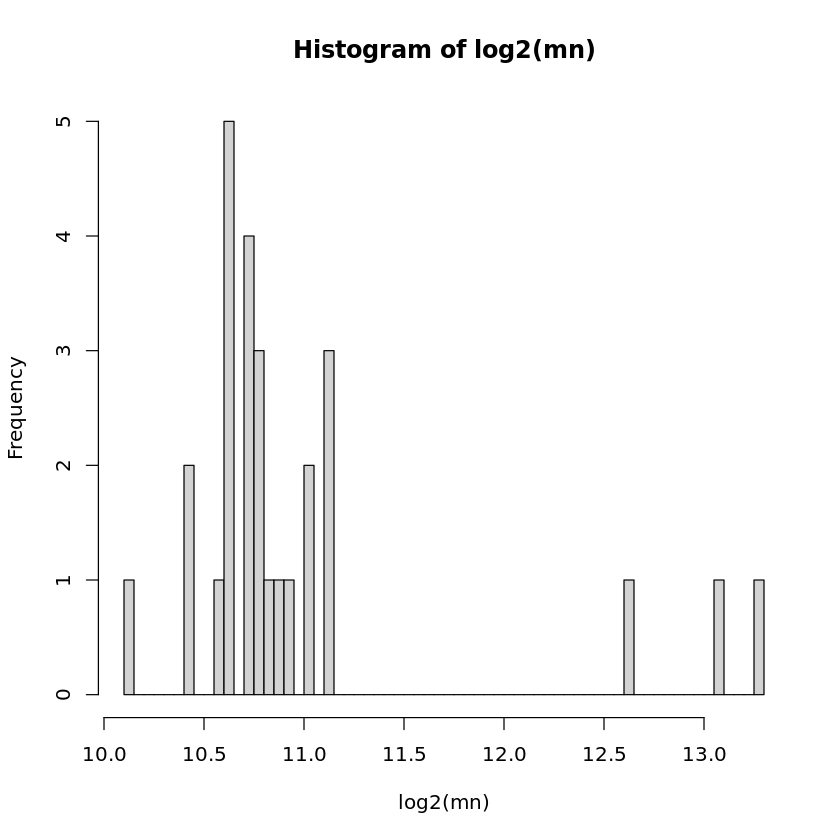

In [4]:
mn <- apply(total_counts_t,1,mean)
hist(log2(mn), breaks = 100)

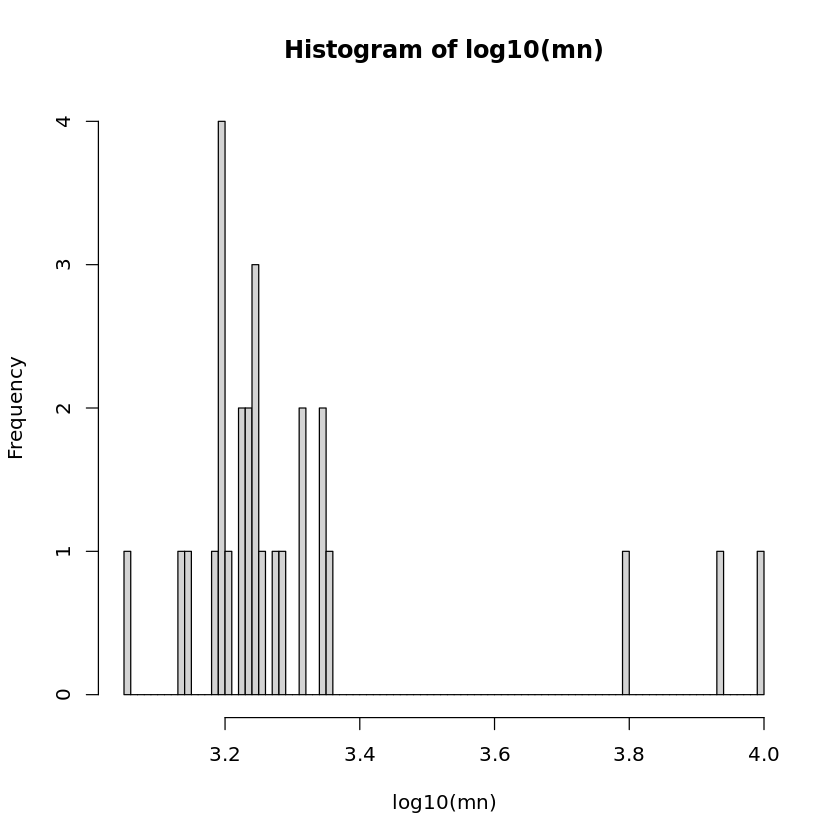

In [5]:
hist(log10(mn), breaks = 100)

Create a DESeq model with genotype and lineage as our variables

In [23]:
dds <- DESeqDataSetFromMatrix(countData = total_counts,
                              colData = sample_info,
                              design = ~lineage + genotype)
str(dds)

Warning message in DESeqDataSet(se, design = design, ignoreRank):
"some variables in design formula are characters, converting to factors"


Formal class 'DESeqDataSet' [package "DESeq2"] with 8 slots
  ..@ design            :Class 'formula'  language ~lineage + genotype
  .. .. ..- attr(*, ".Environment")=<environment: R_GlobalEnv> 
  ..@ dispersionFunction:function ()  
  ..@ rowRanges         :Formal class 'CompressedGRangesList' [package "GenomicRanges"] with 5 slots
  .. .. ..@ unlistData     :Formal class 'GRanges' [package "GenomicRanges"] with 7 slots
  .. .. .. .. ..@ seqnames       :Formal class 'Rle' [package "S4Vectors"] with 4 slots
  .. .. .. .. .. .. ..@ values         : Factor w/ 0 levels: 
  .. .. .. .. .. .. ..@ lengths        : int(0) 
  .. .. .. .. .. .. ..@ elementMetadata: NULL
  .. .. .. .. .. .. ..@ metadata       : list()
  .. .. .. .. ..@ ranges         :Formal class 'IRanges' [package "IRanges"] with 6 slots
  .. .. .. .. .. .. ..@ start          : int(0) 
  .. .. .. .. .. .. ..@ width          : int(0) 
  .. .. .. .. .. .. ..@ NAMES          : NULL
  .. .. .. .. .. .. ..@ elementType    : chr "AN

In [7]:
vsd <- vst(dds, blind = FALSE)
head(assay(vsd), 3)

,MCF10A_E545K_rep1,MCF10A_E545K_rep2,MCF10A_E545K_rep3,MCF10A_parental_rep1,MCF10A_parental_rep2,MCF10A_parental_rep3,MCF7_corrected_rep1,MCF7_corrected_rep2,MCF7_corrected_rep3,MCF7_parental_rep1,⋯,HTert_WT_rep3,HTert_ex9_rep1,HTert_ex9_rep2,HTert_ex9_rep3,HTert_ex20_rep1,HTert_ex20_rep2,HTert_ex20_rep3,T47D_rep1,T47D_rep2,T47D_rep3
ENSG00000223972.5,3.856222,3.946806,3.220686,3.683549,3.220686,3.220686,4.156911,3.999181,4.204145,4.388572,⋯,4.571351,3.220686,3.220686,3.978804,4.000782,5.002878,4.042306,3.986405,4.120797,4.269426
ENSG00000227232.5,6.992697,7.212327,7.074586,7.325298,7.289161,7.236597,7.856191,7.922547,8.194715,8.023409,⋯,7.332548,6.841937,7.199293,7.021494,7.079975,6.887659,7.455555,7.638243,7.343501,7.448028
ENSG00000278267.1,5.436155,5.861719,5.584291,5.548131,5.931789,5.470514,5.686921,5.902890,5.408974,5.434338,⋯,5.334003,5.098617,5.036062,5.111395,5.656323,5.225525,5.734737,5.976506,5.281659,5.246910


Here we create a heatmap that displays the similarities of our samples

                     MCF10A_E545K_rep1 MCF10A_E545K_rep2 MCF10A_E545K_rep3
MCF10A_E545K_rep2             97.98686                                    
MCF10A_E545K_rep3             99.02339         103.60375                  
MCF10A_parental_rep1         125.61829         128.30599         129.53502
MCF10A_parental_rep2         129.95545         132.74683         132.96761
MCF10A_parental_rep3         131.01446         133.62823         134.48301
MCF7_corrected_rep1          330.78637         332.83169         334.94252
MCF7_corrected_rep2          329.32535         331.56938         333.47104
MCF7_corrected_rep3          331.14397         333.20894         335.04541
MCF7_parental_rep1           319.48361         321.25158         323.10012
MCF7_parental_rep2           321.90102         323.75246         325.48966
MCF7_parental_rep3           321.13564         322.96296         324.52436
MCF10A_H1047R_rep1           142.52232         144.44058         142.47846
MCF10A_H1047R_rep2       

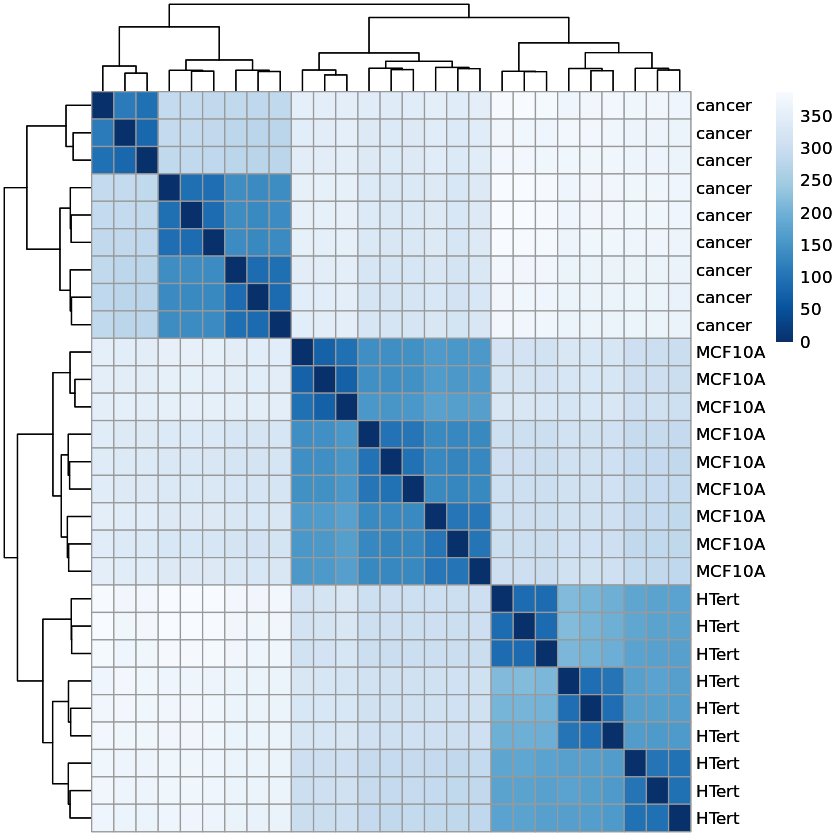

In [8]:
sampleDists <- dist(t(assay(vsd)))
sampleDists
sampleDistMatrix <- as.matrix( sampleDists )
rownames( sampleDistMatrix ) <- vsd$lineage
colnames(sampleDistMatrix) <- NULL
colors <- colorRampPalette( rev(brewer.pal(9, "Blues")) )(255)
p <- pheatmap(sampleDistMatrix,
         clustering_distance_rows = sampleDists,
         clustering_distance_cols = sampleDists,
         col = colors)
p

function (which = dev.cur()) 
{
    if (which == 1) 
        stop("cannot shut down device 1 (the null device)")
    .External(C_devoff, as.integer(which))
    dev.cur()
}
<bytecode: 0x563f21be5fb8>
<environment: namespace:grDevices>

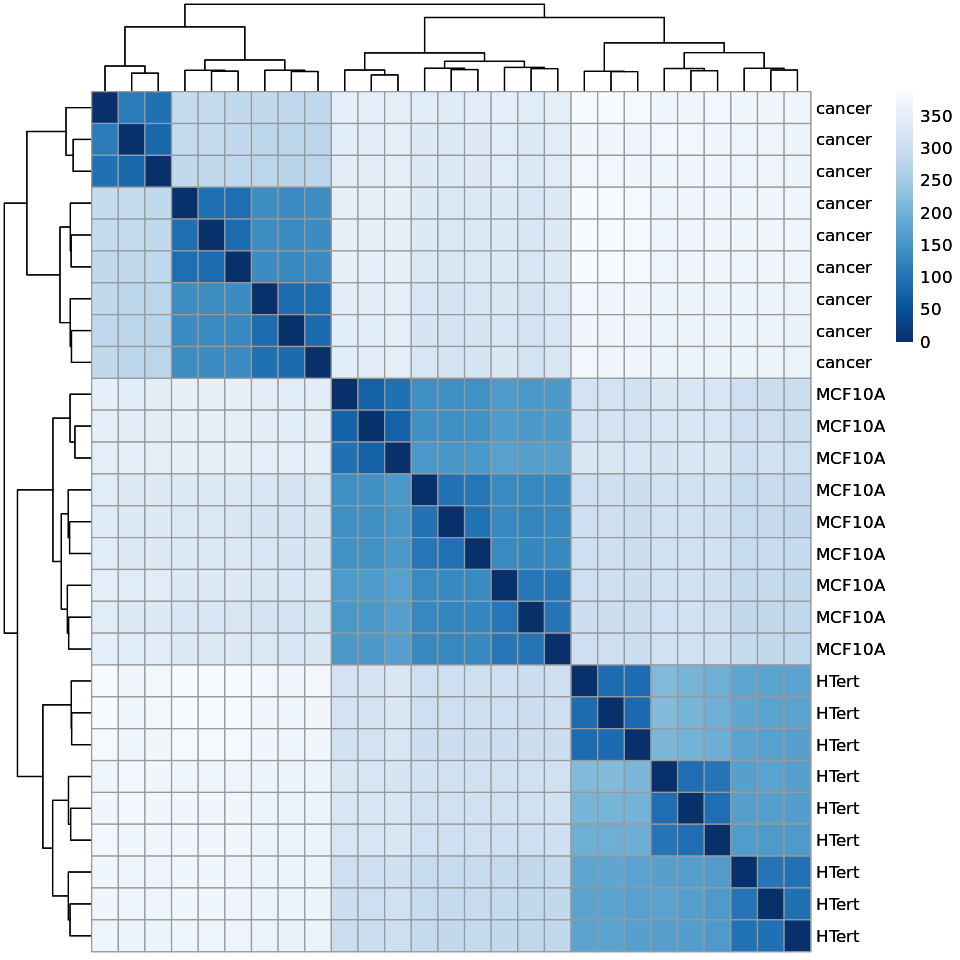

In [9]:
library(repr)
pdf(file = "dist_heatmap.pdf",
   width = 8,
   height = 8)
options(repr.plot.width=8, repr.plot.height=8)
p <- pheatmap(sampleDistMatrix,
         clustering_distance_rows = sampleDists,
         clustering_distance_cols = sampleDists,
         col = colors)
p
dev.off

Our PCA's show differences between our cell lines not defined by genotype, but rather by lineage

In [ ]:
plotPCA(vsd, intgroup = c("genotype"))
plotPCA(vsd, intgroup = c("lineage"))
plotPCA(vsd, intgroup = c("combo"))

In [ ]:
pdf(file="genotype.pca.pdf")
plotPCA(vsd, intgroup = c("genotype"))
dev.off()

pdf(file="lineage.pca.pdf")
plotPCA(vsd, intgroup = c("lineage"))
dev.off()

pdf(file="combo.pca.pdf")
plotPCA(vsd, intgroup = c("combo"))
dev.off()

In [ ]:
pca <- prcomp(total_counts)

In [ ]:
library(pca3d)
gr <- sample_info$lineage
options(rgl.useNULL = TRUE)
pca3d(pca, group=gr)

In [15]:
dds <- DESeq(dds)
res <- results(dds)
res <- res[order(res$padj),]
head(res)

plotMA(dds,ylim=c(-2,2),main="DESeq2")

estimating size factors

estimating dispersions

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates

fitting model and testing



log2 fold change (MLE): genotype WT vs ex20 
Wald test p-value: genotype WT vs ex20 
DataFrame with 6 rows and 6 columns
                    baseMean log2FoldChange     lfcSE      stat      pvalue
                   <numeric>      <numeric> <numeric> <numeric>   <numeric>
ENSG00000118432.12  1354.754        7.58013 0.3583380   21.1536 2.55735e-99
ENSG00000165512.5   1009.493        3.19500 0.1781055   17.9388 5.87025e-72
ENSG00000119514.7    528.949        4.77341 0.2753252   17.3374 2.45770e-67
ENSG00000270372.1     27.477       20.24580 1.2004587   16.8651 8.13320e-64
ENSG00000286231.1    774.374        1.47709 0.0877309   16.8366 1.31587e-63
ENSG00000226937.9    544.048        3.20543 0.2008462   15.9596 2.44133e-57
                          padj
                     <numeric>
ENSG00000118432.12 1.07785e-94
ENSG00000165512.5  1.23707e-67
ENSG00000119514.7  3.45282e-63
ENSG00000270372.1  8.56975e-60
ENSG00000286231.1  1.10920e-59
ENSG00000226937.9  1.71491e-53

ERROR: Error in h(simpleError(msg, call)): error in evaluating the argument 'x' in selecting a method for function 'as.matrix': no method for coercing this S4 class to a vector


## GSVA

In [10]:
myC6 <- getGmt("/data/park_lab/adam/Total_RNA/c6.all.v7.5.1.entrez.gmt")

In [11]:
library('limma')

In [ ]:
dat  <- counts(dds, normalized = TRUE)
idx  <- rowMeans(dat) > 1
dat  <- dat[idx, ]
mod  <- model.matrix(~genotype, colData(dds))
mod0 <- model.matrix(~1, colData(dds))
svseq <- svaseq(dat, mod, mod0)

In [18]:
ddssva <- dds
ddssva$SV1 <- svseq$sv[,1]
ddssva$SV2 <- svseq$sv[,2]
ddssva$SV3 <- svseq$sv[,3]
design(ddssva) <- ~SV1 + SV2 + SV3 + genotype
ddssva <- DESeq(ddssva)

using pre-existing size factors

estimating dispersions

found already estimated dispersions, replacing these

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates

fitting model and testing



In [20]:
vsd_sva <- vst(ddssva, blind = FALSE)
head(assay(vsd_sva), 3)

,MCF10A_E545K_rep1,MCF10A_E545K_rep2,MCF10A_E545K_rep3,MCF10A_parental_rep1,MCF10A_parental_rep2,MCF10A_parental_rep3,MCF7_corrected_rep1,MCF7_corrected_rep2,MCF7_corrected_rep3,MCF7_parental_rep1,⋯,HTert_WT_rep3,HTert_ex9_rep1,HTert_ex9_rep2,HTert_ex9_rep3,HTert_ex20_rep1,HTert_ex20_rep2,HTert_ex20_rep3,T47D_rep1,T47D_rep2,T47D_rep3
ENSG00000223972.5,4.480248,4.550363,3.992213,4.347102,3.992213,3.992213,4.713867,4.591000,4.750816,4.895846,⋯,5.040905,3.992213,3.992213,4.575181,4.592244,5.389411,4.624519,4.581081,4.685668,4.802008
ENSG00000227232.5,7.123113,7.326305,7.198645,7.431558,7.397838,7.348877,7.932118,7.995301,8.255703,8.091575,⋯,7.438329,6.984798,7.314194,7.149643,7.203626,7.026642,7.553497,7.725510,7.448562,7.546435
ENSG00000278267.1,5.748914,6.112005,5.874170,5.843483,6.172743,5.777859,5.961658,6.147660,5.726063,5.747386,⋯,5.663243,5.467987,5.416592,5.478511,5.935514,5.572889,6.002618,6.211643,5.619565,5.590651


In [26]:
sva_rlog <- rlog(ddssva, blind = FALSE)
norm_counts <- counts(ddssva, normalized = TRUE)
cov = svseq$sv[,1:3]
counts_sva <- removeBatchEffect(norm_counts, 
                                covariates = cov)
assay(sva_rlog) <- counts_sva

ERROR: Error in h(simpleError(msg, call)): error in evaluating the argument 'object' in selecting a method for function 'plotPCA': object 'angio_ddssva_rlog' not found


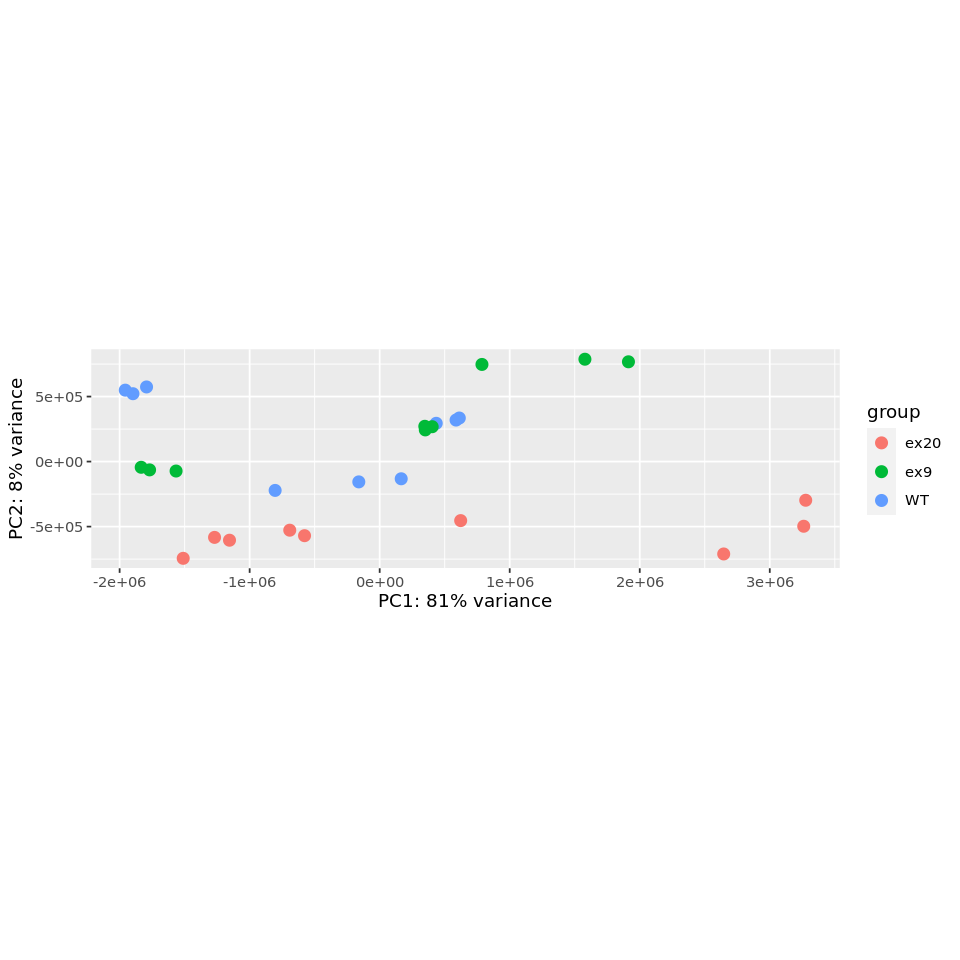

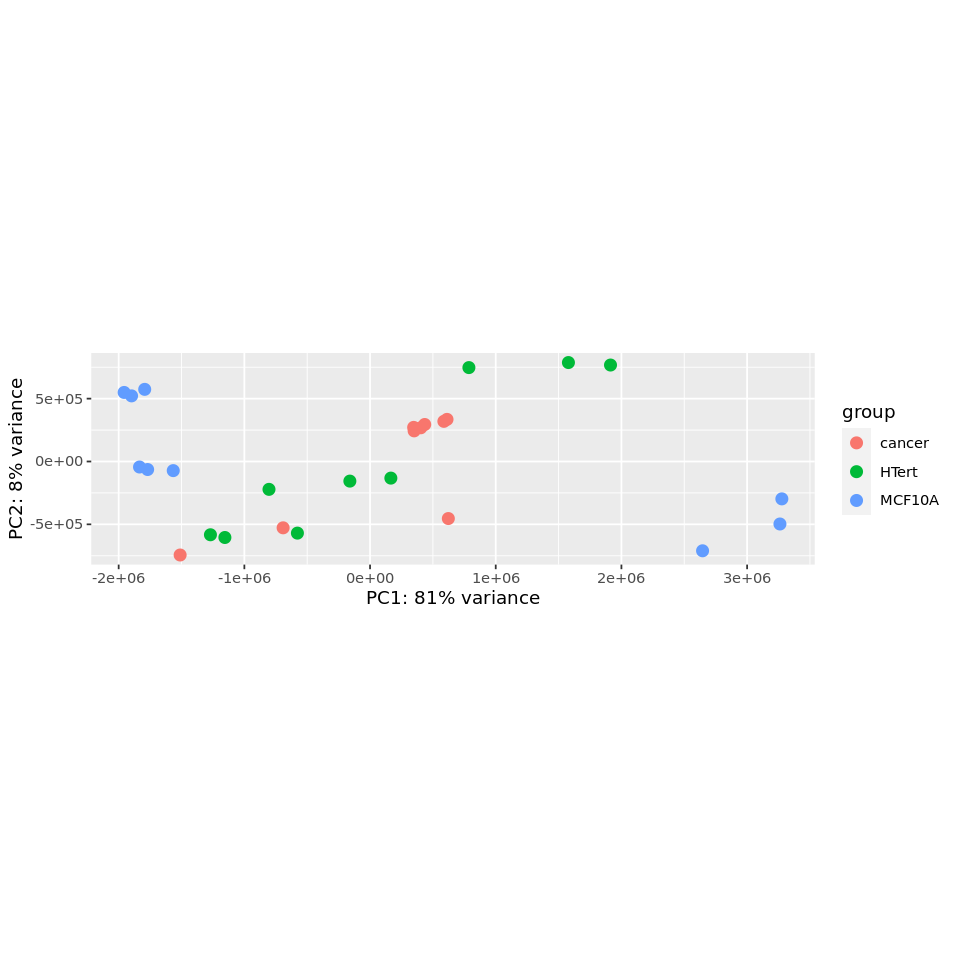

In [30]:
p <- plotPCA(sva_rlog, intgroup = "genotype")
p
p <- plotPCA(sva_rlog, intgroup = "lineage")
p

In [ ]:
plotPCA(vsd_sva, intgroup = c("genotype"))

In [ ]:
resCombo <- results(ddssva,
                    contrast=c("genotype", "ex9", "ex20"))

head(resCombo)
table(resCombo$padj < 0.05)

In [ ]:
cov = cbind(svseq$sv[,1:3])
counts_deseq_sva <- removeBatchEffect(dat, covariates = cov)

In [ ]:
counts_deseq_sva

In [ ]:
cleaningY = function(y, mod, svaobj) {
X=cbind(mod,svaobj$sv)
Hat=solve(t(X)%*%X)%*%t(X)
 beta=(Hat%*%t(y))
P=ncol(mod)
cleany=y-t(as.matrix(X[,-c(1:P)])%*%beta[-c(1:P),])
 return(cleany)
}

In [ ]:
cleany = cleaningY(dat,mod,svseq)

In [ ]:
cleany

In [ ]:
good_names <- rownames(cleany)
good_names <- tools::file_path_sans_ext(c(good_names))
good_names
rownames(cleany) <- good_names
head(cleany)

In [ ]:
genes2 <- mapIds(org.Hs.eg.db,
                     keys=rownames(cleany),
                     column="ENTREZID",
                     keytype="ENSEMBL",
                     multiVals="first")

In [ ]:
rownames(cleany) = genes2

In [ ]:
cleany

In [ ]:
nas=na.omit(rownames(cleany))

In [ ]:
cleany2sss=cleany[-na.action(nas),]

In [ ]:
dups <- which(duplicated(rownames(cleany2)))

In [ ]:
cleany3=cleany2[-dups,]

In [ ]:
cleany3

In [ ]:
colnames(cleany3)

In [ ]:
sub = c(1,2,3,10,11,12,13,14,15,19,20,21,22,23,24,25,26,27)
exampleSet <- ExpressionSet(assayData = cleany3[,sub])
test = gsva(exprs(exampleSet), myC6, method = "ssgsea",
            kcdf = "Poisson", verbose=TRUE,
            parallel.sz=1, ssgsea.norm = F)

In [ ]:
myvars <- apply(test,1, var,na.rm=TRUE) 
myvars <- sort(myvars,decreasing=TRUE) 
length(myvars)

In [ ]:
expression <- test[names(myvars),] 
dim(expression)

In [ ]:
clinsub=sample_info[sub,]
clinsub

In [ ]:
lp = as.factor(clinsub[,3])
secondp = as.factor(clinsub[,2])

In [4]:
expression

,MCF10A_E545K_rep1,MCF10A_E545K_rep2,MCF10A_E545K_rep3,MCF7_parental_rep1,MCF7_parental_rep2,MCF7_parental_rep3,MCF10A_H1047R_rep1,MCF10A_H1047R_rep2,MCF10A_H1047R_rep3,HTert_ex9_rep1,HTert_ex9_rep2,HTert_ex9_rep3,HTert_ex20_rep1,HTert_ex20_rep2,HTert_ex20_rep3,T47D_rep1,T47D_rep2,T47D_rep3
HINATA_NFKB_IMMU_INF,3419.7528,3426.7727,3384.3823,2408.2791,2474.7299,2361.7951,3077.5009,3541.68042,3781.160359,2273.6586,2356.6989,2220.1785,3905.4804,4179.7335,3664.4134,3881.2680,3846.3248,3771.7357
SINGH_KRAS_DEPENDENCY_SIGNATURE,4251.9420,4089.8600,4005.9765,4409.0111,4454.1393,4391.5868,3393.8920,3236.35502,2848.024781,4004.1134,4095.2126,3989.8552,4827.8377,4756.3388,5031.7845,5003.0843,4873.8398,4977.0817
HINATA_NFKB_MATRIX,7486.7411,7487.6161,7488.9233,7144.0115,7368.1547,7366.3899,6260.4572,6164.52224,6017.192131,6867.2689,7272.5129,7145.4006,7911.2465,7923.7077,7749.0079,7474.9000,7753.0668,7768.6339
KRAS.50_UP.V1_DN,-2990.1610,-2972.4779,-2963.8698,-2352.6996,-2307.3794,-2322.4387,-1322.0237,-1318.41407,-1562.185347,-1683.1466,-1606.8973,-1645.6006,-2371.1059,-2401.3244,-2288.3422,-2249.2916,-2085.8637,-2098.0823
KRAS.LUNG_UP.V1_DN,-1189.9468,-1223.7114,-1255.5788,-724.5967,-660.3229,-664.7250,161.6056,322.35766,279.810116,-624.7184,-604.6214,-687.9366,-663.9501,-755.6941,-654.8633,-367.5793,-400.2107,-395.0658
RB_P107_DN.V1_UP,4542.0555,4613.0112,4626.8246,4827.0947,4810.9065,4795.4656,4608.6506,4543.58421,4495.329978,5177.6530,4983.5432,5059.1861,4106.1870,4234.0969,3903.9340,3720.9295,4110.8984,3950.1115
CAHOY_ASTROGLIAL,2751.5165,2742.3479,2686.8462,2963.3415,2952.9260,2956.0742,2817.7601,2971.67633,3071.120489,3136.8813,3233.7209,3100.0052,2110.6271,2085.0153,2216.2665,2436.8615,2121.3170,2270.0800
KRAS.50_UP.V1_UP,-1530.2114,-1460.1070,-1478.9307,-2298.6216,-2353.2180,-2334.9206,-1657.6736,-1727.44688,-1759.126608,-1648.6187,-1929.1219,-1738.0780,-1180.0027,-1152.8983,-1194.4641,-1565.2824,-1345.5178,-1378.7164
BCAT.100_UP.V1_UP,1709.2563,1784.4552,1674.9253,1485.9523,1497.4166,1461.4075,1587.1248,1632.09369,1613.740755,1048.7184,826.3734,889.1803,1925.2155,2046.4764,1816.6175,1688.9831,2004.9560,1894.3584
KRAS.PROSTATE_UP.V1_DN,-2300.7959,-2283.8603,-2253.2527,-1903.9144,-1864.9716,-1885.8814,-1176.2401,-1155.86218,-1223.310650,-1620.6612,-1584.9339,-1621.9961,-1652.4713,-1674.4716,-1680.6283,-1547.8829,-1540.6985,-1556.5205


In [ ]:
bp=brewer.pal(10,"Spectral")
lp = as.factor(clinsub[,3])
secondp = as.factor(clinsub[,2])
#grid.newpage()
pdf("~/E545KvH1047R.ssgsea.pdf")
my_palette <- colorRampPalette(c("purple", "white", "green"))(n = 1000)
heatmap.2(expression,
          trace = "none",
          col = my_palette,
          margins = c(5,25),
          labCol = "",
          cexRow = .7, ColSideColors = bp[lp]
          key = TRUE, scale = "row")
legend("topright",legend = unique(lp), fill = bp[unique(lp)])
dev.off()

In [ ]:
geneSetClustering <- hclust(as.dist(1-cor(t(expression), method="kendall")),
                            method="complete")
heatmap.2(expression,
          trace = "none",
          col = my_palette,
          margins = c(5,25),
          labCol = "",
          cexRow = .7, ColSideColors = bp[lp],
          key = TRUE, scale = "row",
          Rowv=as.dendrogram(geneSetClustering))
legend("topright",legend = unique(lp), fill = bp[unique(lp)])

In [ ]:
pdf("~/E545KvH1047R_clusteredy.ssgsea.pdf")
my_palette <- colorRampPalette(c("purple", "white", "green"))(n = 1000)
heatmap.2(expression,
          trace = "none",
          col = my_palette,
          margins = c(5,25),
          labCol = "",
          cexRow = .7, ColSideColors = bp[lp],
          key = TRUE, scale = "row",
         Rowv=as.dendrogram(geneSetClustering))
legend("topright",legend = unique(lp), fill = bp[unique(lp)])
dev.off()

In [ ]:
heatmap.2(expression,
          trace = "none",
          col = my_palette,
          margins = c(5,25),
          labCol = "",
          cexRow = .7, ColSideColors = bp[lp],
          key = TRUE, scale = "row",
         )
legend("topright",legend = unique(lp), fill = bp[unique(lp)])

In [ ]:
CRISPR_guides <- read_tsv(file = "MCF10A_guides.txt")
CRISPR_guides

In [ ]:
Gene_targets <- CRISPR_guides %>%
                dplyr::select(Target.Gene.Symbol) %>%
                unique() %>%
                pull(Target.Gene.Symbol) %>%
                sort()
Gene_targets

In [ ]:
test_df <- as.data.frame(test) %>%
            tibble::rownames_to_column("PATHWAY")
number_col <- seq(1, 189, by=1)
test_df$Number_ID <- number_col
test_df

In [ ]:
TGFB_UP <- test_df %>% 
            dplyr::filter(PATHWAY == "TGFB_UP.V1_UP")
TGFB_DN <- test_df %>% 
            dplyr::filter(PATHWAY == "TGFB_UP.V1_DN")
TGFB_UP
TGFB_DN

In [ ]:
TGFB_UP_genes <- myC6[[167]]@geneIds
TGFB_DN_genes <- myC6[[67]]@geneIds
str(TGFB_UP_genes)
str(TGFB_DN_genes)

In [ ]:
TGFB_DN_guides <- CRISPR_guides %>% 
        filter(Target.Gene.ID %in% TGFB_DN_genes)
TGFB_DN_guides
TGFB_DN_targets <- TGFB_DN_guides %>% 
                pull(Target.Gene.Symbol) %>%
                unique() %>%
                sort()
TGFB_DN_targets
TGFB_UP_guides <- CRISPR_guides %>% 
        filter(Target.Gene.ID %in% TGFB_UP_genes)
TGFB_UP_guides
TGFB_UP_targets <- TGFB_UP_guides %>% 
                pull(Target.Gene.Symbol) %>%
                unique() %>%
                sort()
TGFB_UP_targets

### Heatmap Cleanup

In [51]:
expression

function (...)  .Primitive("expression")

In [ ]:
colMeta_df <- data.frame(Genotype = c(rep("E545K", 6), rep("H1047R", 3), rep("E545K", 3), rep("H1047R", 6)), 
                      Lineage = c(rep("MCF10A", 3), rep("MCF7", 3), rep("MCF10A", 3),
                                 rep("HTert-IMEC", 6), rep("T47D", 3)),
                      stringsAsFactors = F, 
                      row.names = colnames(expression))
colMeta_df

In [ ]:
p <- pheatmap(expression,
              clustering_distance_cols = "euclidean", 
              clustering_distance_rows = "euclidean", 
              annotation_col = colMeta_df,
              fontsize_number = 2, 
              scale = "row", 
              cutree_cols = 2,
              show_colnames = FALSE
             )
p

In [ ]:
add.flag <- function(pheatmap,
                     kept.labels,
                     repel.degree) {

  # repel.degree = number within [0, 1], which controls how much 
  #                space to allocate for repelling labels.
  ## repel.degree = 0: spread out labels over existing range of kept labels
  ## repel.degree = 1: spread out labels over the full y-axis

  heatmap <- pheatmap$gtable

  new.label <- heatmap$grobs[[which(heatmap$layout$name == "row_names")]] 

  # keep only labels in kept.labels, replace the rest with ""
  new.label$label <- ifelse(new.label$label %in% kept.labels, 
                            new.label$label, "")

  # calculate evenly spaced out y-axis positions
  repelled.y <- function(d, d.select, k = repel.degree){
    # d = vector of distances for labels
    # d.select = vector of T/F for which labels are significant

    # recursive function to get current label positions
    # (note the unit is "npc" for all components of each distance)
    strip.npc <- function(dd){
      if(!"unit.arithmetic" %in% class(dd)) {
        return(as.numeric(dd))
      }

      d1 <- strip.npc(dd$arg1)
      d2 <- strip.npc(dd$arg2)
      fn <- dd$fname
      return(lazyeval::lazy_eval(paste(d1, fn, d2)))
    }

    full.range <- sapply(seq_along(d), function(i) strip.npc(d[i]))
    selected.range <- sapply(seq_along(d[d.select]), function(i) strip.npc(d[d.select][i]))

    return(unit(seq(from = max(selected.range) + k*(max(full.range) - max(selected.range)),
                    to = min(selected.range) - k*(min(selected.range) - min(full.range)), 
                    length.out = sum(d.select)), 
                "npc"))
  }
  new.y.positions <- repelled.y(new.label$y,
                                d.select = new.label$label != "")
  new.flag <- segmentsGrob(x0 = new.label$x,
                           x1 = new.label$x + unit(0.15, "npc"),
                           y0 = new.label$y[new.label$label != ""],
                           y1 = new.y.positions)

  # shift position for selected labels
  new.label$x <- new.label$x + unit(0.2, "npc")
  new.label$y[new.label$label != ""] <- new.y.positions

  # add flag to heatmap
  heatmap <- gtable::gtable_add_grob(x = heatmap,
                                   grobs = new.flag,
                                   t = 4, 
                                   l = 4
  )

  # replace label positions in heatmap
  heatmap$grobs[[which(heatmap$layout$name == "row_names")]] <- new.label

  # plot result
  grid.newpage()
  grid.draw(heatmap)

  # return a copy of the heatmap invisibly
  invisible(heatmap)
}

In [ ]:
sort(rownames(expression))

In [ ]:
sets_of_int <- c("AKT_UP_MTOR_DN.V1_DN", "AKT_UP_MTOR_DN.V1_UP",
                "AKT_UP.V1_DN", "AKT_UP.V1_UP", 
                "ATF2_S_UP.V1_UP", "ATF2_UP.V1_DN", "ATF2_UP.V1_UP", 
                "JNK_DN.V1_DN", "JNK_DN.V1_UP", 
                "PTEN_DN.V1_DN", "PTEN_DN.V1_UP", "PTEN_DN.V2_DN", "PTEN_DN.V2_UP", 
                "MTOR_UP.V1_DN", "MTOR_UP.V1_UP", 
                "MYC_UP.V1_DN", "MYC_UP.V1_UP", 
                "TGFB_UP.V1_DN", "TGFB_UP.V1_UP")

In [ ]:
p_improved <- add.flag(p, sets_of_int, 0)
p_improved

In [ ]:
ggsave(filename = "GSVA_heatmap_clean.pdf", plot = p_improved)

### T-SNE?

#### By sample

In [2]:
expression_t <- t(expression)
expression_t

,HINATA_NFKB_IMMU_INF,SINGH_KRAS_DEPENDENCY_SIGNATURE,HINATA_NFKB_MATRIX,KRAS.50_UP.V1_DN,KRAS.LUNG_UP.V1_DN,RB_P107_DN.V1_UP,CAHOY_ASTROGLIAL,KRAS.50_UP.V1_UP,BCAT.100_UP.V1_UP,KRAS.PROSTATE_UP.V1_DN,⋯,YAP1_UP,GCNP_SHH_UP_LATE.V1_DN,CAMP_UP.V1_DN,CAMP_UP.V1_UP,NRL_DN.V1_DN,MTOR_UP.V1_DN,BRCA1_DN.V1_DN,PDGF_ERK_DN.V1_UP,CYCLIN_D1_UP.V1_DN,DCA_UP.V1_DN
MCF10A_E545K_rep1,3419.753,4251.942,7486.741,-2990.161,-1189.9468,4542.055,2751.516,-1530.211,1709.2563,-2300.796,⋯,5341.915,3003.620,5526.338,6419.271,2926.631,2088.553,439.2089,3384.482,3543.513,2527.001
MCF10A_E545K_rep2,3426.773,4089.860,7487.616,-2972.478,-1223.7114,4613.011,2742.348,-1460.107,1784.4552,-2283.860,⋯,5326.382,3027.860,5531.512,6426.171,2906.649,2023.718,415.1742,3368.981,3551.627,2517.666
MCF10A_E545K_rep3,3384.382,4005.976,7488.923,-2963.870,-1255.5788,4626.825,2686.846,-1478.931,1674.9253,-2253.253,⋯,5323.203,3030.327,5514.343,6415.273,2934.528,2048.958,375.4365,3390.459,3560.956,2561.620
MCF7_parental_rep1,2408.279,4409.011,7144.011,-2352.700,-724.5967,4827.095,2963.341,-2298.622,1485.9523,-1903.914,⋯,5329.553,2992.913,5470.064,6402.947,2829.458,2125.992,330.4720,3381.125,3552.347,2516.945
MCF7_parental_rep2,2474.730,4454.139,7368.155,-2307.379,-660.3229,4810.906,2952.926,-2353.218,1497.4166,-1864.972,⋯,5322.505,3019.202,5468.906,6411.665,2850.411,2110.512,310.6974,3419.537,3552.381,2519.096
MCF7_parental_rep3,2361.795,4391.587,7366.390,-2322.439,-664.7250,4795.466,2956.074,-2334.921,1461.4075,-1885.881,⋯,5343.419,2998.217,5486.076,6399.753,2834.976,2126.819,339.8845,3424.059,3573.792,2520.342
MCF10A_H1047R_rep1,3077.501,3393.892,6260.457,-1322.024,161.6056,4608.651,2817.760,-1657.674,1587.1248,-1176.240,⋯,5350.957,2956.065,5483.911,6427.460,2802.892,2106.324,351.1693,3386.763,3663.372,2544.766
MCF10A_H1047R_rep2,3541.680,3236.355,6164.522,-1318.414,322.3577,4543.584,2971.676,-1727.447,1632.0937,-1155.862,⋯,5399.246,2979.537,5464.969,6424.240,2839.495,2162.050,360.9963,3434.801,3633.976,2566.708
MCF10A_H1047R_rep3,3781.160,2848.025,6017.192,-1562.185,279.8101,4495.330,3071.120,-1759.127,1613.7408,-1223.311,⋯,5396.645,2946.587,5424.207,6421.855,2874.429,2196.468,335.5565,3417.981,3581.490,2546.380
HTert_ex9_rep1,2273.659,4004.113,6867.269,-1683.147,-624.7184,5177.653,3136.881,-1648.619,1048.7184,-1620.661,⋯,5193.806,3129.705,5478.691,6476.153,2807.279,2102.792,413.7885,3383.117,3530.885,2521.156


In [3]:
meta_data <- as.data.frame(cbind(rownames(expression_t), 
                                 c(rep("MCF10A", 3), rep("MCF7", 3),
                                                        rep("MCF10A", 3), rep("H-Tert IMEC", 6),
                                                        rep("T47D", 3)), 
                                 c(rep("E545K", 6), rep("H1047R", 3), 
                                  rep("E545K", 3), rep("H1047R", 6))))
meta_data

V1,V2,V3
<chr>,<chr>,<chr>
MCF10A_E545K_rep1,MCF10A,E545K
MCF10A_E545K_rep2,MCF10A,E545K
MCF10A_E545K_rep3,MCF10A,E545K
MCF7_parental_rep1,MCF7,E545K
MCF7_parental_rep2,MCF7,E545K
MCF7_parental_rep3,MCF7,E545K
MCF10A_H1047R_rep1,MCF10A,H1047R
MCF10A_H1047R_rep2,MCF10A,H1047R
MCF10A_H1047R_rep3,MCF10A,H1047R


In [4]:
tsneby_sample <- tsne(expression_t)

Warning message in if (class(X) == "dist") {:
"the condition has length > 1 and only the first element will be used"
sigma summary: Min. : 33554432 |1st Qu. : 33554432 |Median : 33554432 |Mean : 33554432 |3rd Qu. : 33554432 |Max. : 33554432 |

Epoch: Iteration #100 error is: 12.4198276505559

Epoch: Iteration #200 error is: 0.614270754336277

Epoch: Iteration #300 error is: 0.409019679671326

Epoch: Iteration #400 error is: 0.393564624705009

Epoch: Iteration #500 error is: 0.392613472110647

Epoch: Iteration #600 error is: 0.391667256518258

Epoch: Iteration #700 error is: 0.387811037609023

Epoch: Iteration #800 error is: 0.385577578559689

Epoch: Iteration #900 error is: 0.383452296035

Epoch: Iteration #1000 error is: 0.381590119069146



In [5]:
tsneby_sample

-677.485800,-542.876490
-330.496295,319.556911
-141.238913,-432.057812
-927.035939,-75.158141
90.301160,457.764444
423.143785,144.514531
547.165351,660.706949
898.650998,293.104562
-398.116486,794.255181
796.145676,-191.510264
-5.304612,4.517553


In [6]:
tsneby_sample_df <- cbind(tsneby_sample, meta_data)
names(tsneby_sample_df) <- c("tSNE1", "tSNE2", "sample", "Lineage", "Genotype")
tsneby_sample_df

tSNE1,tSNE2,sample,Lineage,Genotype
<dbl>,<dbl>,<chr>,<chr>,<chr>
-677.485800,-542.876490,MCF10A_E545K_rep1,MCF10A,E545K
-330.496295,319.556911,MCF10A_E545K_rep2,MCF10A,E545K
-141.238913,-432.057812,MCF10A_E545K_rep3,MCF10A,E545K
-927.035939,-75.158141,MCF7_parental_rep1,MCF7,E545K
90.301160,457.764444,MCF7_parental_rep2,MCF7,E545K
423.143785,144.514531,MCF7_parental_rep3,MCF7,E545K
547.165351,660.706949,MCF10A_H1047R_rep1,MCF10A,H1047R
898.650998,293.104562,MCF10A_H1047R_rep2,MCF10A,H1047R
-398.116486,794.255181,MCF10A_H1047R_rep3,MCF10A,H1047R


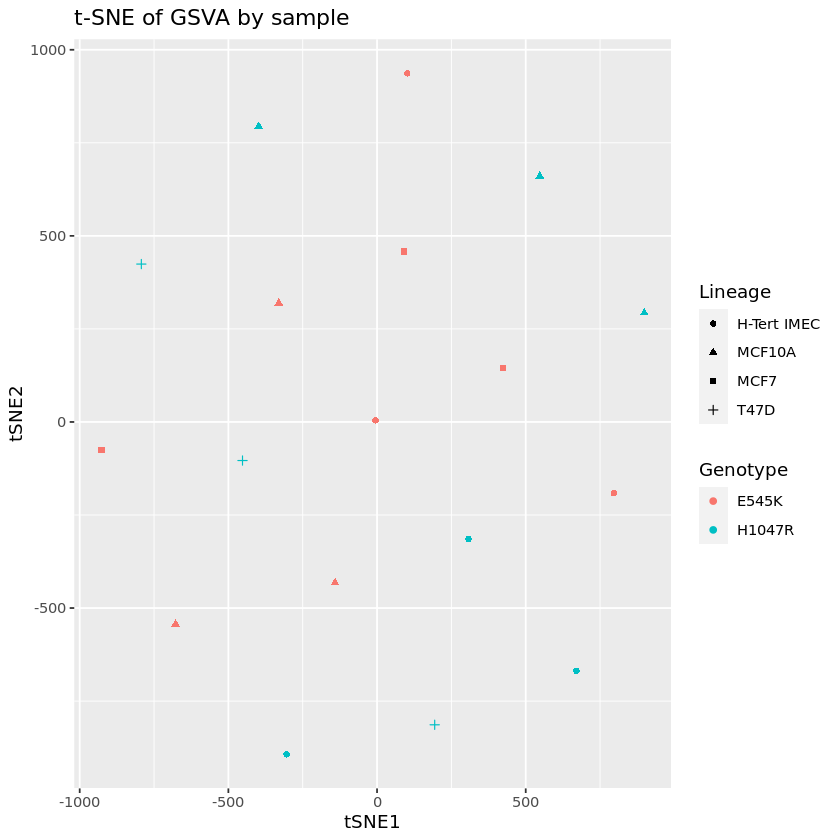

In [7]:
tSNE_plot <- tsneby_sample_df %>%
             ggplot(aes(x = tSNE1, 
             y = tSNE2,
             color = Genotype,
             shape = Lineage))+
             geom_point()+
             theme(legend.position="right")+ 
             ggtitle("t-SNE of GSVA by sample")
tSNE_plot

#### By GSVA Pathways

In [8]:
expression

,MCF10A_E545K_rep1,MCF10A_E545K_rep2,MCF10A_E545K_rep3,MCF7_parental_rep1,MCF7_parental_rep2,MCF7_parental_rep3,MCF10A_H1047R_rep1,MCF10A_H1047R_rep2,MCF10A_H1047R_rep3,HTert_ex9_rep1,HTert_ex9_rep2,HTert_ex9_rep3,HTert_ex20_rep1,HTert_ex20_rep2,HTert_ex20_rep3,T47D_rep1,T47D_rep2,T47D_rep3
HINATA_NFKB_IMMU_INF,3419.7528,3426.7727,3384.3823,2408.2791,2474.7299,2361.7951,3077.5009,3541.68042,3781.160359,2273.6586,2356.6989,2220.1785,3905.4804,4179.7335,3664.4134,3881.2680,3846.3248,3771.7357
SINGH_KRAS_DEPENDENCY_SIGNATURE,4251.9420,4089.8600,4005.9765,4409.0111,4454.1393,4391.5868,3393.8920,3236.35502,2848.024781,4004.1134,4095.2126,3989.8552,4827.8377,4756.3388,5031.7845,5003.0843,4873.8398,4977.0817
HINATA_NFKB_MATRIX,7486.7411,7487.6161,7488.9233,7144.0115,7368.1547,7366.3899,6260.4572,6164.52224,6017.192131,6867.2689,7272.5129,7145.4006,7911.2465,7923.7077,7749.0079,7474.9000,7753.0668,7768.6339
KRAS.50_UP.V1_DN,-2990.1610,-2972.4779,-2963.8698,-2352.6996,-2307.3794,-2322.4387,-1322.0237,-1318.41407,-1562.185347,-1683.1466,-1606.8973,-1645.6006,-2371.1059,-2401.3244,-2288.3422,-2249.2916,-2085.8637,-2098.0823
KRAS.LUNG_UP.V1_DN,-1189.9468,-1223.7114,-1255.5788,-724.5967,-660.3229,-664.7250,161.6056,322.35766,279.810116,-624.7184,-604.6214,-687.9366,-663.9501,-755.6941,-654.8633,-367.5793,-400.2107,-395.0658
RB_P107_DN.V1_UP,4542.0555,4613.0112,4626.8246,4827.0947,4810.9065,4795.4656,4608.6506,4543.58421,4495.329978,5177.6530,4983.5432,5059.1861,4106.1870,4234.0969,3903.9340,3720.9295,4110.8984,3950.1115
CAHOY_ASTROGLIAL,2751.5165,2742.3479,2686.8462,2963.3415,2952.9260,2956.0742,2817.7601,2971.67633,3071.120489,3136.8813,3233.7209,3100.0052,2110.6271,2085.0153,2216.2665,2436.8615,2121.3170,2270.0800
KRAS.50_UP.V1_UP,-1530.2114,-1460.1070,-1478.9307,-2298.6216,-2353.2180,-2334.9206,-1657.6736,-1727.44688,-1759.126608,-1648.6187,-1929.1219,-1738.0780,-1180.0027,-1152.8983,-1194.4641,-1565.2824,-1345.5178,-1378.7164
BCAT.100_UP.V1_UP,1709.2563,1784.4552,1674.9253,1485.9523,1497.4166,1461.4075,1587.1248,1632.09369,1613.740755,1048.7184,826.3734,889.1803,1925.2155,2046.4764,1816.6175,1688.9831,2004.9560,1894.3584
KRAS.PROSTATE_UP.V1_DN,-2300.7959,-2283.8603,-2253.2527,-1903.9144,-1864.9716,-1885.8814,-1176.2401,-1155.86218,-1223.310650,-1620.6612,-1584.9339,-1621.9961,-1652.4713,-1674.4716,-1680.6283,-1547.8829,-1540.6985,-1556.5205


In [9]:
path_names <- rownames(expression)
path_names

[1] "HINATA_NFKB_IMMU_INF"               "SINGH_KRAS_DEPENDENCY_SIGNATURE"   
  [3] "HINATA_NFKB_MATRIX"                 "KRAS.50_UP.V1_DN"                  
  [5] "KRAS.LUNG_UP.V1_DN"                 "RB_P107_DN.V1_UP"                  
  [7] "CAHOY_ASTROGLIAL"                   "KRAS.50_UP.V1_UP"                  
  [9] "BCAT.100_UP.V1_UP"                  "KRAS.PROSTATE_UP.V1_DN"            
 [11] "GLI1_UP.V1_DN"                      "BCAT.100_UP.V1_DN"                 
 [13] "KRAS.LUNG.BREAST_UP.V1_UP"          "CORDENONSI_YAP_CONSERVED_SIGNATURE"
 [15] "EGFR_UP.V1_UP"                      "MEL18_DN.V1_UP"                    
 [17] "RPS14_DN.V1_DN"                     "MTOR_UP.V1_UP"                     
 [19] "BMI1_DN_MEL18_DN.V1_UP"             "KRAS.LUNG.BREAST_UP.V1_DN"         
 [21] "KRAS.600_UP.V1_DN"                  "BCAT_GDS748_DN"                    
 [23] "KRAS.600.LUNG.BREAST_UP.V1_UP"      "MEK_UP.V1_UP"                      
 [25] "KRAS.600.LUNG.BREAST_UP.V1_DN"      "HOXA9_DN.V1_DN"                    
 [27] "LTE2_UP.V1_DN"                      "PRC2_EZH2_UP.V1_DN"                
 [29] "LTE2_UP.V1_UP"                      "ERBB2_UP.V1_DN"                    
 [31] "KRAS.300_UP.V1_DN"                  "KRAS.KIDNEY_UP.V1_UP"              
 [33] "BCAT_BILD_ET_AL_DN"                 "CSR_LATE_UP.V1_UP"                 
 [35] "EGFR_UP.V1_DN"                      "GLI1_UP.V1_UP"                     
 [37] "EIF4E_UP"                           "KRAS.LUNG_UP.V1_UP"                
 [39] "BCAT_GDS748_UP"                     "MYC_UP.V1_UP"                      
 [41] "E2F3_UP.V1_UP"                      "BMI1_DN.V1_UP"                     
 [43] "YAP1_DN"                            "ERBB2_UP.V1_UP"                    
 [45] "ATF2_UP.V1_DN"                      "KRAS.BREAST_UP.V1_DN"              
 [47] "RB_DN.V1_UP"                        "RB_DN.V1_DN"                       
 [49] "ALK_DN.V1_DN"                       "RELA_DN.V1_DN"                     
 [51] "KRAS.600_UP.V1_UP"                  "PRC2_SUZ12_UP.V1_UP"               
 [53] "STK33_NOMO_UP"                      "RB_P130_DN.V1_UP"                  
 [55] "RPS14_DN.V1_UP"                     "STK33_UP"                          
 [57] "MEL18_DN.V1_DN"                     "CSR_EARLY_UP.V1_DN"                
 [59] "ESC_V6.5_UP_EARLY.V1_UP"            "IL15_UP.V1_DN"                     
 [61] "MTOR_UP.N4.V1_UP"                   "E2F1_UP.V1_UP"                     
 [63] "PRC2_EZH2_UP.V1_UP"                 "CSR_LATE_UP.V1_DN"                 
 [65] "ALK_DN.V1_UP"                       "P53_DN.V2_UP"                      
 [67] "MYC_UP.V1_DN"                       "SNF5_DN.V1_UP"                     
 [69] "NFE2L2.V2"                          "RAF_UP.V1_DN"                      
 [71] "MEK_UP.V1_DN"                       "GCNP_SHH_UP_EARLY.V1_DN"           
 [73] "P53_DN.V1_UP"                       "LEF1_UP.V1_UP"                     
 [75] "CTIP_DN.V1_DN"                      "JAK2_DN.V1_DN"                     
 [77] "TGFB_UP.V1_UP"                      "E2F1_UP.V1_DN"                     
 [79] "ESC_J1_UP_EARLY.V1_UP"              "BMI1_DN_MEL18_DN.V1_DN"            
 [81] "KRAS.KIDNEY_UP.V1_DN"               "RELA_DN.V1_UP"                     
 [83] "CYCLIN_D1_KE_.V1_DN"                "KRAS.AMP.LUNG_UP.V1_DN"            
 [85] "CSR_EARLY_UP.V1_UP"                 "PTEN_DN.V1_UP"                     
 [87] "WNT_UP.V1_UP"                       "KRAS.300_UP.V1_UP"                 
 [89] "BRCA1_DN.V1_UP"                     "SRC_UP.V1_UP"                      
 [91] "LEF1_UP.V1_DN"                      "IL2_UP.V1_UP"                      
 [93] "RAF_UP.V1_UP"                       "STK33_DN"                          
 [95] "JNK_DN.V1_UP"                       "ATF2_S_UP.V1_DN"                   
 [97] "CAHOY_NEURONAL"                     "AKT_UP_MTOR_DN.V1_DN"              
 [99] "PRC1_BMI_UP.V1_DN"                  "BMI1_DN.V1_DN"                     
[1

In [10]:
tsneby_path <- tsne(expression)
tsneby_path

Warning message in if (class(X) == "dist") {:
"the condition has length > 1 and only the first element will be used"
sigma summary: Min. : 0.476158976449764 |1st Qu. : 0.574670350296088 |Median : 0.602788608171152 |Mean : 0.616485466805766 |3rd Qu. : 0.642617976428166 |Max. : 0.859993009698267 |

Epoch: Iteration #100 error is: 16.3645579729118

Epoch: Iteration #200 error is: 1.05133241897258

Epoch: Iteration #300 error is: 1.00127785300626

Epoch: Iteration #400 error is: 0.997729194173366

Epoch: Iteration #500 error is: 0.997388856898809

Epoch: Iteration #600 error is: 0.997388851432677

Epoch: Iteration #700 error is: 0.9973888514318

Epoch: Iteration #800 error is: 0.9973888514318

Epoch: Iteration #900 error is: 0.9973888514318

Epoch: Iteration #1000 error is: 0.9973888514318



6.8360142,3.48165236
-5.0831691,9.35616613
-3.6350343,0.06133913
9.4869598,8.61194110
10.6664957,8.04583095
8.0999929,-8.49246659
1.0958488,-12.31547145
4.6950751,-13.07629695
1.2334645,6.51097641
10.2097613,8.20394369
-7.8672738,0.55866493


In [34]:
path_names
Path_group <- gsub(x = path_names, pattern = "_*", replacement = "") %>%
            gsub(pattern = "\\..*", replacement = "") %>%
            gsub(pattern = "UP", replacement = "") %>% 
            gsub(pattern = "DN", replacement = "")
Path_group

[1] "HINATA_NFKB_IMMU_INF"               "SINGH_KRAS_DEPENDENCY_SIGNATURE"   
  [3] "HINATA_NFKB_MATRIX"                 "KRAS.50_UP.V1_DN"                  
  [5] "KRAS.LUNG_UP.V1_DN"                 "RB_P107_DN.V1_UP"                  
  [7] "CAHOY_ASTROGLIAL"                   "KRAS.50_UP.V1_UP"                  
  [9] "BCAT.100_UP.V1_UP"                  "KRAS.PROSTATE_UP.V1_DN"            
 [11] "GLI1_UP.V1_DN"                      "BCAT.100_UP.V1_DN"                 
 [13] "KRAS.LUNG.BREAST_UP.V1_UP"          "CORDENONSI_YAP_CONSERVED_SIGNATURE"
 [15] "EGFR_UP.V1_UP"                      "MEL18_DN.V1_UP"                    
 [17] "RPS14_DN.V1_DN"                     "MTOR_UP.V1_UP"                     
 [19] "BMI1_DN_MEL18_DN.V1_UP"             "KRAS.LUNG.BREAST_UP.V1_DN"         
 [21] "KRAS.600_UP.V1_DN"                  "BCAT_GDS748_DN"                    
 [23] "KRAS.600.LUNG.BREAST_UP.V1_UP"      "MEK_UP.V1_UP"                      
 [25] "KRAS.600.LUNG.BREAST_UP.V1_DN"      "HOXA9_DN.V1_DN"                    
 [27] "LTE2_UP.V1_DN"                      "PRC2_EZH2_UP.V1_DN"                
 [29] "LTE2_UP.V1_UP"                      "ERBB2_UP.V1_DN"                    
 [31] "KRAS.300_UP.V1_DN"                  "KRAS.KIDNEY_UP.V1_UP"              
 [33] "BCAT_BILD_ET_AL_DN"                 "CSR_LATE_UP.V1_UP"                 
 [35] "EGFR_UP.V1_DN"                      "GLI1_UP.V1_UP"                     
 [37] "EIF4E_UP"                           "KRAS.LUNG_UP.V1_UP"                
 [39] "BCAT_GDS748_UP"                     "MYC_UP.V1_UP"                      
 [41] "E2F3_UP.V1_UP"                      "BMI1_DN.V1_UP"                     
 [43] "YAP1_DN"                            "ERBB2_UP.V1_UP"                    
 [45] "ATF2_UP.V1_DN"                      "KRAS.BREAST_UP.V1_DN"              
 [47] "RB_DN.V1_UP"                        "RB_DN.V1_DN"                       
 [49] "ALK_DN.V1_DN"                       "RELA_DN.V1_DN"                     
 [51] "KRAS.600_UP.V1_UP"                  "PRC2_SUZ12_UP.V1_UP"               
 [53] "STK33_NOMO_UP"                      "RB_P130_DN.V1_UP"                  
 [55] "RPS14_DN.V1_UP"                     "STK33_UP"                          
 [57] "MEL18_DN.V1_DN"                     "CSR_EARLY_UP.V1_DN"                
 [59] "ESC_V6.5_UP_EARLY.V1_UP"            "IL15_UP.V1_DN"                     
 [61] "MTOR_UP.N4.V1_UP"                   "E2F1_UP.V1_UP"                     
 [63] "PRC2_EZH2_UP.V1_UP"                 "CSR_LATE_UP.V1_DN"                 
 [65] "ALK_DN.V1_UP"                       "P53_DN.V2_UP"                      
 [67] "MYC_UP.V1_DN"                       "SNF5_DN.V1_UP"                     
 [69] "NFE2L2.V2"                          "RAF_UP.V1_DN"                      
 [71] "MEK_UP.V1_DN"                       "GCNP_SHH_UP_EARLY.V1_DN"           
 [73] "P53_DN.V1_UP"                       "LEF1_UP.V1_UP"                     
 [75] "CTIP_DN.V1_DN"                      "JAK2_DN.V1_DN"                     
 [77] "TGFB_UP.V1_UP"                      "E2F1_UP.V1_DN"                     
 [79] "ESC_J1_UP_EARLY.V1_UP"              "BMI1_DN_MEL18_DN.V1_DN"            
 [81] "KRAS.KIDNEY_UP.V1_DN"               "RELA_DN.V1_UP"                     
 [83] "CYCLIN_D1_KE_.V1_DN"                "KRAS.AMP.LUNG_UP.V1_DN"            
 [85] "CSR_EARLY_UP.V1_UP"                 "PTEN_DN.V1_UP"                     
 [87] "WNT_UP.V1_UP"                       "KRAS.300_UP.V1_UP"                 
 [89] "BRCA1_DN.V1_UP"                     "SRC_UP.V1_UP"                      
 [91] "LEF1_UP.V1_DN"                      "IL2_UP.V1_UP"                      
 [93] "RAF_UP.V1_UP"                       "STK33_DN"                          
 [95] "JNK_DN.V1_UP"                       "ATF2_S_UP.V1_DN"                   
 [97] "CAHOY_NEURONAL"                     "AKT_UP_MTOR_DN.V1_DN"              
 [99] "PRC1_BMI_UP.V1_DN"                  "BMI1_DN.V1_DN"                     
[1

[1] "HINATANFKBIMMUINF"               "SINGHKRASDEPENDENCYSIGNATURE"   
  [3] "HINATANFKBMATRIX"                "KRAS"                           
  [5] "KRAS"                            "RBP107"                         
  [7] "CAHOYASTROGLIAL"                 "KRAS"                           
  [9] "BCAT"                            "KRAS"                           
 [11] "GLI1"                            "BCAT"                           
 [13] "KRAS"                            "CORDENONSIYAPCONSERVEDSIGNATURE"
 [15] "EGFR"                            "MEL18"                          
 [17] "RPS14"                           "MTOR"                           
 [19] "BMI1MEL18"                       "KRAS"                           
 [21] "KRAS"                            "BCATGDS748"                     
 [23] "KRAS"                            "MEK"                            
 [25] "KRAS"                            "HOXA9"                          
 [27] "LTE2"                            "PRC2EZH2"                       
 [29] "LTE2"                            "ERBB2"                          
 [31] "KRAS"                            "KRAS"                           
 [33] "BCATBILDETAL"                    "CSRLATE"                        
 [35] "EGFR"                            "GLI1"                           
 [37] "EIF4E"                           "KRAS"                           
 [39] "BCATGDS748"                      "MYC"                            
 [41] "E2F3"                            "BMI1"                           
 [43] "YAP1"                            "ERBB2"                          
 [45] "ATF2"                            "KRAS"                           
 [47] "RB"                              "RB"                             
 [49] "ALK"                             "RELA"                           
 [51] "KRAS"                            "PRC2SUZ12"                      
 [53] "STK33NOMO"                       "RBP130"                         
 [55] "RPS14"                           "STK33"                          
 [57] "MEL18"                           "CSREARLY"                       
 [59] "ESCV6"                           "IL15"                           
 [61] "MTOR"                            "E2F1"                           
 [63] "PRC2EZH2"                        "CSRLATE"                        
 [65] "ALK"                             "P53"                            
 [67] "MYC"                             "SNF5"                           
 [69] "NFE2L2"                          "RAF"                            
 [71] "MEK"                             "GCNPSHHEARLY"                   
 [73] "P53"                             "LEF1"                           
 [75] "CTIP"                            "JAK2"                           
 [77] "TGFB"                            "E2F1"                           
 [79] "ESCJ1EARLY"                      "BMI1MEL18"                      
 [81] "KRAS"                            "RELA"                           
 [83] "CYCLIND1KE"                      "KRAS"                           
 [85] "CSREARLY"                        "PTEN"                           
 [87] "WNT"                             "KRAS"                           
 [89] "BRCA1"                           "SRC"                            
 [91] "LEF1"                            "IL2"                            
 [93] "RAF"                             "STK33"                          
 [95] "JNK"                             "ATF2S"                          
 [97] "CAHOYNEURONAL"                   "AKTMTOR"                        
 [99] "PRC1BMI"                         "BMI1"                           
[101] "RBP130"                          "ATF2"                           
[103] "CRX"                             "ATM"                            
[105] "NOTCH"                           "STK33SKM"                       
[107] "PGF"                             "MTOR"                           
[109] 

In [40]:
tsneby_path_df <- as.data.frame(cbind(tsneby_path, path_names, Path_group))
names(tsneby_path_df) <- c("tSNE1", "tSNE2", "C6_GeneSet_ID", "Group")
#tsneby_path_df$Group <- as.factor(tsneby_path_df$Group)
tsneby_path_df

tSNE1,tSNE2,C6_GeneSet_ID,Group
<chr>,<chr>,<chr>,<chr>
6.83601417393385,3.48165236060936,HINATA_NFKB_IMMU_INF,HINATANFKBIMMUINF
-5.08316912944485,9.35616612959432,SINGH_KRAS_DEPENDENCY_SIGNATURE,SINGHKRASDEPENDENCYSIGNATURE
-3.63503432880025,0.0613391289517152,HINATA_NFKB_MATRIX,HINATANFKBMATRIX
9.48695981217005,8.61194109859923,KRAS.50_UP.V1_DN,KRAS
10.6664956623059,8.04583094676731,KRAS.LUNG_UP.V1_DN,KRAS
8.09999292588359,-8.49246658659472,RB_P107_DN.V1_UP,RBP107
1.09584880047042,-12.3154714515185,CAHOY_ASTROGLIAL,CAHOYASTROGLIAL
4.69507505492553,-13.0762969470741,KRAS.50_UP.V1_UP,KRAS
1.23346446504782,6.51097641426442,BCAT.100_UP.V1_UP,BCAT


Warning message:
"ggrepel: 83 unlabeled data points (too many overlaps). Consider increasing max.overlaps"


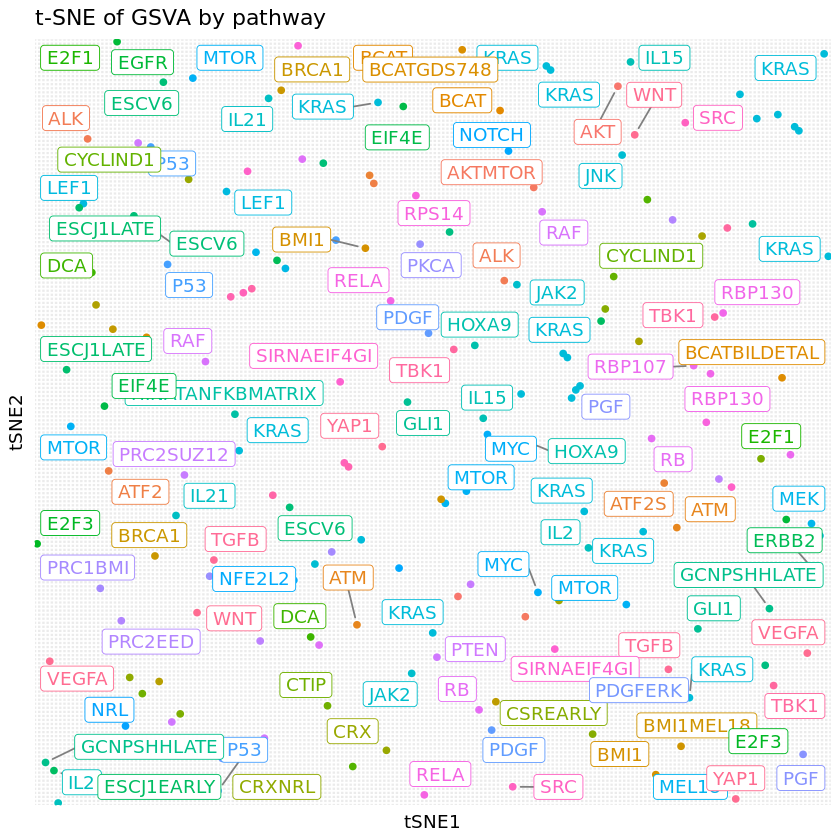

In [45]:
tSNE_plot2<- tsneby_path_df %>%
             ggplot(aes(x = tSNE1, 
             y = tSNE2, color = Group))+
             geom_point()+
             theme(legend.position="none", 
                  axis.text.x=element_blank(),
                  axis.ticks.x=element_blank(),
                  axis.text.y=element_blank(),
                  axis.ticks.y=element_blank())+ 
             ggtitle("t-SNE of GSVA by pathway")+
             geom_label_repel(max.overlaps = 5, aes(label = Group), 
                  point.padding = 0.5,
                  segment.color = 'grey50')
tSNE_plot2

In [3]:
pdf(file = "GSVA_Perturbation_tsne.pdf", width = 8, height = 8)
tSNE_plot2
dev.off()

Warning message:
"ggrepel: 37 unlabeled data points (too many overlaps). Consider increasing max.overlaps"


png 
  2

In [46]:
# save.image("model_env.RData")

## Diff Seq Analyses

In [5]:
resultsNames(ddssva)

[1] "Intercept"            "SV1"                  "SV2"                 
[4] "SV3"                  "genotype_ex9_vs_ex20" "genotype_WT_vs_ex20"

### Genotype Direct Comparison

In [3]:
geno_comp <- results(ddssva, contrast = c("genotype", "ex9", "ex20"))
geno_comp <- as.data.frame(geno_comp)
geno_comp_filt <- geno_comp %>%
  filter(log2FoldChange < -1.5 | log2FoldChange > 1.5) %>%
  filter(padj < 0.05)
geno_comp_filt

,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ENSG00000278791.1,6.612653,-2.302249,0.4649189,-4.951937,7.347834e-07,7.714498e-06
ENSG00000229376.3,12.801501,-1.756743,0.4287367,-4.097487,4.176587e-05,2.741731e-04
ENSG00000142609.18,13.785815,1.869731,0.3283950,5.693544,1.244291e-08,1.983657e-07
ENSG00000187730.9,29.824951,2.674128,0.5126600,5.216183,1.826478e-07,2.238148e-06
ENSG00000238164.6,40.461046,-1.773661,0.4521381,-3.922831,8.751443e-05,5.237764e-04
ENSG00000157873.17,232.385304,-1.795708,0.3865943,-4.644942,3.401715e-06,2.984972e-05
ENSG00000177133.11,10.966659,4.003949,0.8200935,4.882308,1.048511e-06,1.060372e-05
ENSG00000142611.17,68.509740,4.330422,0.6370000,6.798151,1.059707e-11,3.358566e-10
ENSG00000162591.16,8307.720221,1.723491,0.3207743,5.372910,7.747601e-08,1.024647e-06


In [4]:
prePathfindR_df <- geno_comp_filt %>%
                    rownames_to_column("GeneID") %>%
                    dplyr::select(c("GeneID", "log2FoldChange", "padj"))

GeneID,log2FoldChange,padj
<chr>,<dbl>,<dbl>
ENSG00000278791.1,-2.302249,7.714498e-06
ENSG00000229376.3,-1.756743,2.741731e-04
ENSG00000142609.18,1.869731,1.983657e-07
ENSG00000187730.9,2.674128,2.238148e-06
ENSG00000238164.6,-1.773661,5.237764e-04
ENSG00000157873.17,-1.795708,2.984972e-05
ENSG00000177133.11,4.003949,1.060372e-05
ENSG00000142611.17,4.330422,3.358566e-10
ENSG00000162591.16,1.723491,1.024647e-06


In [3]:
prePathfindR_df
write_tsv(prePathfindR_df, file = "GenoDirectComp_SVA.txt")

hgnc_symbol,log2FoldChange,padj
<chr>,<dbl>,<dbl>
CFH,2.000816,2.186195e-07
AOC1,-2.576799,5.349419e-03
WNT16,3.088030,1.045158e-06
TFPI,1.910179,6.260387e-10
SLC7A2,3.866093,2.657544e-24
ABCB5,1.632194,3.167950e-02
SKAP2,2.119249,2.514852e-11
MPO,2.904284,1.020554e-03
SOX8,3.605927,2.937395e-05


In [5]:
library(biomaRt)

In [6]:
#add gene symbols
prePathfindR_df$GeneID <- prePathfindR_df$GeneID %>% 
  tools::file_path_sans_ext()
mart <- useDataset("hsapiens_gene_ensembl", useMart("ensembl"))
genes <- prePathfindR_df$GeneID
G_list <- getBM(filters= "ensembl_gene_id",
                attributes= c("ensembl_gene_id","hgnc_symbol"),
                values=genes,mart= mart,
               useCache = FALSE)
prePathfindR_df <- merge(prePathfindR_df,
                               G_list,
                               by.x="GeneID",
                               by.y="ensembl_gene_id")
prePathfindR_df

GeneID,log2FoldChange,padj,hgnc_symbol
<chr>,<dbl>,<dbl>,<chr>
ENSG00000000971,2.000816,2.186195e-07,CFH
ENSG00000002726,-2.576799,5.349419e-03,AOC1
ENSG00000002745,3.088030,1.045158e-06,WNT16
ENSG00000003436,1.910179,6.260387e-10,TFPI
ENSG00000003989,3.866093,2.657544e-24,SLC7A2
ENSG00000004846,1.632194,3.167950e-02,ABCB5
ENSG00000005020,2.119249,2.514852e-11,SKAP2
ENSG00000005381,2.904284,1.020554e-03,MPO
ENSG00000005513,3.605927,2.937395e-05,SOX8


In [7]:
prePathfindR_df <- prePathfindR_df %>%
                dplyr::select(c("hgnc_symbol", "log2FoldChange", "padj"))
prePathfindR_df

hgnc_symbol,log2FoldChange,padj
<chr>,<dbl>,<dbl>
CFH,2.000816,2.186195e-07
AOC1,-2.576799,5.349419e-03
WNT16,3.088030,1.045158e-06
TFPI,1.910179,6.260387e-10
SLC7A2,3.866093,2.657544e-24
ABCB5,1.632194,3.167950e-02
SKAP2,2.119249,2.514852e-11
MPO,2.904284,1.020554e-03
SOX8,3.605927,2.937395e-05


In [47]:
prePathfindR_df

hgnc_symbol,log2FoldChange,padj
<chr>,<dbl>,<dbl>
CFH,2.000816,2.186195e-07
AOC1,-2.576799,5.349419e-03
WNT16,3.088030,1.045158e-06
TFPI,1.910179,6.260387e-10
SLC7A2,3.866093,2.657544e-24
ABCB5,1.632194,3.167950e-02
SKAP2,2.119249,2.514852e-11
MPO,2.904284,1.020554e-03
SOX8,3.605927,2.937395e-05


`n_processes` is set to `iterations` because `iterations` < `n_processes`

There is already a directory named "pathfindR_Results".
Writing the result to "pathfindR_Results(1)" not to overwrite any previous results.

## Testing input

The input looks OK

## Processing input. Converting gene symbols,
          if necessary (and if human gene symbols provided)

Number of genes provided in input: 4367

Number of genes in input after p-value filtering: 4367

Warning message:
"Duplicated genes found! The lowest p value for each gene was selected"
pathfindR cannot handle p values < 1e-13. These were changed to 1e-13

Could not find any interactions for 1199 (37.66%) genes in the PIN

Final number of genes in input: 1980

## Performing Active Subnetwork Search and Enrichment

## Processing the enrichment results over all iterations

## Annotating involved genes and visualizing enriched terms

## Creating HTML report



processing file: results.Rmd



  |.......................                                               |  33%
   inline R code fragments

  |...............................................                       |  67%
label: setup (with options) 
List of 1
 $ include: logi FALSE

  |......................................................................| 100%
  ordinary text without R code




output file: results.knit.md




/accre/arch/easybuild/software/BinDist/Anaconda3/2019.10/bin/pandoc +RTS -K512m -RTS results.knit.md --to html4 --from markdown+autolink_bare_uris+tex_math_single_backslash --output pandoc2e6cf30e049bd.html --lua-filter /gpfs52/home/mirandax/.conda/envs/jupyter/lib/R/library/rmarkdown/rmarkdown/lua/pagebreak.lua --lua-filter /gpfs52/home/mirandax/.conda/envs/jupyter/lib/R/library/rmarkdown/rmarkdown/lua/latex-div.lua --self-contained --variable bs3=TRUE --standalone --section-divs --template /gpfs52/home/mirandax/.conda/envs/jupyter/lib/R/library/rmarkdown/rmd/h/default.html --no-highlight --variable highlightjs=1 --variable theme=bootstrap --mathjax --variable 'mathjax-url=https://mathjax.rstudio.com/latest/MathJax.js?config=TeX-AMS-MML_HTMLorMML' --include-in-header /tmp/RtmpVGOZdJ/rmarkdown-str2e6cf473d69b1.html 



Output created: results.html



processing file: enriched_terms.Rmd



  |..................                                                    |  25%
   inline R code fragments

  |...................................                                   |  50%
label: setup (with options) 
List of 1
 $ include: logi FALSE

  |....................................................                  |  75%
  ordinary text without R code

  |......................................................................| 100%
label: table (with options) 
List of 2
 $ echo   : logi FALSE
 $ comment: logi NA




output file: enriched_terms.knit.md




/accre/arch/easybuild/software/BinDist/Anaconda3/2019.10/bin/pandoc +RTS -K512m -RTS enriched_terms.knit.md --to html4 --from markdown+autolink_bare_uris+tex_math_single_backslash --output pandoc2e6cf7affc384.html --lua-filter /gpfs52/home/mirandax/.conda/envs/jupyter/lib/R/library/rmarkdown/rmarkdown/lua/pagebreak.lua --lua-filter /gpfs52/home/mirandax/.conda/envs/jupyter/lib/R/library/rmarkdown/rmarkdown/lua/latex-div.lua --self-contained --variable bs3=TRUE --standalone --section-divs --template /gpfs52/home/mirandax/.conda/envs/jupyter/lib/R/library/rmarkdown/rmd/h/default.html --no-highlight --variable highlightjs=1 --variable theme=bootstrap --mathjax --variable 'mathjax-url=https://mathjax.rstudio.com/latest/MathJax.js?config=TeX-AMS-MML_HTMLorMML' --include-in-header /tmp/RtmpVGOZdJ/rmarkdown-str2e6cf67053195.html 



Output created: enriched_terms.html



processing file: conversion_table.Rmd



  |............                                                          |  17%
   inline R code fragments

  |.......................                                               |  33%
label: setup (with options) 
List of 1
 $ include: logi FALSE

  |...................................                                   |  50%
  ordinary text without R code

  |...............................................                       |  67%
label: converted_tbl, table1 (with options) 
List of 1
 $ comment: logi NA

  |..........................................................            |  83%
  ordinary text without R code

  |......................................................................| 100%
label: gene_wo_interaction, table2 (with options) 
List of 1
 $ comment: logi NA




output file: conversion_table.knit.md




/accre/arch/easybuild/software/BinDist/Anaconda3/2019.10/bin/pandoc +RTS -K512m -RTS conversion_table.knit.md --to html4 --from markdown+autolink_bare_uris+tex_math_single_backslash --output pandoc2e6cf372b3d12.html --lua-filter /gpfs52/home/mirandax/.conda/envs/jupyter/lib/R/library/rmarkdown/rmarkdown/lua/pagebreak.lua --lua-filter /gpfs52/home/mirandax/.conda/envs/jupyter/lib/R/library/rmarkdown/rmarkdown/lua/latex-div.lua --self-contained --variable bs3=TRUE --standalone --section-divs --template /gpfs52/home/mirandax/.conda/envs/jupyter/lib/R/library/rmarkdown/rmd/h/default.html --no-highlight --variable highlightjs=1 --variable theme=bootstrap --mathjax --variable 'mathjax-url=https://mathjax.rstudio.com/latest/MathJax.js?config=TeX-AMS-MML_HTMLorMML' --include-in-header /tmp/RtmpVGOZdJ/rmarkdown-str2e6cf550705b8.html 



Output created: conversion_table.html

Plotting the enrichment bubble chart

Found 83 enriched terms


Enrichment results and table of converted genes 

can be found in "results.html" 

in the folder "/gpfs52/data/park_lab/adam/Total_RNA/pathfindR_Results(1)"


Run cluster_enriched_terms() for clustering enriched terms





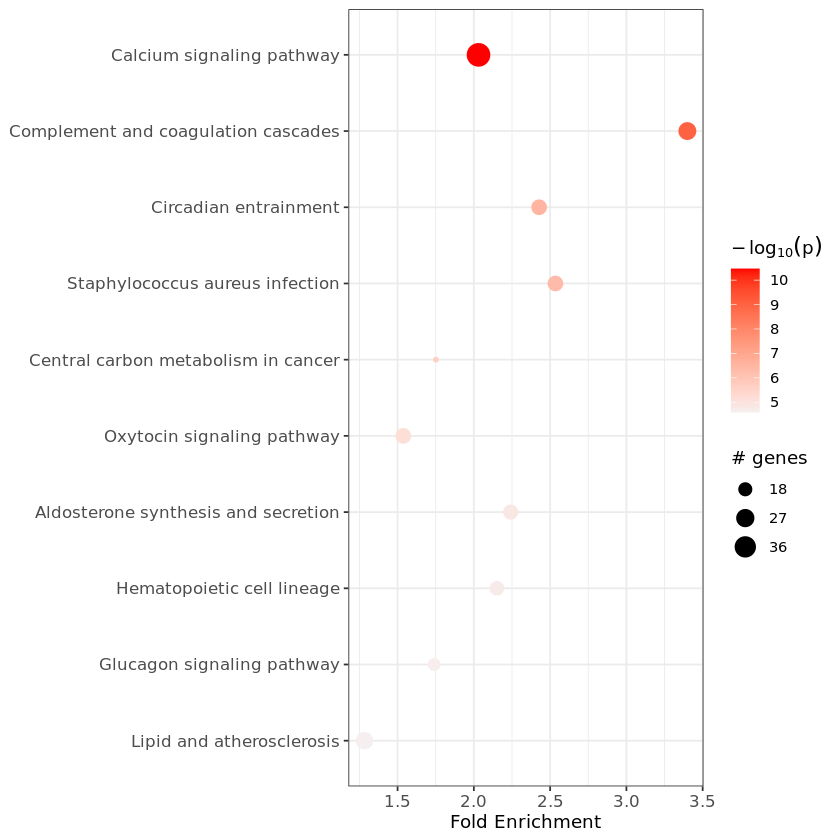

In [61]:
paths_df <- run_pathfindR(prePathfindR_df, visualize_enriched_terms =FALSE, )

In [63]:
paths_df

Term_Description,Fold_Enrichment,occurrence,support,lowest_p,highest_p,Up_regulated,Down_regulated
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
Calcium signaling pathway,2.030532,10,0.07500000,3.431410e-11,4.888198e-06,"SLC8A1, ATP2B3, CHRM3, HRH2, HTR6, ADCY7, CACNA1S, CACNA1H, CHRNA7, GRIN2A, RYR1, RYR2, ADRA1A, ADRA1B, AGTR1, EDNRA, GRM5, HTR2A, HTR2C, OXTR, AVPR1B, GNA14, PDGFD, FGF23, NGF, HGF, PDGFRA, PDGFRB, FGFR2, FLT4, MET, CAMK2A, CAMK2D, CAMK2B, NOS1, PDE1A, PDE1B, PDE1C, PRKCB, PRKCG","FLT1, NTRK2, CALML5, NOS3"
Complement and coagulation cascades,3.399603,4,0.02440476,9.464389e-10,5.778627e-03,"F7, VWF, FGB, FGG, PLG, TFPI, C6, C7, C8A, MASP1, CR1L, CR2, ITGB2, ITGAX, CFH, SERPING1, CFHR3, CFHR1, CFHR4","F2RL3, F13A1, SERPINB2, SERPINA1, CFB, C3, ITGAM"
Circadian entrainment,2.427895,10,0.07142857,2.998453e-07,2.203229e-05,"GRIN2A, CAMK2A, CAMK2D, CAMK2B, NOS1, RYR1, RYR2, GNG7, GRIA1, GRIA4, CACNA1H, ADCY7, GUCY1A2, PRKG2, MTNR1A, PRKCB, PRKCG, KCNJ3","CALML5, GNB4, GNG11"
Staphylococcus aureus infection,2.534615,10,0.12500000,4.782378e-07,8.802634e-06,"KRT9, KRT14, KRT17, KRT19, KRT27, KRT26, FGG, CFH, MASP1, FCGR2A, PLG, SELP, ITGB2, HLA-DQB1","C3, CFB, FPR1, ITGAM, DSG1, HLA-DRA, HLA-DRB1"
Central carbon metabolism in cancer,1.750966,10,0.18734336,2.470378e-06,5.839530e-06,"SLC2A2, KIT, MET, PDGFRA, PDGFRB, FGFR2, FLT3, G6PD, HK3, SLC7A5",LDHB
Oxytocin signaling pathway,1.537667,10,0.05000000,7.335217e-06,3.154801e-03,"OXTR, MEF2C, RYR1, RYR2, KCNJ4, PRKCB, PRKCG, CACNA1S, CAMK2A, CAMK2D, CAMK2B, GUCY1A2, NPR2, ADCY7, PIK3CG, KCNJ3","PLA2G4A, KCNJ2, CALML5, NOS3, MYL9"
Aldosterone synthesis and secretion,2.241497,10,0.08608059,1.375563e-05,4.941999e-04,"AGTR1, PRKCB, PRKCG, PRKD1, CREB3L1, CREB3L3, KCNK3, KCNK9, ATP1B4, CACNA1H, CACNA1S, CAMK2A, CAMK2D, CAMK2B, ATP2B3, ADCY7, NR4A1, CYP11A1","AGT, CALML5"
Hematopoietic cell lineage,2.151375,10,0.02500000,1.946155e-05,2.107769e-02,"CSF2, EPO, THPO, FLT3, HLA-DQB1, KIT, CD1D, CR2, CR1L, CD33, ANPEP, CSF3R, ITGA4","TNF, HLA-DRA, HLA-DRB1, ITGAM, IL1R1, CD36"
Glucagon signaling pathway,1.739934,10,0.02500000,2.171397e-05,1.920770e-02,"GCG, GCGR, CREB3L1, CREB3L3, CAMK2A, CAMK2D, CAMK2B, PCK1, GYS2, ACACB, SLC2A2, FBP1, FBP2","PPARGC1A, CALML5, LDHB"


In [65]:
names(paths_df) <- c("ID", "Fold_Enrichment", "occurrence", "support", "lowest_p", 
             "highest_p", "Up_regulated", "Down_regulated")

paths_df

ID,Fold_Enrichment,occurrence,support,lowest_p,highest_p,Up_regulated,Down_regulated
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
Calcium signaling pathway,2.030532,10,0.07500000,3.431410e-11,4.888198e-06,"SLC8A1, ATP2B3, CHRM3, HRH2, HTR6, ADCY7, CACNA1S, CACNA1H, CHRNA7, GRIN2A, RYR1, RYR2, ADRA1A, ADRA1B, AGTR1, EDNRA, GRM5, HTR2A, HTR2C, OXTR, AVPR1B, GNA14, PDGFD, FGF23, NGF, HGF, PDGFRA, PDGFRB, FGFR2, FLT4, MET, CAMK2A, CAMK2D, CAMK2B, NOS1, PDE1A, PDE1B, PDE1C, PRKCB, PRKCG","FLT1, NTRK2, CALML5, NOS3"
Complement and coagulation cascades,3.399603,4,0.02440476,9.464389e-10,5.778627e-03,"F7, VWF, FGB, FGG, PLG, TFPI, C6, C7, C8A, MASP1, CR1L, CR2, ITGB2, ITGAX, CFH, SERPING1, CFHR3, CFHR1, CFHR4","F2RL3, F13A1, SERPINB2, SERPINA1, CFB, C3, ITGAM"
Circadian entrainment,2.427895,10,0.07142857,2.998453e-07,2.203229e-05,"GRIN2A, CAMK2A, CAMK2D, CAMK2B, NOS1, RYR1, RYR2, GNG7, GRIA1, GRIA4, CACNA1H, ADCY7, GUCY1A2, PRKG2, MTNR1A, PRKCB, PRKCG, KCNJ3","CALML5, GNB4, GNG11"
Staphylococcus aureus infection,2.534615,10,0.12500000,4.782378e-07,8.802634e-06,"KRT9, KRT14, KRT17, KRT19, KRT27, KRT26, FGG, CFH, MASP1, FCGR2A, PLG, SELP, ITGB2, HLA-DQB1","C3, CFB, FPR1, ITGAM, DSG1, HLA-DRA, HLA-DRB1"
Central carbon metabolism in cancer,1.750966,10,0.18734336,2.470378e-06,5.839530e-06,"SLC2A2, KIT, MET, PDGFRA, PDGFRB, FGFR2, FLT3, G6PD, HK3, SLC7A5",LDHB
Oxytocin signaling pathway,1.537667,10,0.05000000,7.335217e-06,3.154801e-03,"OXTR, MEF2C, RYR1, RYR2, KCNJ4, PRKCB, PRKCG, CACNA1S, CAMK2A, CAMK2D, CAMK2B, GUCY1A2, NPR2, ADCY7, PIK3CG, KCNJ3","PLA2G4A, KCNJ2, CALML5, NOS3, MYL9"
Aldosterone synthesis and secretion,2.241497,10,0.08608059,1.375563e-05,4.941999e-04,"AGTR1, PRKCB, PRKCG, PRKD1, CREB3L1, CREB3L3, KCNK3, KCNK9, ATP1B4, CACNA1H, CACNA1S, CAMK2A, CAMK2D, CAMK2B, ATP2B3, ADCY7, NR4A1, CYP11A1","AGT, CALML5"
Hematopoietic cell lineage,2.151375,10,0.02500000,1.946155e-05,2.107769e-02,"CSF2, EPO, THPO, FLT3, HLA-DQB1, KIT, CD1D, CR2, CR1L, CD33, ANPEP, CSF3R, ITGA4","TNF, HLA-DRA, HLA-DRB1, ITGAM, IL1R1, CD36"
Glucagon signaling pathway,1.739934,10,0.02500000,2.171397e-05,1.920770e-02,"GCG, GCGR, CREB3L1, CREB3L3, CAMK2A, CAMK2D, CAMK2B, PCK1, GYS2, ACACB, SLC2A2, FBP1, FBP2","PPARGC1A, CALML5, LDHB"


In [75]:
pdf(file = "clustered_output_graphs.pdf", width = 12, height = 12)
clustered_df <- cluster_enriched_terms(paths_df, plot_hmap = TRUE)
dev.off()

The maximum average silhouette width was 0.15 for k = 24 





png 
  2

In [74]:
term_plot <- term_gene_graph(result_df = paths_df, num_terms = 3)
pdf(file = "term_gene_graph.pdf", width = 12, height = 12)
term_plot
dev.off()

png 
  2

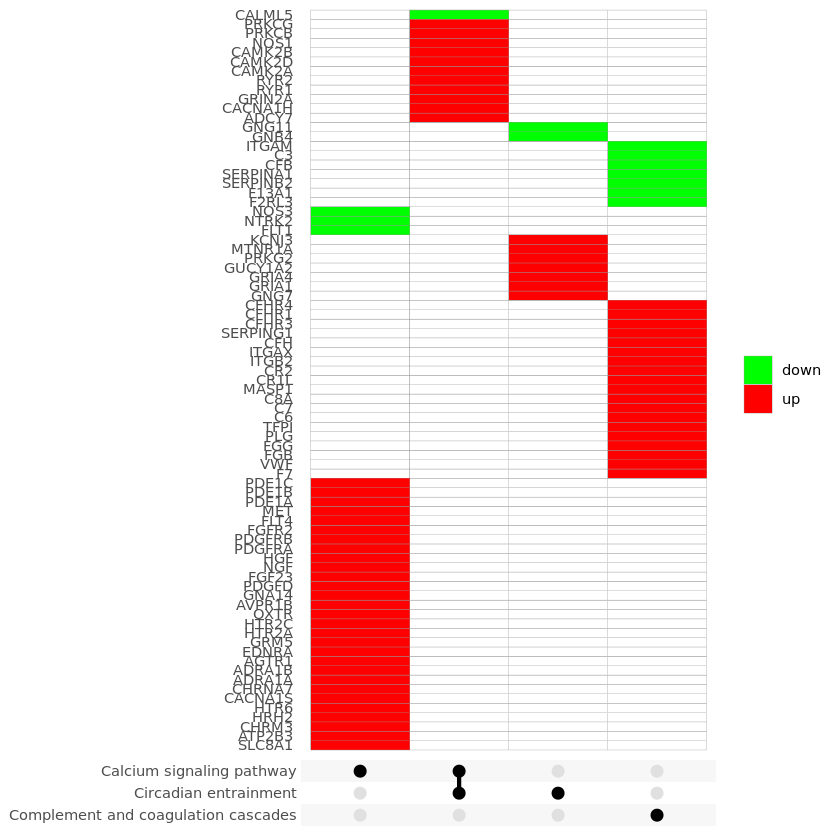

In [73]:
UpSet_plot(result_df = paths_df, num_terms = 3)

Warning message:
"ggrepel: 71 unlabeled data points (too many overlaps). Consider increasing max.overlaps"


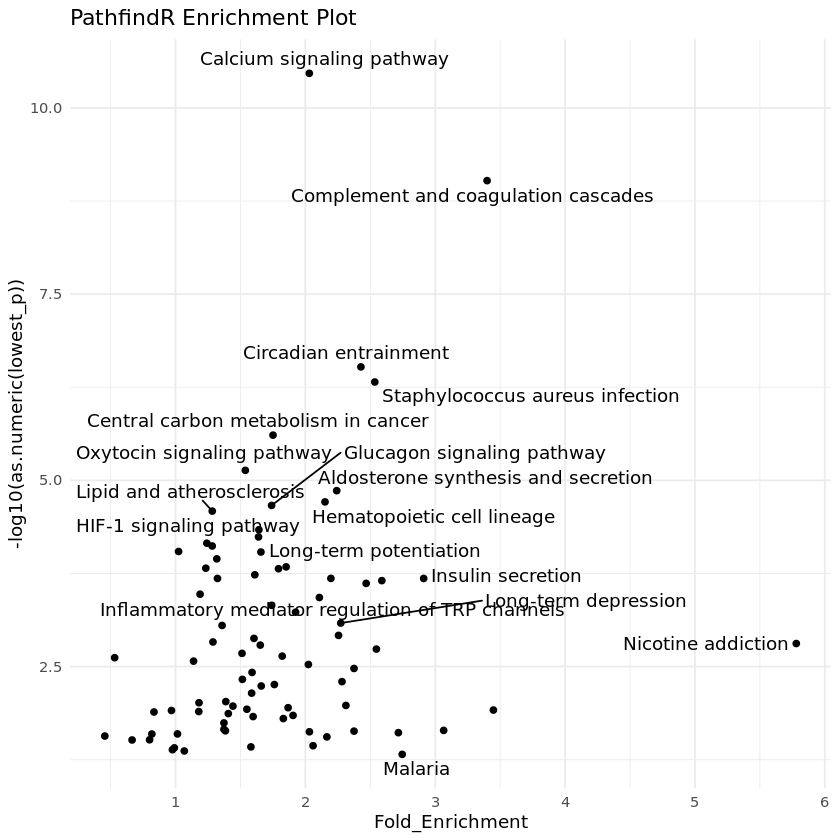

In [84]:
volcano <- paths_df %>%
  ggplot(aes(x = Fold_Enrichment, y = -log10(as.numeric(lowest_p)), label = ID)) +
  geom_point() +
  theme_minimal() +
  geom_text_repel() +
  ggtitle(label = "PathfindR Enrichment Plot")
volcano

In [85]:
pdf(file = "PathfindR_volcano", width = 6, height = 8)
volcano
dev.off()

Warning message:
"ggrepel: 63 unlabeled data points (too many overlaps). Consider increasing max.overlaps"


png 
  2

In [14]:
# save.image(file = "model_env.RData")

## WebGestalt

In [8]:
library("WebGestaltR")
library("biomaRt")

In [3]:
geno_comp_filt

,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ENSG00000278791.1,6.612653,-2.302249,0.4649189,-4.951937,7.347834e-07,7.714498e-06
ENSG00000229376.3,12.801501,-1.756743,0.4287367,-4.097487,4.176587e-05,2.741731e-04
ENSG00000142609.18,13.785815,1.869731,0.3283950,5.693544,1.244291e-08,1.983657e-07
ENSG00000187730.9,29.824951,2.674128,0.5126600,5.216183,1.826478e-07,2.238148e-06
ENSG00000238164.6,40.461046,-1.773661,0.4521381,-3.922831,8.751443e-05,5.237764e-04
ENSG00000157873.17,232.385304,-1.795708,0.3865943,-4.644942,3.401715e-06,2.984972e-05
ENSG00000177133.11,10.966659,4.003949,0.8200935,4.882308,1.048511e-06,1.060372e-05
ENSG00000142611.17,68.509740,4.330422,0.6370000,6.798151,1.059707e-11,3.358566e-10
ENSG00000162591.16,8307.720221,1.723491,0.3207743,5.372910,7.747601e-08,1.024647e-06


In [5]:
WebGestaltR::listOrganism()

[1] "athaliana"     "btaurus"       "celegans"      "cfamiliaris"  
 [5] "drerio"        "sscrofa"       "dmelanogaster" "ggallus"      
 [9] "hsapiens"      "mmusculus"     "rnorvegicus"   "scerevisiae"

In [10]:
#add gene symbols
geno_comp_filt$geneID <- rownames(geno_comp_filt) %>% 
  tools::file_path_sans_ext()
mart <- useDataset("hsapiens_gene_ensembl", useMart("ensembl"))
genes <- geno_comp_filt$geneID
G_list <- getBM(filters= "ensembl_gene_id",
                attributes= c("ensembl_gene_id","hgnc_symbol"),
                values=genes,mart= mart,
               useCache = FALSE)
geno_comp_filt <- merge(geno_comp_filt,
                               G_list,
                               by.x="geneID",
                               by.y="ensembl_gene_id")
head(geno_comp_filt)

,geneID,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,hgnc_symbol
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
1,ENSG00000000971,5740.810727,2.000816,0.3525797,5.674790,1.388592e-08,2.186195e-07,CFH
2,ENSG00000002726,134.435807,-2.576799,0.8000079,-3.220967,1.277589e-03,5.349419e-03,AOC1
3,ENSG00000002745,63.844145,3.088030,0.5751412,5.369168,7.910090e-08,1.045158e-06,WNT16
4,ENSG00000003436,7051.183906,1.910179,0.2851728,6.698322,2.108267e-11,6.260387e-10,TFPI
5,ENSG00000003989,10546.998253,3.866093,0.3602442,10.731867,7.212385e-27,2.657544e-24,SLC7A2
6,ENSG00000004846,4.750688,1.632194,0.6375276,2.560193,1.046140e-02,3.167950e-02,ABCB5


In [13]:
write(geno_comp_filt$hgnc_symbol, file = "genesforGestalt.txt")

# Clean MCF10A Figs

In [1]:
library("tidyverse")
library("org.Hs.eg.db")
library("ggrepel")
library("DESeq2")
setwd("/data/park_lab/adam/Total_RNA")
load("Total_RNA_env.RData")
ls()

── Attaching packages ─────────────────────────────────────── tidyverse 1.3.1 ──

✔ ggplot2 3.4.2     ✔ purrr   1.0.1
✔ tibble  3.2.1     ✔ dplyr   1.1.2
✔ tidyr   1.3.0     ✔ stringr 1.5.0
✔ readr   2.1.2     ✔ forcats 1.0.0

── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter()  masks stats::filter()
✖ purrr::flatten() masks jsonlite::flatten()
✖ dplyr::lag()     masks stats::lag()

Loading required package: AnnotationDbi

Loading required package: stats4

Loading required package: BiocGenerics


Attaching package: ‘BiocGenerics’


The following objects are masked from ‘package:dplyr’:

    combine, intersect, setdiff, union


The following objects are masked from ‘package:stats’:

    IQR, mad, sd, var, xtabs


The following objects are masked from ‘package:base’:

    anyDuplicated, append, as.data.frame, basename, cbind, colnames,
    dirname, do.call, duplicated, eval, evalq, Filter, Find, get, grep,
    grepl, intersect, is.unsorted, 

[1] "all_diff_genes"                           
  [2] "AREG_exp"                                 
  [3] "AREG_exp_raw"                             
  [4] "cancer_coldata"                           
  [5] "cancer_counts"                            
  [6] "cancer_dds"                               
  [7] "cancer_dds_f"                             
  [8] "cancer_diff_genes"                        
  [9] "cancer_ex9vex20_over"                     
 [10] "cancer_ex9vex20_res"                      
 [11] "cancer_ex9vex20_resSig_padj"              
 [12] "cancer_ex9vex20_under"                    
 [13] "cancer_filt"                              
 [14] "cancer_genotype"                          
 [15] "cancer_norm_sigset"                       
 [16] "cancer_normalized_counts_f"               
 [17] "cancer_normalized_counts_f_nonames"       
 [18] "cancer_rlog"                              
 [19] "cancer_sampleDistMatrix"                  
 [20] "cancer_samples"                           
 [21] "cancer_vst"                               
 [22] "cancer_WTvex20_over"                      
 [23] "cancer_WTvex20_res"                       
 [24] "cancer_WTvex20_resSig_padj"               
 [25] "cancer_WTvex20_under"                     
 [26] "cancer_WTvex9_over"                       
 [27] "cancer_WTvex9_over_clean"                 
 [28] "cancer_WTvex9_over_symbols"               
 [29] "cancer_WTvex9_res"                        
 [30] "cancer_WTvex9_resSig_padj"                
 [31] "cancer_WTvex9_under"                      
 [32] "cancer_WTvex9_under_clean"                
 [33] "cancer_WTvex9_under_symbols"              
 [34] "cancerDists"                              
 [35] "cluster_df"                               
 [36] "cluster3"                                 
 [37] "cluster3_genes"                           
 [38] "cluster3_genes_clean"                     
 [39] "cluster3_GOBP"                            
 [40] "cluster9"                                 
 [41] "cluster9_genes"                           
 [42] "cluster9_genes_clean"                     
 [43] "cluster9_GOBP"                            
 [44] "clusters"                                 
 [45] "datares_HC"                               
 [46] "dds_LRT"                                  
 [47] "diff_ex9vex20"                            
 [48] "diff_ex9vex20_sig"                        
 [49] "diff_WTvex20"                             
 [50] "diff_WTvex20_sig"                         
 [51] "diff_WTvex9"                              
 [52] "diff_WTvex9_sig"                          
 [53] "E545K_expressed_E545K_interacting_overlap"
 [54] "E545K_expressed_interacting_overlap"      
 [55] "E545K_expressed_WT_interacting_overlap"   
 [56] "ens.str_ex9vex20"                         
 [57] "ens.str_WTvex20"                          
 [58] "ens.str_WTvex9"                           
 [59] "ETV5_exp"                                 
 [60] "ex9vex20_combined"                        
 [61] "ex9vex20_combined_GOBP"                   
 [62] "ex9vex20_combined_GOBP_nocan"             
 [63] "ex9vex20_combined_nocan"                  
 [64] "ex9vex20_genes_log2fc_1.5"                
 [65] "ex9vex20_genes_log2fc_1.5_entrez"         
 [66] "ex9vex20_genes_log2fc_1.5_entrez_df"      
 [67] "ex9vex20_genes_padj"                      
 [68] "ex9vex20_genes_padj_entrez"               
 [69] "ex9vex20_GOBP"                            
 [70] "ex9vex20_GOMF"                            
 [71] "ex9vex20_KEGG"                            
 [72] "ex9vex20_over_clean"                      
 [73] "ex9vex20_over_clean_nocan"                
 [74] "ex9vex20_over_common"                     
 [75] "ex9vex20_over_common_GOBP"                
 [76] "ex9vex20_over_common_GOBP_nocan"          
 [77] "ex9vex20_over_common_GOMF"                
 [78] "ex9vex20_over_nocan"                      
 [79] "ex9vex20_res"                             
 [80] "ex9vex20_res_df"                          
 [

In [2]:
library("tidyverse")
library("org.Hs.eg.db")
library("ggrepel")
library("biomaRt")

## GSEA Pathways

### Total Genes

In [3]:
MCF10A_ex9vex20_resTot <- as.data.frame(MCF10A_ex9vex20_res)

In [5]:
MCF10A_dds

class: DESeqDataSet 
dim: 60609 9 
metadata(1): version
assays(1): counts
rownames(60609): ENSG00000223972.5 ENSG00000227232.5 ...
  ENSG00000210195.2 ENSG00000210196.2
rowData names(0):
colnames(9): MCF10A_E545K_rep1 MCF10A_E545K_rep2 ... MCF10A_H1047R_rep2
  MCF10A_H1047R_rep3
colData names(1): MCF10A_genotype

In [4]:
ens.str <- substr(rownames(MCF10A_ex9vex20_resTot), 1, 15)
genes <- mapIds(org.Hs.eg.db,
                keys = ens.str,
                column = "SYMBOL",
                keytype = "ENSEMBL",
                multiVals= "first")
str(genes)
genes <- as.character(genes)
MCF10A_ex9vex20_resTot$symbols <- genes
entrez <- mapIds(org.Hs.eg.db,
                keys = ens.str,
                column = "ENTREZID",
                keytype = "ENSEMBL",
                multiVals= "first")
str(entrez)
MCF10A_ex9vex20_resTot$entrez <- entrez
head(MCF10A_ex9vex20_resTot)

'select()' returned 1:many mapping between keys and columns



 Named chr [1:21734] "WASH7P" "MIR6859-1" "LOC100996442" "CICP27" NA NA NA ...
 - attr(*, "names")= chr [1:21734] "ENSG00000227232" "ENSG00000278267" "ENSG00000238009" "ENSG00000233750" ...


'select()' returned 1:many mapping between keys and columns



 Named chr [1:21734] "653635" "102466751" "100996442" "100420257" NA NA NA ...
 - attr(*, "names")= chr [1:21734] "ENSG00000227232" "ENSG00000278267" "ENSG00000238009" "ENSG00000233750" ...


,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,symbols,entrez
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
ENSG00000227232.5,228.49968,-1.0426160,0.2020715,-5.1596389,2.474267e-07,7.955144e-07,WASH7P,653635
ENSG00000278267.1,49.95994,-0.3815437,0.3458952,-1.1030613,2.700005e-01,3.403279e-01,MIR6859-1,102466751
ENSG00000238009.6,28.51625,0.8316157,0.5239795,1.5871149,1.124866e-01,1.589681e-01,LOC100996442,100996442
ENSG00000233750.3,69.85035,0.2650194,0.3445635,0.7691452,4.418071e-01,5.187002e-01,CICP27,100420257
ENSG00000268903.1,272.18446,0.5712208,0.2140618,2.6684853,7.619411e-03,1.394261e-02,NA,NA
ENSG00000269981.1,239.55302,0.6518759,0.1927933,3.3812171,7.216549e-04,1.563010e-03,NA,NA


In [6]:
total_num_ranks <- as.numeric(MCF10A_ex9vex20_resTot$log2FoldChange)
names(total_num_ranks) <- MCF10A_ex9vex20_resTot$symbols
total_num_ranks <- na.omit(total_num_ranks)
total_num_ranks

WASH7P                 MIR6859-1              LOC100996442 
            -1.042616e+00             -3.815437e-01              8.316157e-01 
                   CICP27                      <NA>                      <NA> 
             2.650194e-01              5.712208e-01              6.518759e-01 
                     <NA>                    WASH9P                 RPL23AP21 
             3.466345e-02             -9.147275e-01              7.434980e-02 
                     <NA>              LOC101928626                  MTND2P28 
             1.906969e-01             -1.220662e-01              2.676652e-02 
                 MTCO1P12                  MTCO2P12                  MTATP6P1 
            -2.418106e-01              1.567028e+00              3.338368e-01 
                     <NA>                 LINC01409                      <NA> 
            -3.733009e-01             -2.753394e-01             -4.881784e-02 
                   FAM87B                 LINC01128                 LINC00115 
            -5.355815e-01             -6.086530e-01             -6.886352e-02 
                     <NA>                      <NA>                      <NA> 
            -1.157900e-01             -5.912350e-01             -7.272762e-01 
                LINC02593                    SAMD11                     NOC2L 
            -1.925935e-01              6.005879e-01              3.407849e-01 
                   KLHL17                   PLEKHN1                     PERM1 
             1.949281e-01              1.949564e-03             -2.322790e-01 
                     <NA>                      HES4                     ISG15 
             1.293333e+00             -4.302313e-01             -7.605080e-02 
                     AGRN                      <NA>              LOC100288175 
            -2.729705e-01             -2.679239e-01             -3.415008e-01 
                     <NA>                    RNF223                  C1orf159 
            -1.403315e-01             -4.137154e-02             -1.345951e-01 
                     <NA>                      <NA>                      SDF4 
            -7.275298e-01             -1.599555e+00             -2.022858e-02 
                  B3GALT6                  C1QTNF12                    UBE2J2 
             1.157465e-01              2.555868e-01              1.299011e-01 
                   SCNN1D                     ACAP3                     PUSL1 
            -3.887695e-01             -2.953141e-01              1.747255e-01 
                   INTS11                   MIR6727                      <NA> 
             1.192938e-01              2.062228e-01             -1.133270e-01 
                     CPTP                    TAS1R3                      DVL1 
            -1.925994e-01             -6.070983e-01             -1.211071e-01 
                  MIR6808                     MXRA8                  AURKAIP1 
            -1.002031e+00             -1.113063e+00              3.664763e-01 
                    CCNL2                MRPL20-AS1                    MRPL20 
            -3.747534e-01             -5.612091e-02              5.418072e-01 
                RN7SL657P                      <NA>                   ANKRD65 
            -2.064418e-01              6.031831e-01             -4.915934e-01 
                     VWA1                    ATAD3C                    ATAD3B 
             6.860851e-03              6.860507e-01              7.370317e-01 
                     <NA>                    ATAD3A                   TMEM240 
            -2.112689e-01              5.336351e-01             -8.013614e-01 
                    SSU72                      <NA>                    FNDC10 
             9.782808e-02             -6.835263e-01             -4.184753e-01 
                     <NA>                      <NA>                      MIB2 
            -1.251346e+00             -8.419737e-01             -8.106276e-03 
                   CDK11B                      <NA>                  

### Diff Exp Genes

In [3]:
MCF10A_ex9vex20_resSig_padj

rowname,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ENSG00000229344.1,25.34822,1.567028,0.43128682,3.633378,2.797349e-04,6.420282e-04
ENSG00000272141.1,56.98284,-1.599555,0.36570875,-4.373849,1.220746e-05,3.299460e-05
ENSG00000142609.18,37.27399,1.581053,0.39585790,3.993991,6.497035e-05,1.619451e-04
ENSG00000116254.18,26.01773,2.177474,0.59982801,3.630165,2.832406e-04,6.497309e-04
ENSG00000284716.1,28.53703,2.628378,0.47906145,5.486514,4.099420e-08,1.419025e-07
ENSG00000284693.1,62.46080,-2.443437,0.39452080,-6.193430,5.886891e-10,2.381057e-09
ENSG00000271989.1,38.04447,2.389109,0.41415173,5.768681,7.989418e-09,2.940777e-08
ENSG00000204624.8,150.72500,-1.891653,0.33044053,-5.724640,1.036531e-08,3.780087e-08
ENSG00000285833.1,36.30865,-1.691796,0.50794893,-3.330642,8.664600e-04,1.853544e-03


In [8]:
write_csv(MCF10A_ex9vex20_resSig_padj, file = "/data/park_lab/adam/figures/DEG_table.csv")

In [9]:
ens.str <- substr(MCF10A_ex9vex20_resSig_padj$rowname, 1, 15)
genes <- mapIds(org.Hs.eg.db,
                keys = ens.str,
                column = "SYMBOL",
                keytype = "ENSEMBL",
                multiVals= "first")
str(genes)
genes <- as.character(genes)
genes

'select()' returned 1:many mapping between keys and columns



 Named chr [1:1271] "MTCO2P12" NA "CFAP74" "CHD5" NA "LINC02606" NA "DISP3" ...
 - attr(*, "names")= chr [1:1271] "ENSG00000229344" "ENSG00000272141" "ENSG00000142609" "ENSG00000116254" ...


[1] "MTCO2P12"     NA             "CFAP74"       "CHD5"        
   [5] NA             "LINC02606"    NA             "DISP3"       
   [9] NA             NA             "FAM131C"      NA            
  [13] "PADI2"        "PADI3"        "ACTL8"        "PLA2G2A"     
  [17] "SH2D5"        NA             "E2F2"         "FUCA1"       
  [21] "IFNLR1"       "EXTL1"        "GPR3"         NA            
  [25] "SPOCD1"       "CSMD2"        "CLSPN"        NA            
  [29] "COL8A2"       NA             "COL9A2"       "EDN2"        
  [33] "LOC100418723" "CDC20"        "KIF2C"        "DMBX1"       
  [37] "CYP4B1"       "CYP4X1"       "PDZK1IP1"     NA            
  [41] NA             "SLC5A9"       "RAB3B"        "RPS13P2"     
  [45] NA             "KANK4"        NA             "DEPDC1"      
  [49] NA             "DEPDC1-AS1"   "LRRIQ3"       "MSH4"        
  [53] "ST6GALNAC3"   NA             NA             "IFI44L"      
  [57] "LPAR3"        "CLCA4"        NA             "TGFBR3"      
  [61] "RPL7P9"       "MIR137HG"     "AMIGO1"       "DENND2D"     
  [65] "CHI3L2"       "OLFML3"       NA             "TXNIP"       
  [69] "NBPF10"       NA             "NBPF14"       "H3C13"       
  [73] "H4C14"        "H2BC19P"      "H2BC20P"      "H2AC19"      
  [77] "SV2A"         "BNIPL"        "SELENBP1"     "RORC"        
  [81] "FLG-AS1"      "HRNR"         "FLG"          "KPRP"        
  [85] "SPRR1A"       "SPRR2D"       "PGLYRP3"      "PGLYRP4"     
  [89] "S100A9"       "S100A8"       "S100A3"       "NPR1"        
  [93] "SNORA58B"     "ATP8B2"       "FDPS"         "RUSC1-AS1"   
  [97] "IQGAP3"       "SH2D2A"       "CFAP45"       "SLAMF9"      
 [101] "ATP1A2"       "ITLN2"        "SPATA46"      "NUF2"        
 [105] "SELL"         "HMCN1"        "PTGS2"        "LOC105371664"
 [109] "B3GALT2"      "KIF14"        "PKP1"         NA            
 [113] NA             NA             NA             NA            
 [117] "CAMK1G"       "HSD11B1"      "NEK2"         "DTL"         
 [121] "ATF3"         "FAM71A"       "BATF3"        "KRT18P12"    
 [125] "CENPF"        "MTARC2"       "MTARC1"       NA            
 [129] "SUSD4"        "GJC2"         NA             "NID1"        
 [133] "EXO1"         "RSAD2"        "RNF144A"      "RRM2"        
 [137] "GREB1"        "OSR1"         "MATN3"        "GDF7"        
 [141] "APOB"         "FAM166C"      NA             "CYP1B1"      
 [145] "RPLP0P6"      "SLC8A1"       NA             "CCDC85A"     
 [149] NA             NA             "ADD2"         "VAX2"        
 [153] "ATP6V1B1"     "TCF7L1"       NA             "KCNIP3"      
 [157] "NCAPH"        "IL1R1"        NA             "BUB1"        
 [161] "NT5DC4"       "CKAP2L"       "IL1A"         "IL1B"        
 [165] NA             "MARCO"        "TMEM37"       "GLI2"        
 [169] "MYO7B"        "FAR2P1"       "POTEF"        "CCDC74B"     
 [173] "TUBA3E"       "CCDC74A"      NA             NA            
 [177] "LYPD6"        "RND3"         "GPD2"         "DAPL1"       
 [181] "TBR1"         "SLC38A11"     "SCN2A"        "NOSTRIN"     
 [185] "SPC25"        "DLX2"         NA             NA            
 [189] NA             "STAT4-AS1"    "STAT4"        "HECW2"       
 [193] "PLCL1"        "SCYL2P1"      "LOC100419679" NA            
 [197] "MAP2"         NA             "FN1"          "IGFBP2"      
 [201] "GPBAR1"       "CYP27A1"      "IHH"          NA            
 [205] "CT75"         NA             "SLC16A14"     "ALPG"        
 [209] "CHRND"        "KCNJ13"       "NGEF"         "HJURP"       
 [213] "COL6A3"       "KLHL30"       "MAB21L4"      "BHLHE40-AS1" 
 [217] "BHLHE40"      "FANCD2"       "FANCD2OS"     "CAND2"       
 [221] "PLCL2"        "KCNH8"        "THRB"         NA            
 [225] NA             "TRIM71"       NA             "VILL"        
 [229] "ENTPD3"       NA             NA             NA            
 [233] "KIF15"        "TMIE"         "SEMA3B"       NA            
 [237] "POC1A"        "CACNA2D3-AS1" NA           

In [10]:
MCF10A_ex9vex20_resSig_padj$symbols <- genes

In [11]:
ens.str <- substr(MCF10A_ex9vex20_resSig_padj$rowname, 1, 15)
entrez <- mapIds(org.Hs.eg.db,
                keys = ens.str,
                column = "ENTREZID",
                keytype = "ENSEMBL",
                multiVals= "first")
str(entrez)
genes <- as.character(entrez)
entrez
MCF10A_ex9vex20_resSig_padj$entrez <- entrez

'select()' returned 1:many mapping between keys and columns



 Named chr [1:1271] "107075310" NA "85452" "26038" NA "100506022" NA ...
 - attr(*, "names")= chr [1:1271] "ENSG00000229344" "ENSG00000272141" "ENSG00000142609" "ENSG00000116254" ...


ENSG00000229344 ENSG00000272141 ENSG00000142609 ENSG00000116254 ENSG00000284716 
    "107075310"              NA         "85452"         "26038"              NA 
ENSG00000284693 ENSG00000271989 ENSG00000204624 ENSG00000285833 ENSG00000272482 
    "100506022"              NA         "57540"              NA              NA 
ENSG00000185519 ENSG00000236698 ENSG00000117115 ENSG00000142619 ENSG00000117148 
       "348487"              NA         "11240"         "51702"         "81569" 
ENSG00000188257 ENSG00000189410 ENSG00000187952 ENSG00000007968 ENSG00000179163 
         "5320"        "400745"              NA          "1870"          "2517" 
ENSG00000185436 ENSG00000158008 ENSG00000181773 ENSG00000287510 ENSG00000134668 
       "163702"          "2134"          "2827"              NA         "90853" 
ENSG00000121904 ENSG00000092853 ENSG00000232335 ENSG00000171812 ENSG00000286379 
       "114784"         "63967"              NA          "1296"              NA 
ENSG00000049089 ENSG00000127129 ENSG00000230638 ENSG00000117399 ENSG00000142945 
         "1298"          "1907"     "100418723"           "991"         "11004" 
ENSG00000197587 ENSG00000142973 ENSG00000186377 ENSG00000162366 ENSG00000225762 
       "127343"          "1580"        "260293"         "10158"              NA 
ENSG00000242267 ENSG00000117834 ENSG00000169213 ENSG00000228929 ENSG00000228838 
             NA        "200010"          "5865"        "729236"              NA 
ENSG00000132854 ENSG00000116652 ENSG00000024526 ENSG00000233589 ENSG00000234264 
       "163782"              NA         "55635"              NA     "101927220" 
ENSG00000162620 ENSG00000057468 ENSG00000184005 ENSG00000226415 ENSG00000219201 
       "127255"          "4438"        "256435"              NA              NA 
ENSG00000137959 ENSG00000171517 ENSG00000016602 ENSG00000236915 ENSG00000069702 
        "10964"         "23566"         "22802"              NA          "7049" 
ENSG00000137970 ENSG00000225206 ENSG00000181754 ENSG00000162777 ENSG00000064886 
       "653702"        "400765"         "57463"         "79961"          "1117" 
ENSG00000116774 ENSG00000234367 ENSG00000265972 ENSG00000271425 ENSG00000244371 
        "56944"              NA         "10628"     "100132406"              NA 
ENSG00000270629 ENSG00000183598 ENSG00000270882 ENSG00000220323 ENSG00000261716 
        "25832"        "653604"          "8370"        "337874"        "337873" 
ENSG00000272196 ENSG00000159164 ENSG00000163141 ENSG00000143416 ENSG00000143365 
       "723790"          "9900"        "149428"          "8991"          "6097" 
ENSG00000237975 ENSG00000197915 ENSG00000143631 ENSG00000203786 ENSG00000169474 
       "339400"        "388697"          "2312"        "448834"          "6698" 
ENSG00000163216 ENSG00000159527 ENSG00000163218 ENSG00000163220 ENSG00000143546 
         "6703"        "114771"         "57115"          "6280"          "6279" 
ENSG00000188015 ENSG00000169418 ENSG00000201129 ENSG00000143515 ENSG00000160752 
         "6274"          "4881"     "109617023"         "57198"          "2224" 
ENSG00000225855 ENSG00000183856 ENSG00000027869 ENSG00000213085 ENSG00000162723 
       "284618"        "128239"          "9047"         "25790"         "89886" 
ENSG00000018625 ENSG00000158764 ENSG00000171722 ENSG00000143228 ENSG00000188404 
          "477"        "142683"        "284680"         "83540"          "6402" 
ENSG00000143341 ENSG00000073756 ENSG00000285280 ENSG00000162630 ENSG00000118193 
        "83872"          "5743"     "105371664"          "8707"          "9928" 
ENSG00000081277 ENSG00000249007 ENSG00000235449 ENSG00000203709 ENSG00000224260 
         "5317"              NA              NA              NA              NA 
ENSG00000287902 ENSG00000008118 ENSG00000117594 ENSG00000117650 ENSG00000143476 
             NA         "57172"          "3290"          "4751"         "51514" 
ENSG00000162772 ENSG00000162771 ENSG00000123685 ENSG00000215819 ENSG00000117724 
          "467"        "149647"

In [12]:
head(MCF10A_ex9vex20_resSig_padj)

,rowname,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,symbols,entrez
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
1,ENSG00000229344.1,25.34822,1.567028,0.4312868,3.633378,2.797349e-04,6.420282e-04,MTCO2P12,107075310
2,ENSG00000272141.1,56.98284,-1.599555,0.3657087,-4.373849,1.220746e-05,3.299460e-05,NA,NA
3,ENSG00000142609.18,37.27399,1.581053,0.3958579,3.993991,6.497035e-05,1.619451e-04,CFAP74,85452
4,ENSG00000116254.18,26.01773,2.177474,0.5998280,3.630165,2.832406e-04,6.497309e-04,CHD5,26038
5,ENSG00000284716.1,28.53703,2.628378,0.4790615,5.486514,4.099420e-08,1.419025e-07,NA,NA
6,ENSG00000284693.1,62.46080,-2.443437,0.3945208,-6.193430,5.886891e-10,2.381057e-09,LINC02606,100506022


In [13]:
write_csv(MCF10A_ex9vex20_resSig_padj, file = "/data/park_lab/adam/figures/DEG_table.csv")

In [14]:
getwd()
saveRDS(MCF10A_ex9vex20_resSig_padj, "mutantComp_DEGenes.rds")

[1] "/gpfs52/data/park_lab/adam/Total_RNA"

In [15]:
library(msigdbr)
library(fgsea)

In [16]:
named_num_ranks <- as.numeric(MCF10A_ex9vex20_resSig_padj$log2FoldChange)
names(named_num_ranks) <- MCF10A_ex9vex20_resSig_padj$symbols
str(named_num_ranks)

 Named num [1:1271] 1.57 -1.6 1.58 2.18 2.63 ...
 - attr(*, "names")= chr [1:1271] "MTCO2P12" NA "CFAP74" "CHD5" ...


In [17]:
#Retrieve human H (hallmark) gene set
msigdbr_df <- msigdbr(species = "human", category = "H")
pathwaysH <- split(x = msigdbr_df$gene_symbol, f = msigdbr_df$gs_name)
pathwaysH

$HALLMARK_ADIPOGENESIS
  [1] "ABCA1"    "ABCB8"    "ACAA2"    "ACADL"    "ACADM"    "ACADS"   
  [7] "ACLY"     "ACO2"     "ACOX1"    "ADCY6"    "ADIG"     "ADIPOQ"  
 [13] "ADIPOR2"  "ADIPOR2"  "AGPAT3"   "AIFM1"    "AK2"      "ALDH2"   
 [19] "ALDOA"    "ANGPT1"   "ANGPTL4"  "APLP2"    "APOE"     "ARAF"    
 [25] "ARL4A"    "ATL2"     "ATP1B3"   "ATP5PO"   "BAZ2A"    "BCKDHA"  
 [31] "BCL2L13"  "BCL6"     "C3"       "CAT"      "CAVIN1"   "CAVIN2"  
 [37] "CCNG2"    "CD151"    "CD302"    "CD36"     "CDKN2C"   "CHCHD10" 
 [43] "CHCHD10"  "CHCHD10"  "CHUK"     "CIDEA"    "CMBL"     "CMPK1"   
 [49] "COL15A1"  "COL4A1"   "COQ3"     "COQ5"     "COQ9"     "COX6A1"  
 [55] "COX7B"    "COX8A"    "CPT2"     "CRAT"     "CS"       "CYC1"    
 [61] "CYP4B1"   "DBT"      "DDT"      "DDT"      "DECR1"    "DGAT1"   
 [67] "DGAT1"    "DGAT1"    "DHCR7"    "DHRS7"    "DHRS7B"   "DLAT"    
 [73] "DLD"      "DNAJB9"   "DNAJC15"  "DRAM2"    "ECH1"     "ECH1"    
 [79] "ECHS1"    "ELMOD3"   "ELOVL6"   "ENPP2"    "EPHX2"    "ESRRA"   
 [85] "ESYT1"    "ETFB"     "FABP4"    "FAH"      "FZD4"     "G3BP2"   
 [91] "GADD45A"  "GBE1"     "GHITM"    "GPAM"     "GPAT4"    "GPD2"    
 [97] "GPHN"     "GPX3"     "GPX4"     "GRPEL1"   "HADH"     "HIBCH"   
[103] "HSPB8"    "IDH1"     "IDH3A"    "IDH3G"    "IFNGR1"   "IMMT"    
[109] "ITGA7"    "ITIH5"    "ITSN1"    "JAGN1"    "LAMA4"    "LEP"     
[115] "LIFR"     "LIPE"     "LPCAT3"   "LPL"      "LTC4S"    "LTC4S"   
[121] "MAP4K3"   "MCCC1"    "MDH2"     "ME1"      "MGLL"     "MGST3"   
[127] "MIGA2"    "MRAP"     "MRPL15"   "MTARC2"   "MTCH2"    "MTCH2"   
[133] "MYLK"     "NABP1"    "NDUFA5"   "NDUFAB1"  "NDUFB7"   "NDUFS3"  
[139] "NDUFS3"   "NKIRAS1"  "NMT1"     "OMD"      "ORM1"     "PDCD4"   
[145] "PEMT"     "PEX14"    "PFKFB3"   "PFKL"     "PGM1"     "PHLDB1"  
[151] "PHYH"     "PIM3"     "PLIN2"    "POR"      "PPARG"    "PPM1B"   
[157] "PPP1R15B" "PRDX3"    "PREB"     "PTCD3"    "PTGER3"   "QDPR"    
[163] "RAB34"    "REEP5"    "REEP6"    "RETN"     "RETSAT"   "RIOK3"   
[169] "RMDN3"    "RNF11"    "RREB1"    "RTN3"     "SAMM50"   "SCARB1"  
[175] "SCP2"     "SDHB"     "SDHC"     "SLC19A1"  "SLC1A5"   "SLC25A1" 
[181] "SLC25A10" "SLC27A1"  "SLC5A6"   "SLC66A3"  "SNCG"     "SOD1"    
[187] "SORBS1"   "SOWAHC"   "SPARCL1"  "SQOR"     "SSPN"     "STAT5A"  
[193] "STOM"     "SUCLG1"   "SULT1A1"  "TALDO1"   "TANK"     "TKT"     
[199] "TOB1"     "TST"      "UBC"      "UBQLN1"   "UCK1"     "UCP2"    
[205] "UQCR10"   "UQCR11"   "UQCRC1"   "UQCRQ"    "VEGFB"    "YWHAG"   

$HALLMARK_ALLOGRAFT_REJECTION
  [1] "AARS1"    "ABCE1"    "ABI1"     "ACHE"     "ACVR2A"   "AKT1"    
  [7] "APBB1"    "B2M"      "B2M"      "BCAT1"    "BCL10"    "BCL3"    
 [13] "BRCA1"    "C2"       "C2"       "C2"       "C2"       "C2"      
 [19] "C2"       "C2"       "CAPG"     "CARTPT"   "CCL11"    "CCL13"   
 [25] "CCL19"    "CCL2"     "CCL22"    "CCL4"     "CCL4"     "CCL4"    
 [31] "CCL5"     "CCL5"     "CCL7"     "CCND2"    "CCND3"    "CCR1"    
 [37] "CCR2"     "CCR5"     "CD1D"     "CD2"      "CD247"    "CD28"    
 [43] "CD3D"     "CD3E"     "CD3G"     "CD4"      "CD40"     "CD40LG"  
 [49] "CD47"     "CD7"      "CD74"     "CD79A"    "CD80"     "CD86"    
 [55] "CD8A"     "CD8B"     "CD96"     "CDKN2A"   "CFP"      "CRTAM"   
 [61] "CSF1"     "CSK"      "CTSS"     "CXCL13"   "CXCL9"    "CXCR3"   
 [67] "DARS1"    "DEGS1"    "DYRK3"    "EGFR"     "EIF3A"    "EIF3D"   
 [73] "EIF3J"    "EIF4G3"   "EIF5A"    "EIF5A"    "ELANE"    "ELANE"   
 [79] "ELF4"     "EREG"     "ETS1"     "F2"       "F2R"      "FAS"     
 [85] "FASLG"    "FCGR2B"   "FGR"      "FLNA"     "FYB1"     "GALNT1"  
 [91] "GBP2"     "GCNT1"    "GLMN"     "GPR65"    "GZMA"     "GZMB"    
 [97] "HCLS1"    "HDAC9"    "HIF1A"    "HLA-A"    "HLA-A"    "HLA-A"   
[103] "HLA-A"    "HLA-A"    "HLA-A"    "HLA-A"    "HLA-A"    "HLA-DMA" 
[109] "HLA-DMA"  "HLA-DMA"  "HLA-DMA"  "HLA-DMA"  "HLA-DMA"  "HLA-DMA" 
[115] "HLA-DMA"  "HLA-DMB"  "HLA-DMB"  "HLA-DMB"  "HLA-DMB

In [18]:
fgseaRes <- fgsea(pathways=pathwaysH, stats = named_num_ranks, min = 15)
fgseaRes

Warning message in preparePathwaysAndStats(pathways, stats, minSize, maxSize, gseaParam, :
“There are duplicate gene names, fgsea may produce unexpected results.”


pathway,pval,padj,log2err,ES,NES,size,leadingEdge
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<list>
HALLMARK_APOPTOSIS,1.046312e-01,1.831046e-01,0.17978232,0.3607927,1.4517323,19,"CCND2 , ATF3 , IL1B , NEDD9 , IGFBP6, EREG , TOP2A"
HALLMARK_COMPLEMENT,1.478873e-01,2.300469e-01,0.17669427,-0.3227555,-1.3393422,16,"S100A9 , CFB , SERPINB2, CD36 , C3 , MMP13"
HALLMARK_E2F_TARGETS,2.293281e-07,2.997109e-06,0.69013246,0.5574101,2.8956836,37,"MYBL2 , SPC25 , RRM2 , CDC20 , DLGAP5 , KIF18B , BIRC5 , HMMR , PLK1 , KIF2C , ASF1B , TK1 , CENPM , TOP2A , AURKB , CDKN3 , MKI67 , KIF4A , DEPDC1 , LMNB1 , BUB1B , CDCA3 , CCNB2 , GINS4 , SPC24 , SPAG5 , CIT , RNASEH2A, ESPL1 , CDK1 , PLK4 , RAD51AP1, MCM5"
HALLMARK_EPITHELIAL_MESENCHYMAL_TRANSITION,2.141653e-01,2.725740e-01,0.11988785,0.2709723,1.2256416,26,"VCAN , TFPI2 , THBS1 , COL6A3, AREG , FUCA1 , FN1 , GEM , DPYSL3, CCN2 , IGFBP2, VIM , NT5E , COL8A2, INHBA , FSTL1 , LOXL1 , CDH2 , COL5A1, MATN3"
HALLMARK_ESTROGEN_RESPONSE_EARLY,2.027972e-01,2.725740e-01,0.14826150,-0.3074792,-1.2554373,15,"OLFML3 , KLK10 , SULT2B1, KRT13"
HALLMARK_ESTROGEN_RESPONSE_LATE,4.830097e-01,5.201643e-01,0.09167952,-0.1979199,-0.9862912,25,"CXCL14 , KLK10 , S100A9 , SULT2B1, KRT13"
HALLMARK_G2M_CHECKPOINT,4.281584e-07,2.997109e-06,0.67496286,0.5496879,2.8262410,36,"MYBL2, CDC20, NEK2 , UBE2C, BIRC5, HMMR , PLK1 , BUB1 , KIF2C, TROAP, TOP2A, CDC45, AURKB, TTK , CDKN3, PRC1 , MKI67, KIF4A, CCNA2, LMNB1, EXO1 , CCNB2, NDC80, KIF23, CENPF, ESPL1, CDK1 , KNL1 , PLK4 , CDC6 , MCM5 , KIF15, POLQ"
HALLMARK_HYPOXIA,3.770883e-01,4.399364e-01,0.10552094,-0.2376856,-1.0608377,19,"BGN , SULT2B1 , EDN2 , SELENBP1, VLDLR , ADM , DDIT4 , STC1 , PKP1"
HALLMARK_INFLAMMATORY_RESPONSE,5.849057e-01,5.849057e-01,0.06350080,0.2219659,0.8931307,19,"CD40 , CD70 , IL1B , EREG , PTGER4, SELL"


In [19]:
TCGA_fgsea_res <- readRDS("/gpfs52/data/park_lab/adam/notebooks/TCGA_fgsea_res.rds")
str(TCGA_fgsea_res)

Classes ‘data.table’ and 'data.frame':	50 obs. of  8 variables:
 $ pathway    : chr  "HALLMARK_ADIPOGENESIS" "HALLMARK_ALLOGRAFT_REJECTION" "HALLMARK_ANDROGEN_RESPONSE" "HALLMARK_ANGIOGENESIS" ...
 $ pval       : num  8.72e-05 5.11e-01 4.47e-01 8.93e-02 7.83e-01 ...
 $ padj       : num  0.00108 0.75123 0.67751 0.21377 1 ...
 $ log2err    : num  0.5384 0.0982 0.1028 0.1919 0.0448 ...
 $ ES         : num  -0.45 0.252 0.291 -0.478 -0.242 ...
 $ NES        : num  -1.633 0.974 1.007 -1.341 -0.878 ...
 $ size       : int  200 200 100 36 199 44 161 112 74 138 ...
 $ leadingEdge:List of 50
  ..$ : chr  "ACADL" "ADIG" "CD36" "ADIPOQ" ...
  ..$ : chr  "CCL7" "MBL2" "IL6" "EREG" ...
  ..$ : chr  "KLK3" "NKX3-1" "KLK2" "HPGD" ...
  ..$ : chr  "APOH" "STC1" "LPL" "VTN" ...
  ..$ : chr  "ACTN2" "CALB2" "CDH3" "ATP1A3" ...
  ..$ : chr  "RHCG" "ATP6V0A4" "PCSK9" "NTNG1" ...
  ..$ : chr  "IFNB1" "IL6" "EREG" "ATF3" ...
  ..$ : chr  "SERPINA6" "ABCG8" "AGXT" "CYP8B1" ...
  ..$ : chr  "LPL" "GNAI1" "ACAT

In [20]:
TCGA_fgsea_res

pathway,pval,padj,log2err,ES,NES,size,leadingEdge
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<list>
HALLMARK_ADIPOGENESIS,8.719383e-05,1.079125e-03,0.53843410,-0.44999550,-1.6328206,200,"ACADL , ADIG , CD36 , ADIPOQ , GPX3 , SORBS1 , LPL , LEP , CDKN2C , ITGA7 , PFKFB3 , HADH , MGLL , ALDH2 , ATP1B3 , LIPE , CHCHD10, GPAM , MRAP , PPARG , GBE1 , FABP4 , ABCA1 , ANGPT1 , UCP2 , ME1 , ACAA2 , ELOVL6 , CAT , PHYH , FZD4 , MCCC1 , TST , STAT5A , DHCR7 , PGM1 , ETFB , CIDEA , SOD1 , COQ3 , TKT , COQ9 , UQCRQ , COX7B , COX6A1 , ITIH5 , CS , RETSAT , MGST3 , ATP5PO , UQCR10 , APOE , ENPP2 , ECHS1 , DECR1 , ECH1 , SLC25A1, ADIPOR2, SLC1A5 , IDH3A , SAMM50 , RETN , NDUFS3 , IDH3G , ACOX1 , ACADS , LTC4S , ITSN1 , SUCLG1 , YWHAG , DDT , BCL6 , POR , UQCRC1 , DGAT1 , MTCH2 , REEP6 , DLAT"
HALLMARK_ALLOGRAFT_REJECTION,5.114943e-01,7.512315e-01,0.09821234,0.25245462,0.9744267,200,"CCL7 , MBL2 , IL6 , EREG , CXCL13 , IL13 , TGFB2 , CD80 , IRF7 , IL7 , PRKCG , FCGR2B , CCL2 , ICOSLG , IL4 , GPR65 , HDAC9 , KLRD1 , MMP9 , CCR1 , FYB1 , NCR1 , DYRK3 , CD40 , CD86 , HLA-DOA , TLR1 , HLA-DQA1, CCL13 , CRTAM , ST8SIA4 , CCL4 , NOS2 , LCP2 , F2R , FAS , RPL3L , CD28 , IL12A , CCR5 , SOCS5 , ACVR2A , TRAT1 , IL10 , PTPRC , BCAT1 , IL15 , INHBA , TLR3 , MAP3K7 , STAB1 , CD8A , TLR2 , SPI1 , STAT1 , IL1B , LYN , HLA-DRA , IGSF6 , B2M , TGFB1 , ITK , CXCL9 , CD3G , CTSS , IL11 , IL2RB , ITGB2 , CD2"
HALLMARK_ANDROGEN_RESPONSE,4.471545e-01,6.775068e-01,0.10282184,0.29080941,1.0066149,100,"KLK3 , NKX3-1 , KLK2 , HPGD , INPP4B , MAK , ADAMTS1, ALDH1A3, MERTK , SGK1 , SCD , GSR , SELENOP, HERC3 , KRT19 , SEC24D , TSC22D1, LIFR , PTPN21 , ARID5B , SRF , ANKH , ZBTB10 , SPDEF , NGLY1 , PTK2B , VAPA , B2M , IQGAP2 , MAP7 , KRT8"
HALLMARK_ANGIOGENESIS,8.925620e-02,2.137697e-01,0.19189224,-0.47777908,-1.3414652,36,"APOH , STC1 , LPL , VTN , PF4 , SERPINA5, JAG1 , TNFRSF21"
HALLMARK_APICAL_JUNCTION,7.834101e-01,1.000000e+00,0.04477489,-0.24237186,-0.8783035,199,"ACTN2 , CALB2 , CDH3 , ATP1A3 , COL9A1 , KCNH2 , SLC30A3, GNAI1 , CADM2 , NRAP , HADH , CDH15 , CDH8 , MDK , NRTN , PDZD3 , EGFR , NEGR1 , INSIG1 , ITGA3 , ITGB4 , GRB7 , NECTIN1, CDH1 , TUBG1"
HALLMARK_APICAL_SURFACE,9.477124e-02,2.153892e-01,0.18470647,-0.44794533,-1.3164287,44,"RHCG , ATP6V0A4, PCSK9 , NTNG1 , AFAP1L2 , DCBLD2 , SCUBE1 , BRCA1 , LYPD3 , CRYBG1 , AKAP7 , GHRL , MAL , ADIPOR2 , SRPX , FLOT2"
HALLMARK_APOPTOSIS,9.310345e-01,1.000000e+00,0.06598161,0.21430410,0.8081114,161,"IFNB1 , IL6 , EREG , ATF3 , TGFB2 , EGR3 , GUCY2D , BTG2 , NEDD9 , LEF1 , WEE1 , HGF , IER3 , PMAIP1 , BNIP3L , HMOX1 , SLC20A1, RHOT2 , EMP1 , JUN , GSR , RHOB , TIMP3 , PPT1 , DDIT3 , F2R , FAS , PLPPR4 , HSPB1 , PDCD4 , LUM , CD69 , ANKH , CLU , SMAD7 , PDGFRB , SOD2 , GADD45B, IL1B , NEFH , DPYD , DCN , ROCK1 , CDKN1B , GCH1 , CD2"
HALLMARK_BILE_ACID_METABOLISM,4.294574e-01,6.710271e-01,0.07380527,-0.30004987,-1.0161211,112,"SERPINA6, ABCG8 , AGXT , CYP8B1 , GC , RBP1 , ABCD2 , ACSL1 , LIPE , ABCA1 , HAO1 , FADS2 , SULT2B1 , ABCA4 , CAT , PHYH , SLC23A1 , HSD3B1 , ABCA8 , DHCR24 , SOD1 , PECR , PXMP2 , RETSAT , SULT1B1 , ALDH9A1"
HALLMARK_CHOLESTEROL_HOMEOSTASIS,4.207120e-01,6.710271e-01,0.07707367,-0.31999964,-1.0217650,74,"LPL , GNAI1 , ACAT2 , EBP , PPARG , ALDOC , FADS2 , CBS , TMEM97 , SQLE , NSDHL , DHCR7 , JAG1 , S100A11, FABP5 , PCYT2 , ACSS2 , ATF5 , ADH4 , TM7SF2 , AVPR1A , ECH1"


In [21]:
vectors <- list("TCGA" = TCGA_fgsea_res$pathway, 
                "MCF10A" = fgseaRes$pathway)
ggvenn(vectors, c("TCGA", "MCF10A"), show_percentage = FALSE) 

ERROR: Error in ggvenn(vectors, c("TCGA", "MCF10A"), show_percentage = FALSE): could not find function "ggvenn"


In [22]:
library(eulerr)

In [23]:
library(polylabelr)

In [24]:
combo <- c(A = 50, B = 14, "A&B" = 14)
fit1 <- euler(combo)


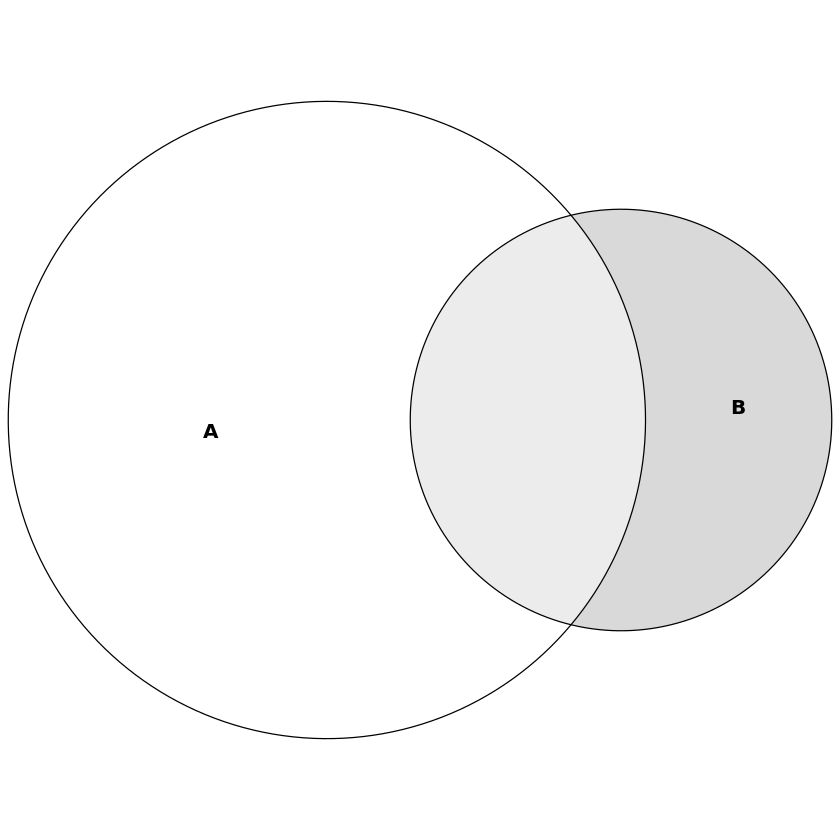

In [25]:
plot(fit1)

In [26]:
fgseaRes$clean_names <- fgseaRes$pathway %>%
                        gsub(pattern = "HALLMARK\\_", replacement = "") %>%
                        gsub(pattern = "\\_", replacement = " ") %>%
                        str_to_title()
fgseaRes$clean_names

[1] "Apoptosis"                         "Complement"                       
 [3] "E2f Targets"                       "Epithelial Mesenchymal Transition"
 [5] "Estrogen Response Early"           "Estrogen Response Late"           
 [7] "G2m Checkpoint"                    "Hypoxia"                          
 [9] "Inflammatory Response"             "Kras Signaling Dn"                
[11] "Kras Signaling Up"                 "Mitotic Spindle"                  
[13] "Myogenesis"                        "Tnfa Signaling Via Nfkb"

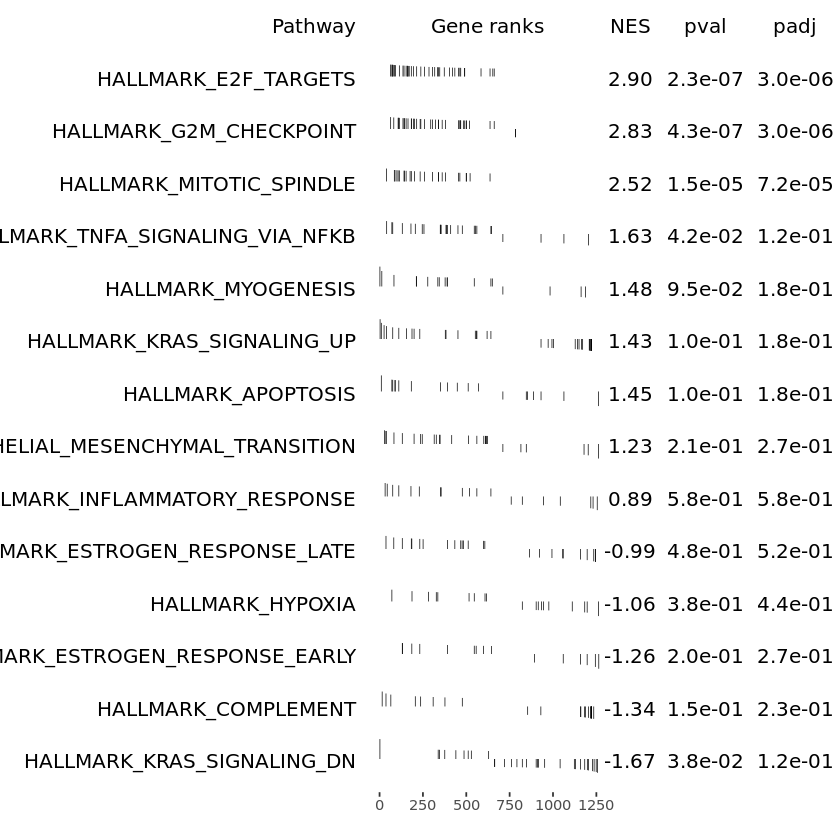

In [27]:
topPathwaysUp <- fgseaRes[ES > 0][head(order(pval), n=20), pathway]
topPathwaysDown <- fgseaRes[ES < 0][head(order(pval), n=20), pathway]
topPathways <- c(topPathwaysUp, rev(topPathwaysDown))
plotGseaTable(pathwaysH[topPathways], named_num_ranks, fgseaRes, 
              gseaParam=0.5)

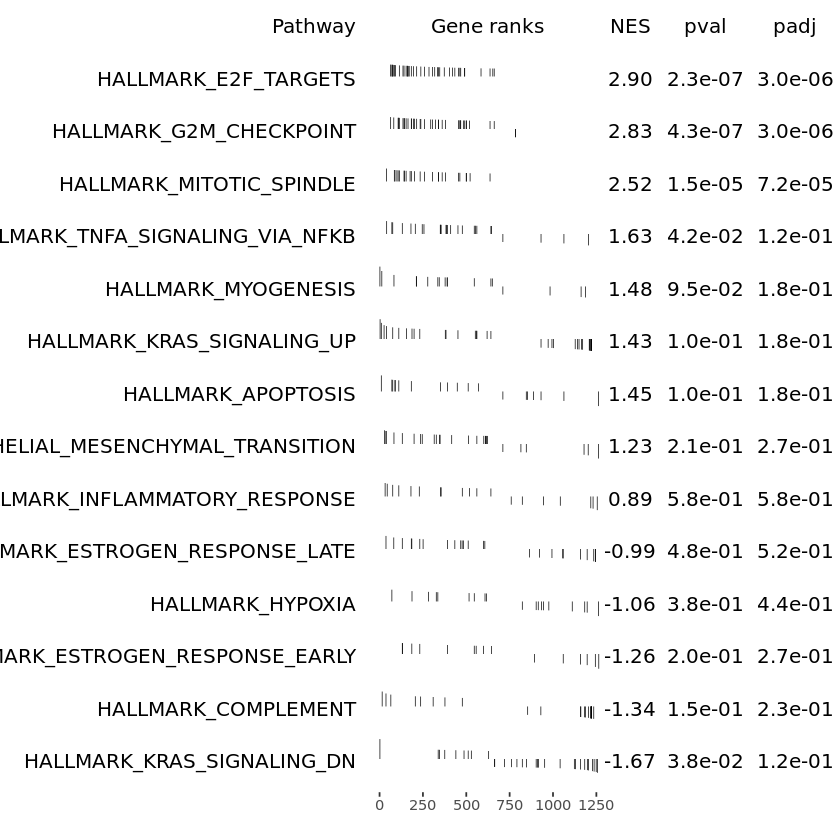

In [28]:
plotGseaTable(pathwaysH[topPathways], named_num_ranks, fgseaRes, 
              gseaParam=0.5)

In [29]:
p <- plotGseaTable(pathwaysH[topPathways], named_num_ranks, fgseaRes, 
              gseaParam=0.5, render = FALSE)

In [30]:
library("grid")
library("ggplotify")

In [31]:
plotting_df <- data.frame(gene = MCF10A_ex9vex20_resSig_padj$symbols, 
                          log2FoldChange = MCF10A_ex9vex20_resSig_padj$log2FoldChange) %>%
               na.omit() %>% arrange(desc(log2FoldChange)) %>% mutate(ranks = c(1:944))
plotting_df$ranks <- as.numeric(plotting_df$ranks)
plotting_df

gene,log2FoldChange,ranks
<chr>,<dbl>,<dbl>
MTARC2,13.707492,1
RYR1,9.423021,2
SNAP91,9.340920,3
GBGT1,9.340105,4
IGFBP7-AS1,8.736623,5
PLCL2,8.196606,6
ZNF69,8.195358,7
ZNF569,7.167326,8
ATP8A2,6.393813,9


In [32]:
fgseaRes

pathway,pval,padj,log2err,ES,NES,size,leadingEdge,clean_names
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<list>,<chr>
HALLMARK_APOPTOSIS,1.046312e-01,1.831046e-01,0.17978232,0.3607927,1.4517323,19,"CCND2 , ATF3 , IL1B , NEDD9 , IGFBP6, EREG , TOP2A",Apoptosis
HALLMARK_COMPLEMENT,1.478873e-01,2.300469e-01,0.17669427,-0.3227555,-1.3393422,16,"S100A9 , CFB , SERPINB2, CD36 , C3 , MMP13",Complement
HALLMARK_E2F_TARGETS,2.293281e-07,2.997109e-06,0.69013246,0.5574101,2.8956836,37,"MYBL2 , SPC25 , RRM2 , CDC20 , DLGAP5 , KIF18B , BIRC5 , HMMR , PLK1 , KIF2C , ASF1B , TK1 , CENPM , TOP2A , AURKB , CDKN3 , MKI67 , KIF4A , DEPDC1 , LMNB1 , BUB1B , CDCA3 , CCNB2 , GINS4 , SPC24 , SPAG5 , CIT , RNASEH2A, ESPL1 , CDK1 , PLK4 , RAD51AP1, MCM5",E2f Targets
HALLMARK_EPITHELIAL_MESENCHYMAL_TRANSITION,2.141653e-01,2.725740e-01,0.11988785,0.2709723,1.2256416,26,"VCAN , TFPI2 , THBS1 , COL6A3, AREG , FUCA1 , FN1 , GEM , DPYSL3, CCN2 , IGFBP2, VIM , NT5E , COL8A2, INHBA , FSTL1 , LOXL1 , CDH2 , COL5A1, MATN3",Epithelial Mesenchymal Transition
HALLMARK_ESTROGEN_RESPONSE_EARLY,2.027972e-01,2.725740e-01,0.14826150,-0.3074792,-1.2554373,15,"OLFML3 , KLK10 , SULT2B1, KRT13",Estrogen Response Early
HALLMARK_ESTROGEN_RESPONSE_LATE,4.830097e-01,5.201643e-01,0.09167952,-0.1979199,-0.9862912,25,"CXCL14 , KLK10 , S100A9 , SULT2B1, KRT13",Estrogen Response Late
HALLMARK_G2M_CHECKPOINT,4.281584e-07,2.997109e-06,0.67496286,0.5496879,2.8262410,36,"MYBL2, CDC20, NEK2 , UBE2C, BIRC5, HMMR , PLK1 , BUB1 , KIF2C, TROAP, TOP2A, CDC45, AURKB, TTK , CDKN3, PRC1 , MKI67, KIF4A, CCNA2, LMNB1, EXO1 , CCNB2, NDC80, KIF23, CENPF, ESPL1, CDK1 , KNL1 , PLK4 , CDC6 , MCM5 , KIF15, POLQ",G2m Checkpoint
HALLMARK_HYPOXIA,3.770883e-01,4.399364e-01,0.10552094,-0.2376856,-1.0608377,19,"BGN , SULT2B1 , EDN2 , SELENBP1, VLDLR , ADM , DDIT4 , STC1 , PKP1",Hypoxia
HALLMARK_INFLAMMATORY_RESPONSE,5.849057e-01,5.849057e-01,0.06350080,0.2219659,0.8931307,19,"CD40 , CD70 , IL1B , EREG , PTGER4, SELL",Inflammatory Response


In [33]:
plotting_df_list <- list()
for (i in 1:nrow(fgseaRes)) {
    temp_df <- as.data.frame(unlist(fgseaRes[i,8]))
    temp_df <- mutate(temp_df, pathway = rep(c(fgseaRes[i,9]), nrow(temp_df)))
    names(temp_df) <- c("gene", "pathway")
    temp_df <- merge(temp_df, plotting_df, by = "gene")
    temp_df$pathway <- as.character(temp_df$pathway)
    plotting_df_list[[i]] <- temp_df
}

str(plotting_df_list)

List of 14
 $ :'data.frame':	7 obs. of  4 variables:
  ..$ gene          : chr [1:7] "ATF3" "CCND2" "EREG" "IGFBP6" ...
  ..$ pathway       : chr [1:7] "Apoptosis" "Apoptosis" "Apoptosis" "Apoptosis" ...
  ..$ log2FoldChange: num [1:7] 3.31 6.17 2.96 3.09 3.22 ...
  ..$ ranks         : num [1:7] 63 10 96 81 68 80 158
 $ :'data.frame':	6 obs. of  4 variables:
  ..$ gene          : chr [1:6] "C3" "CD36" "CFB" "MMP13" ...
  ..$ pathway       : chr [1:6] "Complement" "Complement" "Complement" "Complement" ...
  ..$ log2FoldChange: num [1:6] -2.83 -2.87 -3.35 -2.66 -3.65 ...
  ..$ ranks         : num [1:6] 867 871 900 851 912 889
 $ :'data.frame':	33 obs. of  4 variables:
  ..$ gene          : chr [1:33] "ASF1B" "AURKB" "BIRC5" "BUB1B" ...
  ..$ pathway       : chr [1:33] "E2f Targets" "E2f Targets" "E2f Targets" "E2f Targets" ...
  ..$ log2FoldChange: num [1:33] 2.67 2.53 2.93 2.1 2.03 ...
  ..$ ranks         : num [1:33] 137 168 98 269 288 73 283 386 184 147 ...
 $ :'data.frame':	20 obs. 

In [34]:
BigPlotting_df <- rbind(
                  plotting_df_list[[1]],
                  plotting_df_list[[2]],
                  plotting_df_list[[3]],
                  plotting_df_list[[4]],
                  plotting_df_list[[5]],
                  plotting_df_list[[6]],
                  plotting_df_list[[7]],
                  plotting_df_list[[8]],
                  plotting_df_list[[9]],
                  plotting_df_list[[10]],
                  plotting_df_list[[11]],
                  plotting_df_list[[12]],
                  plotting_df_list[[13]],
                  plotting_df_list[[14]])
str(BigPlotting_df %>% filter(pathway == "Kras Signaling Up"))

'data.frame':	10 obs. of  4 variables:
 $ gene          : chr  "AKAP12" "ANO1" "CCND2" "DOCK2" ...
 $ pathway       : chr  "Kras Signaling Up" "Kras Signaling Up" "Kras Signaling Up" "Kras Signaling Up" ...
 $ log2FoldChange: num  2.55 2.7 6.17 3.98 2.96 ...
 $ ranks         : num  161 134 10 38 96 171 25 68 200 3


In [35]:
library("ggh4x")

In [36]:
BigPlotting_df$pathway <- gsub(BigPlotting_df$pathway, pattern = " ", replacement = "\n")

Warning message in geom_col(aes(x = ranks, y = log2FoldChange, width = 1.5)):
“Ignoring unknown aesthetics: width”
Warning message:
“Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead.”
Warning message:
“`position_stack()` requires non-overlapping x intervals”
Warning message:
“`position_stack()` requires non-overlapping x intervals”
Warning message:
“`position_stack()` requires non-overlapping x intervals”
Warning message:
“`position_stack()` requires non-overlapping x intervals”
Warning message:
“`position_stack()` requires non-overlapping x intervals”
Warning message:
“`position_stack()` requires non-overlapping x intervals”
Warning message:
“`position_stack()` requires non-overlapping x intervals”


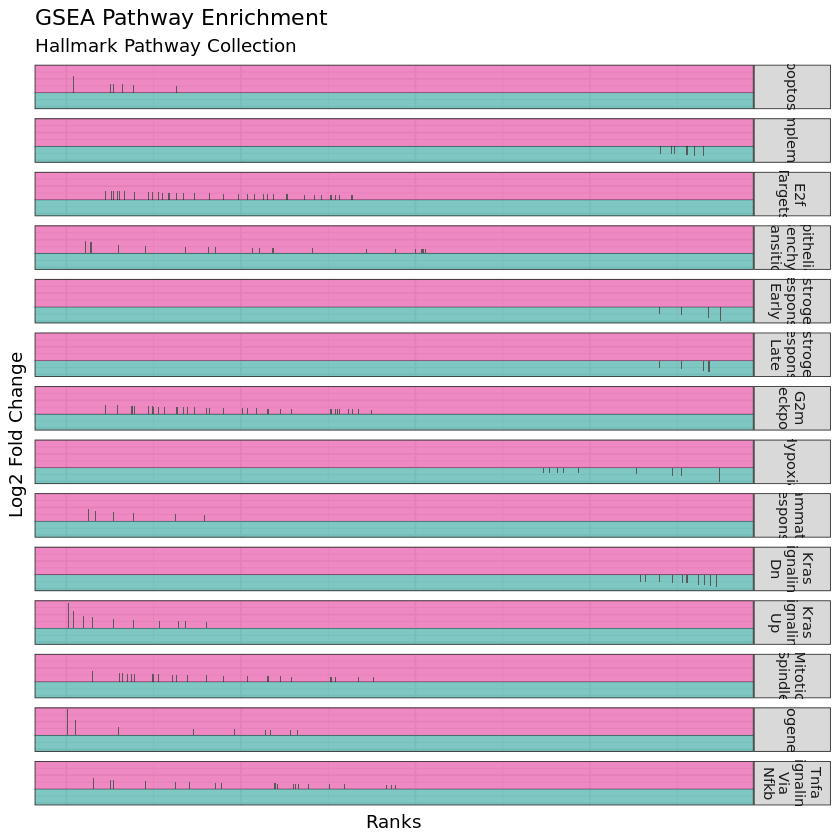

In [37]:
p <- ggplot(BigPlotting_df) + 
     annotate("rect", ymin = 0, ymax = Inf, xmin = -Inf, xmax = Inf,
              fill = "#E01488", alpha = 0.5) + 
     annotate("rect", ymin = -Inf, ymax = 0, xmin = -Inf, xmax = Inf,
              fill = "#009086", alpha = 0.5) + 
     geom_col(aes(x = ranks, y = log2FoldChange, width = 1.5)) +
     geom_hline(yintercept = 0, color = "black", size = .1) +
     theme_bw() + theme(axis.ticks = element_blank(), axis.text = element_blank()) + 
     ggtitle("GSEA Pathway Enrichment", "Hallmark Pathway Collection") + 
     ylab("Log2 Fold Change") + xlab("Ranks") +
     facet_grid(rows = vars(pathway)) + 
     scale_color_manual(name = "Gene Expression", breaks = c("E545K", "H1047R"),
                        values =  c("E545K" = "#E01488", "H1047R" = "#009086")) +
     theme(legend.title=element_text(size=20), legend.text=element_text(size=14)) +
     theme(strip.text.x = element_text(margin = margin(5,5,5,5, "cm")))
p

In [38]:
BigPlotting_df$Genotype <- if_else(BigPlotting_df$log2FoldChange > 0, "E545K", "H1047R")
BigPlotting_df

gene,pathway,log2FoldChange,ranks,Genotype
<chr>,<chr>,<dbl>,<dbl>,<chr>
ATF3,Apoptosis,3.312868,63,E545K
CCND2,Apoptosis,6.170724,10,E545K
EREG,Apoptosis,2.956083,96,E545K
IGFBP6,Apoptosis,3.090283,81,E545K
IL1B,Apoptosis,3.216216,68,E545K
NEDD9,Apoptosis,3.091235,80,E545K
TOP2A,Apoptosis,2.581906,158,E545K
C3,Complement,-2.829625,867,H1047R
CD36,Complement,-2.873040,871,H1047R


In [39]:
BigPlotting_df_E545K <- BigPlotting_df %>%
                        filter(Genotype == "E545K")
str(BigPlotting_df_E545K)
BigPlotting_df_H1047R <- BigPlotting_df %>%
                        filter(Genotype == "H1047R")
str(BigPlotting_df_H1047R)

'data.frame':	161 obs. of  5 variables:
 $ gene          : chr  "ATF3" "CCND2" "EREG" "IGFBP6" ...
 $ pathway       : chr  "Apoptosis" "Apoptosis" "Apoptosis" "Apoptosis" ...
 $ log2FoldChange: num  3.31 6.17 2.96 3.09 3.22 ...
 $ ranks         : num  63 10 96 81 68 80 158 137 168 98 ...
 $ Genotype      : chr  "E545K" "E545K" "E545K" "E545K" ...
'data.frame':	34 obs. of  5 variables:
 $ gene          : chr  "C3" "CD36" "CFB" "MMP13" ...
 $ pathway       : chr  "Complement" "Complement" "Complement" "Complement" ...
 $ log2FoldChange: num  -2.83 -2.87 -3.35 -2.66 -3.65 ...
 $ ranks         : num  867 871 900 851 912 889 920 849 937 881 ...
 $ Genotype      : chr  "H1047R" "H1047R" "H1047R" "H1047R" ...


In [40]:
BigPlotting_df_E545K$pathway <- as.factor(BigPlotting_df_E545K$pathway)
BigPlotting_df_H1047R$pathway <- as.factor(BigPlotting_df_H1047R$pathway)

In [41]:
sumdata_E545K <- BigPlotting_df_E545K %>%  group_by(pathway) %>%
  summarise(gene_count = length(pathway))
str(sumdata_E545K)
sumdata_H1047R <- BigPlotting_df_H1047R %>%  group_by(pathway) %>%
  summarise(gene_count = length(pathway))
sumdata_H1047R

tibble [9 × 2] (S3: tbl_df/tbl/data.frame)
 $ pathway   : Factor w/ 9 levels "Apoptosis","E2f\nTargets",..: 1 2 3 4 5 6 7 8 9
 $ gene_count: int [1:9] 7 33 20 33 6 10 23 9 20


pathway,gene_count
<fct>,<int>
Complement,6
Estrogen Response Early,4
Estrogen Response Late,5
Hypoxia,9
Kras Signaling Dn,10


In [42]:
sumdata_E545K$Genotype <- c(rep("E545K", 9))
sumdata_H1047R$Genotype <- c(rep("H1047R", 5))

In [43]:
sumdata_E545K$clean_names <- str_replace_all(sumdata_E545K$pathway, pattern = "\n",
                                         replacement = " ")
sumdata_E545K$clean_names
sumdata_H1047R$clean_names <- str_replace_all(sumdata_H1047R$pathway, pattern = "\n",
                                         replacement = " ")
sumdata_H1047R

[1] "Apoptosis"                         "E2f Targets"                      
[3] "Epithelial Mesenchymal Transition" "G2m Checkpoint"                   
[5] "Inflammatory Response"             "Kras Signaling Up"                
[7] "Mitotic Spindle"                   "Myogenesis"                       
[9] "Tnfa Signaling Via Nfkb"

pathway,gene_count,Genotype,clean_names
<fct>,<int>,<chr>,<chr>
Complement,6,H1047R,Complement
Estrogen Response Early,4,H1047R,Estrogen Response Early
Estrogen Response Late,5,H1047R,Estrogen Response Late
Hypoxia,9,H1047R,Hypoxia
Kras Signaling Dn,10,H1047R,Kras Signaling Dn


In [44]:
fgseaRes_df <- as.data.frame(fgseaRes)
fgseaRes_df$clean_names

[1] "Apoptosis"                         "Complement"                       
 [3] "E2f Targets"                       "Epithelial Mesenchymal Transition"
 [5] "Estrogen Response Early"           "Estrogen Response Late"           
 [7] "G2m Checkpoint"                    "Hypoxia"                          
 [9] "Inflammatory Response"             "Kras Signaling Dn"                
[11] "Kras Signaling Up"                 "Mitotic Spindle"                  
[13] "Myogenesis"                        "Tnfa Signaling Via Nfkb"

In [45]:
sumdata_E545K <- left_join(x = sumdata_E545K, y = fgseaRes_df,
                           join_by(clean_names))
sumdata_E545K

pathway.x,gene_count,Genotype,clean_names,pathway.y,pval,padj,log2err,ES,NES,size,leadingEdge
<fct>,<int>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<list>
Apoptosis,7,E545K,Apoptosis,HALLMARK_APOPTOSIS,1.046312e-01,1.831046e-01,0.1797823,0.3607927,1.4517323,19,"CCND2 , ATF3 , IL1B , NEDD9 , IGFBP6, EREG , TOP2A"
E2f Targets,33,E545K,E2f Targets,HALLMARK_E2F_TARGETS,2.293281e-07,2.997109e-06,0.6901325,0.5574101,2.8956836,37,"MYBL2 , SPC25 , RRM2 , CDC20 , DLGAP5 , KIF18B , BIRC5 , HMMR , PLK1 , KIF2C , ASF1B , TK1 , CENPM , TOP2A , AURKB , CDKN3 , MKI67 , KIF4A , DEPDC1 , LMNB1 , BUB1B , CDCA3 , CCNB2 , GINS4 , SPC24 , SPAG5 , CIT , RNASEH2A, ESPL1 , CDK1 , PLK4 , RAD51AP1, MCM5"
Epithelial Mesenchymal Transition,20,E545K,Epithelial Mesenchymal Transition,HALLMARK_EPITHELIAL_MESENCHYMAL_TRANSITION,2.141653e-01,2.725740e-01,0.1198878,0.2709723,1.2256416,26,"VCAN , TFPI2 , THBS1 , COL6A3, AREG , FUCA1 , FN1 , GEM , DPYSL3, CCN2 , IGFBP2, VIM , NT5E , COL8A2, INHBA , FSTL1 , LOXL1 , CDH2 , COL5A1, MATN3"
G2m Checkpoint,33,E545K,G2m Checkpoint,HALLMARK_G2M_CHECKPOINT,4.281584e-07,2.997109e-06,0.6749629,0.5496879,2.8262410,36,"MYBL2, CDC20, NEK2 , UBE2C, BIRC5, HMMR , PLK1 , BUB1 , KIF2C, TROAP, TOP2A, CDC45, AURKB, TTK , CDKN3, PRC1 , MKI67, KIF4A, CCNA2, LMNB1, EXO1 , CCNB2, NDC80, KIF23, CENPF, ESPL1, CDK1 , KNL1 , PLK4 , CDC6 , MCM5 , KIF15, POLQ"
Inflammatory Response,6,E545K,Inflammatory Response,HALLMARK_INFLAMMATORY_RESPONSE,5.849057e-01,5.849057e-01,0.0635008,0.2219659,0.8931307,19,"CD40 , CD70 , IL1B , EREG , PTGER4, SELL"
Kras Signaling Up,10,E545K,Kras Signaling Up,HALLMARK_KRAS_SIGNALING_UP,1.036184e-01,1.831046e-01,0.1766943,0.2996412,1.4279019,30,"SNAP91, CCND2 , GNG11 , DOCK2 , IL1B , EREG , ANO1 , AKAP12, FUCA1 , SEMA3B"
Mitotic Spindle,23,E545K,Mitotic Spindle,HALLMARK_MITOTIC_SPINDLE,1.541339e-05,7.192915e-05,0.5756103,0.5737613,2.5245496,24,"DOCK2 , DLGAP5, NEDD9 , ANLN , NEK2 , BIRC5 , PLK1 , BUB1 , KIF2C , PIF1 , TOP2A , TTK , PRC1 , KIF4A , LMNB1 , CCNB2 , NDC80 , KIF23 , CENPF , ESPL1 , CDK1 , KIF15 , FSCN1"
Myogenesis,9,E545K,Myogenesis,HALLMARK_MYOGENESIS,9.548611e-02,1.831046e-01,0.1900233,0.3895230,1.4765916,16,"RYR1 , CTF1 , COL6A3, LSP1 , SCD , PYGM , FDPS , AEBP1 , NCAM1"
Tnfa Signaling Via Nfkb,20,E545K,Tnfa Signaling Via Nfkb,HALLMARK_TNFA_SIGNALING_VIA_NFKB,4.234031e-02,1.185529e-01,0.3217759,0.3603091,1.6297231,26,"NR4A3 , ATF3 , IL1B , AREG , PTGER4 , DUSP5 , GEM , FOSB , NR4A1 , IL1A , LDLR , PTGS2 , DUSP4 , EGR3 , FOSL1 , TRIB1 , OLR1 , BHLHE40, EGR2 , INHBA"


In [46]:
sumdata_H1047R <- left_join(x = sumdata_H1047R, y = fgseaRes_df,
                           join_by(clean_names))
sumdata_H1047R

pathway.x,gene_count,Genotype,clean_names,pathway.y,pval,padj,log2err,ES,NES,size,leadingEdge
<fct>,<int>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<list>
Complement,6,H1047R,Complement,HALLMARK_COMPLEMENT,0.14788732,0.2300469,0.17669427,-0.3227555,-1.3393422,16,"S100A9 , CFB , SERPINB2, CD36 , C3 , MMP13"
Estrogen Response Early,4,H1047R,Estrogen Response Early,HALLMARK_ESTROGEN_RESPONSE_EARLY,0.20279720,0.2725740,0.14826150,-0.3074792,-1.2554373,15,"OLFML3 , KLK10 , SULT2B1, KRT13"
Estrogen Response Late,5,H1047R,Estrogen Response Late,HALLMARK_ESTROGEN_RESPONSE_LATE,0.48300971,0.5201643,0.09167952,-0.1979199,-0.9862912,25,"CXCL14 , KLK10 , S100A9 , SULT2B1, KRT13"
Hypoxia,9,H1047R,Hypoxia,HALLMARK_HYPOXIA,0.37708831,0.4399364,0.10552094,-0.2376856,-1.0608377,19,"BGN , SULT2B1 , EDN2 , SELENBP1, VLDLR , ADM , DDIT4 , STC1 , PKP1"
Kras Signaling Dn,10,H1047R,Kras Signaling Dn,HALLMARK_KRAS_SIGNALING_DN,0.03826711,0.1185529,0.32177592,-0.3112701,-1.6662691,31,"KLK7 , CALML5 , KLK8 , KRT4 , SERPINB2, CLDN8 , EDN2 , KRT13 , RGS11 , SELENOP"


In [47]:
total_sumdata <- rbind(sumdata_E545K, sumdata_H1047R)
total_sumdata

pathway.x,gene_count,Genotype,clean_names,pathway.y,pval,padj,log2err,ES,NES,size,leadingEdge
<fct>,<int>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<list>
Apoptosis,7,E545K,Apoptosis,HALLMARK_APOPTOSIS,1.046312e-01,1.831046e-01,0.17978232,0.3607927,1.4517323,19,"CCND2 , ATF3 , IL1B , NEDD9 , IGFBP6, EREG , TOP2A"
E2f Targets,33,E545K,E2f Targets,HALLMARK_E2F_TARGETS,2.293281e-07,2.997109e-06,0.69013246,0.5574101,2.8956836,37,"MYBL2 , SPC25 , RRM2 , CDC20 , DLGAP5 , KIF18B , BIRC5 , HMMR , PLK1 , KIF2C , ASF1B , TK1 , CENPM , TOP2A , AURKB , CDKN3 , MKI67 , KIF4A , DEPDC1 , LMNB1 , BUB1B , CDCA3 , CCNB2 , GINS4 , SPC24 , SPAG5 , CIT , RNASEH2A, ESPL1 , CDK1 , PLK4 , RAD51AP1, MCM5"
Epithelial Mesenchymal Transition,20,E545K,Epithelial Mesenchymal Transition,HALLMARK_EPITHELIAL_MESENCHYMAL_TRANSITION,2.141653e-01,2.725740e-01,0.11988785,0.2709723,1.2256416,26,"VCAN , TFPI2 , THBS1 , COL6A3, AREG , FUCA1 , FN1 , GEM , DPYSL3, CCN2 , IGFBP2, VIM , NT5E , COL8A2, INHBA , FSTL1 , LOXL1 , CDH2 , COL5A1, MATN3"
G2m Checkpoint,33,E545K,G2m Checkpoint,HALLMARK_G2M_CHECKPOINT,4.281584e-07,2.997109e-06,0.67496286,0.5496879,2.8262410,36,"MYBL2, CDC20, NEK2 , UBE2C, BIRC5, HMMR , PLK1 , BUB1 , KIF2C, TROAP, TOP2A, CDC45, AURKB, TTK , CDKN3, PRC1 , MKI67, KIF4A, CCNA2, LMNB1, EXO1 , CCNB2, NDC80, KIF23, CENPF, ESPL1, CDK1 , KNL1 , PLK4 , CDC6 , MCM5 , KIF15, POLQ"
Inflammatory Response,6,E545K,Inflammatory Response,HALLMARK_INFLAMMATORY_RESPONSE,5.849057e-01,5.849057e-01,0.06350080,0.2219659,0.8931307,19,"CD40 , CD70 , IL1B , EREG , PTGER4, SELL"
Kras Signaling Up,10,E545K,Kras Signaling Up,HALLMARK_KRAS_SIGNALING_UP,1.036184e-01,1.831046e-01,0.17669427,0.2996412,1.4279019,30,"SNAP91, CCND2 , GNG11 , DOCK2 , IL1B , EREG , ANO1 , AKAP12, FUCA1 , SEMA3B"
Mitotic Spindle,23,E545K,Mitotic Spindle,HALLMARK_MITOTIC_SPINDLE,1.541339e-05,7.192915e-05,0.57561026,0.5737613,2.5245496,24,"DOCK2 , DLGAP5, NEDD9 , ANLN , NEK2 , BIRC5 , PLK1 , BUB1 , KIF2C , PIF1 , TOP2A , TTK , PRC1 , KIF4A , LMNB1 , CCNB2 , NDC80 , KIF23 , CENPF , ESPL1 , CDK1 , KIF15 , FSCN1"
Myogenesis,9,E545K,Myogenesis,HALLMARK_MYOGENESIS,9.548611e-02,1.831046e-01,0.19002331,0.3895230,1.4765916,16,"RYR1 , CTF1 , COL6A3, LSP1 , SCD , PYGM , FDPS , AEBP1 , NCAM1"
Tnfa Signaling Via Nfkb,20,E545K,Tnfa Signaling Via Nfkb,HALLMARK_TNFA_SIGNALING_VIA_NFKB,4.234031e-02,1.185529e-01,0.32177592,0.3603091,1.6297231,26,"NR4A3 , ATF3 , IL1B , AREG , PTGER4 , DUSP5 , GEM , FOSB , NR4A1 , IL1A , LDLR , PTGS2 , DUSP4 , EGR3 , FOSL1 , TRIB1 , OLR1 , BHLHE40, EGR2 , INHBA"


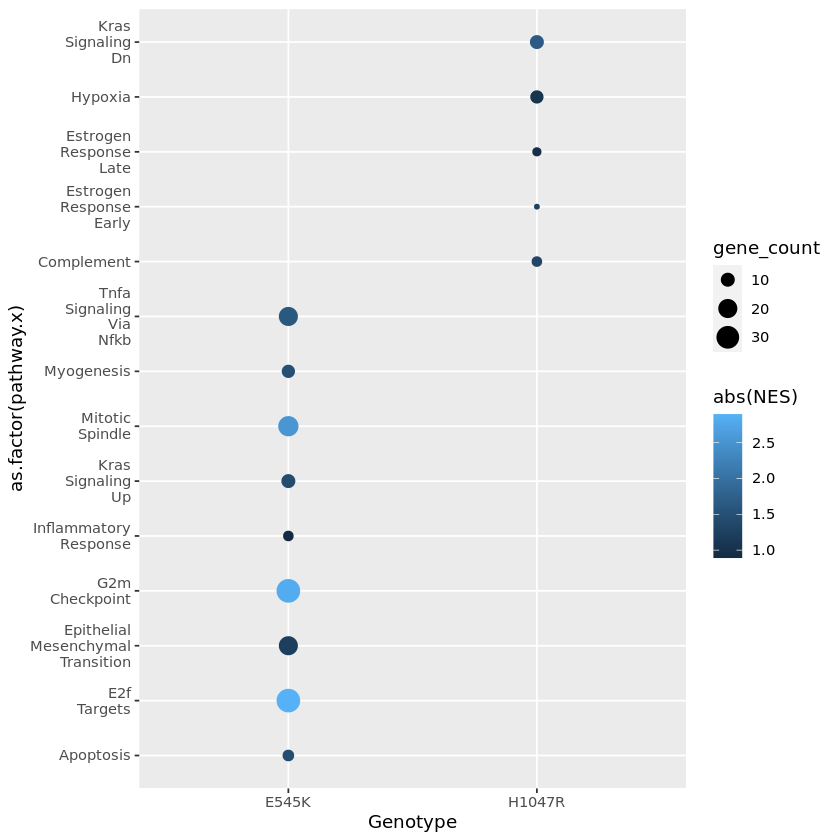

In [48]:
total_sumdata %>% ggplot() +
    geom_point(aes(x = Genotype, y = as.factor(pathway.x),
                     size = gene_count, color = abs(NES))
               )

In [49]:
fgseaRes_df

pathway,pval,padj,log2err,ES,NES,size,leadingEdge,clean_names
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<list>,<chr>
HALLMARK_APOPTOSIS,1.046312e-01,1.831046e-01,0.17978232,0.3607927,1.4517323,19,"CCND2 , ATF3 , IL1B , NEDD9 , IGFBP6, EREG , TOP2A",Apoptosis
HALLMARK_COMPLEMENT,1.478873e-01,2.300469e-01,0.17669427,-0.3227555,-1.3393422,16,"S100A9 , CFB , SERPINB2, CD36 , C3 , MMP13",Complement
HALLMARK_E2F_TARGETS,2.293281e-07,2.997109e-06,0.69013246,0.5574101,2.8956836,37,"MYBL2 , SPC25 , RRM2 , CDC20 , DLGAP5 , KIF18B , BIRC5 , HMMR , PLK1 , KIF2C , ASF1B , TK1 , CENPM , TOP2A , AURKB , CDKN3 , MKI67 , KIF4A , DEPDC1 , LMNB1 , BUB1B , CDCA3 , CCNB2 , GINS4 , SPC24 , SPAG5 , CIT , RNASEH2A, ESPL1 , CDK1 , PLK4 , RAD51AP1, MCM5",E2f Targets
HALLMARK_EPITHELIAL_MESENCHYMAL_TRANSITION,2.141653e-01,2.725740e-01,0.11988785,0.2709723,1.2256416,26,"VCAN , TFPI2 , THBS1 , COL6A3, AREG , FUCA1 , FN1 , GEM , DPYSL3, CCN2 , IGFBP2, VIM , NT5E , COL8A2, INHBA , FSTL1 , LOXL1 , CDH2 , COL5A1, MATN3",Epithelial Mesenchymal Transition
HALLMARK_ESTROGEN_RESPONSE_EARLY,2.027972e-01,2.725740e-01,0.14826150,-0.3074792,-1.2554373,15,"OLFML3 , KLK10 , SULT2B1, KRT13",Estrogen Response Early
HALLMARK_ESTROGEN_RESPONSE_LATE,4.830097e-01,5.201643e-01,0.09167952,-0.1979199,-0.9862912,25,"CXCL14 , KLK10 , S100A9 , SULT2B1, KRT13",Estrogen Response Late
HALLMARK_G2M_CHECKPOINT,4.281584e-07,2.997109e-06,0.67496286,0.5496879,2.8262410,36,"MYBL2, CDC20, NEK2 , UBE2C, BIRC5, HMMR , PLK1 , BUB1 , KIF2C, TROAP, TOP2A, CDC45, AURKB, TTK , CDKN3, PRC1 , MKI67, KIF4A, CCNA2, LMNB1, EXO1 , CCNB2, NDC80, KIF23, CENPF, ESPL1, CDK1 , KNL1 , PLK4 , CDC6 , MCM5 , KIF15, POLQ",G2m Checkpoint
HALLMARK_HYPOXIA,3.770883e-01,4.399364e-01,0.10552094,-0.2376856,-1.0608377,19,"BGN , SULT2B1 , EDN2 , SELENBP1, VLDLR , ADM , DDIT4 , STC1 , PKP1",Hypoxia
HALLMARK_INFLAMMATORY_RESPONSE,5.849057e-01,5.849057e-01,0.06350080,0.2219659,0.8931307,19,"CD40 , CD70 , IL1B , EREG , PTGER4, SELL",Inflammatory Response


In [50]:
library(scales)


Attaching package: ‘scales’


The following object is masked from ‘package:purrr’:

    discard


The following object is masked from ‘package:readr’:

    col_factor




In [51]:
fgseaRes_df$clean_names <- str_replace(string = fgseaRes_df$clean_names,
                           pattern = "Epithelial Mesenchymal Transition", 
                           replacement = "Epithelial Mesenchymal\nTransition")

In [52]:
fgseaRes_df_arrange <- fgseaRes_df %>% arrange(`NES`)
fgseaRes_df_arrange

pathway,pval,padj,log2err,ES,NES,size,leadingEdge,clean_names
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<list>,<chr>
HALLMARK_KRAS_SIGNALING_DN,3.826711e-02,1.185529e-01,0.32177592,-0.3112701,-1.6662691,31,"KLK7 , CALML5 , KLK8 , KRT4 , SERPINB2, CLDN8 , EDN2 , KRT13 , RGS11 , SELENOP",Kras Signaling Dn
HALLMARK_COMPLEMENT,1.478873e-01,2.300469e-01,0.17669427,-0.3227555,-1.3393422,16,"S100A9 , CFB , SERPINB2, CD36 , C3 , MMP13",Complement
HALLMARK_ESTROGEN_RESPONSE_EARLY,2.027972e-01,2.725740e-01,0.14826150,-0.3074792,-1.2554373,15,"OLFML3 , KLK10 , SULT2B1, KRT13",Estrogen Response Early
HALLMARK_HYPOXIA,3.770883e-01,4.399364e-01,0.10552094,-0.2376856,-1.0608377,19,"BGN , SULT2B1 , EDN2 , SELENBP1, VLDLR , ADM , DDIT4 , STC1 , PKP1",Hypoxia
HALLMARK_ESTROGEN_RESPONSE_LATE,4.830097e-01,5.201643e-01,0.09167952,-0.1979199,-0.9862912,25,"CXCL14 , KLK10 , S100A9 , SULT2B1, KRT13",Estrogen Response Late
HALLMARK_INFLAMMATORY_RESPONSE,5.849057e-01,5.849057e-01,0.06350080,0.2219659,0.8931307,19,"CD40 , CD70 , IL1B , EREG , PTGER4, SELL",Inflammatory Response
HALLMARK_EPITHELIAL_MESENCHYMAL_TRANSITION,2.141653e-01,2.725740e-01,0.11988785,0.2709723,1.2256416,26,"VCAN , TFPI2 , THBS1 , COL6A3, AREG , FUCA1 , FN1 , GEM , DPYSL3, CCN2 , IGFBP2, VIM , NT5E , COL8A2, INHBA , FSTL1 , LOXL1 , CDH2 , COL5A1, MATN3",Epithelial Mesenchymal Transition
HALLMARK_KRAS_SIGNALING_UP,1.036184e-01,1.831046e-01,0.17669427,0.2996412,1.4279019,30,"SNAP91, CCND2 , GNG11 , DOCK2 , IL1B , EREG , ANO1 , AKAP12, FUCA1 , SEMA3B",Kras Signaling Up
HALLMARK_APOPTOSIS,1.046312e-01,1.831046e-01,0.17978232,0.3607927,1.4517323,19,"CCND2 , ATF3 , IL1B , NEDD9 , IGFBP6, EREG , TOP2A",Apoptosis


In [53]:
library(viridis)

Loading required package: viridisLite


Attaching package: ‘viridis’


The following object is masked from ‘package:scales’:

    viridis_pal




In [54]:
saveRDS(fgseaRes_df_arrange, file = "MCF10A_GSEApaths.rds")
getwd()

[1] "/gpfs52/data/park_lab/adam/Total_RNA"

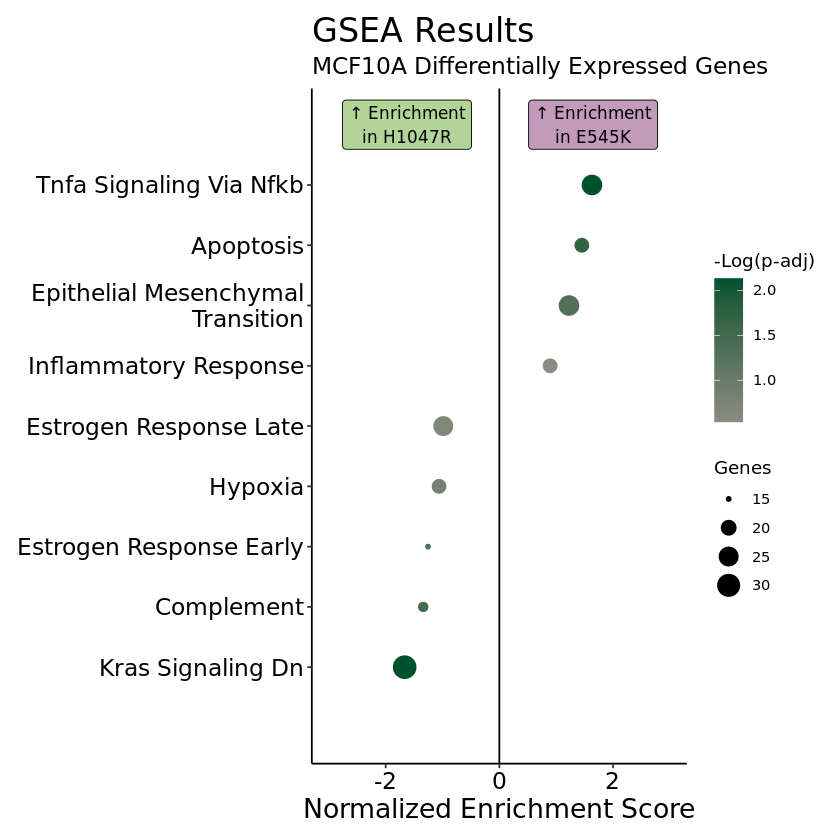

In [79]:
forestp <- fgseaRes_df_arrange %>% 
    filter(!pathway == c("HALLMARK_G2M_CHECKPOINT",
                         "HALLMARK_E2F_TARGETS")) %>%
    filter(!pathway == c("HALLMARK_MYOGENESIS")) %>%
    filter(!pathway == c("HALLMARK_MITOTIC_SPINDLE")) %>%
    filter(!pathway == c("HALLMARK_KRAS_SIGNALING_UP")) %>%
    filter(!pathway == c("HALLMARK_KRAS_SIGNALING_UP")) %>%
    ggplot(aes(x = NES, y = reorder(clean_names, NES))) +
    coord_cartesian(xlim = c(-3, 3),
                    ylim = c(0,10)) + geom_vline(xintercept = 0) +
    scale_color_gradient(low = "ivory4", #mid = "#F60F66",
                         high = "#00522F") +
#     annotate("rect", xmin = 0, ymin = -Inf, ymax = Inf, xmax = Inf, 
#                   fill = "#C29ABB", alpha = 0.5) +
#     annotate("rect", xmin = 0, ymin = -Inf, ymax = Inf, xmax = -Inf, 
#                   fill = "#B2D498", alpha = 0.5) +
    ylab(label = NULL) + xlab(label = "Normalized Enrichment Score") +
    geom_point(aes(color = -log(padj), size = size)) +
    ggtitle(label = "GSEA Results", subtitle = "MCF10A Differentially Expressed Genes") +
    annotate("label", x = 1.65, y = 10, label = "\U2191 Enrichment\nin E545K",
             size = 3.55, family = "Arial", color = "black", fill = "#C29ABB") +
    annotate("label", x = -1.625, y = 10, label = "\U2191 Enrichment\nin H1047R",
             size = 3.55, family = "Arial", color = "black", fill = "#B2D498") +
    labs(size = "Genes", color = "-Log(p-adj)") +
    theme_classic() + theme(text = element_text(family = "Arial"),
                          axis.title = element_text(size = 16),
                          axis.text = element_text(size = 14, colour = "black"),
                          plot.title = element_text(size = 20),
                          plot.subtitle = element_text(size = 14),
                          strip.text = element_text(size = 12),
#                           legend.position = "none",
#                           legend.text = element_text(size = 12),
#                           legend.title = element_text(size = 14),
                          plot.margin = margin(10, 10, 10, 10))
forestp

In [56]:
TCGA_fgsea_res

pathway,pval,padj,log2err,ES,NES,size,leadingEdge
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<list>
HALLMARK_ADIPOGENESIS,8.719383e-05,1.079125e-03,0.53843410,-0.44999550,-1.6328206,200,"ACADL , ADIG , CD36 , ADIPOQ , GPX3 , SORBS1 , LPL , LEP , CDKN2C , ITGA7 , PFKFB3 , HADH , MGLL , ALDH2 , ATP1B3 , LIPE , CHCHD10, GPAM , MRAP , PPARG , GBE1 , FABP4 , ABCA1 , ANGPT1 , UCP2 , ME1 , ACAA2 , ELOVL6 , CAT , PHYH , FZD4 , MCCC1 , TST , STAT5A , DHCR7 , PGM1 , ETFB , CIDEA , SOD1 , COQ3 , TKT , COQ9 , UQCRQ , COX7B , COX6A1 , ITIH5 , CS , RETSAT , MGST3 , ATP5PO , UQCR10 , APOE , ENPP2 , ECHS1 , DECR1 , ECH1 , SLC25A1, ADIPOR2, SLC1A5 , IDH3A , SAMM50 , RETN , NDUFS3 , IDH3G , ACOX1 , ACADS , LTC4S , ITSN1 , SUCLG1 , YWHAG , DDT , BCL6 , POR , UQCRC1 , DGAT1 , MTCH2 , REEP6 , DLAT"
HALLMARK_ALLOGRAFT_REJECTION,5.114943e-01,7.512315e-01,0.09821234,0.25245462,0.9744267,200,"CCL7 , MBL2 , IL6 , EREG , CXCL13 , IL13 , TGFB2 , CD80 , IRF7 , IL7 , PRKCG , FCGR2B , CCL2 , ICOSLG , IL4 , GPR65 , HDAC9 , KLRD1 , MMP9 , CCR1 , FYB1 , NCR1 , DYRK3 , CD40 , CD86 , HLA-DOA , TLR1 , HLA-DQA1, CCL13 , CRTAM , ST8SIA4 , CCL4 , NOS2 , LCP2 , F2R , FAS , RPL3L , CD28 , IL12A , CCR5 , SOCS5 , ACVR2A , TRAT1 , IL10 , PTPRC , BCAT1 , IL15 , INHBA , TLR3 , MAP3K7 , STAB1 , CD8A , TLR2 , SPI1 , STAT1 , IL1B , LYN , HLA-DRA , IGSF6 , B2M , TGFB1 , ITK , CXCL9 , CD3G , CTSS , IL11 , IL2RB , ITGB2 , CD2"
HALLMARK_ANDROGEN_RESPONSE,4.471545e-01,6.775068e-01,0.10282184,0.29080941,1.0066149,100,"KLK3 , NKX3-1 , KLK2 , HPGD , INPP4B , MAK , ADAMTS1, ALDH1A3, MERTK , SGK1 , SCD , GSR , SELENOP, HERC3 , KRT19 , SEC24D , TSC22D1, LIFR , PTPN21 , ARID5B , SRF , ANKH , ZBTB10 , SPDEF , NGLY1 , PTK2B , VAPA , B2M , IQGAP2 , MAP7 , KRT8"
HALLMARK_ANGIOGENESIS,8.925620e-02,2.137697e-01,0.19189224,-0.47777908,-1.3414652,36,"APOH , STC1 , LPL , VTN , PF4 , SERPINA5, JAG1 , TNFRSF21"
HALLMARK_APICAL_JUNCTION,7.834101e-01,1.000000e+00,0.04477489,-0.24237186,-0.8783035,199,"ACTN2 , CALB2 , CDH3 , ATP1A3 , COL9A1 , KCNH2 , SLC30A3, GNAI1 , CADM2 , NRAP , HADH , CDH15 , CDH8 , MDK , NRTN , PDZD3 , EGFR , NEGR1 , INSIG1 , ITGA3 , ITGB4 , GRB7 , NECTIN1, CDH1 , TUBG1"
HALLMARK_APICAL_SURFACE,9.477124e-02,2.153892e-01,0.18470647,-0.44794533,-1.3164287,44,"RHCG , ATP6V0A4, PCSK9 , NTNG1 , AFAP1L2 , DCBLD2 , SCUBE1 , BRCA1 , LYPD3 , CRYBG1 , AKAP7 , GHRL , MAL , ADIPOR2 , SRPX , FLOT2"
HALLMARK_APOPTOSIS,9.310345e-01,1.000000e+00,0.06598161,0.21430410,0.8081114,161,"IFNB1 , IL6 , EREG , ATF3 , TGFB2 , EGR3 , GUCY2D , BTG2 , NEDD9 , LEF1 , WEE1 , HGF , IER3 , PMAIP1 , BNIP3L , HMOX1 , SLC20A1, RHOT2 , EMP1 , JUN , GSR , RHOB , TIMP3 , PPT1 , DDIT3 , F2R , FAS , PLPPR4 , HSPB1 , PDCD4 , LUM , CD69 , ANKH , CLU , SMAD7 , PDGFRB , SOD2 , GADD45B, IL1B , NEFH , DPYD , DCN , ROCK1 , CDKN1B , GCH1 , CD2"
HALLMARK_BILE_ACID_METABOLISM,4.294574e-01,6.710271e-01,0.07380527,-0.30004987,-1.0161211,112,"SERPINA6, ABCG8 , AGXT , CYP8B1 , GC , RBP1 , ABCD2 , ACSL1 , LIPE , ABCA1 , HAO1 , FADS2 , SULT2B1 , ABCA4 , CAT , PHYH , SLC23A1 , HSD3B1 , ABCA8 , DHCR24 , SOD1 , PECR , PXMP2 , RETSAT , SULT1B1 , ALDH9A1"
HALLMARK_CHOLESTEROL_HOMEOSTASIS,4.207120e-01,6.710271e-01,0.07707367,-0.31999964,-1.0217650,74,"LPL , GNAI1 , ACAT2 , EBP , PPARG , ALDOC , FADS2 , CBS , TMEM97 , SQLE , NSDHL , DHCR7 , JAG1 , S100A11, FABP5 , PCYT2 , ACSS2 , ATF5 , ADH4 , TM7SF2 , AVPR1A , ECH1"


In [58]:
TCGA_fgsea_res$clean_names <- gsub(TCGA_fgsea_res$pathway, pattern = "HALLMARK_",
                                         replacement = "") %>%
                              gsub(pattern = "_", replacement = " ") %>% 
                              str_to_sentence()
TCGA_fgsea_res$clean_names

[1] "Adipogenesis"                      "Allograft rejection"              
 [3] "Androgen response"                 "Angiogenesis"                     
 [5] "Apical junction"                   "Apical surface"                   
 [7] "Apoptosis"                         "Bile acid metabolism"             
 [9] "Cholesterol homeostasis"           "Coagulation"                      
[11] "Complement"                        "Dna repair"                       
[13] "E2f targets"                       "Epithelial mesenchymal transition"
[15] "Estrogen response early"           "Estrogen response late"           
[17] "Fatty acid metabolism"             "G2m checkpoint"                   
[19] "Glycolysis"                        "Hedgehog signaling"               
[21] "Heme metabolism"                   "Hypoxia"                          
[23] "Il2 stat5 signaling"               "Il6 jak stat3 signaling"          
[25] "Inflammatory response"             "Interferon alpha response"        
[27] "Interferon gamma response"         "Kras signaling dn"                
[29] "Kras signaling up"                 "Mitotic spindle"                  
[31] "Mtorc1 signaling"                  "Myc targets v1"                   
[33] "Myc targets v2"                    "Myogenesis"                       
[35] "Notch signaling"                   "Oxidative phosphorylation"        
[37] "P53 pathway"                       "Pancreas beta cells"              
[39] "Peroxisome"                        "Pi3k akt mtor signaling"          
[41] "Protein secretion"                 "Reactive oxygen species pathway"  
[43] "Spermatogenesis"                   "Tgf beta signaling"               
[45] "Tnfa signaling via nfkb"           "Unfolded protein response"        
[47] "Uv response dn"                    "Uv response up"                   
[49] "Wnt beta catenin signaling"        "Xenobiotic metabolism"

In [60]:
fgseaRes_df_arrange

pathway,pval,padj,log2err,ES,NES,size,leadingEdge,clean_names
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<list>,<chr>
HALLMARK_KRAS_SIGNALING_DN,3.826711e-02,1.185529e-01,0.32177592,-0.3112701,-1.6662691,31,"KLK7 , CALML5 , KLK8 , KRT4 , SERPINB2, CLDN8 , EDN2 , KRT13 , RGS11 , SELENOP",Kras Signaling Dn
HALLMARK_COMPLEMENT,1.478873e-01,2.300469e-01,0.17669427,-0.3227555,-1.3393422,16,"S100A9 , CFB , SERPINB2, CD36 , C3 , MMP13",Complement
HALLMARK_ESTROGEN_RESPONSE_EARLY,2.027972e-01,2.725740e-01,0.14826150,-0.3074792,-1.2554373,15,"OLFML3 , KLK10 , SULT2B1, KRT13",Estrogen Response Early
HALLMARK_HYPOXIA,3.770883e-01,4.399364e-01,0.10552094,-0.2376856,-1.0608377,19,"BGN , SULT2B1 , EDN2 , SELENBP1, VLDLR , ADM , DDIT4 , STC1 , PKP1",Hypoxia
HALLMARK_ESTROGEN_RESPONSE_LATE,4.830097e-01,5.201643e-01,0.09167952,-0.1979199,-0.9862912,25,"CXCL14 , KLK10 , S100A9 , SULT2B1, KRT13",Estrogen Response Late
HALLMARK_INFLAMMATORY_RESPONSE,5.849057e-01,5.849057e-01,0.06350080,0.2219659,0.8931307,19,"CD40 , CD70 , IL1B , EREG , PTGER4, SELL",Inflammatory Response
HALLMARK_EPITHELIAL_MESENCHYMAL_TRANSITION,2.141653e-01,2.725740e-01,0.11988785,0.2709723,1.2256416,26,"VCAN , TFPI2 , THBS1 , COL6A3, AREG , FUCA1 , FN1 , GEM , DPYSL3, CCN2 , IGFBP2, VIM , NT5E , COL8A2, INHBA , FSTL1 , LOXL1 , CDH2 , COL5A1, MATN3",Epithelial Mesenchymal Transition
HALLMARK_KRAS_SIGNALING_UP,1.036184e-01,1.831046e-01,0.17669427,0.2996412,1.4279019,30,"SNAP91, CCND2 , GNG11 , DOCK2 , IL1B , EREG , ANO1 , AKAP12, FUCA1 , SEMA3B",Kras Signaling Up
HALLMARK_APOPTOSIS,1.046312e-01,1.831046e-01,0.17978232,0.3607927,1.4517323,19,"CCND2 , ATF3 , IL1B , NEDD9 , IGFBP6, EREG , TOP2A",Apoptosis


In [71]:
TCGA_fgsea_res

pathway,pval,padj,log2err,ES,NES,size,leadingEdge,clean_names
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<list>,<chr>
HALLMARK_ADIPOGENESIS,8.719383e-05,1.079125e-03,0.53843410,-0.44999550,-1.6328206,200,"ACADL , ADIG , CD36 , ADIPOQ , GPX3 , SORBS1 , LPL , LEP , CDKN2C , ITGA7 , PFKFB3 , HADH , MGLL , ALDH2 , ATP1B3 , LIPE , CHCHD10, GPAM , MRAP , PPARG , GBE1 , FABP4 , ABCA1 , ANGPT1 , UCP2 , ME1 , ACAA2 , ELOVL6 , CAT , PHYH , FZD4 , MCCC1 , TST , STAT5A , DHCR7 , PGM1 , ETFB , CIDEA , SOD1 , COQ3 , TKT , COQ9 , UQCRQ , COX7B , COX6A1 , ITIH5 , CS , RETSAT , MGST3 , ATP5PO , UQCR10 , APOE , ENPP2 , ECHS1 , DECR1 , ECH1 , SLC25A1, ADIPOR2, SLC1A5 , IDH3A , SAMM50 , RETN , NDUFS3 , IDH3G , ACOX1 , ACADS , LTC4S , ITSN1 , SUCLG1 , YWHAG , DDT , BCL6 , POR , UQCRC1 , DGAT1 , MTCH2 , REEP6 , DLAT",Adipogenesis
HALLMARK_ALLOGRAFT_REJECTION,5.114943e-01,7.512315e-01,0.09821234,0.25245462,0.9744267,200,"CCL7 , MBL2 , IL6 , EREG , CXCL13 , IL13 , TGFB2 , CD80 , IRF7 , IL7 , PRKCG , FCGR2B , CCL2 , ICOSLG , IL4 , GPR65 , HDAC9 , KLRD1 , MMP9 , CCR1 , FYB1 , NCR1 , DYRK3 , CD40 , CD86 , HLA-DOA , TLR1 , HLA-DQA1, CCL13 , CRTAM , ST8SIA4 , CCL4 , NOS2 , LCP2 , F2R , FAS , RPL3L , CD28 , IL12A , CCR5 , SOCS5 , ACVR2A , TRAT1 , IL10 , PTPRC , BCAT1 , IL15 , INHBA , TLR3 , MAP3K7 , STAB1 , CD8A , TLR2 , SPI1 , STAT1 , IL1B , LYN , HLA-DRA , IGSF6 , B2M , TGFB1 , ITK , CXCL9 , CD3G , CTSS , IL11 , IL2RB , ITGB2 , CD2",Allograft rejection
HALLMARK_ANDROGEN_RESPONSE,4.471545e-01,6.775068e-01,0.10282184,0.29080941,1.0066149,100,"KLK3 , NKX3-1 , KLK2 , HPGD , INPP4B , MAK , ADAMTS1, ALDH1A3, MERTK , SGK1 , SCD , GSR , SELENOP, HERC3 , KRT19 , SEC24D , TSC22D1, LIFR , PTPN21 , ARID5B , SRF , ANKH , ZBTB10 , SPDEF , NGLY1 , PTK2B , VAPA , B2M , IQGAP2 , MAP7 , KRT8",Androgen response
HALLMARK_ANGIOGENESIS,8.925620e-02,2.137697e-01,0.19189224,-0.47777908,-1.3414652,36,"APOH , STC1 , LPL , VTN , PF4 , SERPINA5, JAG1 , TNFRSF21",Angiogenesis
HALLMARK_APICAL_JUNCTION,7.834101e-01,1.000000e+00,0.04477489,-0.24237186,-0.8783035,199,"ACTN2 , CALB2 , CDH3 , ATP1A3 , COL9A1 , KCNH2 , SLC30A3, GNAI1 , CADM2 , NRAP , HADH , CDH15 , CDH8 , MDK , NRTN , PDZD3 , EGFR , NEGR1 , INSIG1 , ITGA3 , ITGB4 , GRB7 , NECTIN1, CDH1 , TUBG1",Apical junction
HALLMARK_APICAL_SURFACE,9.477124e-02,2.153892e-01,0.18470647,-0.44794533,-1.3164287,44,"RHCG , ATP6V0A4, PCSK9 , NTNG1 , AFAP1L2 , DCBLD2 , SCUBE1 , BRCA1 , LYPD3 , CRYBG1 , AKAP7 , GHRL , MAL , ADIPOR2 , SRPX , FLOT2",Apical surface
HALLMARK_APOPTOSIS,9.310345e-01,1.000000e+00,0.06598161,0.21430410,0.8081114,161,"IFNB1 , IL6 , EREG , ATF3 , TGFB2 , EGR3 , GUCY2D , BTG2 , NEDD9 , LEF1 , WEE1 , HGF , IER3 , PMAIP1 , BNIP3L , HMOX1 , SLC20A1, RHOT2 , EMP1 , JUN , GSR , RHOB , TIMP3 , PPT1 , DDIT3 , F2R , FAS , PLPPR4 , HSPB1 , PDCD4 , LUM , CD69 , ANKH , CLU , SMAD7 , PDGFRB , SOD2 , GADD45B, IL1B , NEFH , DPYD , DCN , ROCK1 , CDKN1B , GCH1 , CD2",Apoptosis
HALLMARK_BILE_ACID_METABOLISM,4.294574e-01,6.710271e-01,0.07380527,-0.30004987,-1.0161211,112,"SERPINA6, ABCG8 , AGXT , CYP8B1 , GC , RBP1 , ABCD2 , ACSL1 , LIPE , ABCA1 , HAO1 , FADS2 , SULT2B1 , ABCA4 , CAT , PHYH , SLC23A1 , HSD3B1 , ABCA8 , DHCR24 , SOD1 , PECR , PXMP2 , RETSAT , SULT1B1 , ALDH9A1",Bile acid metabolism
HALLMARK_CHOLESTEROL_HOMEOSTASIS,4.207120e-01,6.710271e-01,0.07707367,-0.31999964,-1.0217650,74,"LPL , GNAI1 , ACAT2 , EBP , PPARG , ALDOC , FADS2 , CBS , TMEM97 , SQLE , NSDHL , DHCR7 , JAG1 , S100A11, FABP5 , PCYT2 , ACSS2 , ATF5 , ADH4 , TM7SF2 , AVPR1A , ECH1",Cholesterol homeostasis


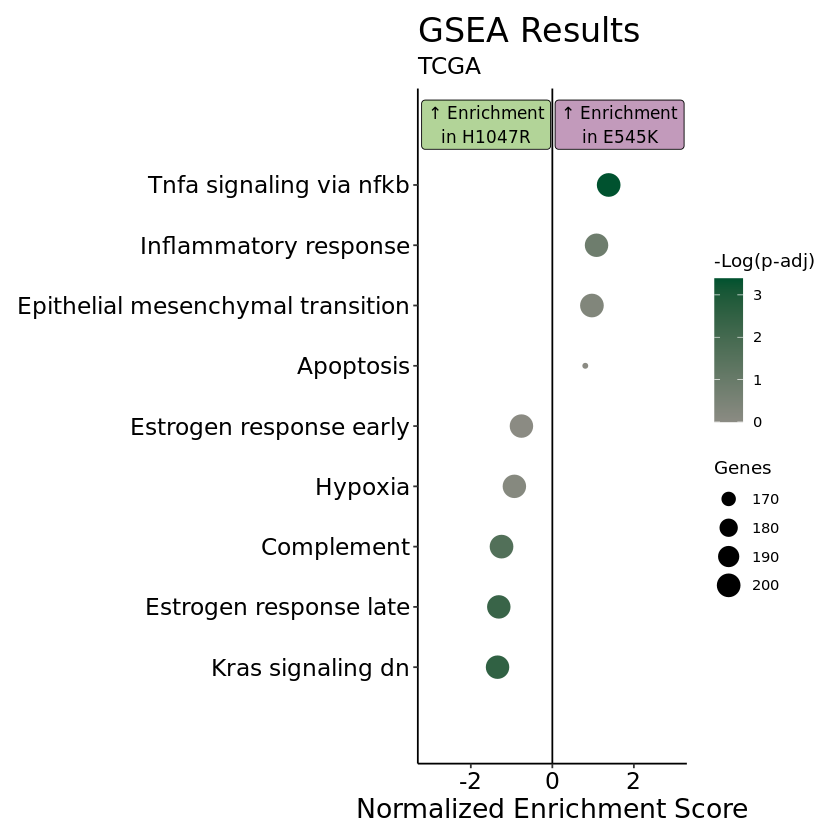

In [81]:
forestp2 <- TCGA_fgsea_res %>% 
    filter(pathway %in% fgseaRes_df_arrange$pathway) %>% 
    filter(!pathway == c("HALLMARK_G2M_CHECKPOINT")) %>%
    filter(!pathway == c("HALLMARK_E2F_TARGETS")) %>%
    filter(!pathway == c("HALLMARK_MYOGENESIS")) %>%
    filter(!pathway == c("HALLMARK_KRAS_SIGNALING_UP")) %>%
    filter(!pathway == c("HALLMARK_MITOTIC_SPINDLE")) %>%
    ggplot( aes(x = NES, y = reorder(clean_names, NES))) +
    coord_cartesian(xlim = c(-3, 3),
                    ylim = c(0,10)) + geom_vline(xintercept = 0) +
    scale_color_gradient(low = "ivory4", #mid = "#F60F66",
                         high = "#00522F") +
#     annotate("rect", xmin = 0, ymin = -Inf, ymax = Inf, xmax = Inf, 
#                   fill = "#C29ABB", alpha = 0.5) +
#     annotate("rect", xmin = 0, ymin = -Inf, ymax = Inf, xmax = -Inf, 
#                   fill = "#B2D498", alpha = 0.5) +
    ylab(label = NULL) + xlab(label = "Normalized Enrichment Score") +
    geom_point(aes(color = -log(padj), size = size)) +
    ggtitle(label = "GSEA Results", subtitle = "TCGA") +
    annotate("label", x = 1.65, y = 10, label = "\U2191 Enrichment\nin E545K",
             size = 3.55, family = "Arial", color = "black", fill = "#C29ABB") +
    annotate("label", x = -1.625, y = 10, label = "\U2191 Enrichment\nin H1047R",
             size = 3.55, family = "Arial", color = "black", fill = "#B2D498") +
    labs(size = "Genes", color = "-Log(p-adj)") +
    theme_classic() + theme(text = element_text(family = "Arial"),
                          axis.title = element_text(size = 16),
                          axis.text = element_text(size = 14, colour = "black"),
                          plot.title = element_text(size = 20),
                          plot.subtitle = element_text(size = 14),
                          strip.text = element_text(size = 12),
#                           legend.position = "none",
#                           legend.text = element_text(size = 12),
#                           legend.title = element_text(size = 14),
                          plot.margin = margin(10, 10, 10, 10))
forestp2

In [82]:
ggsave(filename="/data/park_lab/adam/figures/10AGSEA_forest_8-4.pdf", 
       plot = forestp, device = cairo_pdf, width = 8, height = 8)
ggsave(filename="/data/park_lab/adam/figures/TCGAGSEA_forest_8-4.pdf", 
       plot = forestp2, device = cairo_pdf, width = 8, height = 8)

In [ ]:
ggsave(filename="/data/park_lab/adam/figures/GSEA_forestrecolor_5-5.pdf", 
       plot = forestp, device = cairo_pdf, width = 8, height = 8)

In [ ]:
MCF10A_EMT_wave <- plotEnrichment(pathwaysH$HALLMARK_EPITHELIAL_MESENCHYMAL_TRANSITION,
               named_num_ranks) + labs(title = "Epithelial Mesenchymal Transition", 
                                       subtitle = "MCF10A Differentially Expressed Genes") +
    xlab("Gene Rank") + ylab("Enrichment Score") +
    theme_classic() + theme(text = element_text(family = "Arial"),
                          axis.title = element_text(size = 18),
                          axis.text = element_text(size = 18, colour = "black"),
                          plot.title = element_text(size = 22),
                          plot.subtitle = element_text(size = 20),
                          strip.text = element_text(size = 12),
#                           legend.position = "none",
#                           legend.text = element_text(size = 12),
#                           legend.title = element_text(size = 14),
                          plot.margin = margin(10, 10, 10, 10))
MCF10A_EMT_wave

In [ ]:
MCF10A_Estro_wave <- plotEnrichment(c(pathwaysH$HALLMARK_ESTROGEN_RESPONSE_LATE, 
                 pathwaysH$HALLMARK_ESTROGEN_RESPONSE_EARLY),
               named_num_ranks) + labs(title = "Estrogen Response", 
                                       subtitle = "MCF10A Differentially Expressed Genes") +
                    theme_classic() + theme(text = element_text(family = "Arial"),
                          axis.title = element_text(size = 16),
                          axis.text = element_text(size = 14, colour = "black"),
                          plot.title = element_text(size = 20),
                          plot.subtitle = element_text(size = 14),
                          strip.text = element_text(size = 12),
#                           legend.position = "none",
#                           legend.text = element_text(size = 12),
#                           legend.title = element_text(size = 14),
                          plot.margin = margin(10, 10, 10, 10)) 
MCF10A_Estro_wave

In [ ]:
        MCF10A_Kras_wave <- plotEnrichment(c( 
                 pathwaysH$HALLMARK_KRAS_SIGNALING_DN),
               named_num_ranks) + labs(title = "K-ras Signaling Down", 
                                       subtitle = "MCF10A Differentially Expressed Genes") +
     xlab("Gene Rank") + ylab("Enrichment Score") +
    theme_classic() + theme(text = element_text(family = "Arial"),
                          axis.title = element_text(size = 18),
                          axis.text = element_text(size = 18, colour = "black"),
                          plot.title = element_text(size = 22),
                          plot.subtitle = element_text(size = 20),
                          strip.text = element_text(size = 12),
#                           legend.position = "none",
#                           legend.text = element_text(size = 12),
#                           legend.title = element_text(size = 14),
                          plot.margin = margin(10, 10, 10, 10))
MCF10A_Kras_wave

In [ ]:
MCF10A_E2F_wave <- plotEnrichment(c( 
                 pathwaysH$HALLMARK_E2F_TARGETS),
               named_num_ranks) + labs(title = "E2F Targets", 
                                       subtitle = "MCF10A Differentially Expressed Genes") +
                    theme_classic() + theme(text = element_text(family = "Arial"),
                          axis.title = element_text(size = 16),
                          axis.text = element_text(size = 14, colour = "black"),
                          plot.title = element_text(size = 20),
                          plot.subtitle = element_text(size = 14),
                          strip.text = element_text(size = 12),
#                           legend.position = "none",
#                           legend.text = element_text(size = 12),
#                           legend.title = element_text(size = 14),
                          plot.margin = margin(10, 10, 10, 10)) 
MCF10A_E2F_wave

In [48]:
ggsave(filename="/data/park_lab/adam/figures/MCF10A_EMT_wave5-16.pdf", 
       plot = MCF10A_EMT_wave, device = cairo_pdf, width = 8, height = 8)

In [68]:
ggsave(filename="/data/park_lab/adam/figures/MCF10A_Estro_wave5-15.pdf", 
       plot = MCF10A_Estro_wave, device = cairo_pdf, width = 8, height = 8)

In [50]:
ggsave(filename = "/data/park_lab/adam/figures/MCF10A_Kras_wave5-16.pdf",
       plot = MCF10A_Kras_wave, device = cairo_pdf, width = 8, 
       height = 8)

### Combine Waves TCGA and my data

In [43]:
TCGA_numranks <- readRDS("/gpfs52/data/park_lab/adam/notebooks/TCGA_numRanks.rds")
TCGA_numranks

TSPAN6                      TNMD                      DPM1 
            -2.522944e-01             -7.067061e-01             -7.366422e-02 
                    SCYL3                  C1orf112                       FGR 
             2.907584e-02             -1.609973e-01             -3.930322e-02 
                      CFH                     FUCA2                      GCLC 
             2.024049e-01             -9.703742e-02              2.272000e-02 
                     NFYA                     STPG1                    NIPAL3 
             1.042820e-02             -5.066686e-02              1.392251e-01 
                    LAS1L                     ENPP4                    SEMA3F 
            -1.073392e-01              6.020217e-04             -2.807136e-02 
                     CFTR                    ANKIB1                   CYP51A1 
             3.566827e-01             -2.910138e-02             -5.142316e-02 
                    KRIT1                     RAD52                      <NA> 
             2.640344e-03              2.419037e-02              9.049545e-02 
                      BAD                      LAP3                      CD99 
             8.694700e-02              7.807800e-02             -6.665745e-02 
                   HS3ST1                      AOC1                     WNT16 
            -1.510961e-02             -7.793403e-01             -2.719613e-01 
                    HECW1                    MAD1L1                     LASP1 
             1.328725e-01              3.194703e-02             -2.012620e-01 
                    SNX11                  TMEM176A                      M6PR 
            -8.225523e-02             -2.953854e-01             -2.955018e-02 
                   KLHL13                   CYP26B1                      ICA1 
             5.906231e-01              2.119575e-03              1.378704e-01 
                   DBNDD1                      ALS2                    CASP10 
            -1.225162e-01              2.393871e-02             -3.167124e-02 
                    CFLAR                      TFPI                   NDUFAF7 
             2.209997e-02             -1.520227e-01             -5.087606e-02 
                     RBM5                     MTMR7                    SLC7A2 
             9.903538e-02              1.671607e-02              1.885029e-01 
                     ARF5                     SARM1                   POLDIP2 
            -2.788337e-02              2.410264e-01             -1.409465e-01 
                   PLXND1                       AK2                      CD38 
            -6.711770e-02             -9.931394e-02             -8.032374e-02 
                    FKBP4                     KDM1A                      RBM6 
            -1.030185e-01             -7.537508e-02             -2.566209e-03 
                   CAMKK1                     RECQL                     VPS50 
             8.859693e-03              1.210097e-02              4.264834e-02 
                    HSPB6                  ARHGAP33                   NDUFAB1 
            -3.611427e-01             -4.384948e-02              6.377125e-03 
                     PDK4                  SLC22A16                   ZMYND10 
             4.349572e-02              4.450546e-01             -2.933418e-02 
                    ABCB5                       ARX                  SLC25A13 
             1.049282e-02              7.612841e-01             -4.867076e-02 
                      ST7                     CDC27                    SLC4A1 
             2.577400e-02              4.174389e-03              3.477096e-02 
                    CALCR                      HCCS                      DVL2 
             1.148812e-01             -2.224739e-01             -4.113350e-02 
                   PRSS22                      UPF1                     SKAP2 
            -1.926507e-01              1.024575e-02              1.751608e-01 
                  SLC25A5                      MCUB                  

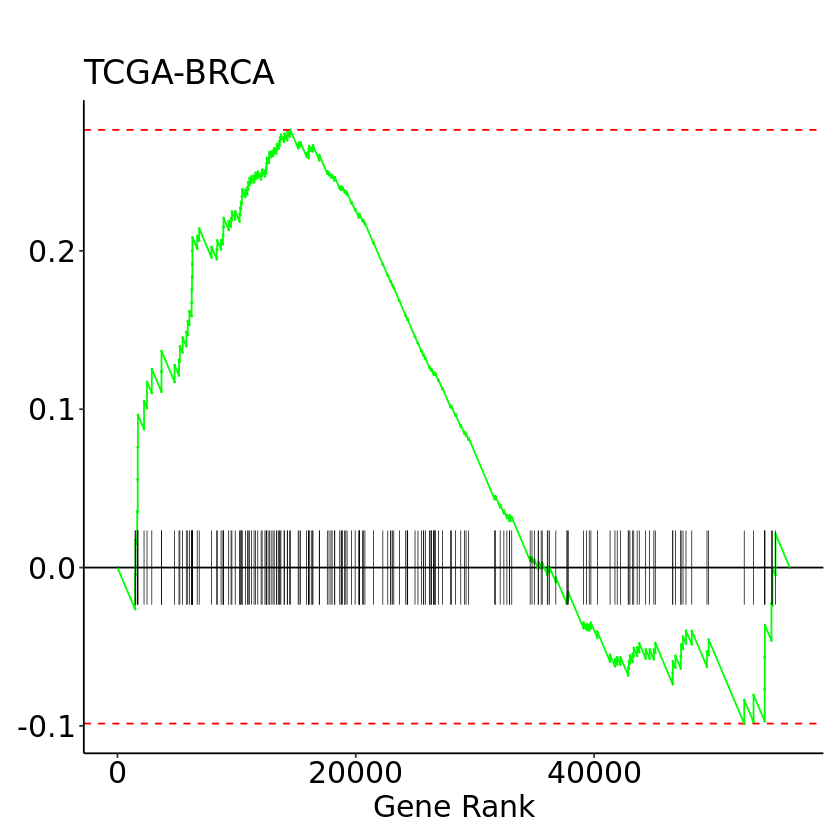

In [59]:
TCGA_EMT_wave <- plotEnrichment(pathwaysH$HALLMARK_EPITHELIAL_MESENCHYMAL_TRANSITION,
               TCGA_numranks) + labs(title = "",
                                            subtitle = "TCGA-BRCA") +
     xlab("Gene Rank") + ylab(NULL) +
    theme_classic() + theme(text = element_text(family = "Arial"),
                          axis.title = element_text(size = 18),
                          axis.text = element_text(size = 18, colour = "black"),
                          plot.title = element_text(size = 22),
                          plot.subtitle = element_text(size = 20),
                          strip.text = element_text(size = 12),
#                           legend.position = "none",
#                           legend.text = element_text(size = 12),
#                           legend.title = element_text(size = 14),
                          plot.margin = margin(10, 10, 10, 10))
TCGA_EMT_wave

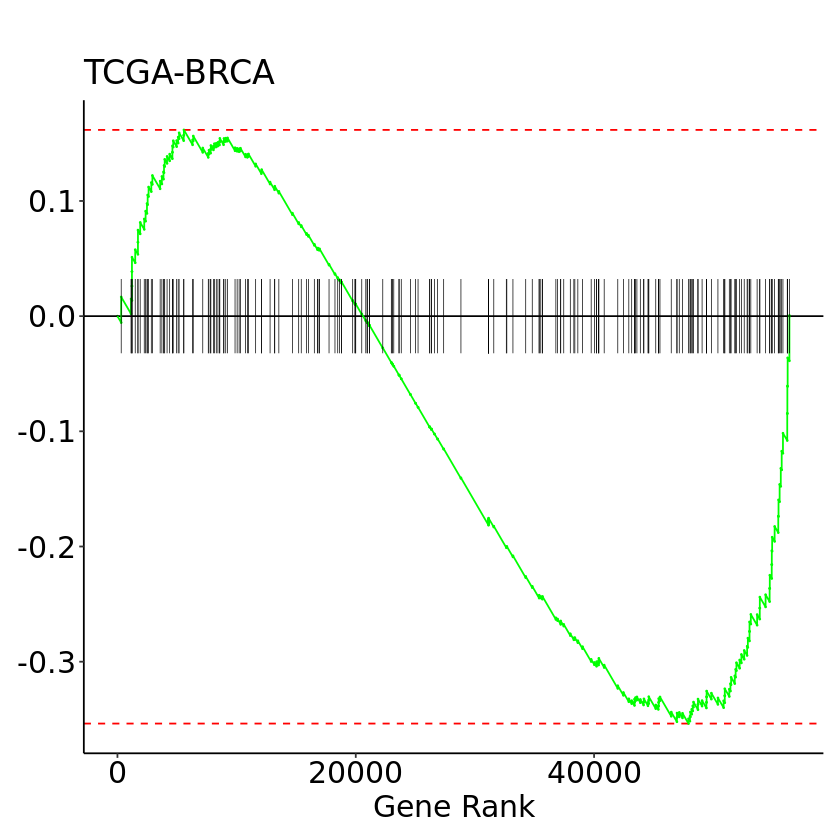

In [67]:
TCGA_Kras_wave <- plotEnrichment(pathwaysH$HALLMARK_KRAS_SIGNALING_DN,
               TCGA_numranks) + labs(title = "",
                                            subtitle = "TCGA-BRCA") +
     xlab("Gene Rank") + ylab(NULL) +
    theme_classic() + theme(text = element_text(family = "Arial"),
                          axis.title = element_text(size = 18),
                          axis.text = element_text(size = 18, colour = "black"),
                          plot.title = element_text(size = 22),
                          plot.subtitle = element_text(size = 20),
                          strip.text = element_text(size = 12),
#                           legend.position = "none",
#                           legend.text = element_text(size = 12),
#                           legend.title = element_text(size = 14),
                          plot.margin = margin(10, 10, 10, 10))
TCGA_Kras_wave

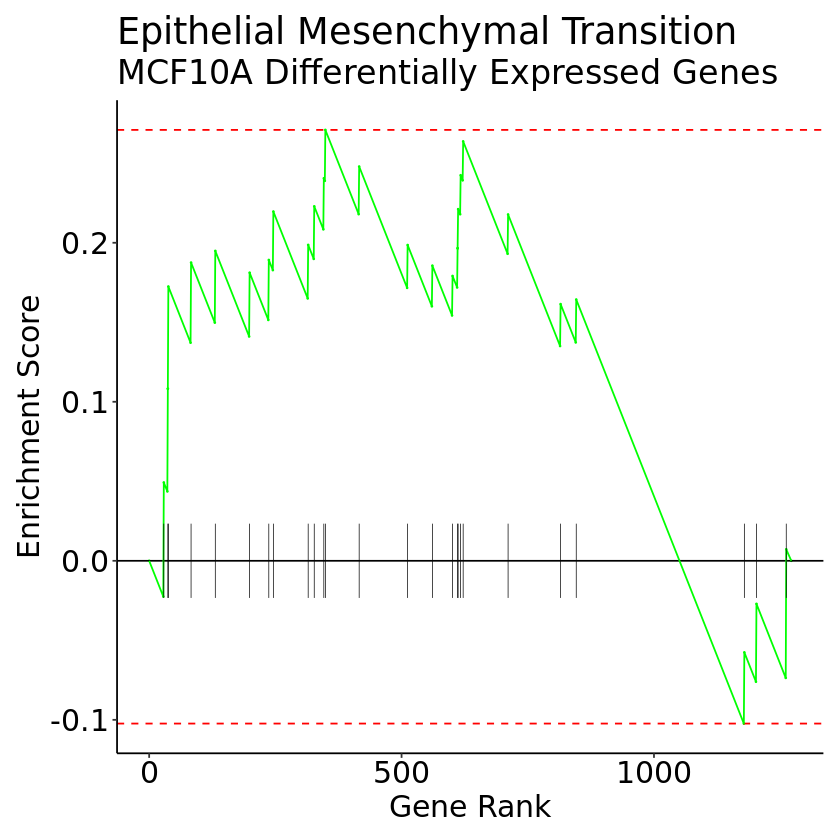

In [60]:
MCF10A_EMT_wave

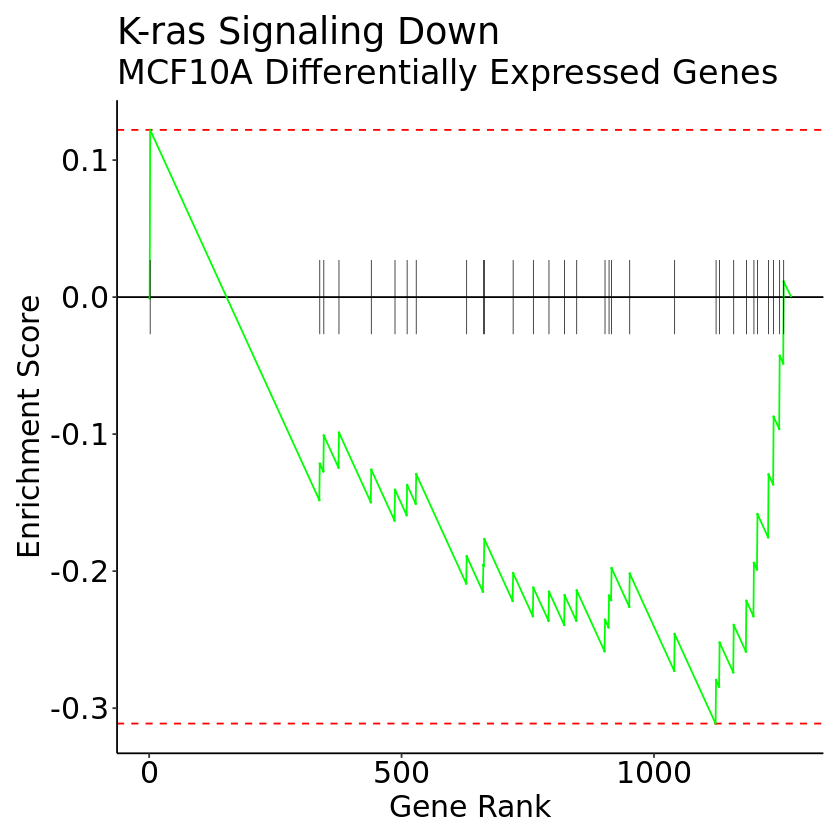

In [69]:
MCF10A_Kras_wave

In [61]:
library(ggpubr)
library(tidyverse)
library(extrafont)

In [62]:
extrafont::loadfonts()

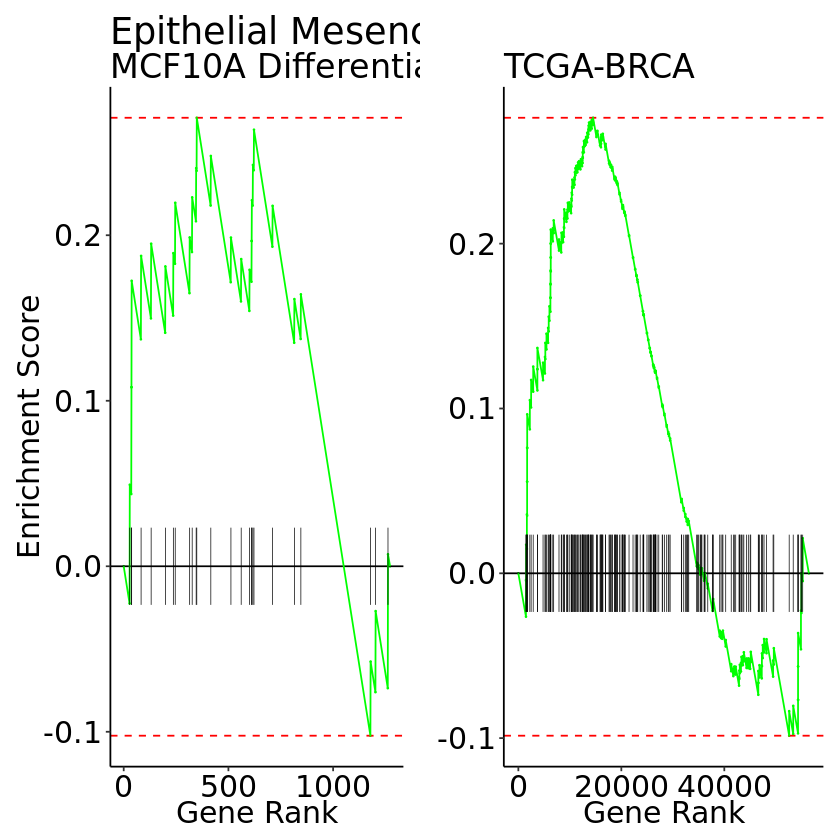

In [63]:
EMT_comb <- ggarrange(MCF10A_EMT_wave, TCGA_EMT_wave, 
          ncol =2, nrow = 1, widths = c(8, 8), heights=c(8))
EMT_comb

In [64]:
ggsave(filename = "/data/park_lab/adam/figures/EMTwavecomb5-17.pdf",
       plot = EMT_comb, device = cairo_pdf, width = 16, height = 8)

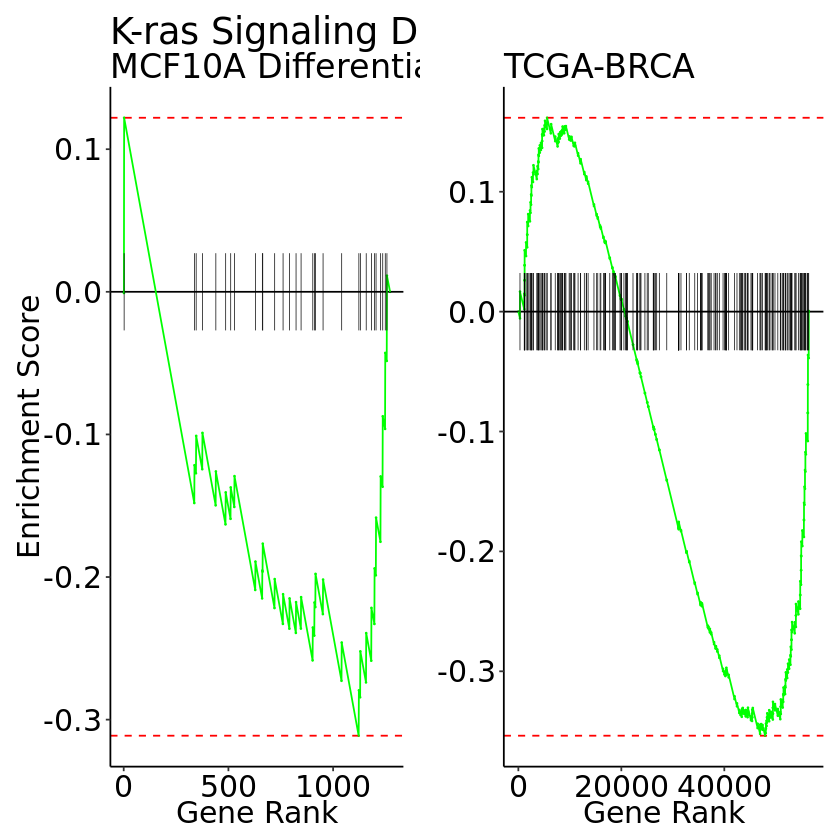

In [70]:
Kras_comb <- ggarrange(MCF10A_Kras_wave, TCGA_Kras_wave, 
          ncol =2, nrow = 1, widths = c(8, 8), heights=c(8))
Kras_comb

In [71]:
ggsave(filename = "/data/park_lab/adam/figures/Kraswavecomb5-17.pdf",
       plot = Kras_comb, device = cairo_pdf, width = 16, height = 8)

ERROR while rich displaying an object: Error in `geom_point()`:
! Problem while computing aesthetics.
ℹ Error occurred in the 1st layer.
Caused by error in `count()`:
! Argument 'x' is not a vector: numeric

Traceback:
1. tryCatch(withCallingHandlers({
 .     if (!mime %in% names(repr::mime2repr)) 
 .         stop("No repr_* for mimetype ", mime, " in repr::mime2repr")
 .     rpr <- repr::mime2repr[[mime]](obj)
 .     if (is.null(rpr)) 
 .         return(NULL)
 .     prepare_content(is.raw(rpr), rpr)
 . }, error = error_handler), error = outer_handler)
2. tryCatchList(expr, classes, parentenv, handlers)
3. tryCatchOne(expr, names, parentenv, handlers[[1L]])
4. doTryCatch(return(expr), name, parentenv, handler)
5. withCallingHandlers({
 .     if (!mime %in% names(repr::mime2repr)) 
 .         stop("No repr_* for mimetype ", mime, " in repr::mime2repr")
 .     rpr <- repr::mime2repr[[mime]](obj)
 .     if (is.null(rpr)) 
 .         return(NULL)
 .     prepare_content(is.raw(rpr), rpr)
 .

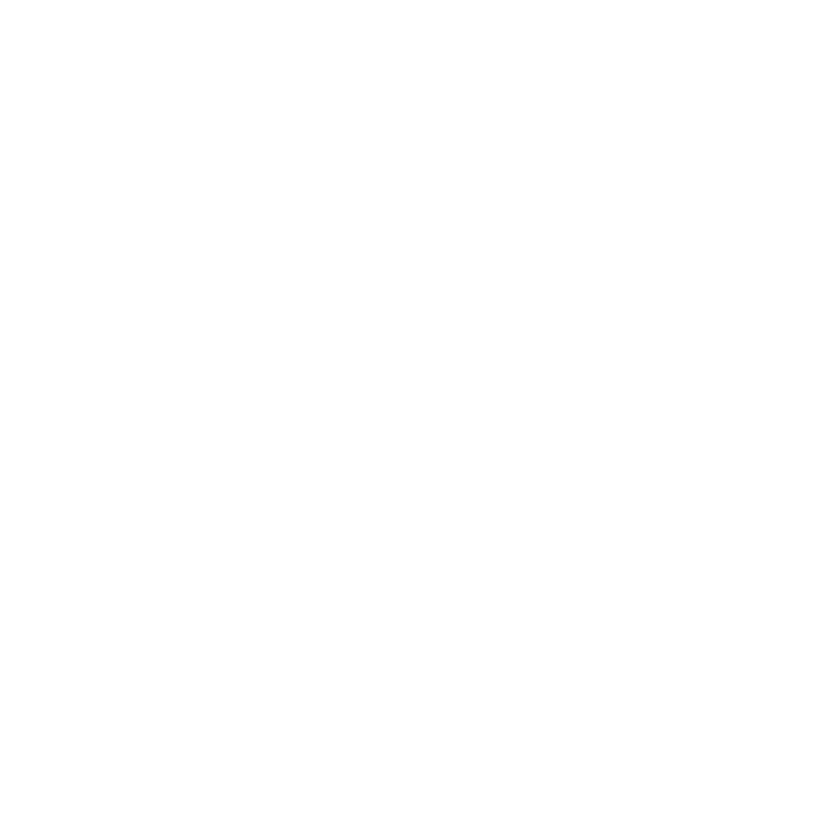

In [40]:
BigPlotting_df %>% ggplot() +
    geom_point(aes(x = Genotype, y = as.factor(pathway),
                     size = count(as.factor(pathway)))
               )

In [41]:
pdf(file = "/data/park_lab/adam/figures/test_2B.pdf", width = 24, height = 24)
p
dev.off()

Warning message:
“`position_stack()` requires non-overlapping x intervals”
Warning message:
“`position_stack()` requires non-overlapping x intervals”
Warning message:
“`position_stack()` requires non-overlapping x intervals”
Warning message:
“`position_stack()` requires non-overlapping x intervals”
Warning message:
“`position_stack()` requires non-overlapping x intervals”
Warning message:
“`position_stack()` requires non-overlapping x intervals”
Warning message:
“`position_stack()` requires non-overlapping x intervals”


png 
  2

## Overlap the TCGA diff exp and MCF10A diff exp

In [4]:
str(MCF10A_ex9vex20_resSig_padj)

'data.frame':	1271 obs. of  7 variables:
 $ rowname       : chr  "ENSG00000229344.1" "ENSG00000272141.1" "ENSG00000142609.18" "ENSG00000116254.18" ...
 $ baseMean      : num  25.3 57 37.3 26 28.5 ...
 $ log2FoldChange: num  1.57 -1.6 1.58 2.18 2.63 ...
 $ lfcSE         : num  0.431 0.366 0.396 0.6 0.479 ...
 $ stat          : num  3.63 -4.37 3.99 3.63 5.49 ...
 $ pvalue        : num  2.80e-04 1.22e-05 6.50e-05 2.83e-04 4.10e-08 ...
 $ padj          : num  6.42e-04 3.30e-05 1.62e-04 6.50e-04 1.42e-07 ...


In [30]:
TCGA_diffexp <- readRDS(file = "/gpfs52/data/park_lab/adam/notebooks/TCGA_diffexp_genes.rds")
str(TCGA_diffexp)

'data.frame':	3799 obs. of  6 variables:
 $ baseMean      : num  69.255 68.173 0.422 652.29 3.6 ...
 $ log2FoldChange: num  -0.707 -0.779 -0.706 -0.52 -0.619 ...
 $ lfcSE         : num  0.349 0.26 0.428 0.19 0.471 ...
 $ stat          : num  -2.03 -3 -1.65 -2.74 -1.31 ...
 $ pvalue        : num  0.04282 0.00269 0.09878 0.00616 0.18905 ...
 $ padj          : num  0.445 0.136 NA 0.207 0.718 ...


In [31]:
TCGA_diffexp$names <- rownames(TCGA_diffexp)
str(TCGA_diffexp)

'data.frame':	3799 obs. of  7 variables:
 $ baseMean      : num  69.255 68.173 0.422 652.29 3.6 ...
 $ log2FoldChange: num  -0.707 -0.779 -0.706 -0.52 -0.619 ...
 $ lfcSE         : num  0.349 0.26 0.428 0.19 0.471 ...
 $ stat          : num  -2.03 -3 -1.65 -2.74 -1.31 ...
 $ pvalue        : num  0.04282 0.00269 0.09878 0.00616 0.18905 ...
 $ padj          : num  0.445 0.136 NA 0.207 0.718 ...
 $ names         : chr  "ENSG00000000005.5" "ENSG00000002726.18" "ENSG00000006116.3" "ENSG00000006555.9" ...


In [32]:
library(ggvenn)

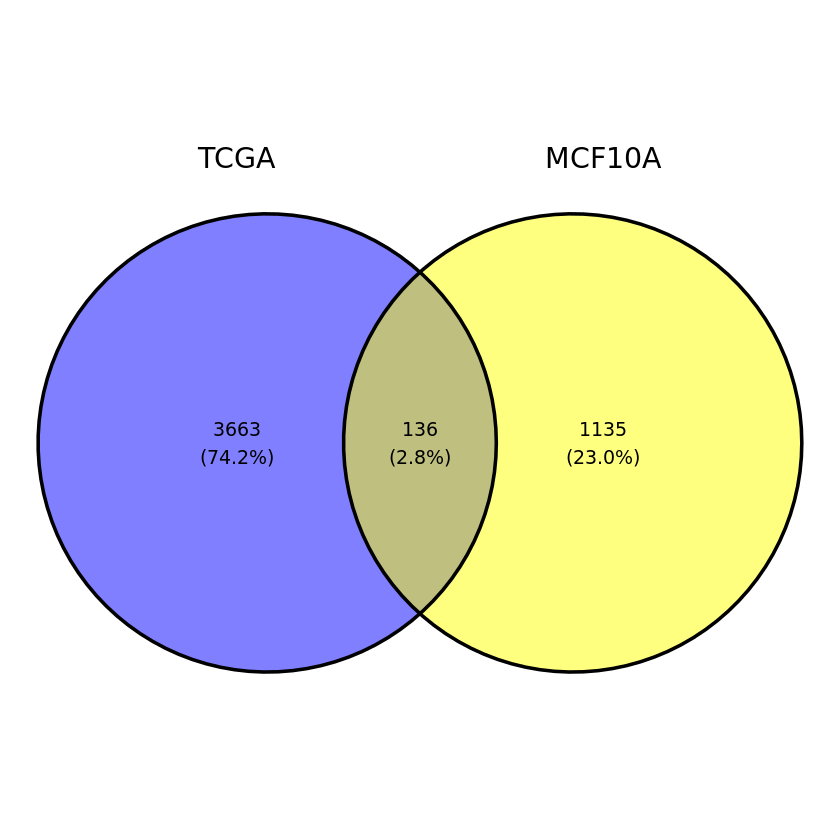

In [33]:
vectors <- list("TCGA" = TCGA_diffexp$names %>% tools::file_path_sans_ext(), 
                "MCF10A" = MCF10A_ex9vex20_resSig_padj$rowname %>% tools::file_path_sans_ext())
ggvenn(vectors, c("TCGA", "MCF10A")) 

## Volcano

In [3]:
MCF10A_ex9vex20_res

log2 fold change (MLE): MCF10A_genotype ex9 vs ex20 
Wald test p-value: MCF10A genotype ex9 vs ex20 
DataFrame with 21734 rows and 6 columns
                    baseMean log2FoldChange     lfcSE       stat      pvalue
                   <numeric>      <numeric> <numeric>  <numeric>   <numeric>
ENSG00000227232.5   228.4997      -1.042616  0.202072  -5.159639 2.47427e-07
ENSG00000278267.1    49.9599      -0.381544  0.345895  -1.103061 2.70001e-01
ENSG00000238009.6    28.5163       0.831616  0.523980   1.587115 1.12487e-01
ENSG00000233750.3    69.8504       0.265019  0.344564   0.769145 4.41807e-01
ENSG00000268903.1   272.1845       0.571221  0.214062   2.668485 7.61941e-03
...                      ...            ...       ...        ...         ...
ENSG00000198695.2  17252.263     -0.8339362 0.2585709  -3.225175 1.25896e-03
ENSG00000210194.1    764.066     -0.8270515 0.1441776  -5.736339 9.67447e-09
ENSG00000198727.2 172367.784     -0.0315895 0.0763710  -0.413631 6.79144e-01
ENSG00000210

In [4]:
MCF10A_ex9vex20_res_df <- as.data.frame(MCF10A_ex9vex20_res)

In [5]:
head(MCF10A_ex9vex20_res_df)

,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ENSG00000227232.5,228.49968,-1.0426160,0.2020715,-5.1596389,2.474267e-07,7.955144e-07
ENSG00000278267.1,49.95994,-0.3815437,0.3458952,-1.1030613,2.700005e-01,3.403279e-01
ENSG00000238009.6,28.51625,0.8316157,0.5239795,1.5871149,1.124866e-01,1.589681e-01
ENSG00000233750.3,69.85035,0.2650194,0.3445635,0.7691452,4.418071e-01,5.187002e-01
ENSG00000268903.1,272.18446,0.5712208,0.2140618,2.6684853,7.619411e-03,1.394261e-02
ENSG00000269981.1,239.55302,0.6518759,0.1927933,3.3812171,7.216549e-04,1.563010e-03


In [6]:
ens.str <- substr(rownames(MCF10A_ex9vex20_res_df), 1, 15)
genes <- mapIds(org.Hs.eg.db,
                keys = ens.str,
                column = "SYMBOL",
                keytype = "ENSEMBL",
                multiVals= "first")
str(genes)
genes <- as.character(genes)
genes
MCF10A_ex9vex20_res_df$symbols <- genes
head(MCF10A_ex9vex20_res_df)

'select()' returned 1:many mapping between keys and columns



 Named chr [1:21734] "WASH7P" "MIR6859-1" "LOC100996442" "CICP27" NA NA NA ...
 - attr(*, "names")= chr [1:21734] "ENSG00000227232" "ENSG00000278267" "ENSG00000238009" "ENSG00000233750" ...


[1] "WASH7P"                    "MIR6859-1"                
    [3] "LOC100996442"              "CICP27"                   
    [5] NA                          NA                         
    [7] NA                          "WASH9P"                   
    [9] "RPL23AP21"                 NA                         
   [11] "LOC101928626"              "MTND2P28"                 
   [13] "MTCO1P12"                  "MTCO2P12"                 
   [15] "MTATP6P1"                  NA                         
   [17] "LINC01409"                 NA                         
   [19] "FAM87B"                    "LINC01128"                
   [21] "LINC00115"                 NA                         
   [23] NA                          NA                         
   [25] "LINC02593"                 "SAMD11"                   
   [27] "NOC2L"                     "KLHL17"                   
   [29] "PLEKHN1"                   "PERM1"                    
   [31] NA                          "HES4"                     
   [33] "ISG15"                     "AGRN"                     
   [35] NA                          "LOC100288175"             
   [37] NA                          "RNF223"                   
   [39] "C1orf159"                  NA                         
   [41] NA                          "SDF4"                     
   [43] "B3GALT6"                   "C1QTNF12"                 
   [45] "UBE2J2"                    "SCNN1D"                   
   [47] "ACAP3"                     "PUSL1"                    
   [49] "INTS11"                    "MIR6727"                  
   [51] NA                          "CPTP"                     
   [53] "TAS1R3"                    "DVL1"                     
   [55] "MIR6808"                   "MXRA8"                    
   [57] "AURKAIP1"                  "CCNL2"                    
   [59] "MRPL20-AS1"                "MRPL20"                   
   [61] "RN7SL657P"                 NA                         
   [63] "ANKRD65"                   "VWA1"                     
   [65] "ATAD3C"                    "ATAD3B"                   
   [67] NA                          "ATAD3A"                   
   [69] "TMEM240"                   "SSU72"                    
   [71] NA                          "FNDC10"                   
   [73] NA                          NA                         
   [75] "MIB2"                      "CDK11B"                   
   [77] NA                          "SLC35E2B"                 
   [79] NA                          "CDK11A"                   
   [81] NA                          NA                         
   [83] "SLC35E2A"                  "NADK"                     
   [85] "GNB1"                      NA                         
   [87] "CALML6"                    "TMEM52"                   
   [89] "CFAP74"                    "PRKCZ"                    
   [91] NA                          "PRKCZ-AS1"                
   [93] "FAAP20"                    "SKI"                      
   [95] "MORN1"                     "LOC100129534"             
   [97] "RER1"                      "PEX10"                    
   [99] "PLCH2"                     "PANK4"                    
  [101] NA                          "TNFRSF14"                 
  [103] "PRXL2B"                    "ARHGEF16"                 
  [105] "MEGF6"                     "TPRG1L"                   
  [107] "WRAP73"                    "TP73"                     
  [109] "TP73-AS1"                  "CCDC27"                   
  [111] "SMIM1"                     "LRRC47"                   
  [113] NA                          "CEP104"                   
  [115] "DFFB"                      "C1orf174"                 
  [117] "LINC01134"                 "NPHP4"                    
  [119] "KCNAB2"                    "CHD5"                     
  [121] NA                          "RPL22"                    
  [123] "RNF207-AS1"                "RNF207"                   
  [125] "ICMT"                      

,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,symbols
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
ENSG00000227232.5,228.49968,-1.0426160,0.2020715,-5.1596389,2.474267e-07,7.955144e-07,WASH7P
ENSG00000278267.1,49.95994,-0.3815437,0.3458952,-1.1030613,2.700005e-01,3.403279e-01,MIR6859-1
ENSG00000238009.6,28.51625,0.8316157,0.5239795,1.5871149,1.124866e-01,1.589681e-01,LOC100996442
ENSG00000233750.3,69.85035,0.2650194,0.3445635,0.7691452,4.418071e-01,5.187002e-01,CICP27
ENSG00000268903.1,272.18446,0.5712208,0.2140618,2.6684853,7.619411e-03,1.394261e-02,NA
ENSG00000269981.1,239.55302,0.6518759,0.1927933,3.3812171,7.216549e-04,1.563010e-03,NA


In [7]:
MCF10A_ex9vex20_res_df %>% filter(symbols == "EPGN")

,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,symbols
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
ENSG00000182585.10,26037.13,-0.7492579,0.05814635,-12.88573,5.41641e-38,8.055287e-37,EPGN


In [8]:
MCF10A_ex9vex20_res_df <- na.omit(MCF10A_ex9vex20_res_df)

In [9]:
MCF10A_ex9vex20_res_df <- MCF10A_ex9vex20_res_df %>% 
        mutate(mycolor = ifelse(log2FoldChange < -1.5 | log2FoldChange > 1.5 & padj < 0.05, 
                                "hit", "not"))
MCF10A_ex9vex20_res_df[MCF10A_ex9vex20_res_df$symbols=="AREG", "mycolor"] <- "AREG"
head(MCF10A_ex9vex20_res_df)

,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,symbols,mycolor
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
ENSG00000227232.5,228.49968,-1.0426160,0.2020715,-5.1596389,2.474267e-07,7.955144e-07,WASH7P,not
ENSG00000278267.1,49.95994,-0.3815437,0.3458952,-1.1030613,2.700005e-01,3.403279e-01,MIR6859-1,not
ENSG00000238009.6,28.51625,0.8316157,0.5239795,1.5871149,1.124866e-01,1.589681e-01,LOC100996442,not
ENSG00000233750.3,69.85035,0.2650194,0.3445635,0.7691452,4.418071e-01,5.187002e-01,CICP27,not
ENSG00000279457.4,419.34413,-0.9147275,0.1767112,-5.1763990,2.262094e-07,7.315194e-07,WASH9P,not
ENSG00000228463.10,46.78400,0.0743498,0.3573513,0.2080580,8.351836e-01,8.696444e-01,RPL23AP21,not


In [10]:
summary(-log10(MCF10A_ex9vex20_res_df$padj))

     Min.   1st Qu.    Median      Mean   3rd Qu.      Max. 
 0.000145  0.790592  3.011004       Inf 10.570652       Inf 

In [11]:
points2label <- MCF10A_ex9vex20_res_df %>%
                dplyr::filter(symbols %in% c("AREG"))
points2label

,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,symbols,mycolor
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
ENSG00000109321.11,1367.352,2.826147,0.1280448,22.07156,5.931605e-108,3.692891e-106,AREG,AREG


In [12]:
more_labels <- MCF10A_ex9vex20_res_df %>% 
            filter(!padj == 0) %>% 
            filter(!log2FoldChange > 10) %>%
            top_n(5, abs(log2FoldChange))
more_labels2 <- MCF10A_ex9vex20_res_df %>% 
            filter(!padj == 0) %>%
            top_n(-5, abs(padj))
points2label <- rbind(points2label, more_labels, more_labels2)
points2label

,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,symbols,mycolor
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
ENSG00000109321.11,1367.35152,2.826147,0.12804477,22.071555,5.931605e-108,3.692891e-106,AREG,AREG
ENSG00000154822.18,165.58099,8.196606,0.54247193,15.109734,1.397034e-51,2.993565e-50,PLCL2,hit
ENSG00000245067.7,516.63694,8.736623,0.49631045,17.603141,2.330333e-69,7.295888e-68,IGFBP7-AS1,hit
ENSG00000065609.14,81.56364,9.340920,1.22283541,7.638738,2.193606e-14,1.197254e-13,SNAP91,hit
ENSG00000148288.13,69.02415,9.340105,1.05329823,8.867484,7.481706e-19,5.249032e-18,GBGT1,hit
ENSG00000011201.12,1312.66403,-8.316760,0.35215474,-23.616778,2.591754e-123,2.040349e-121,ANOS1,hit
ENSG00000118523.6,30702.72747,2.071499,0.05619037,36.865729,1.637210e-297,6.711943e-295,CCN2,hit
ENSG00000167123.19,3445.23921,1.971577,0.05382016,36.632691,8.632387e-294,3.290605e-291,CERCAM,hit
ENSG00000138166.6,3022.31455,2.481393,0.06740198,36.814841,1.068762e-296,4.300383e-294,DUSP5,hit


In [13]:
CRISPRscreenHits <- MCF10A_ex9vex20_res_df %>%
                dplyr::filter(symbols %in% c("AREG", "PPM1H", "NAT1",
                                             "ACSS1", "CXCL1"))
CRISPRscreenHits

,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,symbols,mycolor
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
ENSG00000163739.5,384.6130,-1.0633139,0.14165718,-7.506248,6.084619e-14,3.237977e-13,CXCL1,not
ENSG00000109321.11,1367.3515,2.8261471,0.12804477,22.071555,5.931605e-108,3.692891e-106,AREG,AREG
ENSG00000171428.14,717.9936,-0.5348921,0.11621758,-4.602506,4.174370e-06,1.188426e-05,NAT1,not
ENSG00000111110.12,3478.4610,-1.1018575,0.05648815,-19.505993,9.764303e-85,4.168149e-83,PPM1H,not
ENSG00000154930.15,284.4279,-3.2814939,0.47005152,-6.981137,2.928014e-12,1.399469e-11,ACSS1,hit


In [14]:
MCF10A_ex9vex20_res_df$coloring <- MCF10A_ex9vex20_res_df$mycolor
MCF10A_ex9vex20_res_df$coloring[MCF10A_ex9vex20_res_df$mycolor == "hit" & MCF10A_ex9vex20_res_df$log2FoldChange >0] <- "E545K"
MCF10A_ex9vex20_res_df$coloring[MCF10A_ex9vex20_res_df$mycolor == "hit" & MCF10A_ex9vex20_res_df$log2FoldChange <0] <- "H1047R"
MCF10A_ex9vex20_res_df$coloring

[1] "not"    "not"    "not"    "not"    "not"    "not"    "not"    "not"   
    [9] "not"    "E545K"  "not"    "not"    "not"    "not"    "not"    "not"   
   [17] "not"    "not"    "not"    "not"    "not"    "not"    "not"    "not"   
   [25] "not"    "not"    "not"    "not"    "not"    "not"    "not"    "not"   
   [33] "not"    "not"    "not"    "not"    "not"    "not"    "not"    "not"   
   [41] "not"    "not"    "not"    "not"    "not"    "not"    "not"    "not"   
   [49] "not"    "not"    "not"    "not"    "not"    "not"    "not"    "not"   
   [57] "not"    "not"    "not"    "not"    "not"    "not"    "not"    "E545K" 
   [65] "not"    "not"    "not"    "not"    "not"    "not"    "not"    "not"   
   [73] "not"    "not"    "not"    "not"    "not"    "not"    "not"    "not"   
   [81] "not"    "not"    "not"    "not"    "not"    "not"    "not"    "not"   
   [89] "not"    "not"    "not"    "E545K"  "not"    "not"    "not"    "not"   
   [97] "not"    "not"    "not"    "not"    "not"    "not"    "not"    "not"   
  [105] "not"    "not"    "not"    "not"    "not"    "not"    "not"    "not"   
  [113] "not"    "not"    "not"    "not"    "not"    "not"    "not"    "not"   
  [121] "not"    "not"    "not"    "not"    "H1047R" "not"    "not"    "not"   
  [129] "not"    "not"    "not"    "not"    "not"    "not"    "not"    "not"   
  [137] "not"    "not"    "not"    "not"    "not"    "not"    "not"    "not"   
  [145] "not"    "not"    "not"    "not"    "not"    "not"    "not"    "not"   
  [153] "H1047R" "not"    "not"    "not"    "not"    "not"    "not"    "not"   
  [161] "not"    "not"    "not"    "not"    "not"    "not"    "not"    "not"   
  [169] "not"    "not"    "not"    "not"    "not"    "not"    "not"    "not"   
  [177] "not"    "not"    "not"    "not"    "not"    "not"    "not"    "not"   
  [185] "not"    "not"    "not"    "not"    "not"    "not"    "not"    "not"   
  [193] "not"    "not"    "not"    "E545K"  "not"    "not"    "not"    "not"   
  [201] "not"    "not"    "not"    "not"    "not"    "not"    "not"    "not"   
  [209] "not"    "not"    "not"    "not"    "not"    "H1047R" "not"    "E545K" 
  [217] "not"    "not"    "not"    "E545K"  "not"    "not"    "not"    "not"   
  [225] "not"    "not"    "not"    "not"    "not"    "not"    "not"    "not"   
  [233] "not"    "not"    "not"    "not"    "H1047R" "not"    "not"    "not"   
  [241] "not"    "not"    "not"    "not"    "not"    "E545K"  "not"    "not"   
  [249] "not"    "not"    "not"    "not"    "not"    "not"    "not"    "not"   
  [257] "not"    "not"    "not"    "not"    "not"    "not"    "not"    "not"   
  [265] "not"    "not"    "not"    "not"    "not"    "not"    "H1047R" "not"   
  [273] "not"    "not"    "not"    "not"    "not"    "not"    "not"    "E545K" 
  [281] "not"    "not"    "not"    "not"    "E545K"  "not"    "not"    "not"   
  [289] "not"    "not"    "not"    "not"    "not"    "not"    "not"    "not"   
  [297] "not"    "not"    "not"    "not"    "not"    "not"    "not"    "not"   
  [305] "not"    "not"    "H1047R" "not"    "not"    "not"    "not"    "not"   
  [313] "not"    "not"    "not"    "not"    "not"    "not"    "not"    "not"   
  [321] "not"    "not"    "not"    "not"    "not"    "not"    "not"    "not"   
  [329] "not"    "not"    "not"    "not"    "not"    "not"    "not"    "not"   
  [337] "E545K"  "not"    "not"    "not"    "not"    "not"    "not"    "not"   
  [345] "not"    "not"    "not"    "not"    "not"    "not"    "not"    "not"   
  [353] "not"    "not"    "not"    "not"    "not"    "not"    "not"    "not"   
  [361] "not"    "not"    "not"    "not"    "not"    "not"    "not"    "not"   
  [369] "not"    "not"    "not"    "not"    "not"    "not"    "not"    "not"   
  [377] "not"    "not"    "not"    "not"    "not"    "not"    "not"    "not"   
  [385] "not"    "not"    "not"    "not"    "not"    "not"    "not"    "E545K" 
  [393] "not"    "not"    "not"    "not"    "not"    "not"    "not"    "not"   
  [4

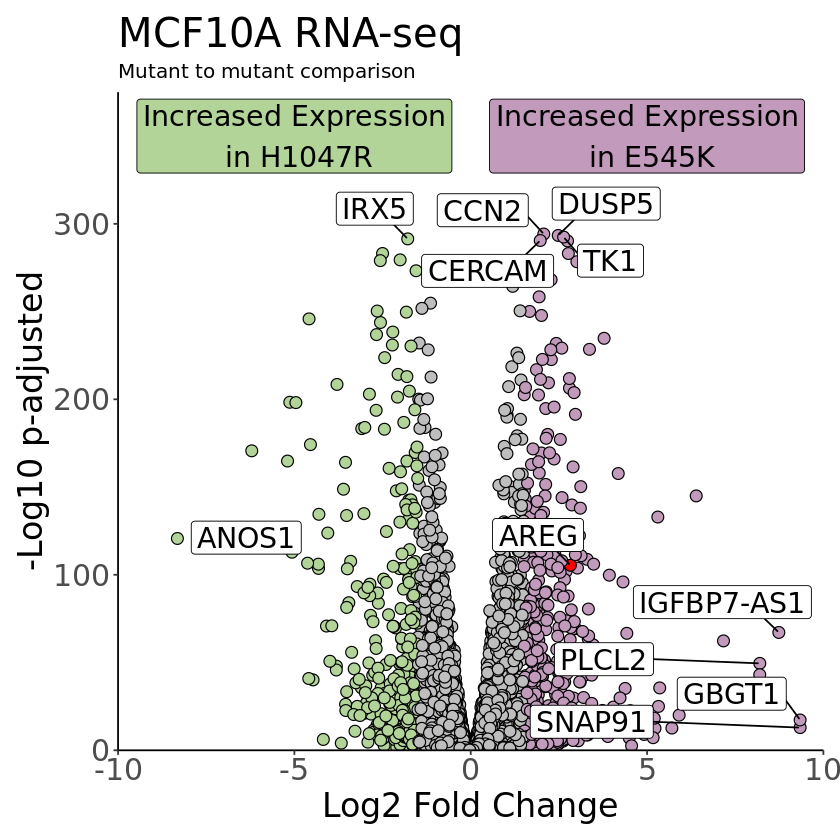

In [15]:
volcano <- MCF10A_ex9vex20_res_df %>% filter(-log10(padj) < 350) %>%
  ggplot(aes(x = log2FoldChange, y = -log10(padj), label = symbols, fill = coloring)) +
  coord_cartesian(xlim = c(-10, 10), ylim = c(0,375), expand = FALSE) +
#   annotate("rect", xmin = 0, ymin = -Inf, ymax = Inf, xmax = Inf, 
#                   fill = "#C29ABB", alpha = 0.5) +
#   annotate("rect", xmin = 0, ymin = -Inf, ymax = Inf, xmax = -Inf, 
#                   fill = "#B2D498", alpha = 0.5) +
  annotate("label", x = 5, y = 350, label = "Increased Expression\n in E545K",
           family = "Arial", size = 6, fill = "#C29ABB") +
  annotate("label", x = -5, y = 350, label = "Increased Expression\n in H1047R",
           family = "Arial", size = 6, fill = "#B2D498") + 
  geom_point(shape = 21, color = "black", size =3) +
  geom_label_repel(data = points2label, colour = "black", fill = "white", size = 6,
                   family = "Arial", max.overlaps = Inf, box.padding = 0.5) +
  scale_fill_manual(values = c("red", "#C29ABB", "#B2D498", "grey")) +
  xlab("Log2 Fold Change") + ylab("-Log10 p-adjusted") +
  ggtitle(label = "MCF10A RNA-seq", subtitle = "Mutant to mutant comparison") +
  theme_classic() + theme(legend.position="none", 
                          text = element_text(family = "Arial"),
                          axis.title = element_text(size = 20),
                          axis.text = element_text(size = 18),
                          plot.title = element_text(size = 24),
                          plot.subtitle = element_text(size = 12),
                          plot.margin = margin(10, 10, 10, 10))
volcano

In [16]:
ggsave(filename="/data/park_lab/adam/figures/MCF10A_Volcanorecolor7-6.pdf", 
       plot = volcano, device = cairo_pdf, width = 8, height = 8)

In [22]:
# pdf(file = "/data/park_lab/adam/figures/MCF10A_Volcano1A_2-14.pdf", 
#     width = 8, height = 8)
# volcano
# dev.off()
ggsave(filename="/data/park_lab/adam/figures/MCF10A_Volcano1A_2-20.eps", 
       plot = volcano, device = cairo_ps, width = 8, height = 8)

In [11]:
volcanohits <- MCF10A_ex9vex20_res_df %>%
  ggplot(aes(x = log2FoldChange, y = -log10(padj), label = symbols, color = mycolor)) +
  xlim(-10, 10) + ylim(0,350) +
  annotate("rect", xmin = 0, ymin = 0, ymax = Inf, xmax = 10, 
                  fill = "#8B1B00", alpha = 0.5) +
  annotate("rect", xmin = 0, ymin = 0, ymax = Inf, xmax = -10, 
                  fill = "#5EC2C0", alpha = 0.5) +
  annotate("label", x = 5, y = 325, label = "Increased Expression\n in E545K") +
  annotate("label", x = -5, y = 325, label = "Increased Expression\n in H1047R") +
  geom_point() +
  geom_label_repel(data = CRISPRscreenHits, colour = "black",
                   min.segment.length = 0, seed = 42, box.padding = 0.5,
                   segment.color = "red") +
  scale_color_manual(values = c("#00522F", "#E6F4F1")) +
  theme(legend.position="none") +
  ggtitle(label = "MCF10A RNA-seq", subtitle = expression(italic(PIK3CA)~"Mutant Comparison"))
volcanohits

ERROR: Error in fortify(data): object 'CRISPRscreenHits' not found


In [ ]:
pdf(file = "/data/park_lab/adam/figures/MCF10A_VolcanoCRISPR.pdf", width = 8, height = 10)
volcanohits
dev.off()

In [27]:
pdf(file = "/data/park_lab/adam/figures/MCF10A_Volcano2A.pdf", width = 8, height = 10)
volcano
dev.off()

Warning message:
“Removed 1 rows containing missing values (geom_point).”


png 
  2

## Heatmap

In [50]:
MCF10A_dds <- DESeq(MCF10A_dds)

estimating size factors

estimating dispersions

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates

fitting model and testing



In [51]:
MCF10A_normCounts <- counts(MCF10A_dds, normalized = TRUE)
MCF10A_normCounts

,MCF10A_E545K_rep1,MCF10A_E545K_rep2,MCF10A_E545K_rep3,MCF10A_parental_rep1,MCF10A_parental_rep2,MCF10A_parental_rep3,MCF10A_H1047R_rep1,MCF10A_H1047R_rep2,MCF10A_H1047R_rep3
ENSG00000223972.5,2.506292,3.305122,0.000000,1.326588,0.000000,0.000000,2.0653848,0.3088647,1.0198098
ENSG00000227232.5,149.124398,178.476599,159.888504,195.008508,190.542727,181.615826,246.2971382,349.9437281,391.2670223
ENSG00000278267.1,36.341240,56.187077,42.636934,41.124243,60.369973,37.836630,51.1182740,51.8892730,69.6870022
ENSG00000243485.5,5.012585,0.000000,0.000000,0.000000,0.000000,0.000000,3.0980772,0.0000000,2.0396196
ENSG00000284332.1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0000000,0.0000000,0.0000000
ENSG00000237613.2,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0000000,0.0000000,0.0000000
ENSG00000268020.3,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0000000,0.0000000,0.0000000
ENSG00000240361.2,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0000000,0.0000000,0.0000000
ENSG00000186092.6,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0000000,0.0000000,0.0000000
ENSG00000238009.6,42.606971,47.924272,35.530779,15.919062,39.617795,3.783663,27.8826949,19.7673421,22.7757520


In [52]:
str(MCF10A_ex9vex20_resSig_padj)

'data.frame':	1271 obs. of  7 variables:
 $ rowname       : chr  "ENSG00000229344.1" "ENSG00000272141.1" "ENSG00000142609.18" "ENSG00000116254.18" ...
 $ baseMean      : num  25.3 57 37.3 26 28.5 ...
 $ log2FoldChange: num  1.57 -1.6 1.58 2.18 2.63 ...
 $ lfcSE         : num  0.431 0.366 0.396 0.6 0.479 ...
 $ stat          : num  3.63 -4.37 3.99 3.63 5.49 ...
 $ pvalue        : num  2.80e-04 1.22e-05 6.50e-05 2.83e-04 4.10e-08 ...
 $ padj          : num  6.42e-04 3.30e-05 1.62e-04 6.50e-04 1.42e-07 ...


In [53]:
MCF10A_normCounts_df <- as.data.frame(MCF10A_normCounts)
MCF10A_normCounts_df <- rownames_to_column(MCF10A_normCounts_df, var = "GeneID")
head(MCF10A_normCounts_df)

,GeneID,MCF10A_E545K_rep1,MCF10A_E545K_rep2,MCF10A_E545K_rep3,MCF10A_parental_rep1,MCF10A_parental_rep2,MCF10A_parental_rep3,MCF10A_H1047R_rep1,MCF10A_H1047R_rep2,MCF10A_H1047R_rep3
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,ENSG00000223972.5,2.506292,3.305122,0.00000,1.326588,0.00000,0.00000,2.065385,0.3088647,1.01981
2,ENSG00000227232.5,149.124398,178.476599,159.88850,195.008508,190.54273,181.61583,246.297138,349.9437281,391.26702
3,ENSG00000278267.1,36.341240,56.187077,42.63693,41.124243,60.36997,37.83663,51.118274,51.8892730,69.68700
4,ENSG00000243485.5,5.012585,0.000000,0.00000,0.000000,0.00000,0.00000,3.098077,0.0000000,2.03962
5,ENSG00000284332.1,0.000000,0.000000,0.00000,0.000000,0.00000,0.00000,0.000000,0.0000000,0.00000
6,ENSG00000237613.2,0.000000,0.000000,0.00000,0.000000,0.00000,0.00000,0.000000,0.0000000,0.00000


In [54]:
MCF10A_normCounts_df_filt <- MCF10A_normCounts_df %>%
                          dplyr::filter(GeneID %in% MCF10A_ex9vex20_resSig_padj$rowname)
rownames(MCF10A_normCounts_df_filt) <- MCF10A_normCounts_df_filt[,1]
MCF10A_normCounts_df_filt <- MCF10A_normCounts_df_filt[,-1]
MCF10A_normCounts_df_filt

,MCF10A_E545K_rep1,MCF10A_E545K_rep2,MCF10A_E545K_rep3,MCF10A_parental_rep1,MCF10A_parental_rep2,MCF10A_parental_rep3,MCF10A_H1047R_rep1,MCF10A_H1047R_rep2,MCF10A_H1047R_rep3
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ENSG00000229344.1,40.10068,33.05122,42.636934,23.878593,18.865617,30.269304,14.457694,14.2077771,10.1980979
ENSG00000272141.1,35.08809,21.48329,24.871545,42.450832,64.143096,73.781429,100.171163,64.8615913,83.2844661
ENSG00000142609.18,48.87270,44.61915,26.648084,55.716717,62.256535,56.754946,12.908655,10.8102652,16.3169566
ENSG00000116254.18,33.83495,59.49220,37.307318,14.592473,32.071548,28.377473,2.065385,11.1191299,14.6172736
ENSG00000284716.1,66.41675,54.53452,85.273869,13.265885,3.773123,0.000000,10.843270,10.1925358,11.8977809
ENSG00000284693.1,30.07551,36.35634,7.106156,34.491301,22.638740,24.593810,116.694242,151.6525777,133.5950823
ENSG00000271989.1,50.12585,42.96659,35.530779,79.595309,69.802781,39.728462,8.261539,8.0304827,8.1584783
ENSG00000204624.8,65.16360,66.10244,53.296168,115.413199,188.656165,181.615826,124.439435,228.2510283,321.9199567
ENSG00000285833.1,17.54405,26.44098,8.882695,21.225416,37.731233,43.512125,35.627888,50.9626789,81.9247197


In [55]:
MCF10A_normCounts_filt <- as.matrix(MCF10A_normCounts_df_filt)
MCF10A_normCounts_filt

,MCF10A_E545K_rep1,MCF10A_E545K_rep2,MCF10A_E545K_rep3,MCF10A_parental_rep1,MCF10A_parental_rep2,MCF10A_parental_rep3,MCF10A_H1047R_rep1,MCF10A_H1047R_rep2,MCF10A_H1047R_rep3
ENSG00000229344.1,40.10068,33.05122,42.636934,23.878593,18.865617,30.269304,14.457694,14.2077771,10.1980979
ENSG00000272141.1,35.08809,21.48329,24.871545,42.450832,64.143096,73.781429,100.171163,64.8615913,83.2844661
ENSG00000142609.18,48.87270,44.61915,26.648084,55.716717,62.256535,56.754946,12.908655,10.8102652,16.3169566
ENSG00000116254.18,33.83495,59.49220,37.307318,14.592473,32.071548,28.377473,2.065385,11.1191299,14.6172736
ENSG00000284716.1,66.41675,54.53452,85.273869,13.265885,3.773123,0.000000,10.843270,10.1925358,11.8977809
ENSG00000284693.1,30.07551,36.35634,7.106156,34.491301,22.638740,24.593810,116.694242,151.6525777,133.5950823
ENSG00000271989.1,50.12585,42.96659,35.530779,79.595309,69.802781,39.728462,8.261539,8.0304827,8.1584783
ENSG00000204624.8,65.16360,66.10244,53.296168,115.413199,188.656165,181.615826,124.439435,228.2510283,321.9199567
ENSG00000285833.1,17.54405,26.44098,8.882695,21.225416,37.731233,43.512125,35.627888,50.9626789,81.9247197
ENSG00000272482.1,642.86400,690.77054,680.414412,757.482028,805.561826,611.061581,232.355791,233.5017286,220.9587876


In [56]:
library(pheatmap)

In [57]:
colMeta_df <- data.frame(Genotype = c(rep("E545K", 3), rep("WT", 3), rep("H1047R", 3)),
                      stringsAsFactors = T, 
                      row.names = colnames(expression))
rownames(colMeta_df) <- colnames(MCF10A_normCounts_filt)
colMeta_df

,Genotype
,<fct>
MCF10A_E545K_rep1,E545K
MCF10A_E545K_rep2,E545K
MCF10A_E545K_rep3,E545K
MCF10A_parental_rep1,WT
MCF10A_parental_rep2,WT
MCF10A_parental_rep3,WT
MCF10A_H1047R_rep1,H1047R
MCF10A_H1047R_rep2,H1047R
MCF10A_H1047R_rep3,H1047R


In [58]:
ann_colors = list(
  Genotype = c(E545K="#C29ABB", WT="#8CB3DF", H1047R = "#B2D498"))

In [60]:
MCF10A_normCounts_filt

,MCF10A_E545K_rep1,MCF10A_E545K_rep2,MCF10A_E545K_rep3,MCF10A_parental_rep1,MCF10A_parental_rep2,MCF10A_parental_rep3,MCF10A_H1047R_rep1,MCF10A_H1047R_rep2,MCF10A_H1047R_rep3
ENSG00000229344.1,40.10068,33.05122,42.636934,23.878593,18.865617,30.269304,14.457694,14.2077771,10.1980979
ENSG00000272141.1,35.08809,21.48329,24.871545,42.450832,64.143096,73.781429,100.171163,64.8615913,83.2844661
ENSG00000142609.18,48.87270,44.61915,26.648084,55.716717,62.256535,56.754946,12.908655,10.8102652,16.3169566
ENSG00000116254.18,33.83495,59.49220,37.307318,14.592473,32.071548,28.377473,2.065385,11.1191299,14.6172736
ENSG00000284716.1,66.41675,54.53452,85.273869,13.265885,3.773123,0.000000,10.843270,10.1925358,11.8977809
ENSG00000284693.1,30.07551,36.35634,7.106156,34.491301,22.638740,24.593810,116.694242,151.6525777,133.5950823
ENSG00000271989.1,50.12585,42.96659,35.530779,79.595309,69.802781,39.728462,8.261539,8.0304827,8.1584783
ENSG00000204624.8,65.16360,66.10244,53.296168,115.413199,188.656165,181.615826,124.439435,228.2510283,321.9199567
ENSG00000285833.1,17.54405,26.44098,8.882695,21.225416,37.731233,43.512125,35.627888,50.9626789,81.9247197
ENSG00000272482.1,642.86400,690.77054,680.414412,757.482028,805.561826,611.061581,232.355791,233.5017286,220.9587876


In [63]:
library(org.Hs.eg.db)
library(biomaRt)

In [68]:
gene_list <- rownames(MCF10A_normCounts_filt) %>% 
  tools::file_path_sans_ext()
mart <- useDataset("hsapiens_gene_ensembl", useMart("ensembl"))
G_list <- getBM(filters= "ensembl_gene_id",
                attributes= c("ensembl_gene_id","hgnc_symbol"),
                values=gene_list,mart= mart,
               useCache = FALSE)
G_list

ensembl_gene_id,hgnc_symbol
<chr>,<chr>
ENSG00000002726,AOC1
ENSG00000006377,DLX6
ENSG00000006468,ETV1
ENSG00000006534,ALDH3B1
ENSG00000007237,GAS7
ENSG00000007944,MYLIP
ENSG00000007968,E2F2
ENSG00000008118,CAMK1G
ENSG00000010295,IFFO1


In [70]:
G_list_reordered <- G_list[match(gene_list, G_list$ensembl_gene_id), ] 
G_list_reordered

,ensembl_gene_id,hgnc_symbol
,<chr>,<chr>
854,ENSG00000229344,MTCO2P12
1123,ENSG00000272141,
355,ENSG00000142609,CFAP74
192,ENSG00000116254,CHD5
1208,ENSG00000284716,
1207,ENSG00000284693,LINC02606
1122,ENSG00000271989,
767,ENSG00000204624,DISP3
1219,ENSG00000285833,


In [210]:
MCF10A_normCounts_symbs <- MCF10A_normCounts_filt
rownames(MCF10A_normCounts_symbs) <- G_list_reordered$hgnc_symbol
MCF10A_normCounts_symbs

,MCF10A_E545K_rep1,MCF10A_E545K_rep2,MCF10A_E545K_rep3,MCF10A_parental_rep1,MCF10A_parental_rep2,MCF10A_parental_rep3,MCF10A_H1047R_rep1,MCF10A_H1047R_rep2,MCF10A_H1047R_rep3
MTCO2P12,40.10068,33.05122,42.636934,23.878593,18.865617,30.269304,14.457694,14.2077771,10.1980979
,35.08809,21.48329,24.871545,42.450832,64.143096,73.781429,100.171163,64.8615913,83.2844661
CFAP74,48.87270,44.61915,26.648084,55.716717,62.256535,56.754946,12.908655,10.8102652,16.3169566
CHD5,33.83495,59.49220,37.307318,14.592473,32.071548,28.377473,2.065385,11.1191299,14.6172736
,66.41675,54.53452,85.273869,13.265885,3.773123,0.000000,10.843270,10.1925358,11.8977809
LINC02606,30.07551,36.35634,7.106156,34.491301,22.638740,24.593810,116.694242,151.6525777,133.5950823
,50.12585,42.96659,35.530779,79.595309,69.802781,39.728462,8.261539,8.0304827,8.1584783
DISP3,65.16360,66.10244,53.296168,115.413199,188.656165,181.615826,124.439435,228.2510283,321.9199567
,17.54405,26.44098,8.882695,21.225416,37.731233,43.512125,35.627888,50.9626789,81.9247197
,642.86400,690.77054,680.414412,757.482028,805.561826,611.061581,232.355791,233.5017286,220.9587876


In [211]:
rownames(MCF10A_normCounts_symbs)

[1] "MTCO2P12"     ""             "CFAP74"       "CHD5"        
   [5] ""             "LINC02606"    ""             "DISP3"       
   [9] ""             ""             "FAM131C"      "EIF1AXP1"    
  [13] "PADI2"        "PADI3"        "ACTL8"        "PLA2G2A"     
  [17] "SH2D5"        "HS6ST1P1"     "E2F2"         "FUCA1"       
  [21] "IFNLR1"       "EXTL1"        "GPR3"         ""            
  [25] "SPOCD1"       "CSMD2"        "CLSPN"        ""            
  [29] "COL8A2"       ""             "COL9A2"       "EDN2"        
  [33] ""             "CDC20"        "KIF2C"        "DMBX1"       
  [37] "CYP4B1"       "CYP4X1"       "PDZK1IP1"     "LINC01389"   
  [41] "SKINT1L"      "SLC5A9"       "RAB3B"        "RPS13P2"     
  [45] ""             "KANK4"        "DLEU2L"       "DEPDC1"      
  [49] ""             "DEPDC1-AS1"   "LRRIQ3"       "MSH4"        
  [53] "ST6GALNAC3"   "TPI1P1"       ""             "IFI44L"      
  [57] "LPAR3"        "CLCA4"        "CLCA4-AS1"    "TGFBR3"      
  [61] "RPL7P9"       "MIR137HG"     "AMIGO1"       "DENND2D"     
  [65] "CHI3L2"       "OLFML3"       "PFN1P3"       "TXNIP"       
  [69] "NBPF10"       "PFN1P8"       "NBPF14"       "H3C13"       
  [73] "H4C14"        "H2BC19P"      "H2BC20P"      NA            
  [77] "SV2A"         "BNIPL"        "SELENBP1"     "RORC"        
  [81] "FLG-AS1"      "HRNR"         "FLG"          "KPRP"        
  [85] "SPRR1A"       "SPRR2D"       "PGLYRP3"      "PGLYRP4"     
  [89] "S100A9"       "S100A8"       "S100A3"       "NPR1"        
  [93] "SNORA58B"     "ATP8B2"       "FDPS"         "RUSC1-AS1"   
  [97] "IQGAP3"       "SH2D2A"       "CFAP45"       "SLAMF9"      
 [101] "ATP1A2"       "ITLN2"        "SPATA46"      "NUF2"        
 [105] "SELL"         "HMCN1"        "PTGS2"        ""            
 [109] "B3GALT2"      "KIF14"        "PKP1"         ""            
 [113] ""             "MIR29B2CHG"   ""             ""            
 [117] "CAMK1G"       "HSD11B1"      "NEK2"         "DTL"         
 [121] "ATF3"         "GARIN4"       "BATF3"        "KRT18P12"    
 [125] "CENPF"        "MTARC2"       "MTARC1"       ""            
 [129] "SUSD4"        "GJC2"         "LINC01348"    "NID1"        
 [133] "EXO1"         "RSAD2"        "RNF144A"      "RRM2"        
 [137] "GREB1"        "OSR1"         "MATN3"        "GDF7"        
 [141] "APOB"         "FAM166C"      ""             "CYP1B1"      
 [145] "RPLP0P6"      "SLC8A1"       ""             "CCDC85A"     
 [149] ""             "VDAC2P5"      "ADD2"         "VAX2"        
 [153] "ATP6V1B1"     "TCF7L1"       ""             "KCNIP3"      
 [157] "NCAPH"        "IL1R1"        "IL1R1-AS1"    "BUB1"        
 [161] "NT5DC4"       "CKAP2L"       "IL1A"         "IL1B"        
 [165] ""             "MARCO"        "TMEM37"       "GLI2"        
 [169] "MYO7B"        ""             "POTEF"        "CCDC74B"     
 [173] "TUBA3E"       "CCDC74A"      ""             ""            
 [177] "LYPD6"        "RND3"         "GPD2"         "DAPL1"       
 [181] "TBR1"         "SLC38A11"     "SCN2A"        "NOSTRIN"     
 [185] "SPC25"        "DLX2"         ""             "LINC01934"   
 [189] ""             "STAT4-AS1"    "STAT4"        "HECW2"       
 [193] "PLCL1"        "SCYL2P1"      ""             "RPL12P16"    
 [197] "MAP2"         ""             "FN1"          "IGFBP2"      
 [201] "GPBAR1"       "CYP27A1"      "IHH"          NA            
 [205] "CT75"         ""             "SLC16A14"     "ALPG"        
 [209] "CHRND"        "KCNJ13"       "NGEF"         "HJURP"       
 [213] "COL6A3"       "KLHL30"       "MAB21L4"      "BHLHE40-AS1" 
 [217] "BHLHE40"      "FANCD2"       "FANCD2OS"     "CAND2"       
 [221] "PLCL2"        "KCNH8"        "THRB"         "MICOS10P3"   
 [225] ""             "TRIM71"       "TCEA1P2"      "VILL"        
 [229] "ENTPD3"       ""             ""             ""            
 [233] "KIF15"        "TMIE"         "SEMA3B"       ""            
 [237] "POC1A"        "CACNA2D3-AS1" ""           

In [212]:
goi <- c("AREG", "EREG", "MAFB", "PADI3", "SOX18",
         "IL1A", "IL1R1", "FOSB", "CYP1B1", "E2F2", "PLA2G2A")

In [213]:
subset <- MCF10A_normCounts_symbs[rownames(MCF10A_normCounts_symbs) %in% 
                                  goi,
                                 ]
subset

,MCF10A_E545K_rep1,MCF10A_E545K_rep2,MCF10A_E545K_rep3,MCF10A_parental_rep1,MCF10A_parental_rep2,MCF10A_parental_rep3,MCF10A_H1047R_rep1,MCF10A_H1047R_rep2,MCF10A_H1047R_rep3
PADI3,106.51743,76.01781,87.05041,42.45083,30.18499,41.62029,33.04616,17.91415,36.713152
PLA2G2A,60.15102,49.57683,56.84925,163.17038,169.79055,174.04850,2180.01366,1828.47914,1810.842248
E2F2,324.56487,310.68149,300.23508,238.78593,186.76960,202.42597,1118.40587,944.50831,791.712333
CYP1B1,6662.97837,6402.02170,6660.24447,6634.26904,6436.94836,6827.61995,1875.88575,2247.60857,1857.753499
IL1R1,3150.40956,3144.82377,3213.75893,3376.16771,3656.15649,3393.94574,11923.98283,13683.32484,13592.364802
IL1A,9460.00070,9128.74751,8827.62197,4705.40938,4639.05511,4886.60081,2064.86846,2553.07578,2142.280430
EREG,90.22653,69.40757,85.27387,76.94213,103.76089,96.48341,11.35962,13.89891,6.118859
AREG,3203.04170,3391.05538,3402.07206,374.09795,282.98425,227.01978,564.88274,434.88153,400.785247
FOSB,117199.24566,119344.65750,120047.84198,33654.22342,34342.96835,32408.96575,21133.01734,25735.84396,26153.361972
MAFB,9413.63429,9376.63168,10001.91420,8182.39781,8349.92188,8517.02550,53927.19729,61733.71824,58631.584254


In [214]:
rownames(MCF10A_normCounts_symbs)[!rownames(MCF10A_normCounts_symbs) %in% 
                                  goi] <- ""
MCF10A_normCounts_symbs

,MCF10A_E545K_rep1,MCF10A_E545K_rep2,MCF10A_E545K_rep3,MCF10A_parental_rep1,MCF10A_parental_rep2,MCF10A_parental_rep3,MCF10A_H1047R_rep1,MCF10A_H1047R_rep2,MCF10A_H1047R_rep3
,40.10068,33.05122,42.636934,23.878593,18.865617,30.269304,14.457694,14.2077771,10.1980979
,35.08809,21.48329,24.871545,42.450832,64.143096,73.781429,100.171163,64.8615913,83.2844661
,48.87270,44.61915,26.648084,55.716717,62.256535,56.754946,12.908655,10.8102652,16.3169566
,33.83495,59.49220,37.307318,14.592473,32.071548,28.377473,2.065385,11.1191299,14.6172736
,66.41675,54.53452,85.273869,13.265885,3.773123,0.000000,10.843270,10.1925358,11.8977809
,30.07551,36.35634,7.106156,34.491301,22.638740,24.593810,116.694242,151.6525777,133.5950823
,50.12585,42.96659,35.530779,79.595309,69.802781,39.728462,8.261539,8.0304827,8.1584783
,65.16360,66.10244,53.296168,115.413199,188.656165,181.615826,124.439435,228.2510283,321.9199567
,17.54405,26.44098,8.882695,21.225416,37.731233,43.512125,35.627888,50.9626789,81.9247197
,642.86400,690.77054,680.414412,757.482028,805.561826,611.061581,232.355791,233.5017286,220.9587876


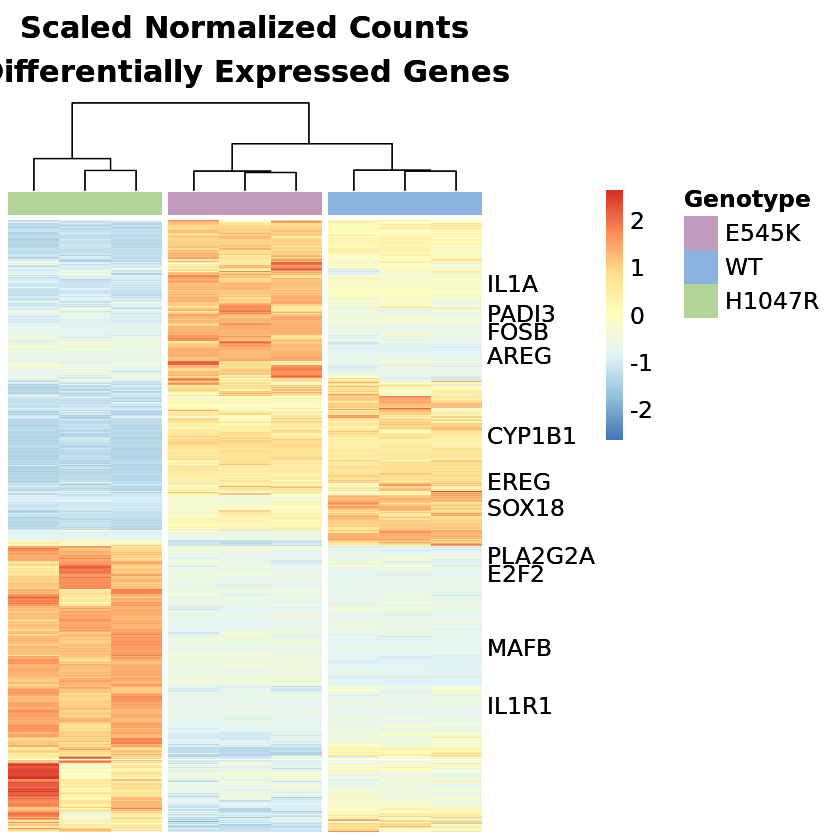

In [226]:
p <- pheatmap(MCF10A_normCounts_symbs,
              clustering_distance_cols = "euclidean", 
              clustering_distance_rows = "euclidean", 
              annotation_col = colMeta_df,
              fontsize_number = 2, 
              scale = "row", 
              cutree_cols = 3,
              treeheight_row = 0,
#               show_rownames = FALSE,
              show_colnames = FALSE,
              annotation_colors = ann_colors,
              annotation_names_col = FALSE,
#               legend_breaks = c(-2, -1, 0, 1, 2, 3),
#               legend_labels = c("-2", "-1", "0", "1", "2", "Scaled Normalized\nExpression\n"),
#               legend = TRUE,
              main = "Scaled Normalized Counts\nDifferentially Expressed Genes",
              fontsize = 14
             )
p

In [227]:
pdf(file = "/data/park_lab/adam/figures/RNAseq_heatmap_4-3.pdf", width = 8, height = 8)
p
dev.off()

png 
  2

### Making a new WT comp Expression Figure

In [42]:
library("tidyverse")
library("org.Hs.eg.db")
library("ggrepel")
library("DESeq2")
setwd("/data/park_lab/adam/Total_RNA")
load("Total_RNA_env.RData")
ls()

Warning message:
“namespace ‘clusterProfiler’ is not available and has been replaced
by .GlobalEnv when processing object ‘.GOTERM_Env’”


[1] "all_diff_genes"                           
  [2] "AREG_exp"                                 
  [3] "AREG_exp_raw"                             
  [4] "cancer_coldata"                           
  [5] "cancer_counts"                            
  [6] "cancer_dds"                               
  [7] "cancer_dds_f"                             
  [8] "cancer_diff_genes"                        
  [9] "cancer_ex9vex20_over"                     
 [10] "cancer_ex9vex20_res"                      
 [11] "cancer_ex9vex20_resSig_padj"              
 [12] "cancer_ex9vex20_under"                    
 [13] "cancer_filt"                              
 [14] "cancer_genotype"                          
 [15] "cancer_norm_sigset"                       
 [16] "cancer_normalized_counts_f"               
 [17] "cancer_normalized_counts_f_nonames"       
 [18] "cancer_rlog"                              
 [19] "cancer_sampleDistMatrix"                  
 [20] "cancer_samples"                           
 [21] "cancer_vst"                               
 [22] "cancer_WTvex20_over"                      
 [23] "cancer_WTvex20_res"                       
 [24] "cancer_WTvex20_resSig_padj"               
 [25] "cancer_WTvex20_under"                     
 [26] "cancer_WTvex9_over"                       
 [27] "cancer_WTvex9_over_clean"                 
 [28] "cancer_WTvex9_over_symbols"               
 [29] "cancer_WTvex9_res"                        
 [30] "cancer_WTvex9_resSig_padj"                
 [31] "cancer_WTvex9_under"                      
 [32] "cancer_WTvex9_under_clean"                
 [33] "cancer_WTvex9_under_symbols"              
 [34] "cancerDists"                              
 [35] "cluster_df"                               
 [36] "cluster3"                                 
 [37] "cluster3_genes"                           
 [38] "cluster3_genes_clean"                     
 [39] "cluster3_GOBP"                            
 [40] "cluster9"                                 
 [41] "cluster9_genes"                           
 [42] "cluster9_genes_clean"                     
 [43] "cluster9_GOBP"                            
 [44] "clusters"                                 
 [45] "datares_HC"                               
 [46] "dds_LRT"                                  
 [47] "diff_ex9vex20"                            
 [48] "diff_ex9vex20_sig"                        
 [49] "diff_WTvex20"                             
 [50] "diff_WTvex20_sig"                         
 [51] "diff_WTvex9"                              
 [52] "diff_WTvex9_sig"                          
 [53] "E545K_expressed_E545K_interacting_overlap"
 [54] "E545K_expressed_interacting_overlap"      
 [55] "E545K_expressed_WT_interacting_overlap"   
 [56] "E545K_goi"                                
 [57] "E545K_unite_genelist"                     
 [58] "E545Kdiffgenesvolc"                       
 [59] "ens.str"                                  
 [60] "ens.str_ex9vex20"                         
 [61] "ens.str_WTvex20"                          
 [62] "ens.str_WTvex9"                           
 [63] "ETV5_exp"                                 
 [64] "ex9vex20_combined"                        
 [65] "ex9vex20_combined_GOBP"                   
 [66] "ex9vex20_combined_GOBP_nocan"             
 [67] "ex9vex20_combined_nocan"                  
 [68] "ex9vex20_genes_log2fc_1.5"                
 [69] "ex9vex20_genes_log2fc_1.5_entrez"         
 [70] "ex9vex20_genes_log2fc_1.5_entrez_df"      
 [71] "ex9vex20_genes_padj"                      
 [72] "ex9vex20_genes_padj_entrez"               
 [73] "ex9vex20_GOBP"                            
 [74] "ex9vex20_GOMF"                            
 [75] "ex9vex20_KEGG"                            
 [76] "ex9vex20_over_clean"                      
 [77] "ex9vex20_over_clean_nocan"                
 [78] "ex9vex20_over_common"                     
 [79] "ex9vex20_over_common_GOBP"                
 [80] "ex9vex20_over_common_GOBP_nocan"          
 [

In [11]:
MCF10A_dds <- DESeq(MCF10A_dds)

estimating size factors

estimating dispersions

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates

fitting model and testing



In [12]:
MCF10A_normalized_counts <- counts(MCF10A_dds, normalized=TRUE) %>% as.data.frame()
MCF10A_normalized_counts

,MCF10A_E545K_rep1,MCF10A_E545K_rep2,MCF10A_E545K_rep3,MCF10A_parental_rep1,MCF10A_parental_rep2,MCF10A_parental_rep3,MCF10A_H1047R_rep1,MCF10A_H1047R_rep2,MCF10A_H1047R_rep3
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ENSG00000223972.5,2.506292,3.305122,0.000000,1.326588,0.000000,0.000000,2.0653848,0.3088647,1.0198098
ENSG00000227232.5,149.124398,178.476599,159.888504,195.008508,190.542727,181.615826,246.2971382,349.9437281,391.2670223
ENSG00000278267.1,36.341240,56.187077,42.636934,41.124243,60.369973,37.836630,51.1182740,51.8892730,69.6870022
ENSG00000243485.5,5.012585,0.000000,0.000000,0.000000,0.000000,0.000000,3.0980772,0.0000000,2.0396196
ENSG00000284332.1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0000000,0.0000000,0.0000000
ENSG00000237613.2,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0000000,0.0000000,0.0000000
ENSG00000268020.3,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0000000,0.0000000,0.0000000
ENSG00000240361.2,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0000000,0.0000000,0.0000000
ENSG00000186092.6,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0000000,0.0000000,0.0000000


In [13]:
rownames(MCF10A_normalized_counts) <- rownames(MCF10A_normalized_counts) %>% 
                                    tools::file_path_sans_ext()
MCF10A_normalized_counts

,MCF10A_E545K_rep1,MCF10A_E545K_rep2,MCF10A_E545K_rep3,MCF10A_parental_rep1,MCF10A_parental_rep2,MCF10A_parental_rep3,MCF10A_H1047R_rep1,MCF10A_H1047R_rep2,MCF10A_H1047R_rep3
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ENSG00000223972,2.506292,3.305122,0.000000,1.326588,0.000000,0.000000,2.0653848,0.3088647,1.0198098
ENSG00000227232,149.124398,178.476599,159.888504,195.008508,190.542727,181.615826,246.2971382,349.9437281,391.2670223
ENSG00000278267,36.341240,56.187077,42.636934,41.124243,60.369973,37.836630,51.1182740,51.8892730,69.6870022
ENSG00000243485,5.012585,0.000000,0.000000,0.000000,0.000000,0.000000,3.0980772,0.0000000,2.0396196
ENSG00000284332,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0000000,0.0000000,0.0000000
ENSG00000237613,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0000000,0.0000000,0.0000000
ENSG00000268020,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0000000,0.0000000,0.0000000
ENSG00000240361,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0000000,0.0000000,0.0000000
ENSG00000186092,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0000000,0.0000000,0.0000000


In [14]:
E545K_unite_genelist <- readRDS("/data/park_lab/adam/figures/E545K_unite_genelist.rds")
H1047R_unite_genelist <- readRDS("/data/park_lab/adam/figures/H1047R_unite_genelist.rds")

In [15]:
E545K_unite_genelist
H1047R_unite_genelist

,rowname,log2FoldChange,symbol_col,padj
,<chr>,<dbl>,<chr>,<dbl>
ENSG00000117148,myRNA_MCF10A_WTvex9,-1.787999,ACTL8,1.558454e-02
ENSG00000223382,myRNA_MCF10A_WTvex9,-1.707627,LINC01778,4.648350e-03
ENSG00000092853,myRNA_MCF10A_WTvex9,-1.587697,CLSPN,6.545621e-24
ENSG00000171812,myRNA_MCF10A_WTvex9,-1.623644,COL8A2,6.340255e-03
ENSG00000222009,myRNA_MCF10A_WTvex9,-2.252911,BTBD19,9.996070e-33
ENSG00000186377,myRNA_MCF10A_WTvex9,-2.753097,CYP4X1,8.986998e-13
ENSG00000169213,myRNA_MCF10A_WTvex9,-3.163991,RAB3B,2.338030e-27
ENSG00000081985,myRNA_MCF10A_WTvex9,-1.701784,IL12RB2,7.348190e-05
ENSG00000171517,myRNA_MCF10A_WTvex9,-1.702782,LPAR3,4.435616e-38


,rowname,log2FoldChange,symbol_col,padj
,<chr>,<dbl>,<chr>,<dbl>
ENSG00000157873,myRNA_MCF10A_WTvex20,-1.942156,TNFRSF14,1.932481e-19
ENSG00000236423,myRNA_MCF10A_WTvex20,-2.154102,LINC01134,1.696185e-21
ENSG00000187017,myRNA_MCF10A_WTvex20,-2.088529,ESPN,4.002241e-191
ENSG00000284693,myRNA_MCF10A_WTvex20,-2.299545,LINC02606,1.692621e-08
ENSG00000239149,myRNA_MCF10A_WTvex20,-1.509310,SNORA59B,8.036054e-04
ENSG00000117115,myRNA_MCF10A_WTvex20,-4.118926,PADI2,1.012388e-125
ENSG00000204219,myRNA_MCF10A_WTvex20,-1.885079,TCEA3,1.702500e-30
ENSG00000007968,myRNA_MCF10A_WTvex20,-2.189308,E2F2,1.093726e-47
ENSG00000158055,myRNA_MCF10A_WTvex20,-2.452590,GRHL3,1.941276e-167


In [16]:
MCF10A_normalized_counts$Ensembl <- rownames(MCF10A_normalized_counts)
MCF10A_normalized_counts

,MCF10A_E545K_rep1,MCF10A_E545K_rep2,MCF10A_E545K_rep3,MCF10A_parental_rep1,MCF10A_parental_rep2,MCF10A_parental_rep3,MCF10A_H1047R_rep1,MCF10A_H1047R_rep2,MCF10A_H1047R_rep3,Ensembl
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
ENSG00000223972,2.506292,3.305122,0.000000,1.326588,0.000000,0.000000,2.0653848,0.3088647,1.0198098,ENSG00000223972
ENSG00000227232,149.124398,178.476599,159.888504,195.008508,190.542727,181.615826,246.2971382,349.9437281,391.2670223,ENSG00000227232
ENSG00000278267,36.341240,56.187077,42.636934,41.124243,60.369973,37.836630,51.1182740,51.8892730,69.6870022,ENSG00000278267
ENSG00000243485,5.012585,0.000000,0.000000,0.000000,0.000000,0.000000,3.0980772,0.0000000,2.0396196,ENSG00000243485
ENSG00000284332,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0000000,0.0000000,0.0000000,ENSG00000284332
ENSG00000237613,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0000000,0.0000000,0.0000000,ENSG00000237613
ENSG00000268020,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0000000,0.0000000,0.0000000,ENSG00000268020
ENSG00000240361,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0000000,0.0000000,0.0000000,ENSG00000240361
ENSG00000186092,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0000000,0.0000000,0.0000000,ENSG00000186092


In [17]:
E545K_goi <- MCF10A_normalized_counts %>% 
            filter(Ensembl %in% 
                   rownames(E545K_unite_genelist))
E545K_goi

,MCF10A_E545K_rep1,MCF10A_E545K_rep2,MCF10A_E545K_rep3,MCF10A_parental_rep1,MCF10A_parental_rep2,MCF10A_parental_rep3,MCF10A_H1047R_rep1,MCF10A_H1047R_rep2,MCF10A_H1047R_rep3,Ensembl
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
ENSG00000117148,52.63214,36.35634,42.63693,5.306354,26.411863,7.567326,16.523078,7.412753,5.438986,ENSG00000117148
ENSG00000223382,36.34124,42.96659,49.74309,6.632942,13.205932,20.810147,21.686540,46.947437,33.993660,ENSG00000223382
ENSG00000092853,1057.65540,1090.69033,913.14101,344.913008,362.219838,314.044032,312.905798,207.248227,224.018217,ENSG00000092853
ENSG00000171812,38.84753,59.49220,42.63693,10.612708,18.865617,17.026484,9.810578,21.002801,11.897781,ENSG00000171812
ENSG00000222009,713.04019,860.98433,708.83903,192.355331,152.811494,130.536375,271.081756,363.533776,389.227403,ENSG00000222009
ENSG00000186377,213.03485,221.44319,216.73775,35.817889,35.844671,24.593810,15.490386,30.268743,45.551504,ENSG00000186377
ENSG00000169213,318.29914,277.63026,293.12892,31.838124,30.184986,37.836630,24.784618,40.152414,36.033279,ENSG00000169213
ENSG00000081985,126.56777,99.15367,138.57004,38.471066,45.277480,28.377473,52.150966,72.583209,138.694131,ENSG00000081985
ENSG00000171517,1560.16703,1612.89963,1906.22628,453.693264,599.926606,514.578173,290.186565,223.000328,259.711560,ENSG00000171517


In [18]:
H1047R_goi <- MCF10A_normalized_counts %>% 
            filter(Ensembl %in% 
                   rownames(H1047R_unite_genelist))
H1047R_goi

,MCF10A_E545K_rep1,MCF10A_E545K_rep2,MCF10A_E545K_rep3,MCF10A_parental_rep1,MCF10A_parental_rep2,MCF10A_parental_rep3,MCF10A_H1047R_rep1,MCF10A_H1047R_rep2,MCF10A_H1047R_rep3,Ensembl
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
ENSG00000157873,187.97193,158.645866,202.525439,55.71672,71.68934,71.88960,267.98368,232.57513,248.15372,ENSG00000157873
ENSG00000236423,169.17474,208.222699,184.760049,68.98260,118.85338,83.24059,333.55965,376.19723,464.35339,ENSG00000236423
ENSG00000187017,2451.15398,2566.427388,2789.166128,1009.53384,1016.85673,1006.45437,4386.36098,4018.33001,4332.49192,ENSG00000187017
ENSG00000284693,30.07551,36.356344,7.106156,34.49130,22.63874,24.59381,116.69424,151.65258,133.59508,ENSG00000284693
ENSG00000239149,25.06292,16.525611,30.201162,26.53177,24.52530,17.02648,46.47116,70.42116,75.12599,ENSG00000239149
ENSG00000117115,129.07406,105.763910,127.910803,156.53744,120.73995,134.32004,3073.80894,2138.27046,1924.04113,ENSG00000117115
ENSG00000204219,274.43902,211.527821,245.162373,124.69932,126.39963,138.10370,446.12312,487.38853,481.01028,ENSG00000204219
ENSG00000007968,324.56487,310.681487,300.235080,238.78593,186.76960,202.42597,1118.40587,944.50831,791.71233,ENSG00000007968
ENSG00000158055,1057.65540,1275.777169,1211.599553,537.26834,565.96850,491.87619,2806.85795,2936.06803,2880.28278,ENSG00000158055


In [12]:
E545K_goi_select <- E545K_goi %>% 
    mutate(E545Kav = rowMeans(dplyr::select(.,starts_with("MCF10A_E545K_rep")), 
    na.rm = TRUE)) %>% 
    mutate(H1047Rav = rowMeans(dplyr::select(.,starts_with("MCF10A_H1047R_rep")), 
            na.rm = TRUE)) %>%
    mutate(WTav = rowMeans(dplyr::select(.,starts_with("MCF10A_parental_rep")), 
            na.rm = TRUE)) %>%
    dplyr::select(c("Ensembl", "E545Kav", "H1047Rav", "WTav"))
E545K_goi_select

,Ensembl,E545Kav,H1047Rav,WTav
,<chr>,<dbl>,<dbl>,<dbl>
ENSG00000117148,ENSG00000117148,43.87514,9.791606,13.095181
ENSG00000223382,ENSG00000223382,43.01697,34.209213,13.549674
ENSG00000092853,ENSG00000092853,1020.49558,248.057414,340.392292
ENSG00000171812,ENSG00000171812,46.99222,14.237053,15.501603
ENSG00000222009,ENSG00000222009,760.95452,341.280978,158.567733
ENSG00000186377,ENSG00000186377,217.07193,30.436878,32.085457
ENSG00000169213,ENSG00000169213,296.35278,33.656770,33.286580
ENSG00000081985,ENSG00000081985,121.43049,87.809436,37.375340
ENSG00000171517,ENSG00000171517,1693.09765,257.632818,522.732681


In [13]:
H1047R_goi_select <- H1047R_goi %>% 
    mutate(E545Kav = rowMeans(dplyr::select(.,starts_with("MCF10A_E545K_rep")), 
    na.rm = TRUE)) %>% 
    mutate(H1047Rav = rowMeans(dplyr::select(.,starts_with("MCF10A_H1047R_rep")), 
            na.rm = TRUE)) %>%
    mutate(WTav = rowMeans(dplyr::select(.,starts_with("MCF10A_parental_rep")), 
            na.rm = TRUE)) %>%
    dplyr::select(c("Ensembl", "E545Kav", "H1047Rav", "WTav"))
H1047R_goi_select

,Ensembl,E545Kav,H1047Rav,WTav
,<chr>,<dbl>,<dbl>,<dbl>
ENSG00000157873,ENSG00000157873,183.04774,249.57084,66.43189
ENSG00000236423,ENSG00000236423,187.38583,391.37009,90.35886
ENSG00000187017,ENSG00000187017,2602.24916,4245.72764,1010.94831
ENSG00000284693,ENSG00000284693,24.51267,133.98063,27.24128
ENSG00000239149,ENSG00000239149,23.92990,64.00610,22.69452
ENSG00000117115,ENSG00000117115,120.91626,2378.70684,137.19914
ENSG00000204219,ENSG00000204219,243.70974,471.50731,129.73422
ENSG00000007968,ENSG00000007968,311.82714,951.54217,209.32717
ENSG00000158055,ENSG00000158055,1181.67737,2874.40292,531.70434


In [14]:
total_counts_select <- MCF10A_normalized_counts %>% 
    mutate(E545Kav = rowMeans(dplyr::select(.,starts_with("MCF10A_E545K_rep")), 
    na.rm = TRUE)) %>% 
    mutate(H1047Rav = rowMeans(dplyr::select(.,starts_with("MCF10A_H1047R_rep")), 
            na.rm = TRUE)) %>%
    mutate(WTav = rowMeans(dplyr::select(.,starts_with("MCF10A_parental_rep")), 
            na.rm = TRUE)) %>%
    dplyr::select(c("Ensembl", "E545Kav", "H1047Rav", "WTav"))
total_counts_select

,Ensembl,E545Kav,H1047Rav,WTav
,<chr>,<dbl>,<dbl>,<dbl>
ENSG00000223972,ENSG00000223972,1.9371382,1.1313531,0.4421962
ENSG00000227232,ENSG00000227232,162.4965004,329.1692962,189.0556870
ENSG00000278267,ENSG00000278267,45.0550839,57.5648497,46.4436155
ENSG00000243485,ENSG00000243485,1.6708616,1.7125656,0.0000000
ENSG00000284332,ENSG00000284332,0.0000000,0.0000000,0.0000000
ENSG00000237613,ENSG00000237613,0.0000000,0.0000000,0.0000000
ENSG00000268020,ENSG00000268020,0.0000000,0.0000000,0.0000000
ENSG00000240361,ENSG00000240361,0.0000000,0.0000000,0.0000000
ENSG00000186092,ENSG00000186092,0.0000000,0.0000000,0.0000000


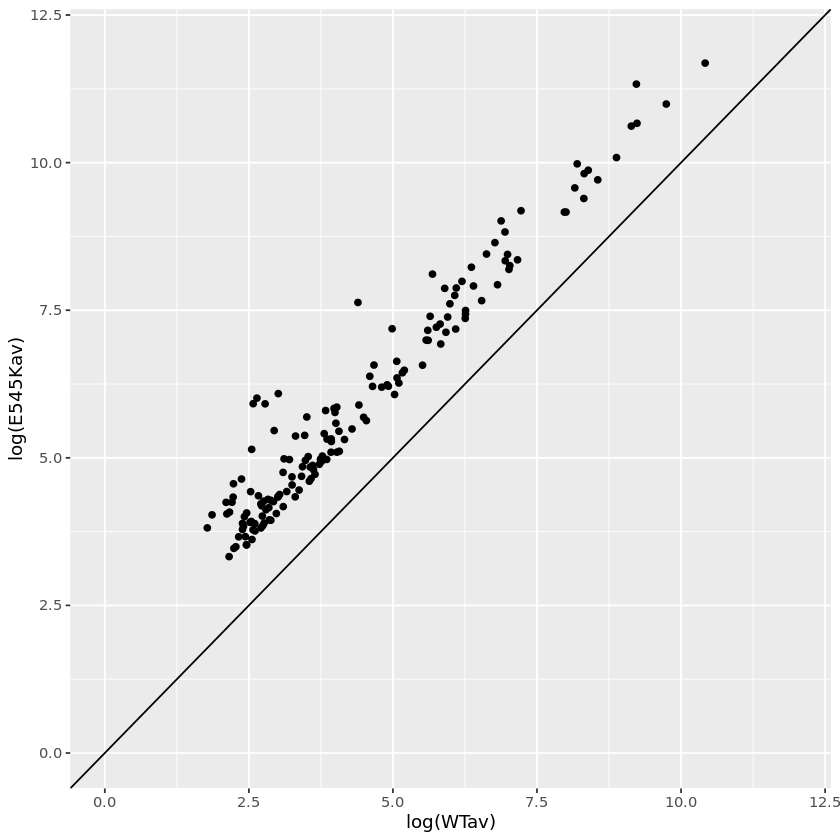

In [13]:
E545K_goi_select %>% ggplot(aes(x = log(WTav), y = log(E545Kav))) + 
    geom_point() + geom_abline(slope = 1, intercept = 0) +
    coord_cartesian(xlim = c(0,12), ylim = c(0,12))

In [14]:
E545Kcolor_counts_select <- total_counts_select %>% mutate(mycolor = ifelse(
                             Ensembl %in% E545K_goi_select$Ensembl, 
                                                1, 2))
# E545Kcolor_counts_select$mycolor <- as.factor(E545Kcolor_counts_select$mycolor)
E545Kcolor_counts_select <- E545Kcolor_counts_select %>% arrange(desc(mycolor))
E545Kcolor_counts_select

,Ensembl,E545Kav,H1047Rav,WTav,mycolor
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
ENSG00000223972,ENSG00000223972,1.9371382,1.1313531,0.4421962,2
ENSG00000227232,ENSG00000227232,162.4965004,329.1692962,189.0556870,2
ENSG00000278267,ENSG00000278267,45.0550839,57.5648497,46.4436155,2
ENSG00000243485,ENSG00000243485,1.6708616,1.7125656,0.0000000,2
ENSG00000284332,ENSG00000284332,0.0000000,0.0000000,0.0000000,2
ENSG00000237613,ENSG00000237613,0.0000000,0.0000000,0.0000000,2
ENSG00000268020,ENSG00000268020,0.0000000,0.0000000,0.0000000,2
ENSG00000240361,ENSG00000240361,0.0000000,0.0000000,0.0000000,2
ENSG00000186092,ENSG00000186092,0.0000000,0.0000000,0.0000000,2


Warning message:
“Removed 4216 rows containing missing values (`geom_point()`).”


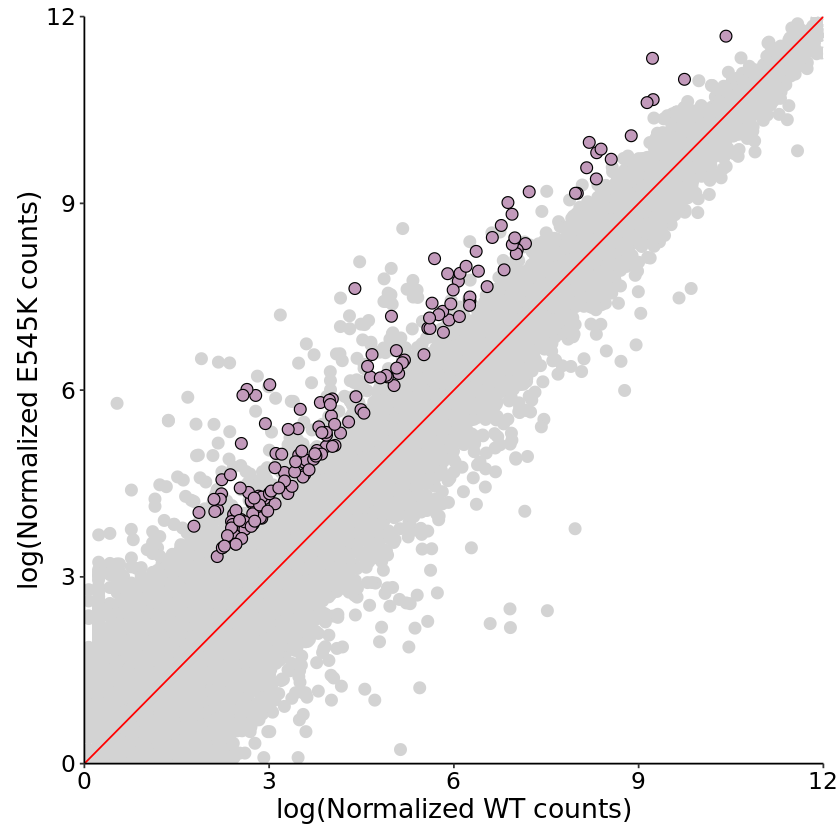

In [21]:
E545K_spray <- E545Kcolor_counts_select %>% filter(E545Kav > 0) %>% filter(WTav > 0) %>%
    ggplot(aes(x = log(WTav), y = log(E545Kav), fill = as.factor(mycolor),
               color = as.factor(mycolor))) + 
    geom_point(shape = 21, size = 3) + geom_abline(slope = 1, intercept = 0, color = "red") +
    scale_fill_manual(values = c("#C29ABB", "lightgrey")) +
    scale_color_manual(values = c("black", "lightgrey")) +
    scale_y_continuous(limits = c(0,12), expand = c(0, 0)) +
    scale_x_continuous(limits = c(0,12), expand = c(0, 0)) +
    ylab(label = "log(Normalized E545K counts)") +
    xlab(label = "log(Normalized WT counts)") +
    theme_classic() + theme(text = element_text(family = "Arial", color = "black"),
                          axis.title = element_text(size = 16),
                          axis.text = element_text(size = 14, colour = "black"),
                          plot.title = element_text(size = 20),
                          plot.subtitle = element_text(size = 14),
                          strip.text = element_text(size = 12),
                          legend.position = "none",
                          legend.text = element_text(size = 12),
                          legend.title = element_text(size = 14),
                          plot.margin = margin(10, 10, 10, 10))
E545K_spray

In [16]:
H1047Rcolor_counts_select <- total_counts_select %>% mutate(mycolor = ifelse(
                             Ensembl %in% H1047R_goi_select$Ensembl, 
                                                1, 2))
# H1047Rcolor_counts_select$mycolor <- as.factor(H1047Rcolor_counts_select$mycolor)
H1047Rcolor_counts_select <- H1047Rcolor_counts_select %>% arrange(desc(mycolor))
H1047Rcolor_counts_select

,Ensembl,E545Kav,H1047Rav,WTav,mycolor
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
ENSG00000223972,ENSG00000223972,1.9371382,1.1313531,0.4421962,2
ENSG00000227232,ENSG00000227232,162.4965004,329.1692962,189.0556870,2
ENSG00000278267,ENSG00000278267,45.0550839,57.5648497,46.4436155,2
ENSG00000243485,ENSG00000243485,1.6708616,1.7125656,0.0000000,2
ENSG00000284332,ENSG00000284332,0.0000000,0.0000000,0.0000000,2
ENSG00000237613,ENSG00000237613,0.0000000,0.0000000,0.0000000,2
ENSG00000268020,ENSG00000268020,0.0000000,0.0000000,0.0000000,2
ENSG00000240361,ENSG00000240361,0.0000000,0.0000000,0.0000000,2
ENSG00000186092,ENSG00000186092,0.0000000,0.0000000,0.0000000,2


Warning message:
“Removed 9061 rows containing missing values (`geom_point()`).”


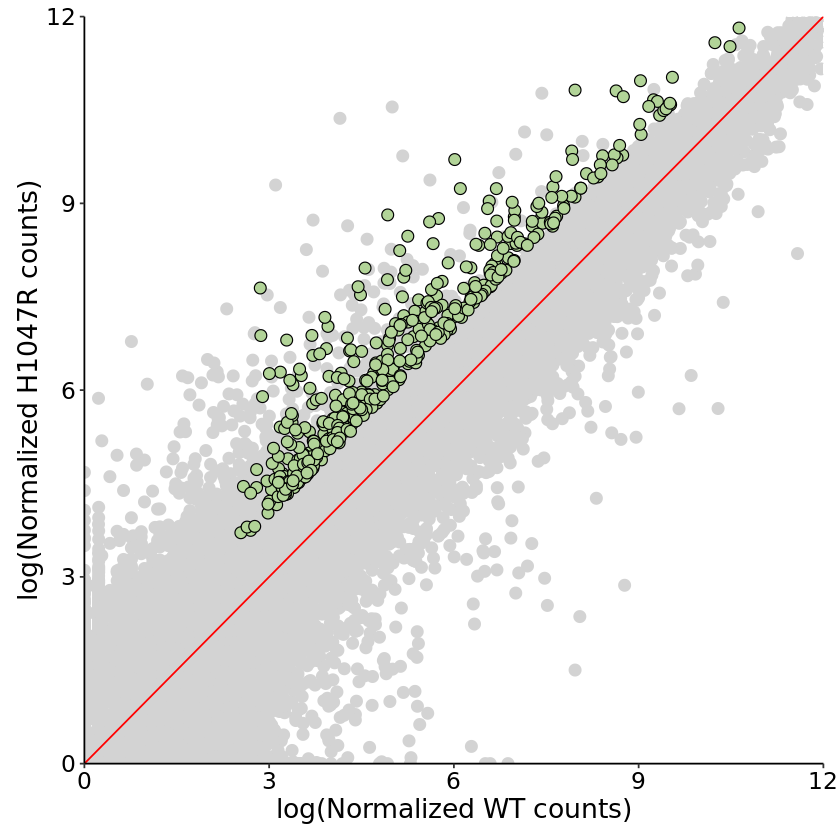

In [22]:
H1047R_spray <- H1047Rcolor_counts_select %>%
    ggplot(aes(x = log(WTav), y = log(H1047Rav), fill = as.factor(mycolor),
               color = as.factor(mycolor))) + 
    geom_point(shape = 21, size = 3) + geom_abline(slope = 1, intercept = 0, color = "red") +
    scale_fill_manual(values = c("#B2D498", "lightgrey")) +
    scale_color_manual(values = c("black", "lightgrey")) +
    scale_y_continuous(limits = c(0,12), expand = c(0, 0)) +
    scale_x_continuous(limits = c(0,12), expand = c(0, 0)) +
    ylab(label = "log(Normalized H1047R counts)") +
    xlab(label = "log(Normalized WT counts)") +
    theme_classic() + theme(text = element_text(family = "Arial", color = "black"),
                          axis.title = element_text(size = 16),
                          axis.text = element_text(size = 14, colour = "black"),
                          plot.title = element_text(size = 20),
                          plot.subtitle = element_text(size = 14),
                          strip.text = element_text(size = 12),
                          legend.position = "none",
                          legend.text = element_text(size = 12),
                          legend.title = element_text(size = 14),
                          plot.margin = margin(10, 10, 10, 10))
H1047R_spray

In [23]:
ggsave(filename="/data/park_lab/adam/figures/E545Kspray8-25.pdf", 
       plot = E545K_spray, device = cairo_pdf, width = 8, height = 8)
ggsave(filename="/data/park_lab/adam/figures/H1047Rspray8-25.pdf", 
       plot = H1047R_spray, device = cairo_pdf, width = 8, height = 8)

Warning message:
“Removed 4216 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 9061 rows containing missing values (`geom_point()`).”


In [91]:
# pdf(file = "/data/park_lab/adam/figures/RNAseq_heatmap_1B_2-13.pdf", width = 8, height = 8)
# p
# dev.off()

png 
  2

### Making new volcanoes for emily

In [2]:
MCF10A_WTvex9_res <- MCF10A_WTvex9_res %>% as.data.frame()
MCF10A_WTvex20_res <- MCF10A_WTvex20_res %>% as.data.frame()
MCF10A_WTvex9_res

,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ENSG00000227232.5,228.49968,0.21925149,0.21498719,1.0198351,3.078067e-01,4.268860e-01
ENSG00000278267.1,49.95994,0.04175588,0.37459715,0.1114688,9.112446e-01,9.412209e-01
ENSG00000238009.6,28.51625,-1.10300426,0.56812573,-1.9414792,5.220018e-02,9.940452e-02
ENSG00000233750.3,69.85035,-1.32106258,0.38261501,-3.4527202,5.549643e-04,1.747321e-03
ENSG00000268903.1,272.18446,-0.69874816,0.22369478,-3.1236677,1.786120e-03,5.091017e-03
ENSG00000269981.1,239.55302,-0.92283204,0.20631657,-4.4728935,7.716821e-06,3.319562e-05
ENSG00000241860.7,92.05262,-0.53940222,0.31908437,-1.6904689,9.093828e-02,1.592446e-01
ENSG00000279457.4,419.34413,0.60349097,0.18282812,3.3008650,9.638724e-04,2.899892e-03
ENSG00000228463.10,46.78400,-0.97398419,0.40330220,-2.4150233,1.573420e-02,3.525916e-02


In [3]:
ens.str <- substr(rownames(MCF10A_WTvex9_res), 1, 15)
genes <- mapIds(org.Hs.eg.db,
                keys = ens.str,
                column = "SYMBOL",
                keytype = "ENSEMBL",
                multiVals= "first")
str(genes)
genes <- as.character(genes)
genes
MCF10A_WTvex9_res$symbols <- genes
head(MCF10A_WTvex9_res)

'select()' returned 1:many mapping between keys and columns



 Named chr [1:21734] "WASH7P" "MIR6859-1" "LOC100996442" "CICP27" NA NA NA ...
 - attr(*, "names")= chr [1:21734] "ENSG00000227232" "ENSG00000278267" "ENSG00000238009" "ENSG00000233750" ...


[1] "WASH7P"                    "MIR6859-1"                
    [3] "LOC100996442"              "CICP27"                   
    [5] NA                          NA                         
    [7] NA                          "WASH9P"                   
    [9] "RPL23AP21"                 NA                         
   [11] "LOC101928626"              "MTND2P28"                 
   [13] "MTCO1P12"                  "MTCO2P12"                 
   [15] "MTATP6P1"                  NA                         
   [17] "LINC01409"                 NA                         
   [19] "FAM87B"                    "LINC01128"                
   [21] "LINC00115"                 NA                         
   [23] NA                          NA                         
   [25] "LINC02593"                 "SAMD11"                   
   [27] "NOC2L"                     "KLHL17"                   
   [29] "PLEKHN1"                   "PERM1"                    
   [31] NA                          "HES4"                     
   [33] "ISG15"                     "AGRN"                     
   [35] NA                          "LOC100288175"             
   [37] NA                          "RNF223"                   
   [39] "C1orf159"                  NA                         
   [41] NA                          "SDF4"                     
   [43] "B3GALT6"                   "C1QTNF12"                 
   [45] "UBE2J2"                    "SCNN1D"                   
   [47] "ACAP3"                     "PUSL1"                    
   [49] "INTS11"                    "MIR6727"                  
   [51] NA                          "CPTP"                     
   [53] "TAS1R3"                    "DVL1"                     
   [55] "MIR6808"                   "MXRA8"                    
   [57] "AURKAIP1"                  "CCNL2"                    
   [59] "MRPL20-AS1"                "MRPL20"                   
   [61] "RN7SL657P"                 NA                         
   [63] "ANKRD65"                   "VWA1"                     
   [65] "ATAD3C"                    "ATAD3B"                   
   [67] NA                          "ATAD3A"                   
   [69] "TMEM240"                   "SSU72"                    
   [71] NA                          "FNDC10"                   
   [73] NA                          NA                         
   [75] "MIB2"                      "CDK11B"                   
   [77] NA                          "SLC35E2B"                 
   [79] NA                          "CDK11A"                   
   [81] NA                          NA                         
   [83] "SLC35E2A"                  "NADK"                     
   [85] "GNB1"                      NA                         
   [87] "CALML6"                    "TMEM52"                   
   [89] "CFAP74"                    "PRKCZ"                    
   [91] NA                          "PRKCZ-AS1"                
   [93] "FAAP20"                    "SKI"                      
   [95] "MORN1"                     "LOC100129534"             
   [97] "RER1"                      "PEX10"                    
   [99] "PLCH2"                     "PANK4"                    
  [101] NA                          "TNFRSF14"                 
  [103] "PRXL2B"                    "ARHGEF16"                 
  [105] "MEGF6"                     "TPRG1L"                   
  [107] "WRAP73"                    "TP73"                     
  [109] "TP73-AS1"                  "CCDC27"                   
  [111] "SMIM1"                     "LRRC47"                   
  [113] NA                          "CEP104"                   
  [115] "DFFB"                      "C1orf174"                 
  [117] "LINC01134"                 "NPHP4"                    
  [119] "KCNAB2"                    "CHD5"                     
  [121] NA                          "RPL22"                    
  [123] "RNF207-AS1"                "RNF207"                   
  [125] "ICMT"                      

,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,symbols
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
ENSG00000227232.5,228.49968,0.21925149,0.2149872,1.0198351,3.078067e-01,4.268860e-01,WASH7P
ENSG00000278267.1,49.95994,0.04175588,0.3745972,0.1114688,9.112446e-01,9.412209e-01,MIR6859-1
ENSG00000238009.6,28.51625,-1.10300426,0.5681257,-1.9414792,5.220018e-02,9.940452e-02,LOC100996442
ENSG00000233750.3,69.85035,-1.32106258,0.3826150,-3.4527202,5.549643e-04,1.747321e-03,CICP27
ENSG00000268903.1,272.18446,-0.69874816,0.2236948,-3.1236677,1.786120e-03,5.091017e-03,NA
ENSG00000269981.1,239.55302,-0.92283204,0.2063166,-4.4728935,7.716821e-06,3.319562e-05,NA


In [4]:
ens.str <- substr(rownames(MCF10A_WTvex20_res), 1, 15)
genes <- mapIds(org.Hs.eg.db,
                keys = ens.str,
                column = "SYMBOL",
                keytype = "ENSEMBL",
                multiVals= "first")
str(genes)
genes <- as.character(genes)
genes
MCF10A_WTvex20_res$symbols <- genes
head(MCF10A_WTvex20_res)

'select()' returned 1:many mapping between keys and columns



 Named chr [1:21734] "WASH7P" "MIR6859-1" "LOC100996442" "CICP27" NA NA NA ...
 - attr(*, "names")= chr [1:21734] "ENSG00000227232" "ENSG00000278267" "ENSG00000238009" "ENSG00000233750" ...


[1] "WASH7P"                    "MIR6859-1"                
    [3] "LOC100996442"              "CICP27"                   
    [5] NA                          NA                         
    [7] NA                          "WASH9P"                   
    [9] "RPL23AP21"                 NA                         
   [11] "LOC101928626"              "MTND2P28"                 
   [13] "MTCO1P12"                  "MTCO2P12"                 
   [15] "MTATP6P1"                  NA                         
   [17] "LINC01409"                 NA                         
   [19] "FAM87B"                    "LINC01128"                
   [21] "LINC00115"                 NA                         
   [23] NA                          NA                         
   [25] "LINC02593"                 "SAMD11"                   
   [27] "NOC2L"                     "KLHL17"                   
   [29] "PLEKHN1"                   "PERM1"                    
   [31] NA                          "HES4"                     
   [33] "ISG15"                     "AGRN"                     
   [35] NA                          "LOC100288175"             
   [37] NA                          "RNF223"                   
   [39] "C1orf159"                  NA                         
   [41] NA                          "SDF4"                     
   [43] "B3GALT6"                   "C1QTNF12"                 
   [45] "UBE2J2"                    "SCNN1D"                   
   [47] "ACAP3"                     "PUSL1"                    
   [49] "INTS11"                    "MIR6727"                  
   [51] NA                          "CPTP"                     
   [53] "TAS1R3"                    "DVL1"                     
   [55] "MIR6808"                   "MXRA8"                    
   [57] "AURKAIP1"                  "CCNL2"                    
   [59] "MRPL20-AS1"                "MRPL20"                   
   [61] "RN7SL657P"                 NA                         
   [63] "ANKRD65"                   "VWA1"                     
   [65] "ATAD3C"                    "ATAD3B"                   
   [67] NA                          "ATAD3A"                   
   [69] "TMEM240"                   "SSU72"                    
   [71] NA                          "FNDC10"                   
   [73] NA                          NA                         
   [75] "MIB2"                      "CDK11B"                   
   [77] NA                          "SLC35E2B"                 
   [79] NA                          "CDK11A"                   
   [81] NA                          NA                         
   [83] "SLC35E2A"                  "NADK"                     
   [85] "GNB1"                      NA                         
   [87] "CALML6"                    "TMEM52"                   
   [89] "CFAP74"                    "PRKCZ"                    
   [91] NA                          "PRKCZ-AS1"                
   [93] "FAAP20"                    "SKI"                      
   [95] "MORN1"                     "LOC100129534"             
   [97] "RER1"                      "PEX10"                    
   [99] "PLCH2"                     "PANK4"                    
  [101] NA                          "TNFRSF14"                 
  [103] "PRXL2B"                    "ARHGEF16"                 
  [105] "MEGF6"                     "TPRG1L"                   
  [107] "WRAP73"                    "TP73"                     
  [109] "TP73-AS1"                  "CCDC27"                   
  [111] "SMIM1"                     "LRRC47"                   
  [113] NA                          "CEP104"                   
  [115] "DFFB"                      "C1orf174"                 
  [117] "LINC01134"                 "NPHP4"                    
  [119] "KCNAB2"                    "CHD5"                     
  [121] NA                          "RPL22"                    
  [123] "RNF207-AS1"                "RNF207"                   
  [125] "ICMT"                      

,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,symbols
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
ENSG00000227232.5,228.49968,-0.8233645,0.2009822,-4.0967037,4.190747e-05,0.0000988134,WASH7P
ENSG00000278267.1,49.95994,-0.3397878,0.3477980,-0.9769687,3.285846e-01,0.4024286649,MIR6859-1
ENSG00000238009.6,28.51625,-0.2713886,0.5554814,-0.4885646,6.251500e-01,0.6907326820,LOC100996442
ENSG00000233750.3,69.85035,-1.0560432,0.3719480,-2.8392228,4.522357e-03,0.0082316984,CICP27
ENSG00000268903.1,272.18446,-0.1275274,0.2193967,-0.5812640,5.610625e-01,0.6326949882,NA
ENSG00000269981.1,239.55302,-0.2709561,0.2014872,-1.3447808,1.786960e-01,0.2367360279,NA


In [5]:
MCF10A_WTvex9_res_df <- MCF10A_WTvex9_res %>% filter(!symbols == "NA")
MCF10A_WTvex20_res_df <- MCF10A_WTvex20_res %>% filter(!symbols == "NA")
head(MCF10A_WTvex9_res_df)

,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,symbols
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
ENSG00000227232.5,228.49968,0.21925149,0.2149872,1.0198351,0.3078066557,0.426886003,WASH7P
ENSG00000278267.1,49.95994,0.04175588,0.3745972,0.1114688,0.9112446269,0.941220919,MIR6859-1
ENSG00000238009.6,28.51625,-1.10300426,0.5681257,-1.9414792,0.0522001837,0.099404522,LOC100996442
ENSG00000233750.3,69.85035,-1.32106258,0.3826150,-3.4527202,0.0005549643,0.001747321,CICP27
ENSG00000279457.4,419.34413,0.60349097,0.1828281,3.3008650,0.0009638724,0.002899892,WASH9P
ENSG00000228463.10,46.78400,-0.97398419,0.4033022,-2.4150233,0.0157342048,0.035259159,RPL23AP21


In [6]:
MCF10A_WTvex9_res_df$Ensembl <- rownames(MCF10A_WTvex9_res_df) %>% 
    tools::file_path_sans_ext()
MCF10A_WTvex20_res_df$Ensembl <- rownames(MCF10A_WTvex20_res_df) %>% 
    tools::file_path_sans_ext()

In [19]:
MCF10A_WTvex9_res_df <- MCF10A_WTvex9_res_df %>% mutate(mycolor = ifelse(
                             Ensembl %in% rownames(E545K_goi), 
                                                1, 2))
# E545Kcolor_counts_select$mycolor <- as.factor(E545Kcolor_counts_select$mycolor)
MCF10A_WTvex9_res_df <- MCF10A_WTvex9_res_df %>% arrange(desc(mycolor))
MCF10A_WTvex9_res_df

,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,symbols,Ensembl,mycolor
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<dbl>
ENSG00000227232.5,228.49968,0.21925149,0.21498719,1.0198351,3.078067e-01,4.268860e-01,WASH7P,ENSG00000227232,2
ENSG00000278267.1,49.95994,0.04175588,0.37459715,0.1114688,9.112446e-01,9.412209e-01,MIR6859-1,ENSG00000278267,2
ENSG00000238009.6,28.51625,-1.10300426,0.56812573,-1.9414792,5.220018e-02,9.940452e-02,LOC100996442,ENSG00000238009,2
ENSG00000233750.3,69.85035,-1.32106258,0.38261501,-3.4527202,5.549643e-04,1.747321e-03,CICP27,ENSG00000233750,2
ENSG00000279457.4,419.34413,0.60349097,0.18282812,3.3008650,9.638724e-04,2.899892e-03,WASH9P,ENSG00000279457,2
ENSG00000228463.10,46.78400,-0.97398419,0.40330220,-2.4150233,1.573420e-02,3.525916e-02,RPL23AP21,ENSG00000228463,2
ENSG00000230021.10,127.05106,0.20408265,0.21262656,0.9598173,3.371472e-01,4.579031e-01,LOC101928626,ENSG00000230021,2
ENSG00000225630.1,1028.94673,-0.18979440,0.29964628,-0.6333948,5.264758e-01,6.403531e-01,MTND2P28,ENSG00000225630,2
ENSG00000237973.1,1795.62625,-0.04958380,0.08386708,-0.5912189,5.543737e-01,6.654209e-01,MTCO1P12,ENSG00000237973,2


In [20]:
summary(as.factor(MCF10A_WTvex9_res_df$mycolor))

1     2 
  160 16421

In [21]:
MCF10A_WTvex20_res_df <- MCF10A_WTvex20_res_df %>% mutate(mycolor = ifelse(
                             Ensembl %in% rownames(H1047R_goi), 
                                                1, 2))
# E545Kcolor_counts_select$mycolor <- as.factor(E545Kcolor_counts_select$mycolor)
MCF10A_WTvex20_res_df <- MCF10A_WTvex20_res_df %>% arrange(desc(mycolor))
MCF10A_WTvex20_res_df

,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,symbols,Ensembl,mycolor
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<dbl>
ENSG00000227232.5,228.49968,-0.82336452,0.20098220,-4.0967037,4.190747e-05,9.881340e-05,WASH7P,ENSG00000227232,2
ENSG00000278267.1,49.95994,-0.33978777,0.34779800,-0.9769687,3.285846e-01,4.024287e-01,MIR6859-1,ENSG00000278267,2
ENSG00000238009.6,28.51625,-0.27138856,0.55548138,-0.4885646,6.251500e-01,6.907327e-01,LOC100996442,ENSG00000238009,2
ENSG00000233750.3,69.85035,-1.05604322,0.37194800,-2.8392228,4.522357e-03,8.231698e-03,CICP27,ENSG00000233750,2
ENSG00000279457.4,419.34413,-0.31123652,0.17365836,-1.7922346,7.309540e-02,1.064845e-01,WASH9P,ENSG00000279457,2
ENSG00000228463.10,46.78400,-0.89963439,0.38578981,-2.3319288,1.970444e-02,3.232694e-02,RPL23AP21,ENSG00000228463,2
ENSG00000230021.10,127.05106,0.08201647,0.19541553,0.4197029,6.747025e-01,7.348339e-01,LOC101928626,ENSG00000230021,2
ENSG00000225630.1,1028.94673,-0.16302789,0.29839696,-0.5463457,5.848284e-01,6.536959e-01,MTND2P28,ENSG00000225630,2
ENSG00000237973.1,1795.62625,-0.29139441,0.08084895,-3.6041830,3.131364e-04,6.687466e-04,MTCO1P12,ENSG00000237973,2


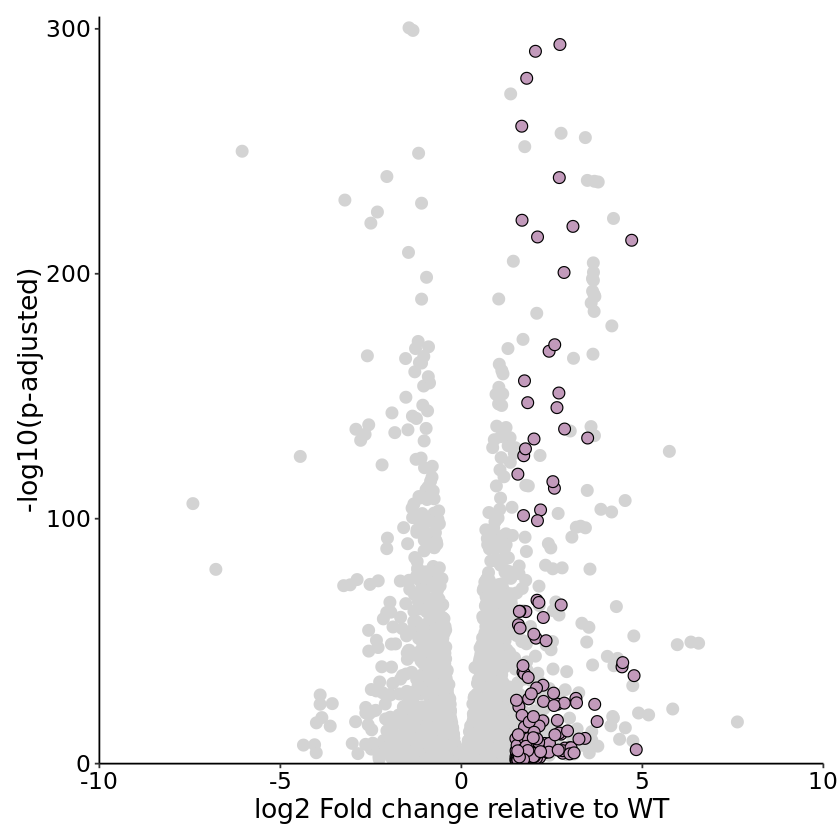

In [39]:
E545Kdiffgenesvolc <- MCF10A_WTvex9_res_df %>% filter(-log10(padj) < 350) %>%
    ggplot(aes(x = -log2FoldChange, y = -log10(padj), fill = as.factor(mycolor),
               color = as.factor(mycolor))) + 
    geom_point(shape = 21, size = 3) + 
#     geom_abline(slope = 1, intercept = 0, color = "red") +
    scale_fill_manual(values = c("#C29ABB", "lightgrey")) +
    scale_color_manual(values = c("black", "lightgrey")) +
    scale_y_continuous(expand = c(0, 0), limits = c(0,305)) +
    scale_x_continuous(limits = c(-10,10), expand = c(0, 0)) +
    ylab(label = "-log10(p-adjusted)") +
    xlab(label = "log2 Fold change relative to WT") +
    theme_classic() + theme(text = element_text(family = "Arial", color = "black"),
                          axis.title = element_text(size = 16),
                          axis.text = element_text(size = 14, colour = "black"),
                          plot.title = element_text(size = 20),
                          plot.subtitle = element_text(size = 14),
                          strip.text = element_text(size = 12),
                          legend.position = "none",
                          legend.text = element_text(size = 12),
                          legend.title = element_text(size = 14),
                          plot.margin = margin(10, 10, 10, 10))
E545Kdiffgenesvolc

Warning message:
“Removed 2 rows containing missing values (`geom_point()`).”


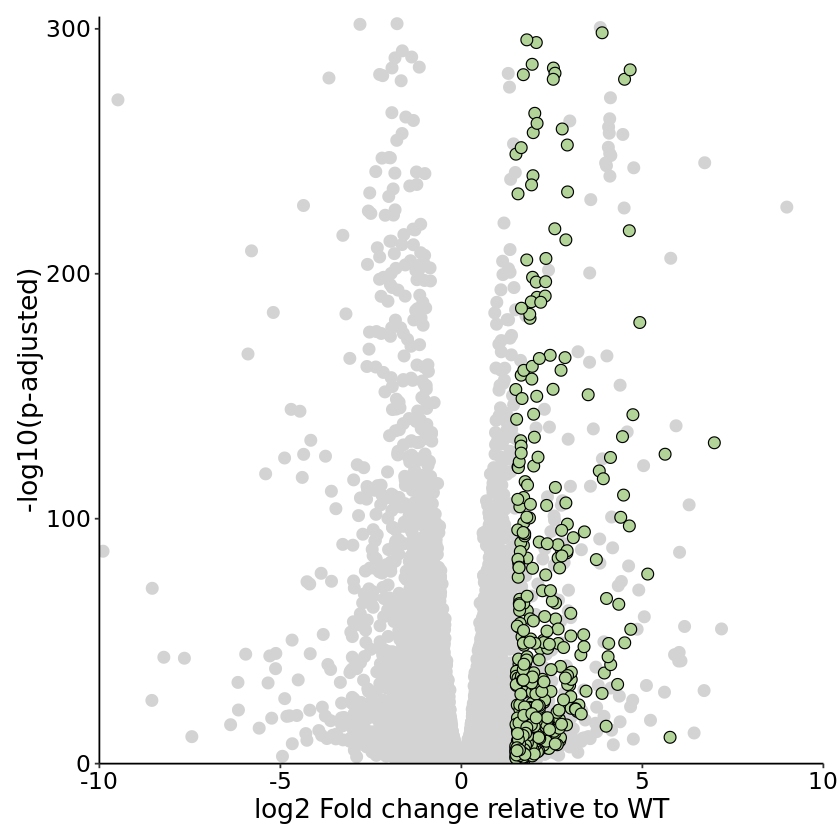

In [40]:
H1047Rdiffgenesvolc <- MCF10A_WTvex20_res_df %>% filter(-log10(padj) < 350) %>%
    ggplot(aes(x = -log2FoldChange, y = -log10(padj), fill = as.factor(mycolor),
               color = as.factor(mycolor))) + 
    geom_point(shape = 21, size = 3) + 
#     geom_abline(slope = 1, intercept = 0, color = "red") +
    scale_fill_manual(values = c("#B2D498", "lightgrey")) +
    scale_color_manual(values = c("black", "lightgrey")) +
    scale_y_continuous(expand = c(0, 0), limits = c(0,305)) +
    scale_x_continuous(limits = c(-10,10), expand = c(0, 0)) +
    ylab(label = "-log10(p-adjusted)") +
    xlab(label = "log2 Fold change relative to WT") +
    theme_classic() + theme(text = element_text(family = "Arial", color = "black"),
                          axis.title = element_text(size = 16),
                          axis.text = element_text(size = 14, colour = "black"),
                          plot.title = element_text(size = 20),
                          plot.subtitle = element_text(size = 14),
                          strip.text = element_text(size = 12),
                          legend.position = "none",
                          legend.text = element_text(size = 12),
                          legend.title = element_text(size = 14),
                          plot.margin = margin(10, 10, 10, 10))
H1047Rdiffgenesvolc

In [41]:
ggsave(filename="/data/park_lab/adam/figures/uniqueE545Ksprayalldots9-12.pdf", 
       plot = E545Kdiffgenesvolc, device = cairo_pdf, width = 8, height = 8)
ggsave(filename="/data/park_lab/adam/figures/uniqueH1047Rsprayalldots9-12.pdf", 
       plot = H1047Rdiffgenesvolc, device = cairo_pdf, width = 8, height = 8)

Warning message:
“Removed 2 rows containing missing values (`geom_point()`).”


# AREG Expression in Comparisons

In [30]:
cancer_WTvex9_res %>% as.data.frame() %>% rownames_to_column() %>%
        filter(rowname == "ENSG00000109321.11")

rowname,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ENSG00000109321.11,11435.7,-0.03873071,0.09442435,-0.4101771,0.681676,0.7563138


In [31]:
HTert_WTvex9_res %>% as.data.frame() %>% rownames_to_column() %>%
        filter(rowname == "ENSG00000109321.11")

rowname,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ENSG00000109321.11,7087.989,0.8411821,0.09431052,8.919282,4.693216e-19,3.112351e-18


In [33]:
MCF10A_WTvex9_res %>% as.data.frame() %>% rownames_to_column() %>%
        filter(rowname == "ENSG00000109321.11")

rowname,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ENSG00000109321.11,1367.352,-3.487591,0.1405413,-24.81542,6.111945e-136,1.164915e-133


In [29]:
MCF10A_ex9vex20_res %>% as.data.frame() %>% rownames_to_column() %>%
        filter(rowname == "ENSG00000109321.11")

rowname,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ENSG00000109321.11,1367.352,2.826147,0.1280448,22.07156,5.931605e-108,3.692891e-106


In [28]:
cancer_ex9vex20_res %>% as.data.frame() %>% rownames_to_column() %>%
        filter(rowname == "ENSG00000109321.11")

rowname,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ENSG00000109321.11,11435.7,-0.6198946,0.09426982,-6.575748,4.840913e-11,1.057819e-10


In [15]:
MCF10A_ex9vex20_res %>% as.data.frame() %>% rownames_to_column() %>%
        filter(rowname == "ENSG00000109321.11")

rowname,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ENSG00000109321.11,1367.352,2.826147,0.1280448,22.07156,5.931605e-108,3.692891e-106


character(0)

In [2]:
ls()

[1] "all_diff_genes"                           
  [2] "AREG_exp"                                 
  [3] "AREG_exp_raw"                             
  [4] "cancer_coldata"                           
  [5] "cancer_counts"                            
  [6] "cancer_dds"                               
  [7] "cancer_dds_f"                             
  [8] "cancer_diff_genes"                        
  [9] "cancer_ex9vex20_over"                     
 [10] "cancer_ex9vex20_res"                      
 [11] "cancer_ex9vex20_resSig_padj"              
 [12] "cancer_ex9vex20_under"                    
 [13] "cancer_filt"                              
 [14] "cancer_genotype"                          
 [15] "cancer_norm_sigset"                       
 [16] "cancer_normalized_counts_f"               
 [17] "cancer_normalized_counts_f_nonames"       
 [18] "cancer_rlog"                              
 [19] "cancer_sampleDistMatrix"                  
 [20] "cancer_samples"                           
 [21] "cancer_vst"                               
 [22] "cancer_WTvex20_over"                      
 [23] "cancer_WTvex20_res"                       
 [24] "cancer_WTvex20_resSig_padj"               
 [25] "cancer_WTvex20_under"                     
 [26] "cancer_WTvex9_over"                       
 [27] "cancer_WTvex9_over_clean"                 
 [28] "cancer_WTvex9_over_symbols"               
 [29] "cancer_WTvex9_res"                        
 [30] "cancer_WTvex9_resSig_padj"                
 [31] "cancer_WTvex9_under"                      
 [32] "cancer_WTvex9_under_clean"                
 [33] "cancer_WTvex9_under_symbols"              
 [34] "cancerDists"                              
 [35] "cluster_df"                               
 [36] "cluster3"                                 
 [37] "cluster3_genes"                           
 [38] "cluster3_genes_clean"                     
 [39] "cluster3_GOBP"                            
 [40] "cluster9"                                 
 [41] "cluster9_genes"                           
 [42] "cluster9_genes_clean"                     
 [43] "cluster9_GOBP"                            
 [44] "clusters"                                 
 [45] "datares_HC"                               
 [46] "dds_LRT"                                  
 [47] "diff_ex9vex20"                            
 [48] "diff_ex9vex20_sig"                        
 [49] "diff_WTvex20"                             
 [50] "diff_WTvex20_sig"                         
 [51] "diff_WTvex9"                              
 [52] "diff_WTvex9_sig"                          
 [53] "E545K_expressed_E545K_interacting_overlap"
 [54] "E545K_expressed_interacting_overlap"      
 [55] "E545K_expressed_WT_interacting_overlap"   
 [56] "ens.str_ex9vex20"                         
 [57] "ens.str_WTvex20"                          
 [58] "ens.str_WTvex9"                           
 [59] "ETV5_exp"                                 
 [60] "ex9vex20_combined"                        
 [61] "ex9vex20_combined_GOBP"                   
 [62] "ex9vex20_combined_GOBP_nocan"             
 [63] "ex9vex20_combined_nocan"                  
 [64] "ex9vex20_genes_log2fc_1.5"                
 [65] "ex9vex20_genes_log2fc_1.5_entrez"         
 [66] "ex9vex20_genes_log2fc_1.5_entrez_df"      
 [67] "ex9vex20_genes_padj"                      
 [68] "ex9vex20_genes_padj_entrez"               
 [69] "ex9vex20_GOBP"                            
 [70] "ex9vex20_GOMF"                            
 [71] "ex9vex20_KEGG"                            
 [72] "ex9vex20_over_clean"                      
 [73] "ex9vex20_over_clean_nocan"                
 [74] "ex9vex20_over_common"                     
 [75] "ex9vex20_over_common_GOBP"                
 [76] "ex9vex20_over_common_GOBP_nocan"          
 [77] "ex9vex20_over_common_GOMF"                
 [78] "ex9vex20_over_nocan"                      
 [79] "ex9vex20_res"                             
 [80] "ex9vex20_res_df"                          
 [

In [9]:
grep(x = MCF10A_ex9vex20_resSig_padj, 
     pattern = "ENSG00000118689", value = TRUE)
grep(x = MCF10A_WTvex20_resSig_padj, 
     pattern = "ENSG00000118689", value = TRUE)
grep(x = MCF10A_WTvex9_resSig_padj, 
     pattern = "ENSG00000118689", value = TRUE)

named character(0)

named character(0)

named character(0)

In [10]:
grep(x = HTert_ex9vex20_resSig_padj, 
     pattern = "ENSG00000118689", value = TRUE)
grep(x = HTert_WTvex20_resSig_padj, 
     pattern = "ENSG00000118689", value = TRUE)
grep(x = HTert_WTvex9_resSig_padj, 
     pattern = "ENSG00000118689", value = TRUE)

named character(0)

named character(0)

named character(0)

In [12]:
grep(x = cancer_ex9vex20_resSig_padj, 
     pattern = "ENSG00000118689", value = TRUE)
grep(x = cancer_WTvex20_resSig_padj, 
     pattern = "ENSG00000118689", value = TRUE)
grep(x = cancer_WTvex9_resSig_padj, 
     pattern = "ENSG00000118689", value = TRUE)

named character(0)

named character(0)

named character(0)

# CRISPR Hit Plot for MCF10A

In [43]:
library("tidyverse")
library("org.Hs.eg.db")
library("ggrepel")
library("DESeq2")
setwd("/data/park_lab/adam/Total_RNA")
load("Total_RNA_env.RData")
ls()

Warning message:
“namespace ‘clusterProfiler’ is not available and has been replaced
by .GlobalEnv when processing object ‘.GOTERM_Env’”


[1] "all_diff_genes"                           
  [2] "AREG_exp"                                 
  [3] "AREG_exp_raw"                             
  [4] "cancer_coldata"                           
  [5] "cancer_counts"                            
  [6] "cancer_dds"                               
  [7] "cancer_dds_f"                             
  [8] "cancer_diff_genes"                        
  [9] "cancer_ex9vex20_over"                     
 [10] "cancer_ex9vex20_res"                      
 [11] "cancer_ex9vex20_resSig_padj"              
 [12] "cancer_ex9vex20_under"                    
 [13] "cancer_filt"                              
 [14] "cancer_genotype"                          
 [15] "cancer_norm_sigset"                       
 [16] "cancer_normalized_counts_f"               
 [17] "cancer_normalized_counts_f_nonames"       
 [18] "cancer_rlog"                              
 [19] "cancer_sampleDistMatrix"                  
 [20] "cancer_samples"                           
 [21] "cancer_vst"                               
 [22] "cancer_WTvex20_over"                      
 [23] "cancer_WTvex20_res"                       
 [24] "cancer_WTvex20_resSig_padj"               
 [25] "cancer_WTvex20_under"                     
 [26] "cancer_WTvex9_over"                       
 [27] "cancer_WTvex9_over_clean"                 
 [28] "cancer_WTvex9_over_symbols"               
 [29] "cancer_WTvex9_res"                        
 [30] "cancer_WTvex9_resSig_padj"                
 [31] "cancer_WTvex9_under"                      
 [32] "cancer_WTvex9_under_clean"                
 [33] "cancer_WTvex9_under_symbols"              
 [34] "cancerDists"                              
 [35] "cluster_df"                               
 [36] "cluster3"                                 
 [37] "cluster3_genes"                           
 [38] "cluster3_genes_clean"                     
 [39] "cluster3_GOBP"                            
 [40] "cluster9"                                 
 [41] "cluster9_genes"                           
 [42] "cluster9_genes_clean"                     
 [43] "cluster9_GOBP"                            
 [44] "clusters"                                 
 [45] "datares_HC"                               
 [46] "dds_LRT"                                  
 [47] "diff_ex9vex20"                            
 [48] "diff_ex9vex20_sig"                        
 [49] "diff_WTvex20"                             
 [50] "diff_WTvex20_sig"                         
 [51] "diff_WTvex9"                              
 [52] "diff_WTvex9_sig"                          
 [53] "E545K_expressed_E545K_interacting_overlap"
 [54] "E545K_expressed_interacting_overlap"      
 [55] "E545K_expressed_WT_interacting_overlap"   
 [56] "E545K_goi"                                
 [57] "E545K_unite_genelist"                     
 [58] "E545Kdiffgenesvolc"                       
 [59] "ens.str"                                  
 [60] "ens.str_ex9vex20"                         
 [61] "ens.str_WTvex20"                          
 [62] "ens.str_WTvex9"                           
 [63] "ETV5_exp"                                 
 [64] "ex9vex20_combined"                        
 [65] "ex9vex20_combined_GOBP"                   
 [66] "ex9vex20_combined_GOBP_nocan"             
 [67] "ex9vex20_combined_nocan"                  
 [68] "ex9vex20_genes_log2fc_1.5"                
 [69] "ex9vex20_genes_log2fc_1.5_entrez"         
 [70] "ex9vex20_genes_log2fc_1.5_entrez_df"      
 [71] "ex9vex20_genes_padj"                      
 [72] "ex9vex20_genes_padj_entrez"               
 [73] "ex9vex20_GOBP"                            
 [74] "ex9vex20_GOMF"                            
 [75] "ex9vex20_KEGG"                            
 [76] "ex9vex20_over_clean"                      
 [77] "ex9vex20_over_clean_nocan"                
 [78] "ex9vex20_over_common"                     
 [79] "ex9vex20_over_common_GOBP"                
 [80] "ex9vex20_over_common_GOBP_nocan"          
 [

In [44]:
MCF10A_dds <- DESeq(MCF10A_dds)

estimating size factors

estimating dispersions

gene-wise dispersion estimates

mean-dispersion relationship

final dispersion estimates

fitting model and testing



In [45]:
MCF10A_normalized_counts <- counts(MCF10A_dds, normalized=TRUE) %>% as.data.frame()
MCF10A_normalized_counts

,MCF10A_E545K_rep1,MCF10A_E545K_rep2,MCF10A_E545K_rep3,MCF10A_parental_rep1,MCF10A_parental_rep2,MCF10A_parental_rep3,MCF10A_H1047R_rep1,MCF10A_H1047R_rep2,MCF10A_H1047R_rep3
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ENSG00000223972.5,2.506292,3.305122,0.000000,1.326588,0.000000,0.000000,2.0653848,0.3088647,1.0198098
ENSG00000227232.5,149.124398,178.476599,159.888504,195.008508,190.542727,181.615826,246.2971382,349.9437281,391.2670223
ENSG00000278267.1,36.341240,56.187077,42.636934,41.124243,60.369973,37.836630,51.1182740,51.8892730,69.6870022
ENSG00000243485.5,5.012585,0.000000,0.000000,0.000000,0.000000,0.000000,3.0980772,0.0000000,2.0396196
ENSG00000284332.1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0000000,0.0000000,0.0000000
ENSG00000237613.2,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0000000,0.0000000,0.0000000
ENSG00000268020.3,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0000000,0.0000000,0.0000000
ENSG00000240361.2,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0000000,0.0000000,0.0000000
ENSG00000186092.6,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0000000,0.0000000,0.0000000


In [50]:
MCF10A_normalized_counts$geneid <- rownames(MCF10A_normalized_counts) %>% 
    tools::file_path_sans_ext()
MCF10A_normalized_counts

,MCF10A_E545K_rep1,MCF10A_E545K_rep2,MCF10A_E545K_rep3,MCF10A_parental_rep1,MCF10A_parental_rep2,MCF10A_parental_rep3,MCF10A_H1047R_rep1,MCF10A_H1047R_rep2,MCF10A_H1047R_rep3,geneid
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
ENSG00000223972.5,2.506292,3.305122,0.000000,1.326588,0.000000,0.000000,2.0653848,0.3088647,1.0198098,ENSG00000223972
ENSG00000227232.5,149.124398,178.476599,159.888504,195.008508,190.542727,181.615826,246.2971382,349.9437281,391.2670223,ENSG00000227232
ENSG00000278267.1,36.341240,56.187077,42.636934,41.124243,60.369973,37.836630,51.1182740,51.8892730,69.6870022,ENSG00000278267
ENSG00000243485.5,5.012585,0.000000,0.000000,0.000000,0.000000,0.000000,3.0980772,0.0000000,2.0396196,ENSG00000243485
ENSG00000284332.1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0000000,0.0000000,0.0000000,ENSG00000284332
ENSG00000237613.2,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0000000,0.0000000,0.0000000,ENSG00000237613
ENSG00000268020.3,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0000000,0.0000000,0.0000000,ENSG00000268020
ENSG00000240361.2,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0000000,0.0000000,0.0000000,ENSG00000240361
ENSG00000186092.6,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0000000,0.0000000,0.0000000,ENSG00000186092


In [55]:
MCF10A_normalized_counts %>% filter(geneid == "ENSG00000154930")

,MCF10A_E545K_rep1,MCF10A_E545K_rep2,MCF10A_E545K_rep3,MCF10A_parental_rep1,MCF10A_parental_rep2,MCF10A_parental_rep3,MCF10A_H1047R_rep1,MCF10A_H1047R_rep2,MCF10A_H1047R_rep3,geneid
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
ENSG00000154930.15,85.21394,74.36525,65.73194,55.71672,18.86562,62.43044,422.8875,1001.648,742.7615,ENSG00000154930
